In [1]:
import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
from astropy.time import Time
import astropy.units as u
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions

from importlib import reload

%matplotlib inline

In [2]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_seconds = 86400

## Looking for ETVs in TIC 121121622 / KIC 4247791 (non-TESS portion, Kepler and possibly archival data)

- A known doubly-eclipsing  2+2 (EA+EA) candidate.
- https://keplerebs.villanova.edu/overview/?k=4247791 has the values of both sets of eclipses
- See if there is any long-term ETV on pair A (period ~4.10 d ), based on epoch/period from Kepler
- see also: the parameter from the 2012 paper about the SB4 nature
  - https://www.aanda.org/articles/aa/full_html/2012/05/aa18298-11/T1.html
- OPEN: archival data. Pair A eclipses recoverable from: 
  - ASAS-SN:  http://asas-sn.ifa.hawaii.edu/skypatrol/objects/34360972624
  - SuperWASP:  https://wasp.cerit-sc.cz/search?ra=287.16483&dec=39.37694&radius=1&radiusUnit=min&limit=10


In [3]:
# define the plotting parameters

figsize = (8,4)

In [26]:
# import the data

# choose a TIC ID to analyze (we analyze non TESS portion heree0
ticid = 121121622
kicid = 4247791

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_kic{kicid}_A_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_kic{kicid}_A_etv_secondary.csv"


# import data using Lightkurve
# sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')
if not "../.." in sys.path:
    sys.path.append("../..")
import lightkurve_ext as lke  # at ../../


sr = lk.search_lightcurve(f"KIC {kicid}")
# only a few quarters has 1 min cadence data, so we use 30min for unifromity
sr = lke.filter_by_priority(sr, author_priority=['Kepker'], exptime_priority=['long',])
sr = lke._sort_chronologically(sr)  # workaround lightkurve v2.4.2+ change in sort order
with astropy.conf.set_temp("max_lines", -1):
    display(sr)
lcc_kepler = sr.download_all()

def use_sap_flux(lc):
    """Helper over select_flux("sap_flux") to ensure flux_err is populated for QLP case"""
    if lc.meta.get("AUTHOR") == "QLP":
        # select_flux("sap_flux") on QLP data will lead to nan flux_err
        # because QLP lc only has err on kspsap_flux / det_flux
        return lc
    else:
        return lc.select_flux("sap_flux")
lc_kepler = lcc_kepler.stitch(
    # corrector_func=lambda lc: use_sap_flux(lc).normalize()
)
lc_kepler.time.format = "jd"  # changed time from BKJD to BJD, in case I want to accomodate other archival data (ASAS-SN, etc.)


search_result = lc_kepler

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,Kepler Quarter 00,2009,Kepler,1800,kplr004247791,0.0,EX
1,Kepler Quarter 01,2009,Kepler,1800,kplr004247791,0.0,EX
2,Kepler Quarter 02,2009,Kepler,1800,kplr004247791,0.0,EX
3,Kepler Quarter 03,2009,Kepler,1800,kplr004247791,0.0,EX
4,Kepler Quarter 04,2010,Kepler,1800,kplr004247791,0.0,EX
5,Kepler Quarter 05,2010,Kepler,1800,kplr004247791,0.0,EX
6,Kepler Quarter 06,2010,Kepler,1800,kplr004247791,0.0,EX
7,Kepler Quarter 07,2010,Kepler,1800,kplr004247791,0.0,EX
8,Kepler Quarter 08,2011,Kepler,1800,kplr004247791,0.0,EX


65504

97.64800177084544


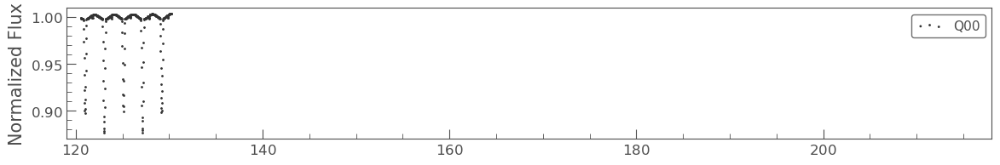

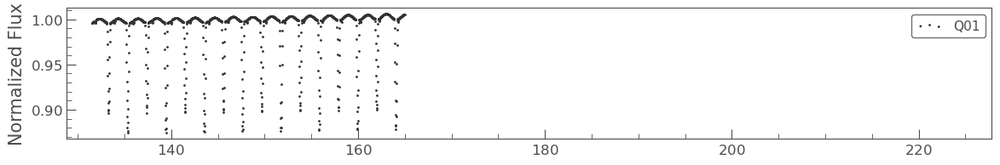

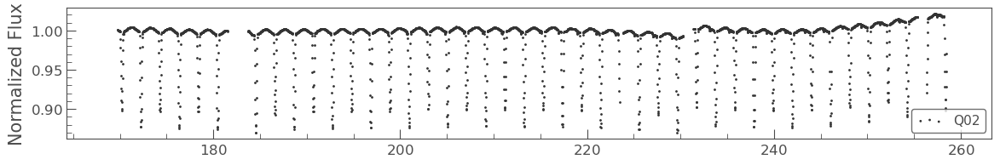

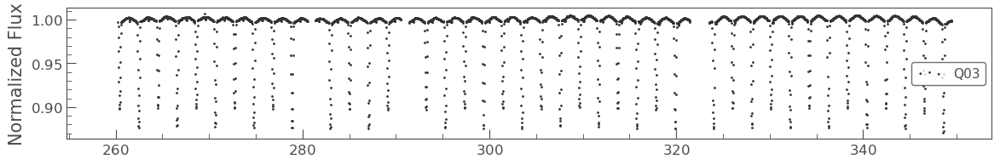

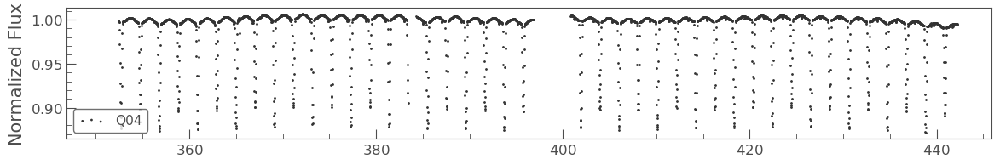

...

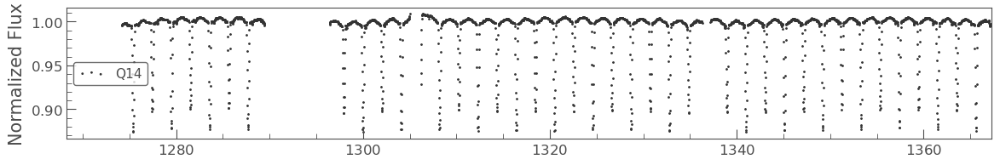

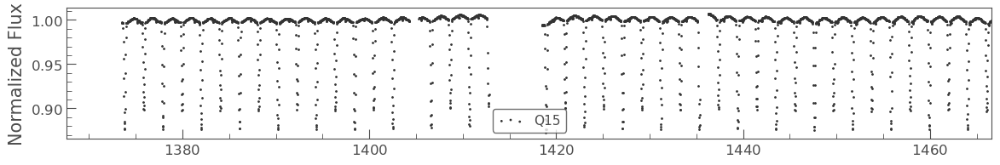

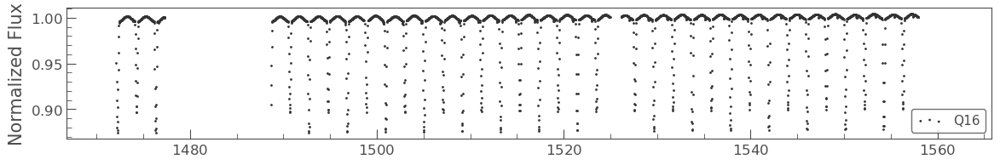

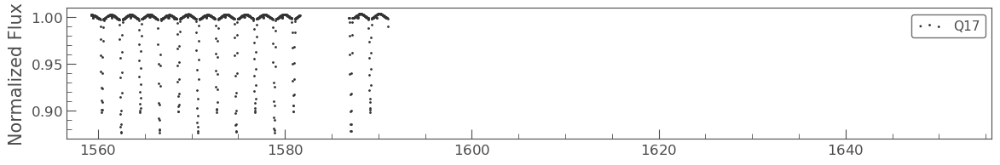

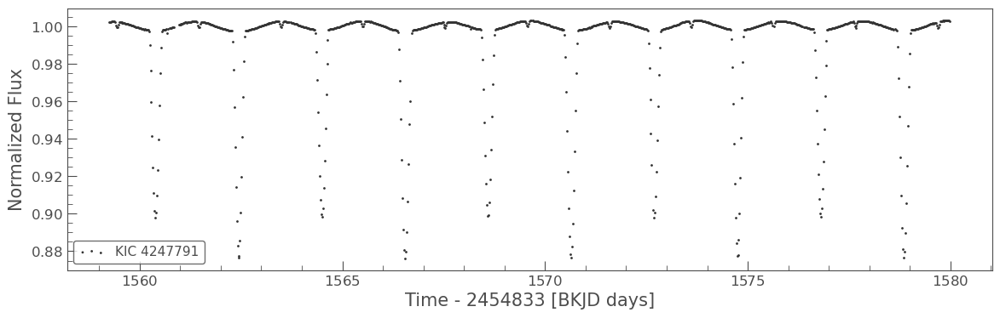

In [24]:
# visualize them , to ensure no eclipses overlap
import tic_plot as tplt
print(np.max([lc.time[-1].value - lc.time[0].value for lc in lcc_kepler]))
for lc in lcc_kepler[:]:
    ax = tplt.scatter(lc.normalize(), figsize=(14, 2), label=f"Q{lc.quarter:02d}");
    ax.set_xlabel(None);
    ax.set_xlim(ax.get_xlim()[0] - 1, ax.get_xlim()[0] + 98);  # for consistent x scale

# zoom-in to 
tplt.scatter(lcc_kepler[-1].normalize().truncate(1559, 1580), figsize=(14, 4));

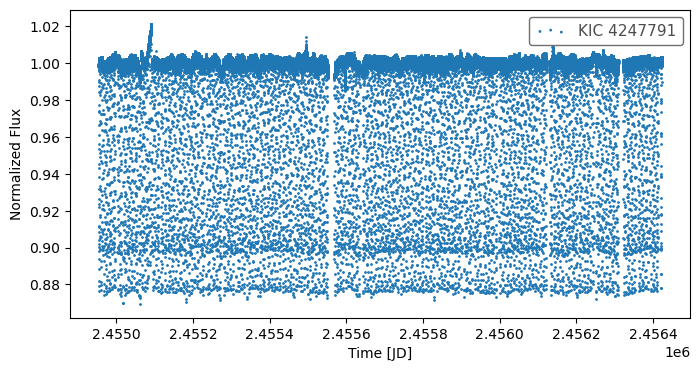

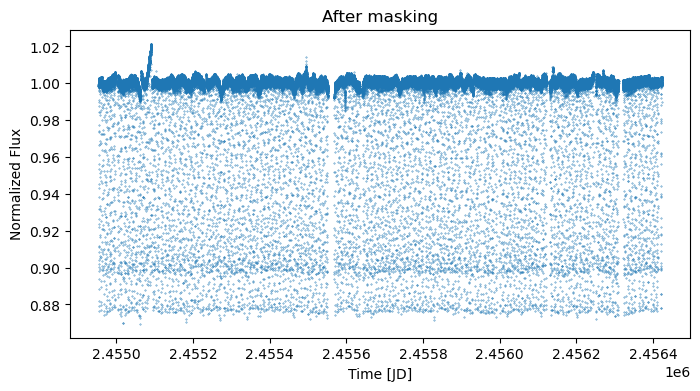

In [27]:
%matplotlib inline
# %matplotlib widget

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

mask = time < 0  #( time > 54950) & (time < 54963)  #  truncate weird spikes at the beginning of Kepler data
# mask = flux < 0.85    # remove occasional outliers
# mask = (
#     ( flux < 0.95 ) | # remove occasional lone outliers
#     # cadences where scattered light effect is prevalent
#     ( (time > 2718)   & (time < 2744) )
# )

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})

ax2 = plt.figure(figsize=figsize).gca()
ax2.scatter(data.time, data.flux, s=0.1);
ax2.set_ylabel(ax.get_ylabel())
ax2.set_xlabel(ax.get_xlabel())
ax2.set_title("After masking");

In [ ]:
do_bls = False

if do_bls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg_runner as lke_pg_runner  # at ../../

    bls_result = lke_pg_runner.run_bls(
        search_result.remove_nans(),
        pg_kwargs=dict(
            minimum_period=1, maximum_period=20,
            frequency_factor=1,
            duration=[3.4957 / 24 * f for f in [0.975, 1, 1.025, 1.05, 1.1, 1.15,]],  # based on observed primary eclipse duration for better fit
        ),
    )
    !$NOTIFY_CMD  "BLS Done"

In [ ]:
do_ls = False

if do_ls:
    if not "../.." in sys.path:
        sys.path.append("../..")
    import lightkurve_ext_pg as lke_pg  # at ../../

    lc = lk.LightCurve(time=Time(time, format="btjd"), flux=flux, flux_err=fluxerr)
    lc.meta["LABEL"] = f"TIC {ticid}"
    pg = lc.to_periodogram(method="lombscargle",
                           # maximum_period=10,
                           # minimum_period=0.4,
                           # ls_method="fastchi2", nterms=2,
                           # oversample_factor=50,  # default: 5
                          )

    pg.show_properties();
    print(pg.period_at_max_power);

    ax = lke_pg.plot_pg_n_mark_max(pg, max_period_factor=10);

    ax = pg.plot(view="frequency");  # frequency view
    ax.set_xlim(pg.frequency_at_max_power.value / 100 , pg.frequency_at_max_power.value * 10);

    ax = pg.plot(view="frequency", unit=u.microhertz, scale="log");

    axs, lcs = lke_pg.plot_lc_with_model(
        lc,
        pg,
        plot_lc=False, plot_model=False, plot_folded_model=True,
        also_return_lcs=True);


In [ ]:
# Visaully compare different candidate period

# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418132651611877).truncate(-0.1, 0.1).scatter(label="BLS period, frequency_factor=10");  # HWHM 0.001571020094789155
# ax = search_result.normalize().fold(epoch_time=1471.4196, period=8.418147).truncate(-0.1, 0.1).scatter(label="s0001-s0009:TCE1");

### Define epoch, period, duration

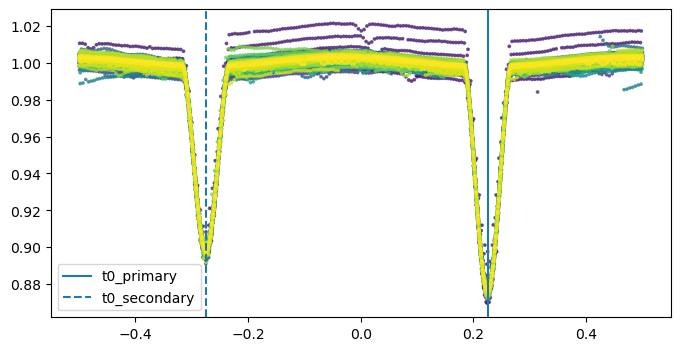

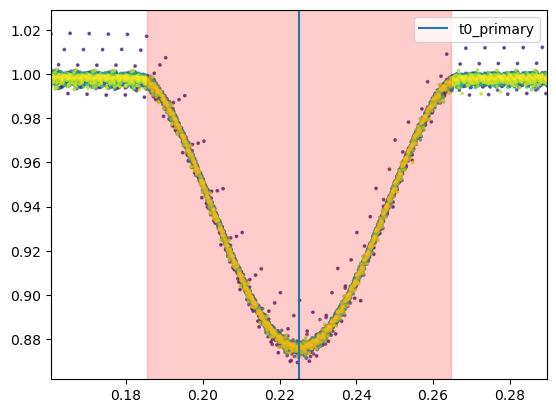

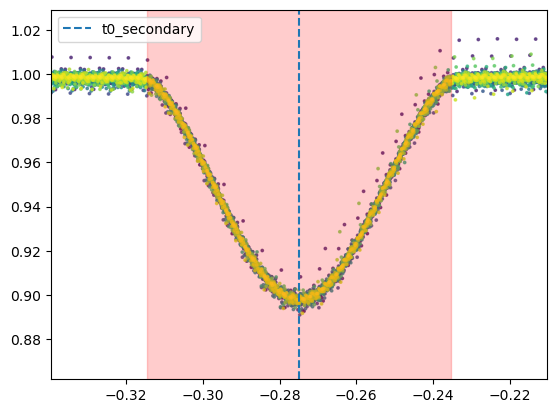

In [29]:
%matplotlib inline
# %matplotlib widget

# define the orbital period and the t0

# Kepler EB values
# dict(epoch=Time(54956.035723 + 2400000, format="jd", scale="tdb").to_value("btjd"), duration_hr=0.0663 * 4.1 * 24, period=4.1008708, label="EB A",

# FILL-IN THE eclipse epoch / period,
period = 4.1008708

t0_primary = Time(54956.035723 + 2400000, format="jd", scale="tdb").to_value("jd")  # use BJD for the rest 
t0_secondary = t0_primary + period * 0.5

duration_hr_primary =  7.8  # manual fit rather than Kepler EBs data: period * 0.0663 * 24
duration_hr_secondary = 7.8  # manual fit rather than Kepler EBs data: period * 0.0679 * 24

# convert epoch from BTJD to commonly mjd used here
# t0_primary = Time(t0_primary, format="btjd").to_value("mjd")
# t0_secondary = Time(t0_secondary, format="btjd").to_value("mjd")

# Move t0 to the first dip in the data (some of the subsequent codes, espically fit_each_eclipse(), assumes that)
t0_primary = t0_primary - int((t0_primary - data['time'][0]) / period) * period
if t0_secondary is not None:
    t0_secondary = t0_secondary - int((t0_secondary - data['time'][0]) / period) * period

t0_for_plotting = 0  # keep 0 for plotting purposes
if t0_secondary is not None:
    t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.45  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

if t0_secondary is not None:
    plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    # plt.ylim(0.975, 1.005);
    plt.show()

### Compare folded plots across sectors

In [ ]:
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(lcc_tess), figsize=(4 * len(lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period, epoch_time=t0_primary)
        lc_f = lc_f.truncate(-duration_hr_primary * 2 / 24, duration_hr_primary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0:
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around primary eclipses");
plt.tight_layout();

# ---
with plt.style.context(lk.MPLSTYLE):
    fig, axs = plt.subplots(1, len(lcc_tess), figsize=(4 * len(lcc_tess), 3), sharey=True);
    if isinstance(axs, plt.Axes):
        axs = [axs]
    for i, lc in enumerate(lcc_tess):
        lc_f = lc.select_flux("flux").normalize(unit="percent").fold(period=period, epoch_time=t0_secondary)
        lc_f = lc_f.truncate(-duration_hr_secondary * 2 / 24, duration_hr_secondary * 2 / 24)
        ax = lc_f.scatter(ax=axs[i], s=1, label=f"S.{lc_f.sector}");
        ax.legend(loc="lower right");
        if i > 0:
            ax.set_ylabel(None)
            ax.set_xlabel(None)
    fig.suptitle(f"{lc.label}, folded around secondary eclipses");
plt.tight_layout();

### Detrend (optional)

- detrended flux is in `flux_detrended`, and won't be used in subsequent work by default

In [ ]:
data["flux_original"] = data.flux  # save the original flux 

In [ ]:
# show data to visualize what's changed in each step below
data

In [ ]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

In [ ]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

In [ ]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
if t0_secondary is not None:
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
# plt.ylim(0.535, 0.55)
# plt.xlim(-0.5, 0.1)
plt.show();

plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
t1_p, t4_p = etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] - 0.5 * duration_hr_primary / 24/ period, etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0] + 0.5 * duration_hr_primary / 24/ period 
plt.xlim(t1_p - 0.025, t4_p + 0.025);
plt.axvspan(t1_p, t4_p, color="red", alpha=0.2);plt.legend();
# plt.ylim(0.75, 0.85);
plt.show()

if t0_secondary is not None:
    plt.scatter(phase,data['flux_detrended'], s = 3, alpha = 0.7, c = data['time'])
    plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
    t1_s, t4_s = etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] - 0.5 * duration_hr_secondary / 24/ period, etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0] + 0.5 * duration_hr_secondary / 24/ period 
    plt.xlim(t1_s - 0.025, t4_s + 0.025);
    plt.axvspan(t1_s, t4_s, color="red", alpha=0.2);plt.legend();
    plt.legend();
    # plt.ylim(0.975, 1.005);
    plt.show()

In [ ]:
# # Uncomment to use the detrended flux
# #
# print("Use deterended flux")
# data.flux = data.flux_detrended

### Now that the data is ready we can start 

- generally the clipped LC window is ***smaller*** than the eclipse duration, to avoid the complication of fitting ingress/egress.

In [31]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
# midpoint_p -= 0.004  # the offset is added back to t0_primary (& secondary above
print('Primary:  ', t0_primary, midpoint_p)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width_p = 0.8 * duration_hr_primary / 24 / period   # it seems to be difficult to bit model the flat bottom and the curves outside, focus on the overall shape for now
# use a shoter duration to avoid fitting the out-of-eclipse LC, which has its own variability that the model is not equipped to hanlde
# window_width_p = 0.095
print("window_width_p (phase):", window_width_p)

data_primary = data[(data['phase'] > midpoint_p - window_width_p / 2) & (data['phase'] < midpoint_p + window_width_p / 2) ]
ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)


if t0_secondary is not None:
    midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]
    print('Secondary:', t0_secondary, midpoint_s)

    # the coshgauss model seems problematic, try to use a larger width to give it more shape to fit
    window_width_s = 0.8 * duration_hr_secondary / 24 / period
    # window_width_s = 0.22
    print("window_width_s (phase):", window_width_s)

    data_secondary = data[(data['phase'] > midpoint_s - window_width_s / 2) & (data['phase'] < midpoint_s + window_width_s / 2) ]
    ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V)
# t0 in normalixed phase
start_vals = [1.0, -0.125, midpoint_p, 0.021, 0.95]
start_vals_s = [1.0, -0.103, midpoint_s, 0.021, 0.9]

# -- -- -- -- -- -- -- -- --
# etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess_interactive(data_primary, ph_binned, flux_binned, err_binned, "midpoint_p", *start_vals)
if t0_secondary is not None:
    # etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)
    etv_functions.plot_initial_guess_interactive(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, "midpoint_s", *start_vals_s)

print("Start params for  fitting period with MCMC on df_primary:")
print(f"[{start_vals[0]}, {start_vals[1]}, {t0_primary}, {start_vals[3]}, {start_vals[4]}, {period}],");

Primary:   2454956.035723 0.22500000002825704
window_width_p (phase): 0.06340116835673049
Secondary: 2454953.9852875997 -0.2749999999966858
window_width_s (phase): 0.06340116835673049


Output(layout=Layout(padding='1em 0px'), outputs=({'output_type': 'display_data', 'data': {'text/plain': '<Fig…

Output(layout=Layout(padding='1em'), outputs=({'name': 'stdout', 'text': '[1.0, -0.125, midpoint_p, 0.021, 0.9…

Output(layout=Layout(padding='1em 0px'), outputs=({'output_type': 'display_data', 'data': {'text/plain': '<Fig…

Output(layout=Layout(padding='1em'), outputs=({'name': 'stdout', 'text': '[1.0, -0.103, midpoint_s, 0.021, 0.9…

Start params for  fitting period with MCMC on df_primary:
[1.0, -0.125, 2454956.035723, 0.021, 0.95, 4.1008708],


In [ ]:
if False:
    # Export the data around primary eclipses, for period analysis outside of notebook
    data_primary[["time", "flux", "err"]].to_csv(f"tmp/data_primary_{ticid}.csv", index=False)

In [ ]:
# use MCMC to refine the period

use_mcmc_to_fit_period = False


if use_mcmc_to_fit_period:
    import etv_functions_with_period as etvp

    etv_functions.enable_info_log_for_jupyter()

    # MCMC result
    mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p, fit_params_p_stats = etvp.run_mcmc_initial_fit_p(
        data_primary[:],
        # [0.97, -0.46, t0_primary, 0.030, 1.0, period],  # replace with the initial guess above
        nruns=20, discard=1, # for a sanity test,  to ensure the initial guess is not way off.
        # nruns=2000, discard=600,
        autocorr_time_kwargs=dict(tol=20),  # the emcee defaults tol=50 seems to be too strict for our use case, tol of ~10 - 20 seems to be sufficient
        pool=-2,
        plot_chains=True,
        plot_autocorrelation=True,
        plot=True,
        also_return_stats=True,
    )
    print("mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0_time, mean_d, mean_Tau, mean_p]]))
    print("std_p:", fit_params_p_stats["std_p"], "; std_t0:", fit_params_p_stats['std_t0'])
    !$NOTIFY_CMD "Fitting period done."

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 3000/3000 [03:21<00:00, 14.90it/s]


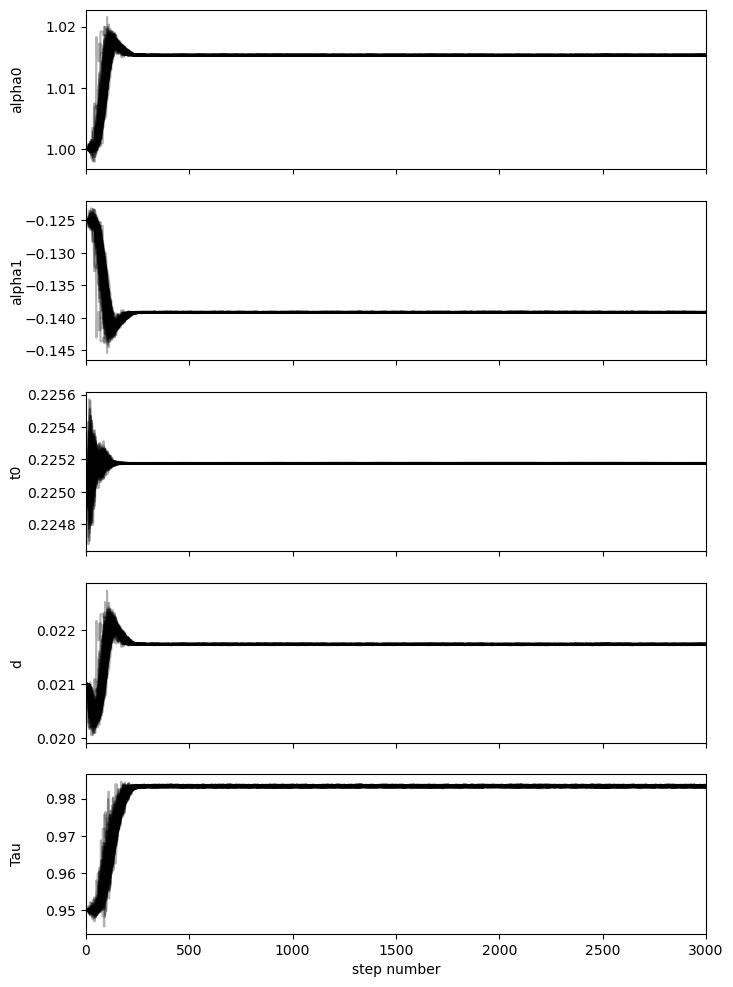

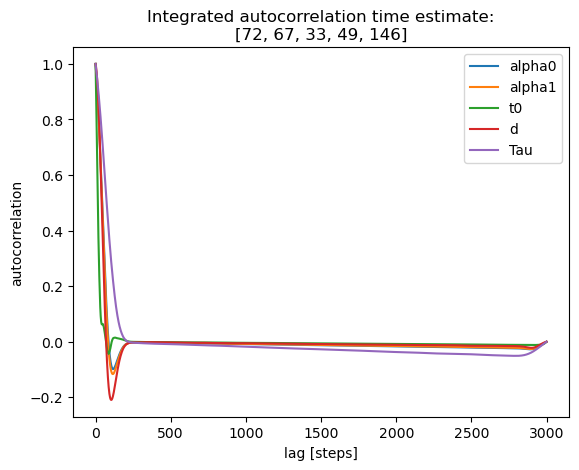

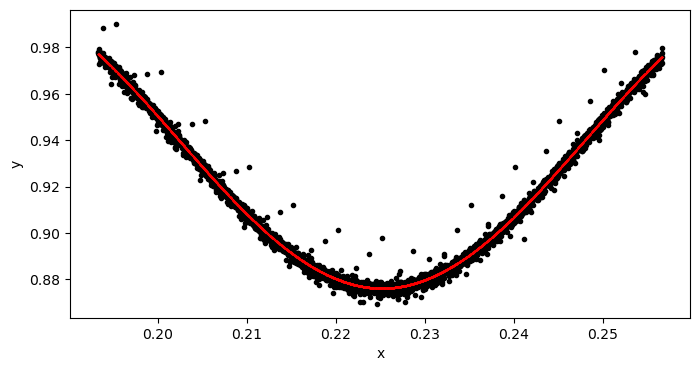

emcee parallel enabled, use 4 CPUs.


100%|██████████████████████████████████████████████████████████| 3000/3000 [03:16<00:00, 15.29it/s]
The chain is shorter than 20 times the integrated autocorrelation time for 1 parameter(s). Use this estimate with caution and run a longer chain!
N/20 = 150;
tau: [ 97.28587077  87.64920482  28.47215739  36.03099059 161.76667068]


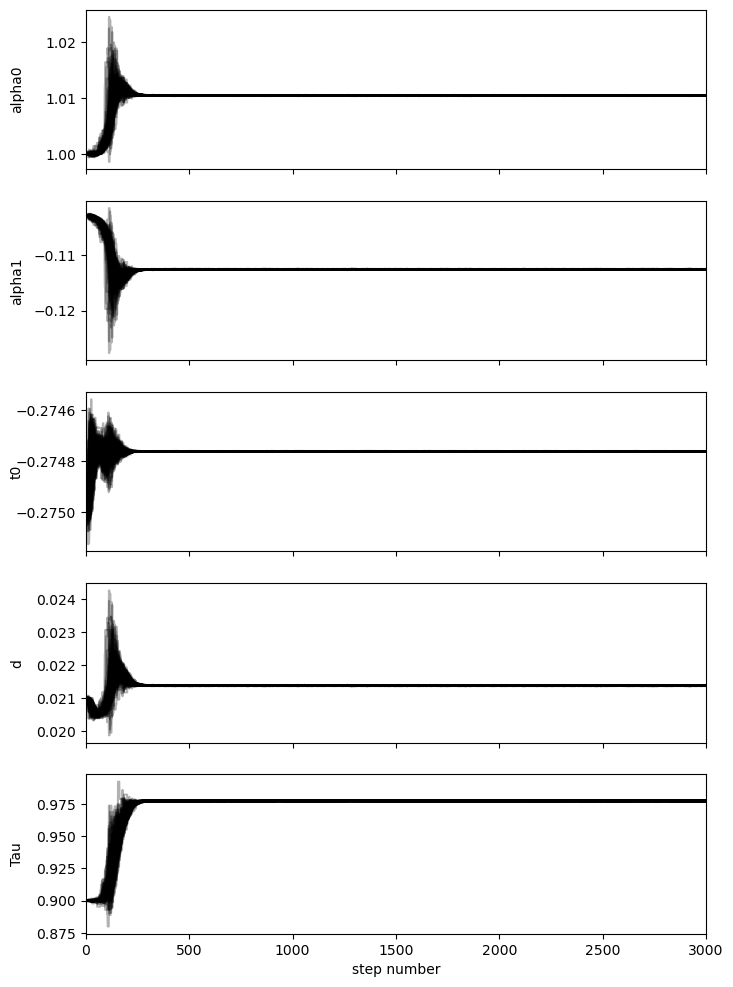

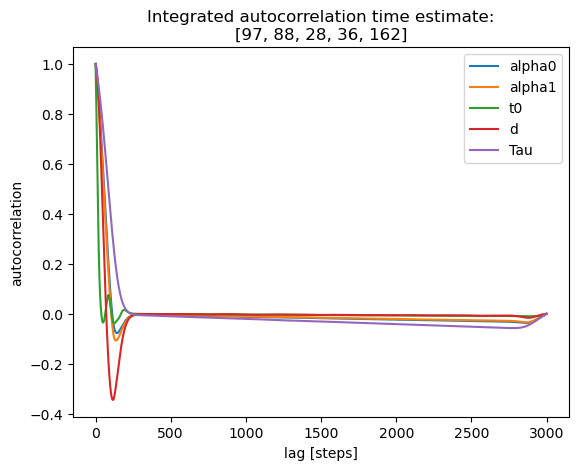

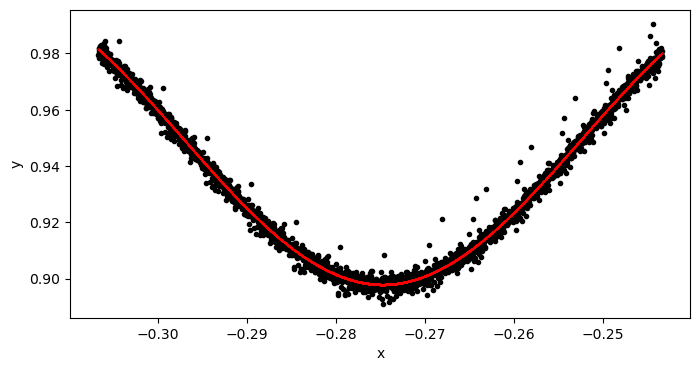

In [32]:
# run the initial model fit using MCMC for the primary and secondary eclipses
run_init_fit = True

if run_init_fit:
    etv_functions.enable_info_log_for_jupyter()
    
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, fit_params_stats = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns=3000, discard=600, autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    if t0_secondary is not None:
        mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, fit_params_s_stats = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns=3000, discard=600, autocorr_time_kwargs=dict(tol=20), pool=-2, plot_chains=True,  plot_autocorrelation=True, plot=True, also_return_stats=True)
    !$NOTIFY_CMD "Initial fit done"

In [ ]:
if not run_init_fit:  # case init fit has been previously saved and to be reussed
    print("Use pre-defined inital model params:")
    # initial fit params from Kepler data
    mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0153426816937374, -0.13916813407386314, 0.22517743237088886, 0.02174084657339015, 0.9833676432761791
    mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0104790602938793, -0.11261474738251852, -0.27476132308847456, 0.021377684701485634, 0.9772457843463187


    etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *[mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau])
    etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *[mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s])

In [33]:
print("Initial model params:")  # For information, and they can be copied to the cell above for future reuse

print("mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = " + ", ".join([str(v) for v in [mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau]]))
if t0_secondary is not None:
    print("mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = " + ", ".join([str(v) for v in [mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s]]))

Initial model params:
mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = 1.0153426816937374, -0.13916813407386314, 0.22517743237088886, 0.02174084657339015, 0.9833676432761791
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = 1.0104790602938793, -0.11261474738251852, -0.27476132308847456, 0.021377684701485634, 0.9772457843463187


357

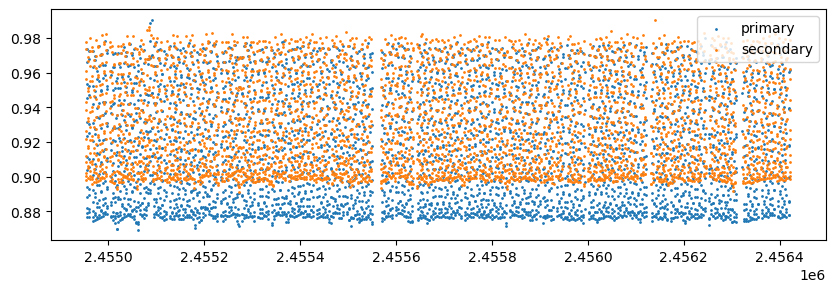

In [35]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
if t0_secondary is not None:
    plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

2454956.035723 4.1008708 2454956.035723


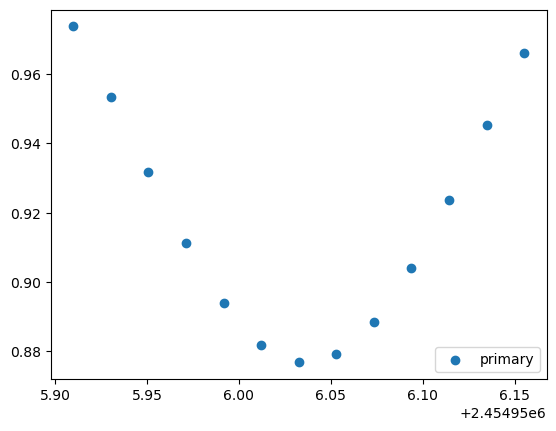

2454956.035723 4.1008708 2454960.1365938


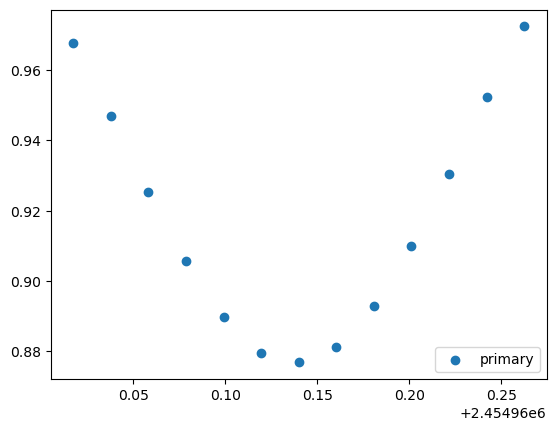

2454956.035723 4.1008708 2454964.2374646


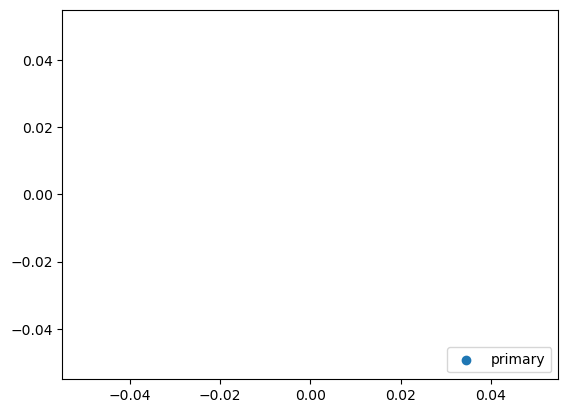

2454956.035723 4.1008708 2456407.7439861996


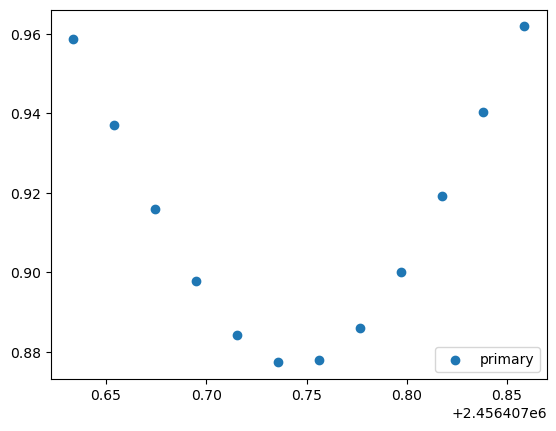

2454956.035723 4.1008708 2456411.844857


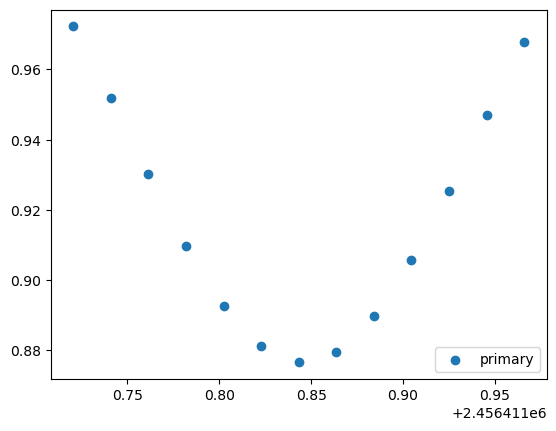

2454956.035723 4.1008708 2456415.9457278


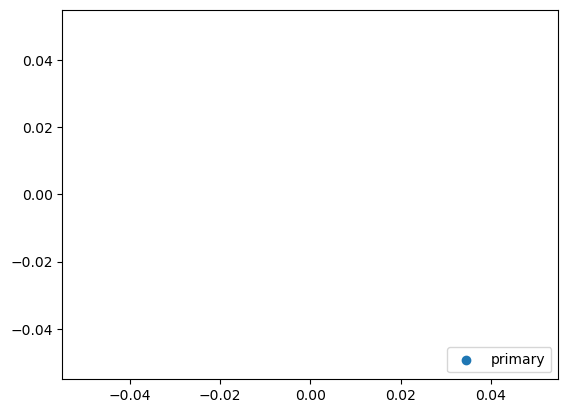

2454953.9852875997 4.1008708 2454953.9852875997


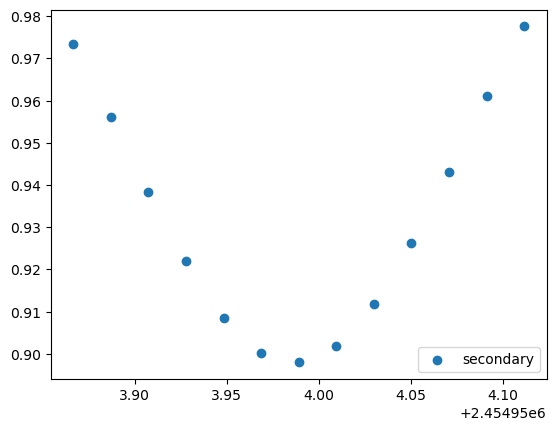

2454953.9852875997 4.1008708 2454958.0861584


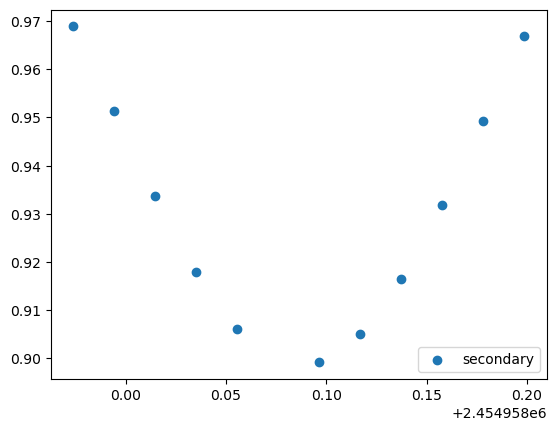

2454953.9852875997 4.1008708 2454962.1870291997


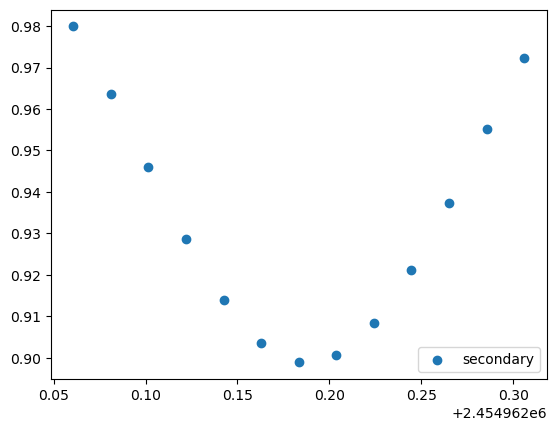

2454953.9852875997 4.1008708 2456405.6935507995


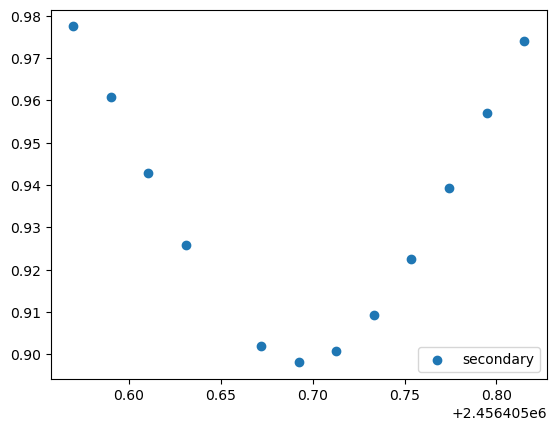

2454953.9852875997 4.1008708 2456409.7944215997


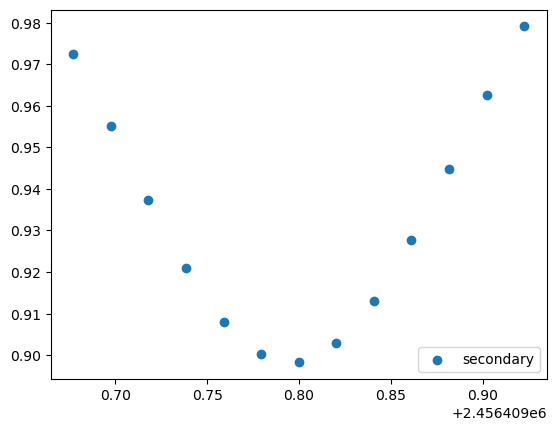

2454953.9852875997 4.1008708 2456413.8952924


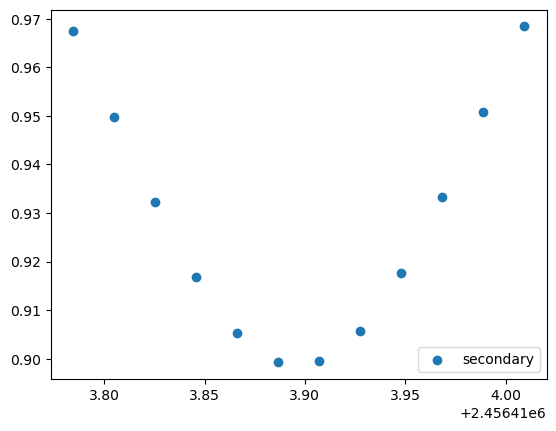

In [36]:
tr_index = range(0,n_transits)

for i in np.concatenate( (tr_index[0:3], tr_index[-3:]) ): 
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux)
    yerr = np.array(data_primary.err)

    print (t0_primary, period, transit_time)

    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period)))

    x = np.array(x[mask])
    y = np.array(y[mask])
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()


if t0_secondary is not None:
    for i in np.concatenate( (tr_index[0:3], tr_index[-3:]) ): 
        transit_time = t0_secondary+(period*i)
        x = np.array(data_secondary.time)
        y = np.array(data_secondary.flux)
        yerr = np.array(data_secondary.err)

        print (t0_secondary, period, transit_time)

        mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period)))

        x = np.array(x[mask])
        y = np.array(y[mask])
        yerr = np.array(yerr[mask])
        fig, ax = plt.subplots()
        plt.scatter(x,y, label="secondary")
        plt.legend(loc="lower right")
        plt.show()

### Fit individual eclipses

In [37]:
# Provide a warning if the expected number of data points per clipped LC is smaller than the default minimum `min_number_data` (20)
longest_cadence = np.max(sr.exptime)
est_number_data_primary   = int(window_width_p  * period * 24 / longest_cadence.to(u.hr).value)
print(f"Expected num of data points of a clipped LC in longest cadence ({longest_cadence}) for primary: {est_number_data_primary}")
if est_number_data_primary < 20:
    display(HTML("<span style='background-color: rgba(255, 0, 0, 0.7); padding-left: 1ch; padding-right: 1ch;'>WARN:</span> num of data points for a clipped LC (primary) < 20"))

if t0_secondary is not None:
    est_number_data_secondary = int(window_width_s  * period * 24 / longest_cadence.to(u.hr).value)
    print(f"Expected num of data points of a clipped LC in longest cadence ({longest_cadence}) for secondary:  {est_number_data_secondary}")
    if est_number_data_secondary < 20:
        display(HTML("<span style='background-color: rgba(255, 0, 0, 0.7); padding-left: 1ch; padding-right: 1ch;'>WARN:</span> num of data points for a clipped LC (secondary) < 20"))

Expected num of data points of a clipped LC in longest cadence (1800.0 s) for primary: 12


Expected num of data points of a clipped LC in longest cadence (1800.0 s) for secondary:  12


Fitting individual primary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
2454960.1365938 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.75it/s]


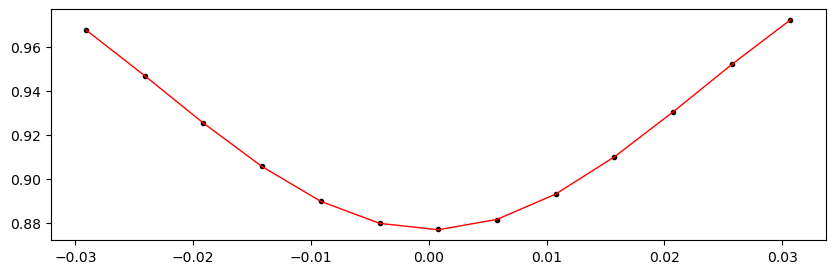

2454968.3383354 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.68it/s]


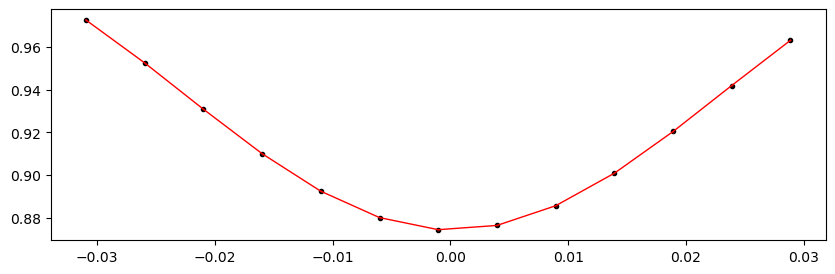

2454972.4392061997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.51it/s]


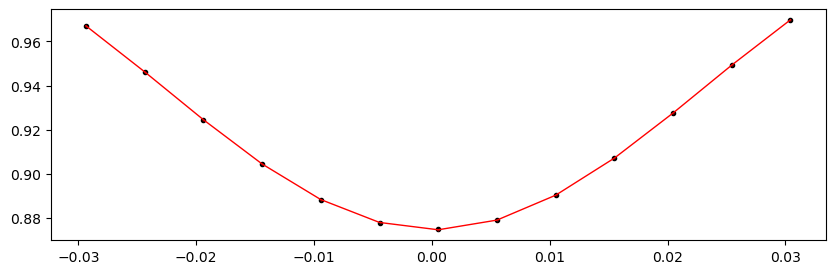

2454976.540077 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.74it/s]


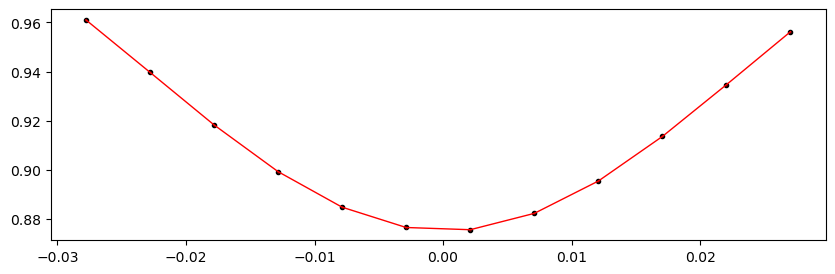

2454980.6409477997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.63it/s]


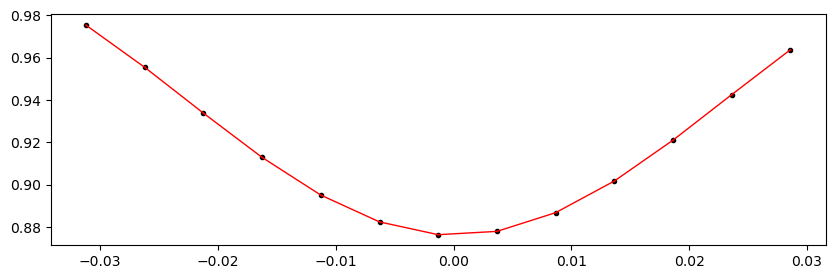

2454984.7418186 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.17it/s]


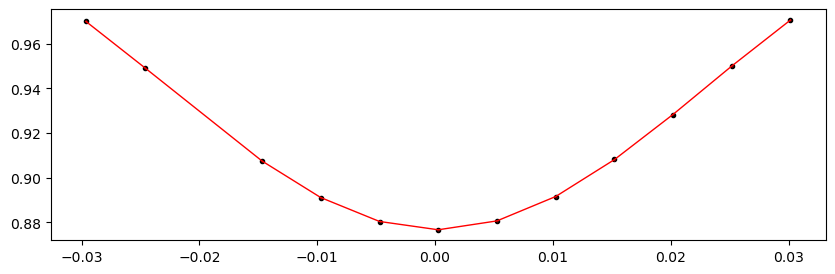

2454988.8426893996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.75it/s]


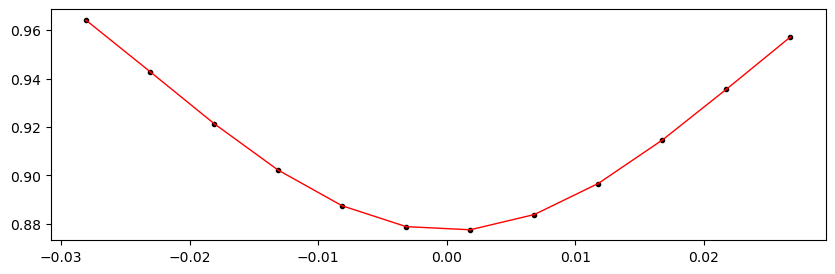

2454992.9435602 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.19it/s]


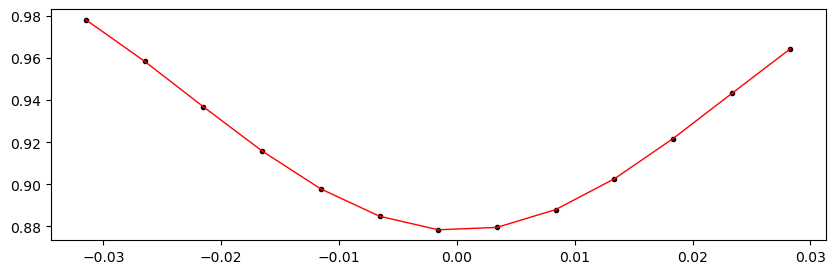

2454997.044431 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.10it/s]


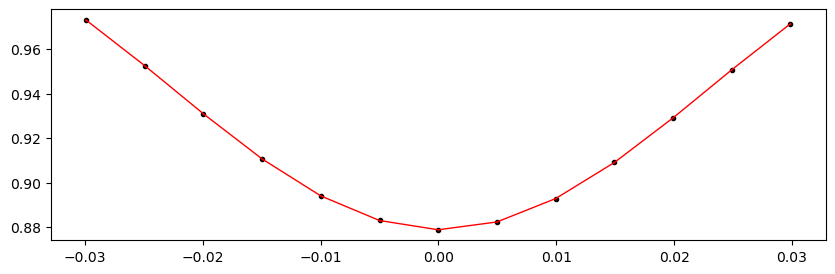

2455005.2461726 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.12it/s]


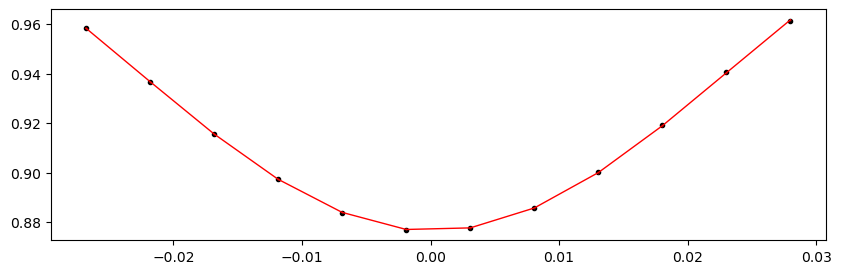

2455009.3470433997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.91it/s]


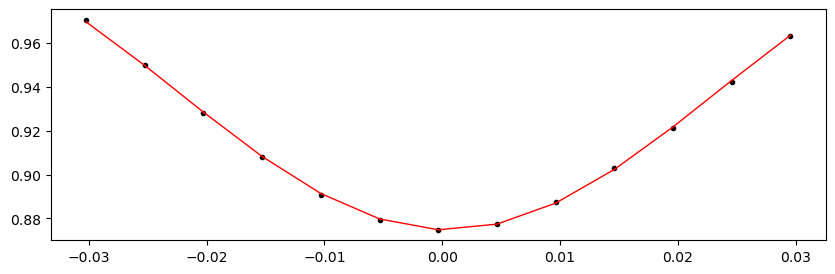

2455013.4479142 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.96it/s]


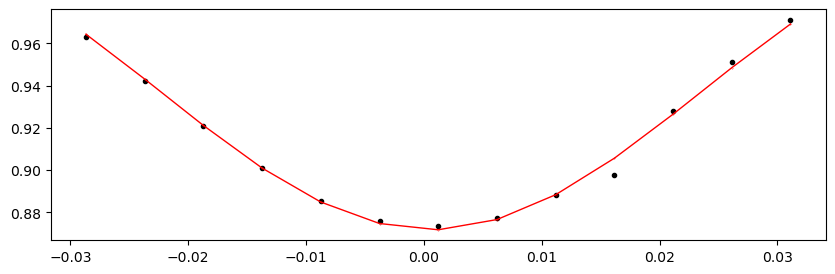

2455017.5487849996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.52it/s]


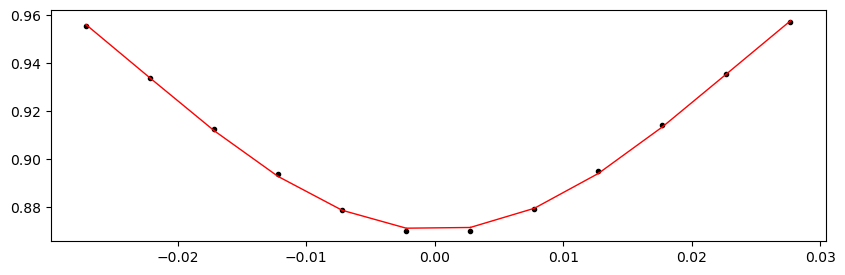

2455021.6496558 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.51it/s]


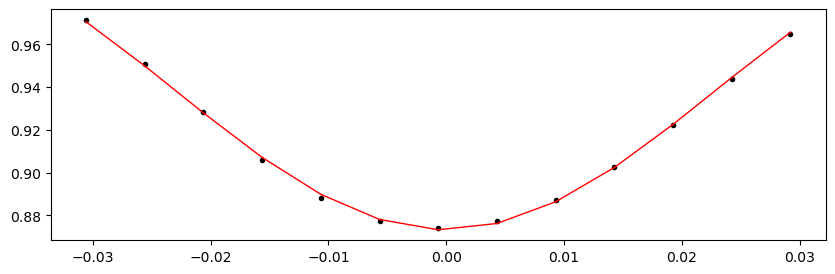

2455025.7505266 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.26it/s]


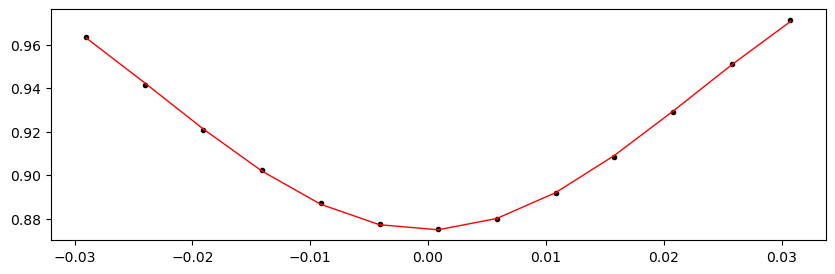

2455029.8513974 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.16it/s]


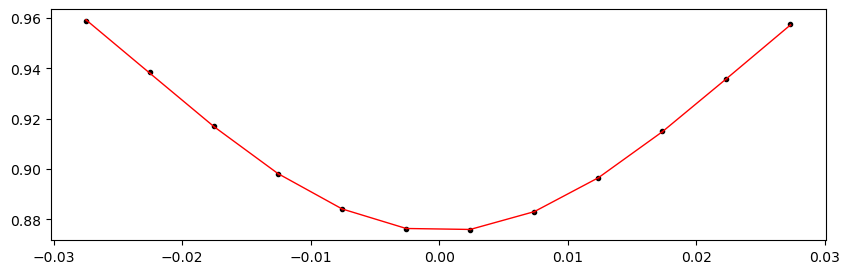

2455033.9522682 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.21it/s]


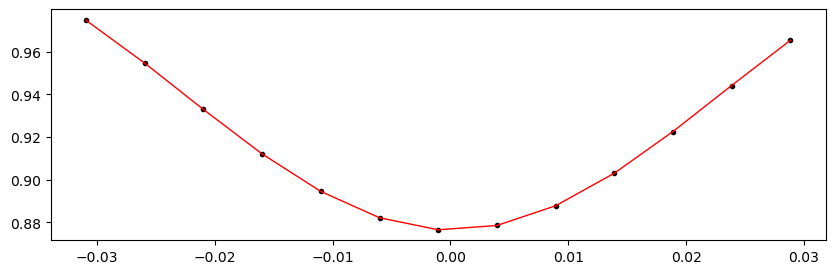

2455038.0531389997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.67it/s]


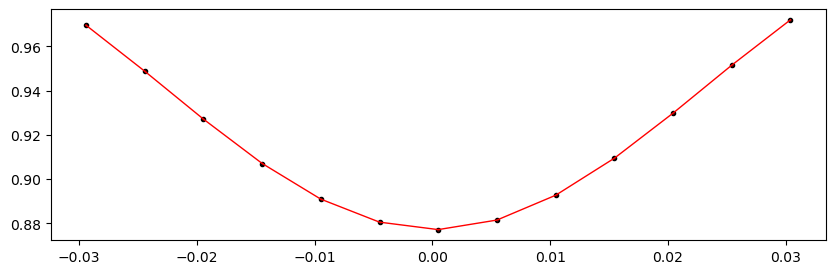

2455042.1540098 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.59it/s]


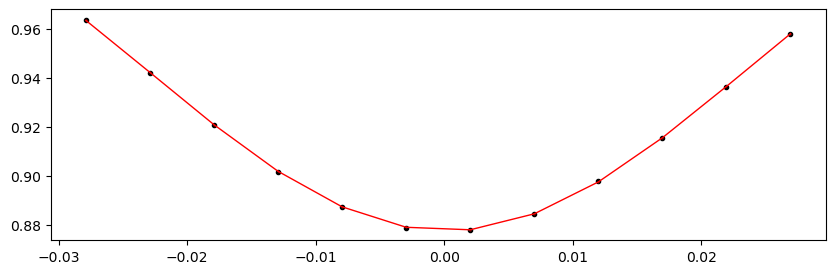

2455046.2548805997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.85it/s]


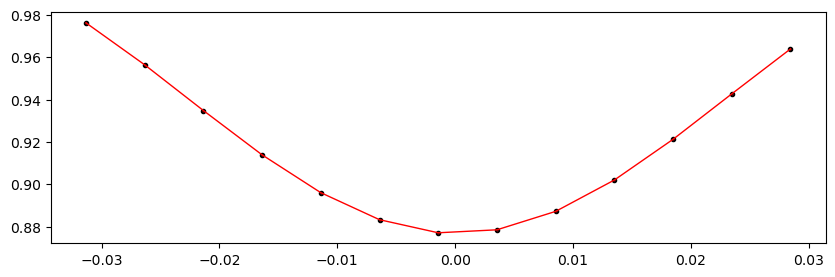

2455050.3557514 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.50it/s]


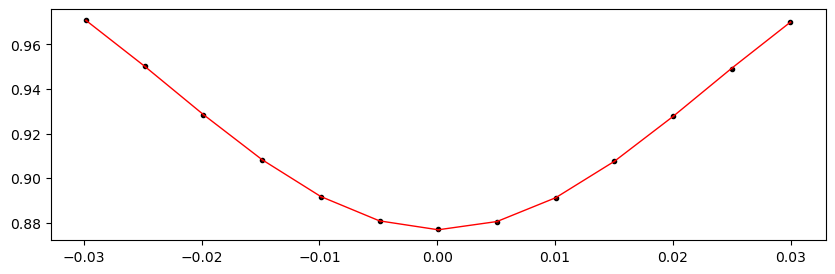

2455054.4566221996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.73it/s]


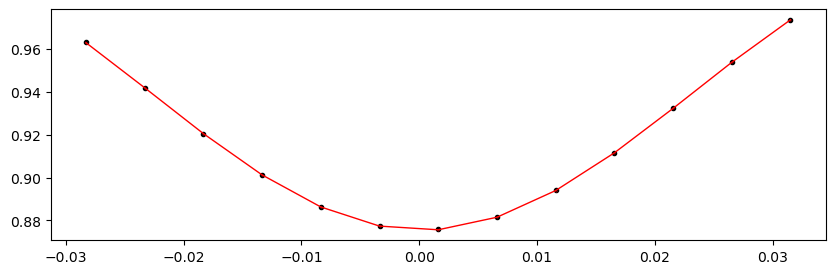

2455058.557493 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.51it/s]


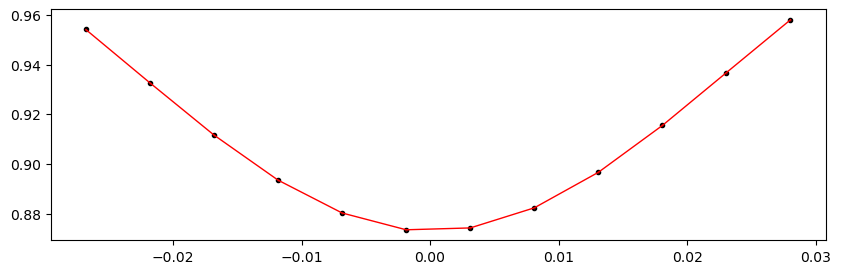

2455062.6583638 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.96it/s]


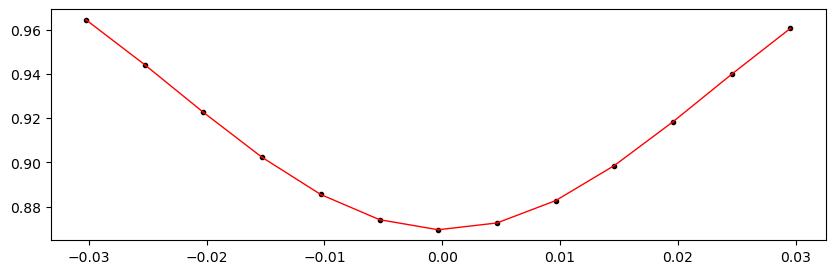

2455066.7592346 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.11it/s]


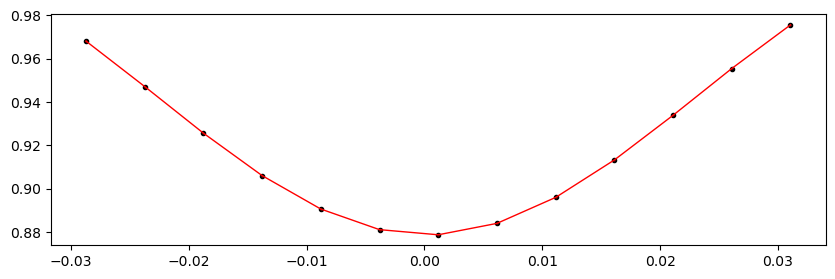

2455070.8601054 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.45it/s]


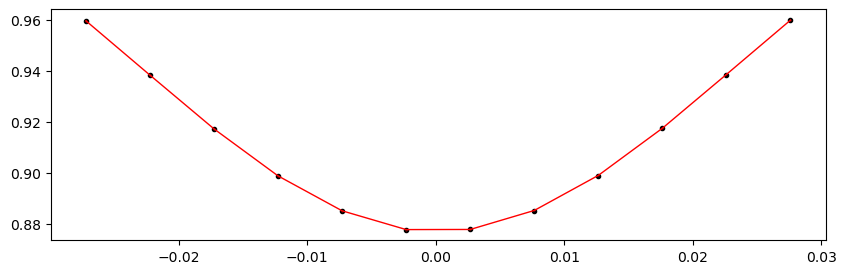

2455074.9609761997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.47it/s]


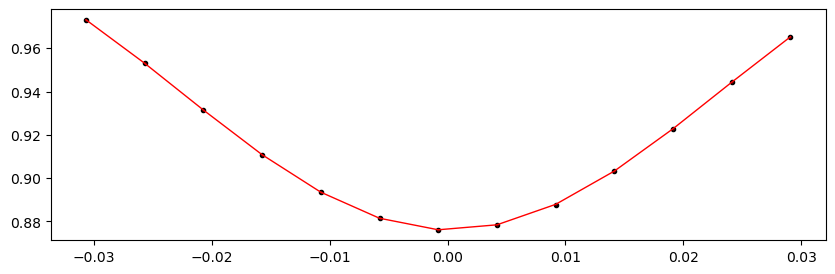

2455079.061847 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.29it/s]


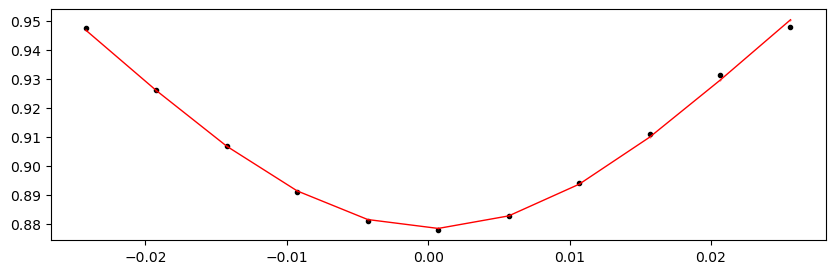

2455083.1627177997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.96it/s]


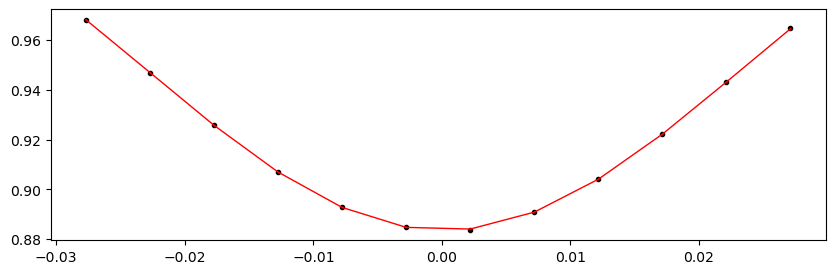

2455087.2635886 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.19it/s]


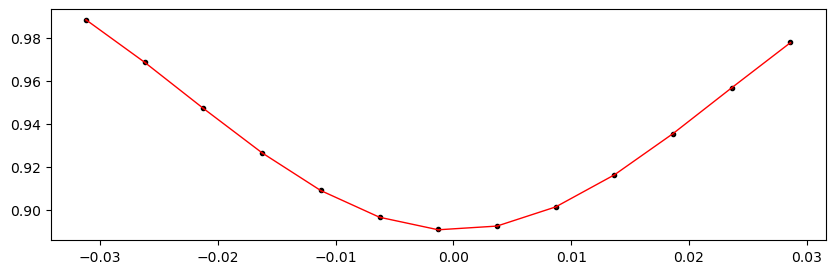

2455091.3644594 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.26it/s]


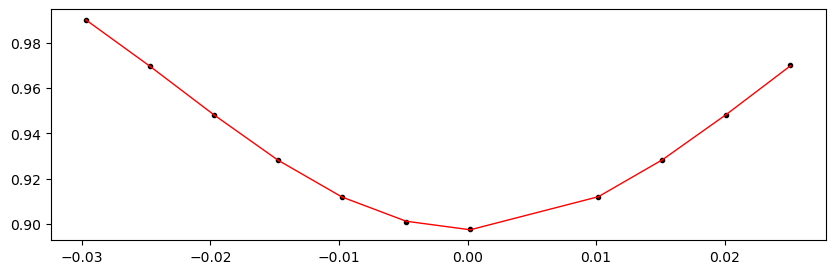

2455095.4653302 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.99it/s]


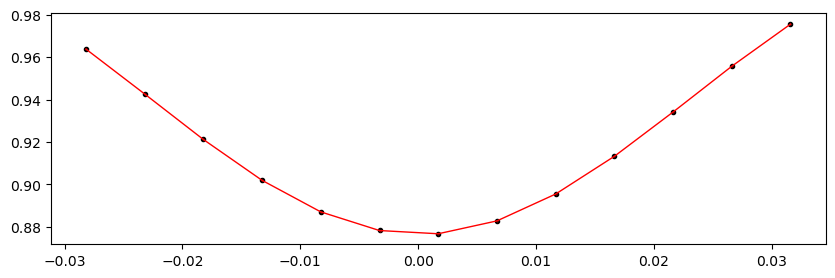

2455099.566201 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.88it/s]


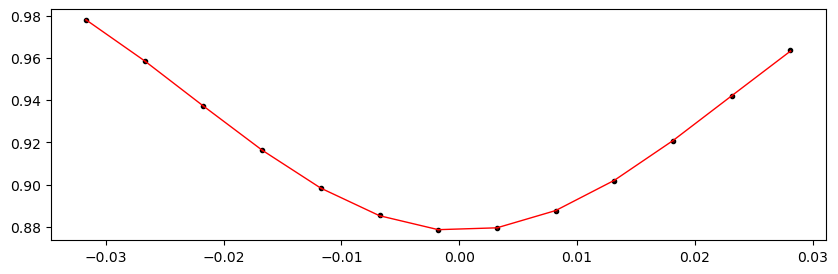

2455103.6670717997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.49it/s]


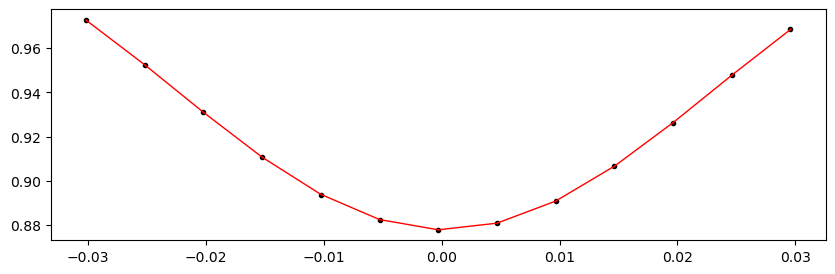

2455107.7679426 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.81it/s]


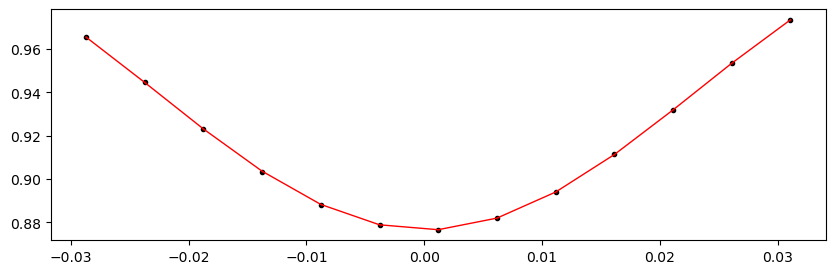

2455111.8688133997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.55it/s]


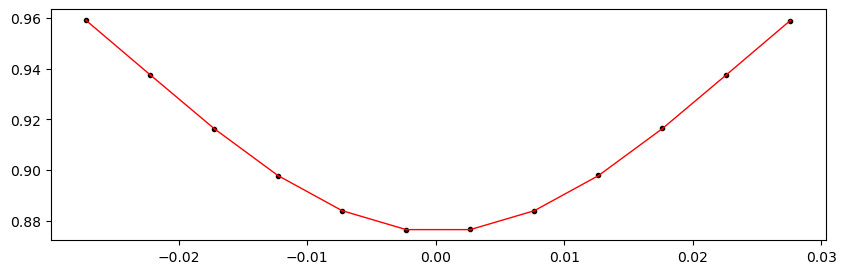

2455115.9696842 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 407.33it/s]


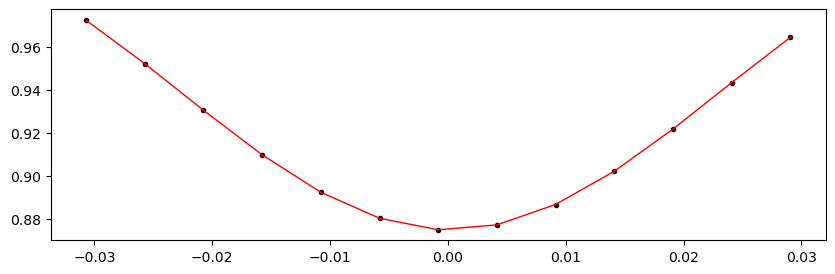

2455120.0705549996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:23<00:00, 417.17it/s]


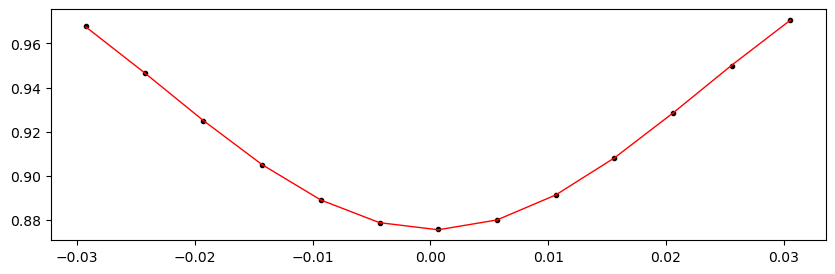

2455128.2722966 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.56it/s]


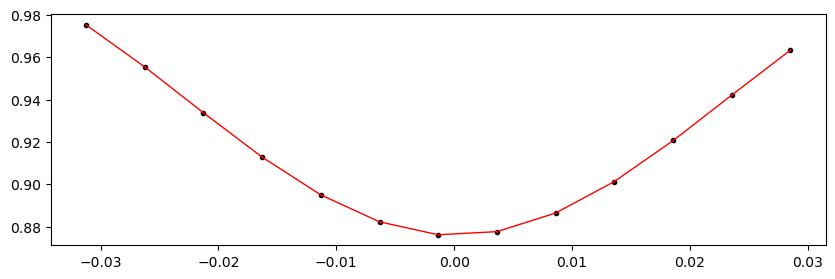

2455132.3731674 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 277.11it/s]


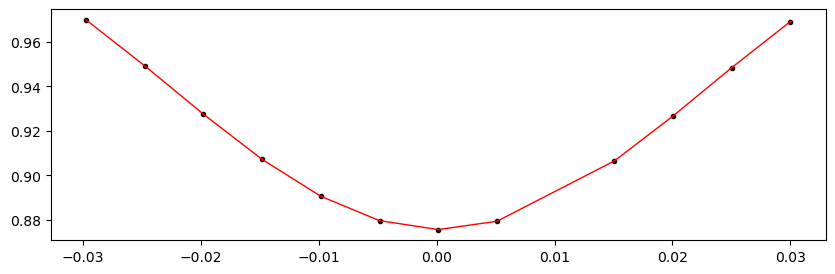

2455136.4740382 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 283.73it/s]


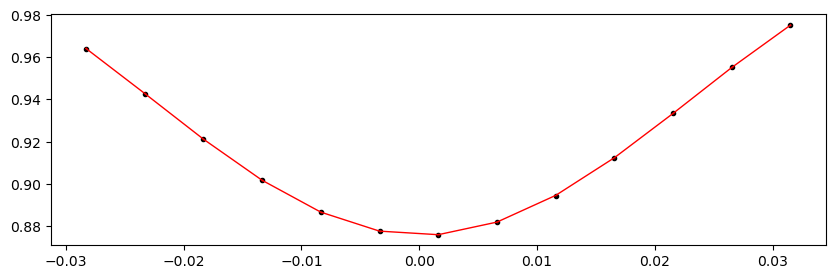

2455140.5749089997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:36<00:00, 276.10it/s]


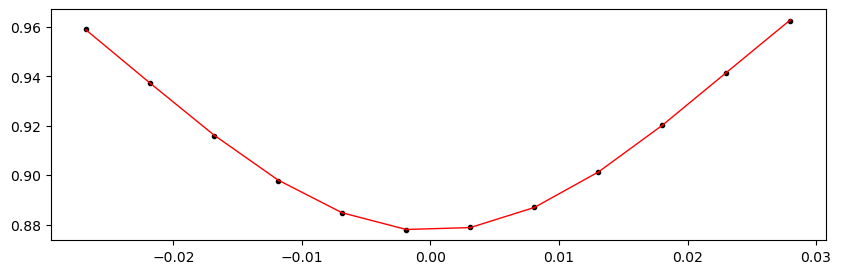

2455144.6757798 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 279.39it/s]


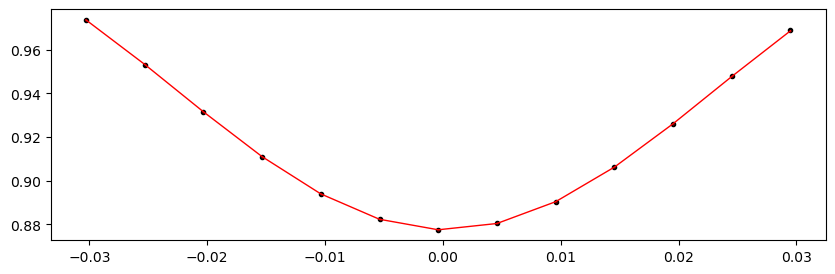

2455148.7766505997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 282.77it/s]


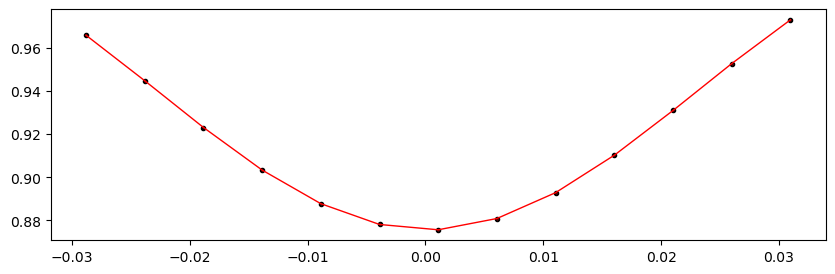

2455152.8775214 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 286.55it/s]


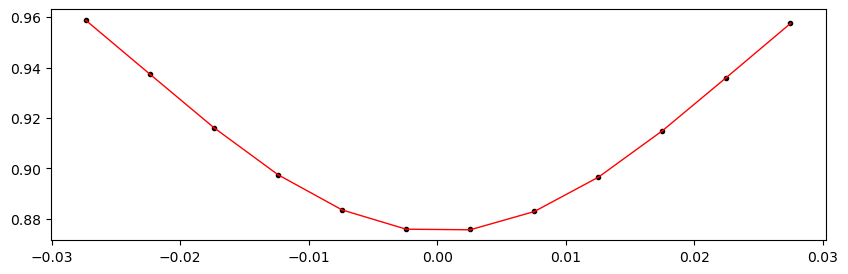

2455156.9783921996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 283.56it/s]


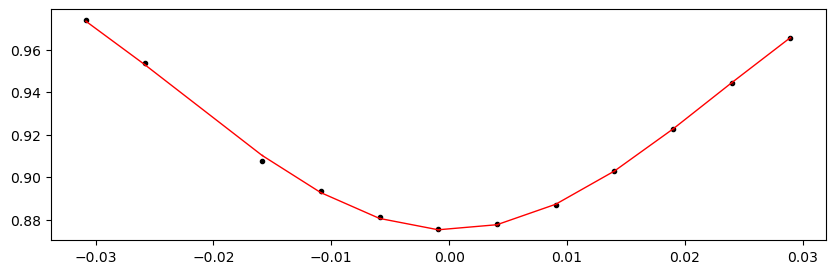

2455161.079263 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 294.78it/s]


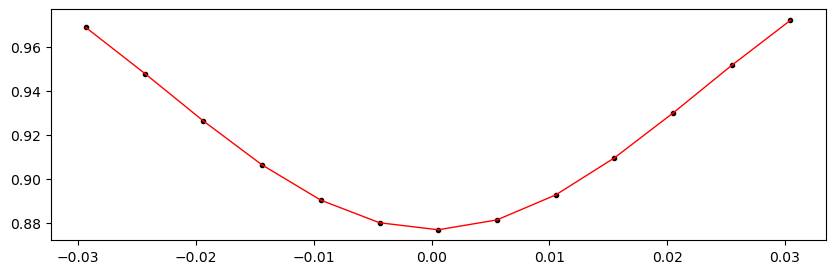

2455165.1801338 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 306.60it/s]


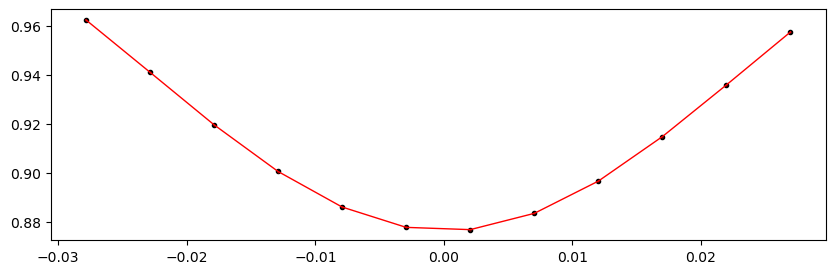

2455169.2810045998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:32<00:00, 303.39it/s]


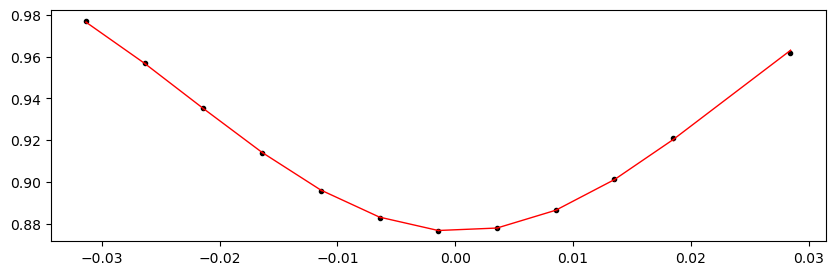

2455173.3818754 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:38<00:00, 261.25it/s]


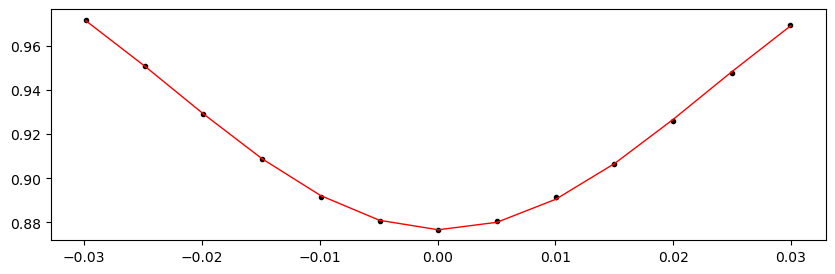

2455177.4827461997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:48<00:00, 207.47it/s]


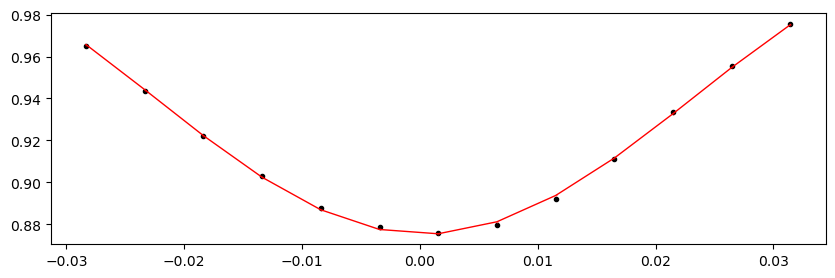

2455181.583617 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:45<00:00, 219.44it/s]


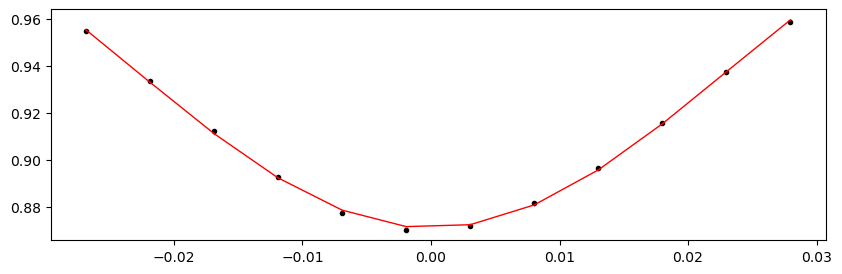

2455185.6844877996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:33<00:00, 294.99it/s]


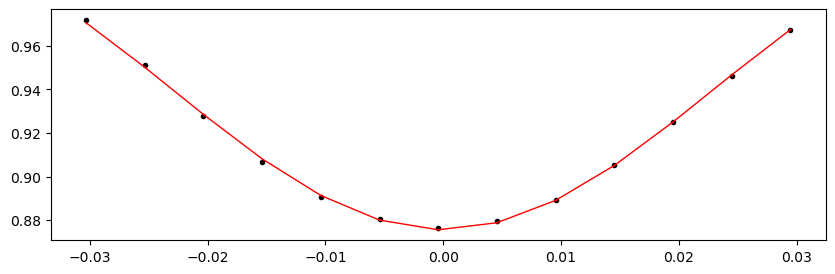

2455189.7853586 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.35it/s]


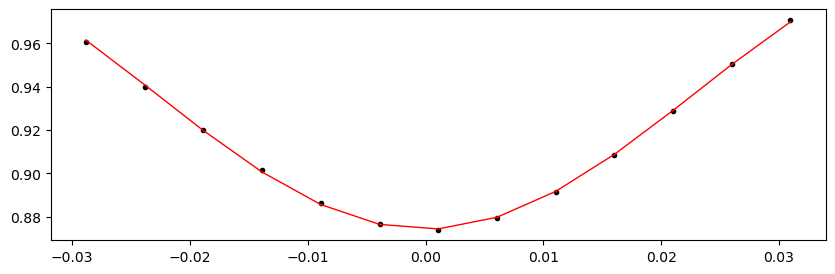

2455193.8862294 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.57it/s]


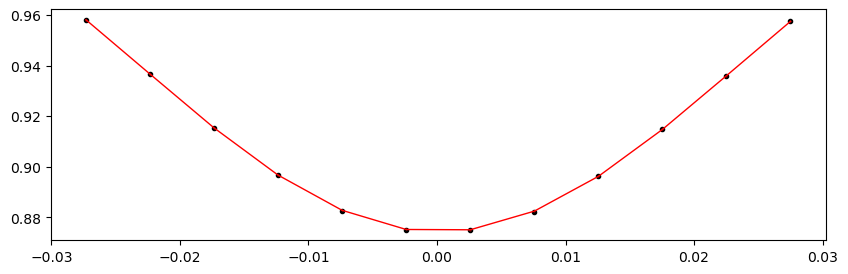

2455197.9871002 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.63it/s]


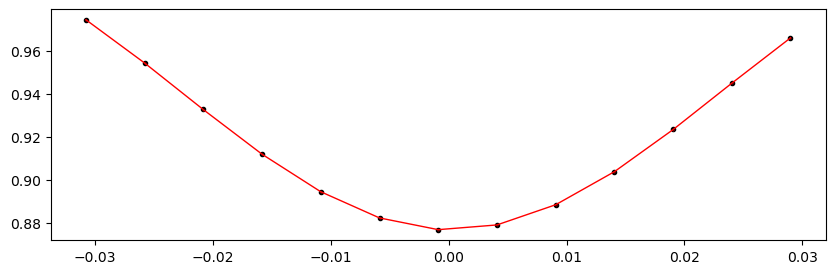

2455202.087971 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.08it/s]


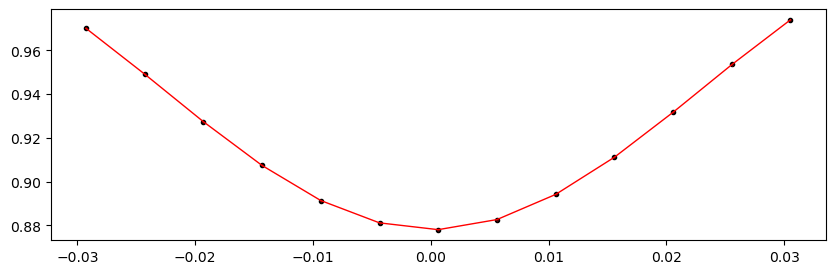

Time 2455206.1888417997 does not have enough data points: 10
2455210.2897126 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.92it/s]


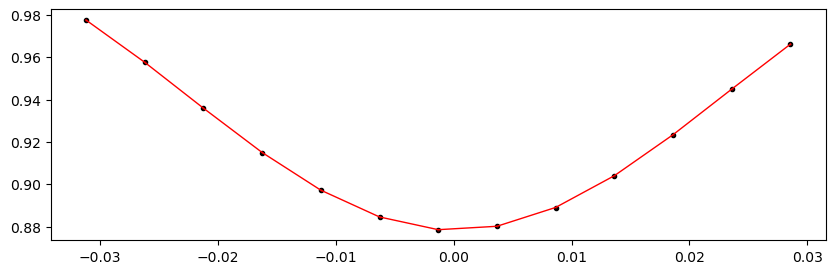

2455214.3905833997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.62it/s]


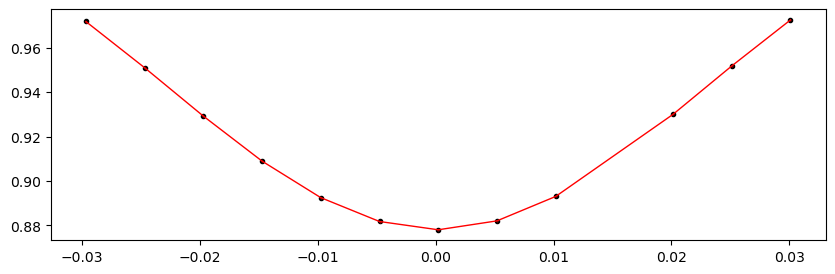

2455218.4914542 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.47it/s]


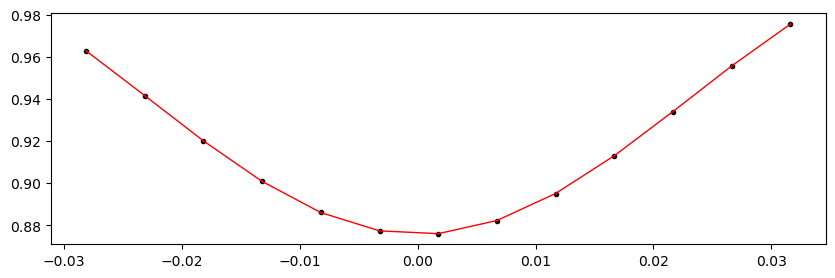

2455222.5923249996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.76it/s]


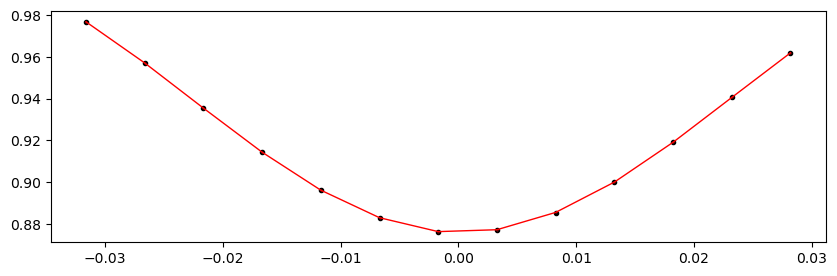

2455226.6931958 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.08it/s]


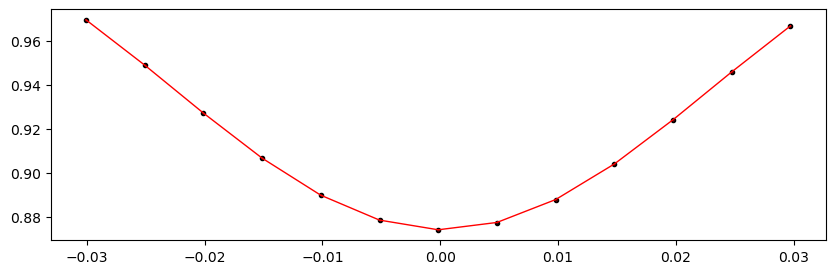

2455234.8949374 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.72it/s]


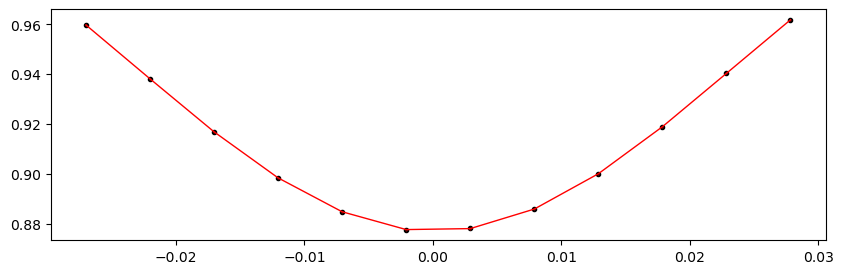

2455238.9958082 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.87it/s]


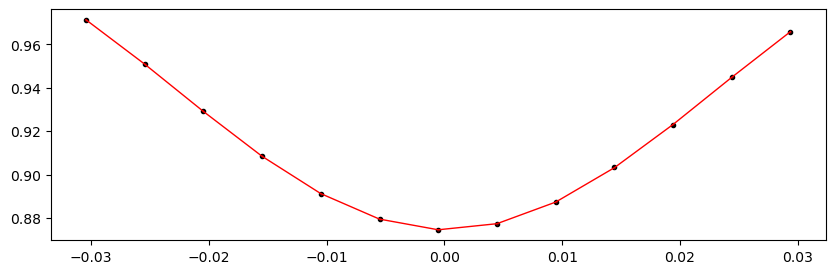

2455243.0966789997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.10it/s]


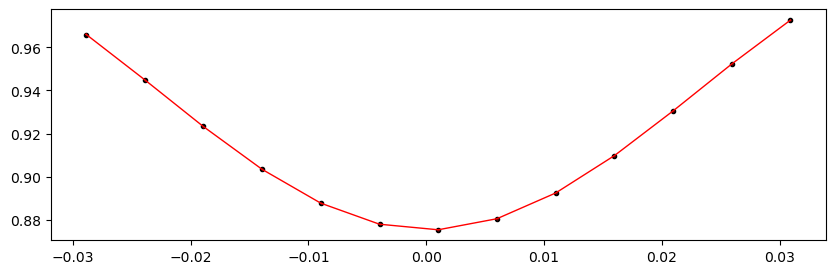

2455247.1975498 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.05it/s]


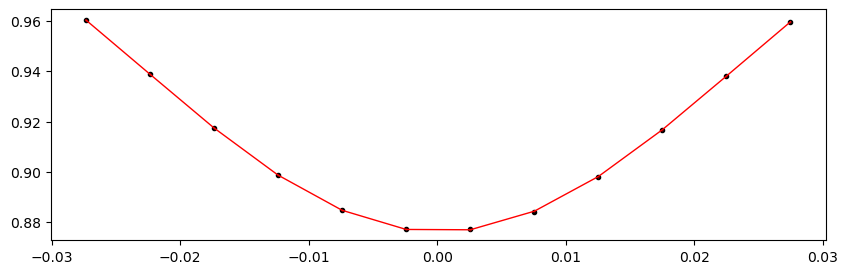

2455251.2984205997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.45it/s]


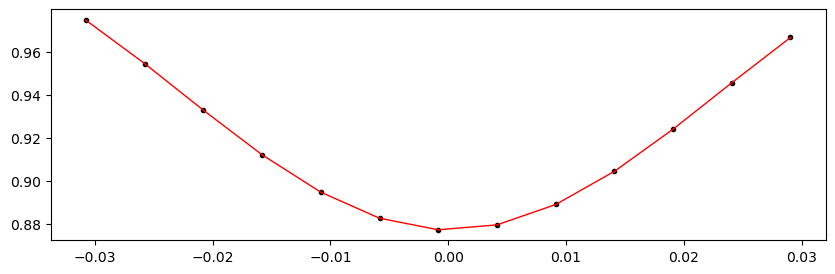

2455255.3992914 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 327.69it/s]


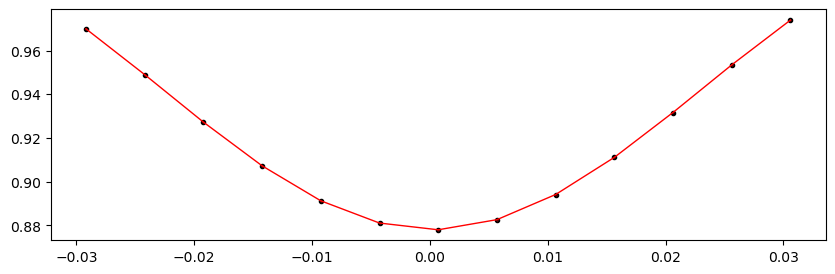

2455259.5001621996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.60it/s]


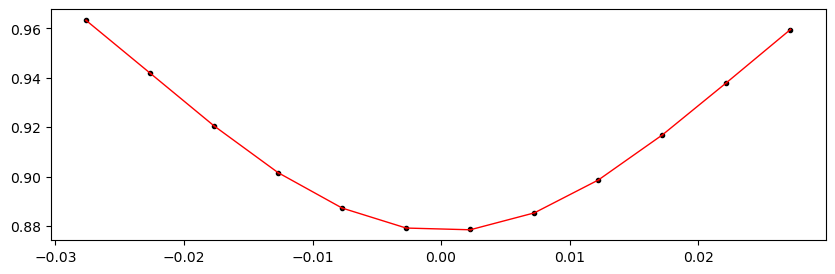

2455263.601033 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.69it/s]


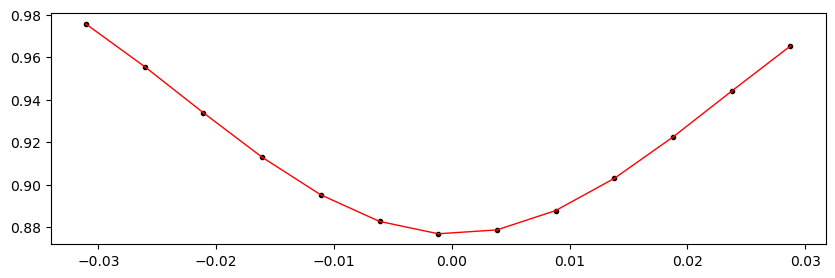

2455267.7019038 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.24it/s]


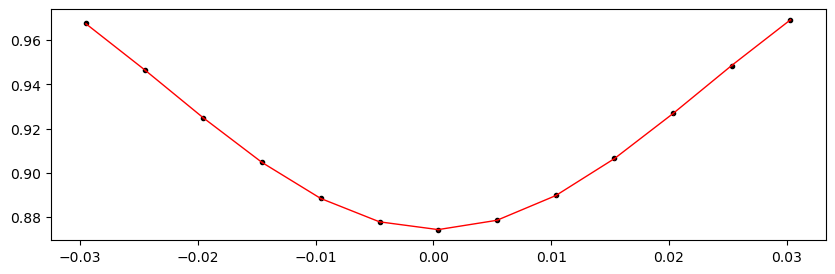

2455271.8027745998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.02it/s]


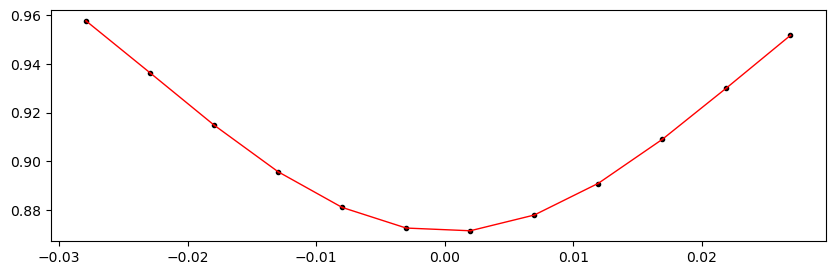

2455280.0045161997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.24it/s]


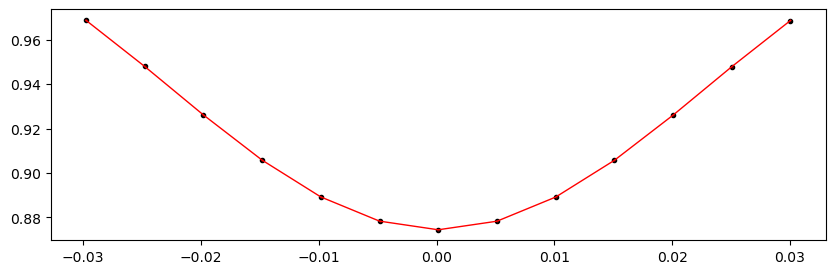

2455284.105387 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.15it/s]


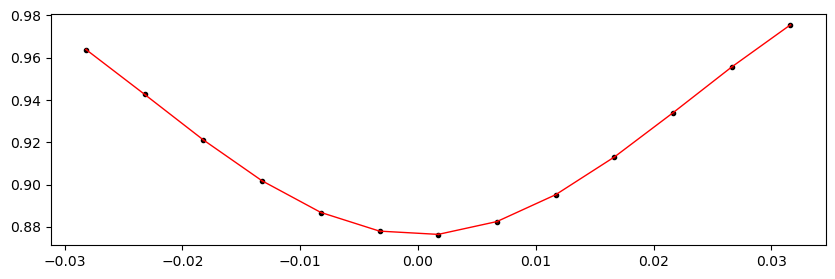

2455288.2062577996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.76it/s]


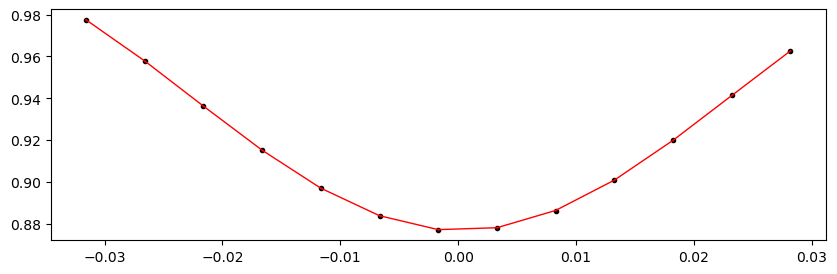

2455292.3071286 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.80it/s]


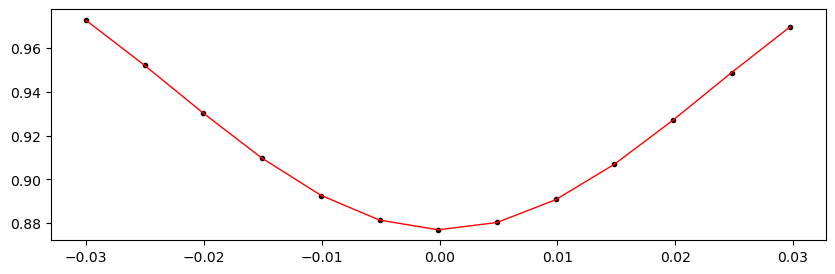

2455296.4079994 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.43it/s]


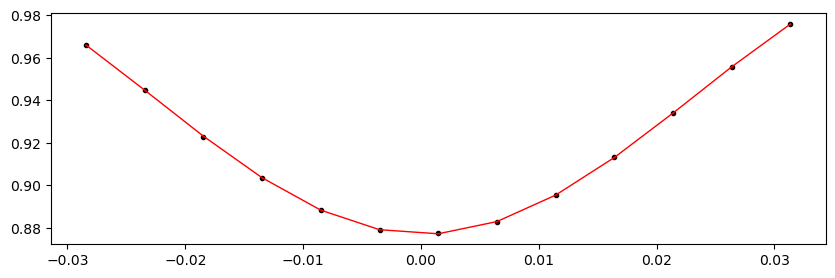

2455300.5088702 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.53it/s]


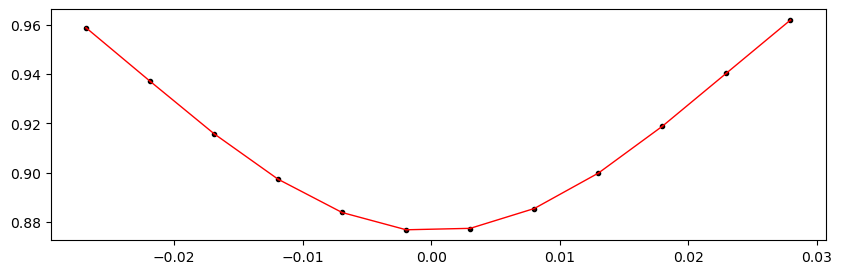

2455304.609741 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.70it/s]


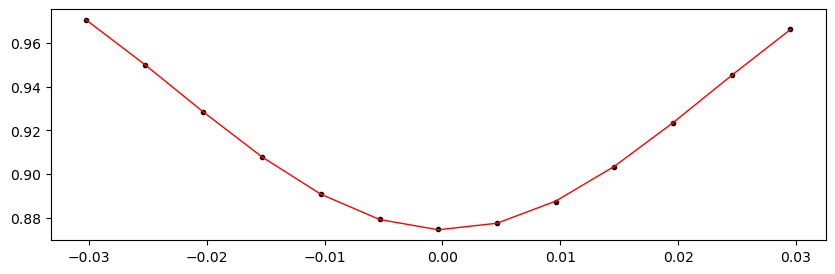

2455312.8114826 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.79it/s]


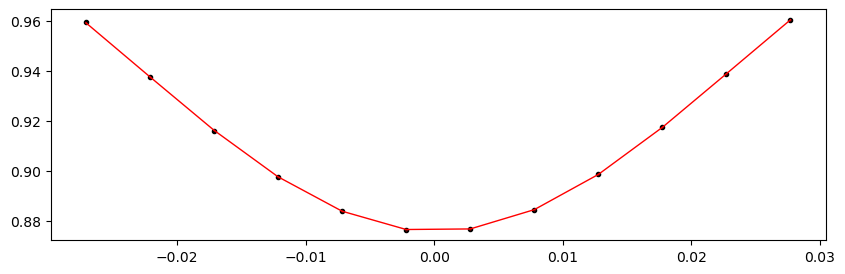

2455316.9123533997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.46it/s]


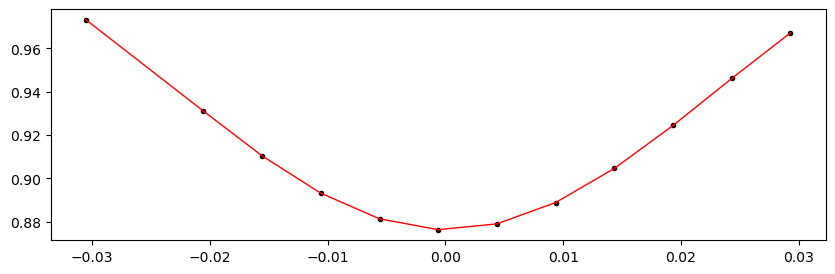

2455321.0132242 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.10it/s]


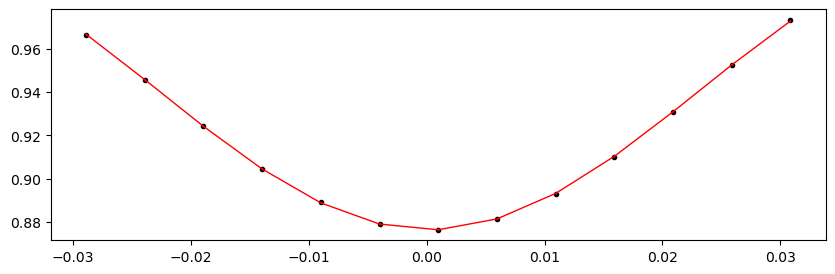

2455325.1140949996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.68it/s]


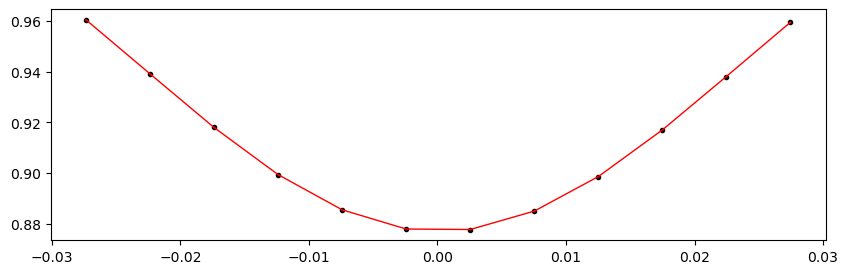

2455329.2149658 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.80it/s]


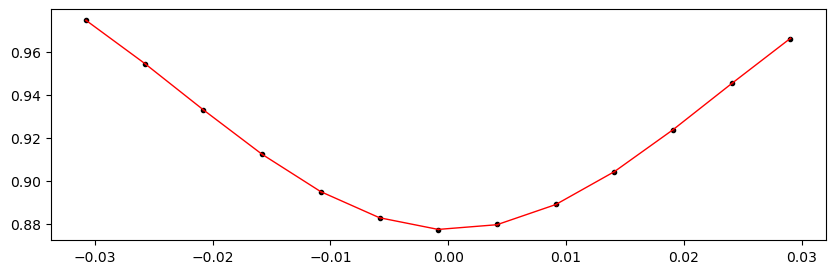

2455333.3158366 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.20it/s]


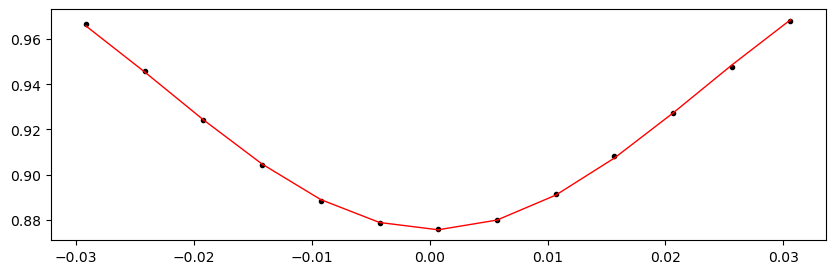

2455341.5175782 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.81it/s]


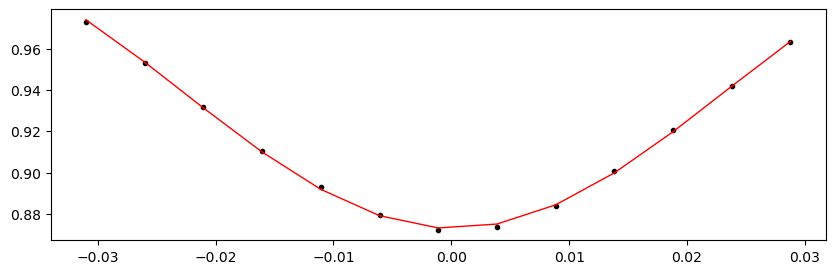

2455345.6184489997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.27it/s]


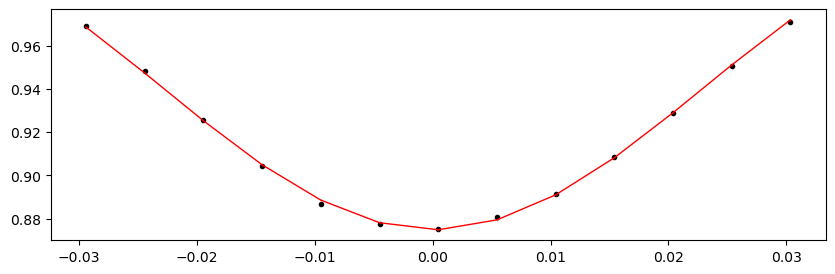

2455349.7193198 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.16it/s]


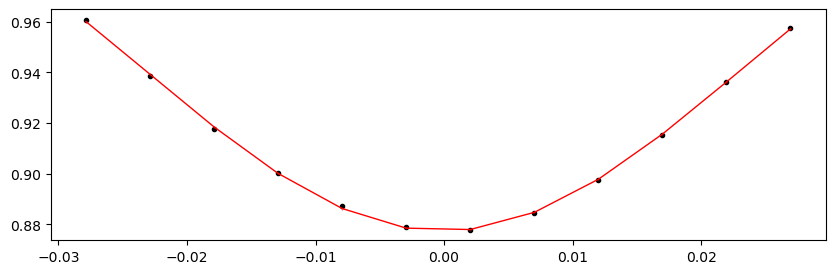

2455353.8201905997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.42it/s]


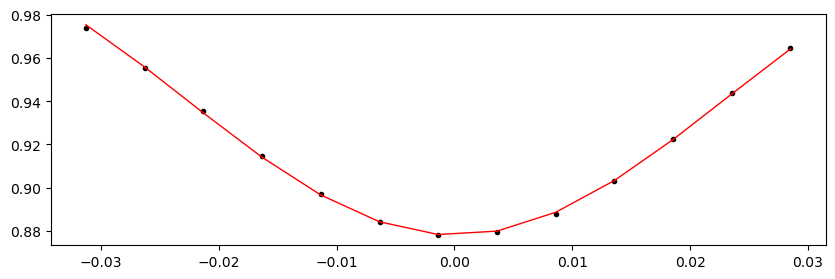

2455357.9210614 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 335.01it/s]


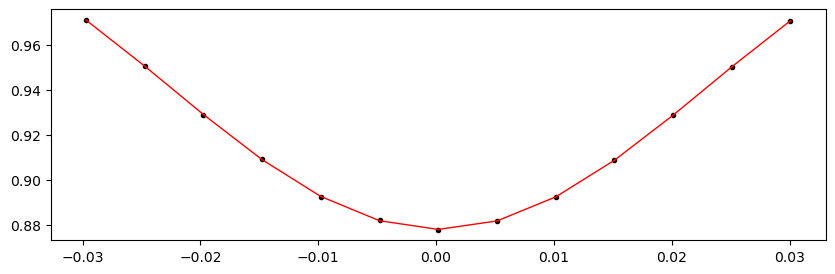

2455362.0219322 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.37it/s]


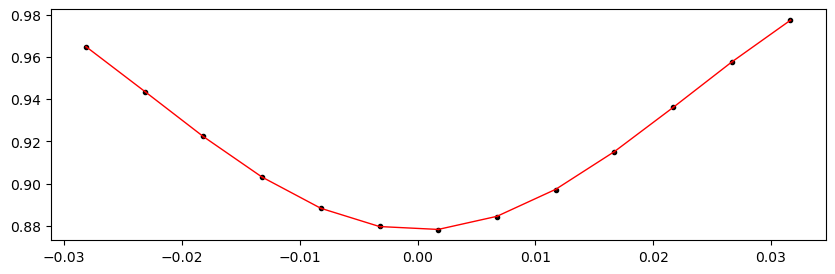

2455366.122803 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.66it/s]


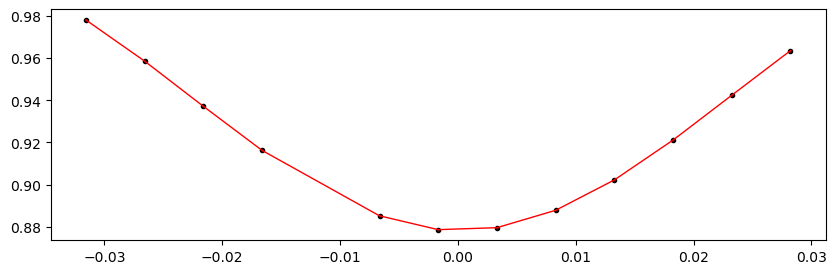

2455370.2236738 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.83it/s]


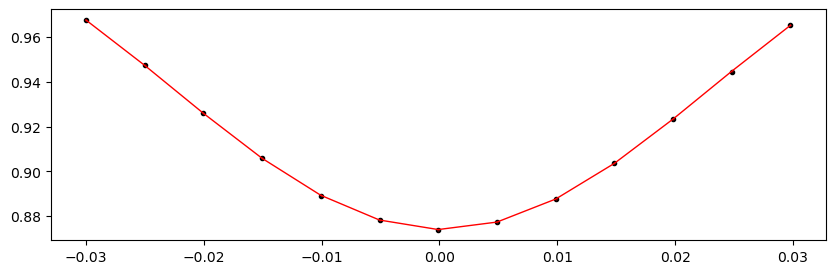

2455374.3245445997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.18it/s]


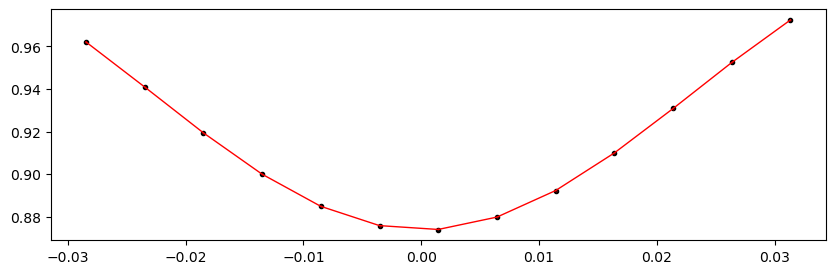

2455378.4254154 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.17it/s]


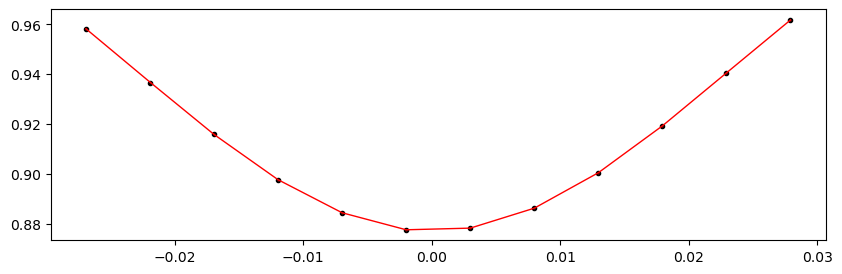

2455382.5262861997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.49it/s]


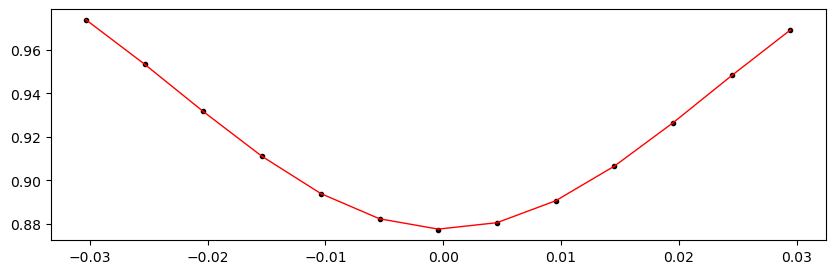

2455386.627157 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.29it/s]


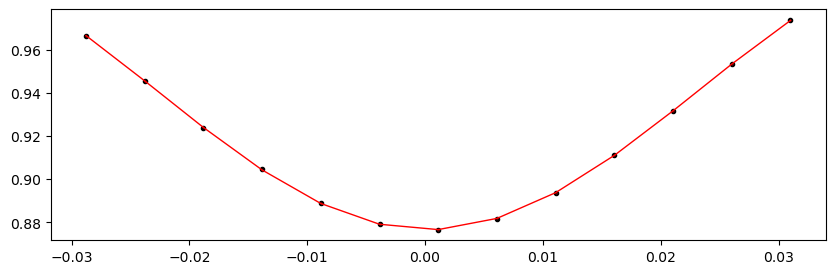

2455390.7280277996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.84it/s]


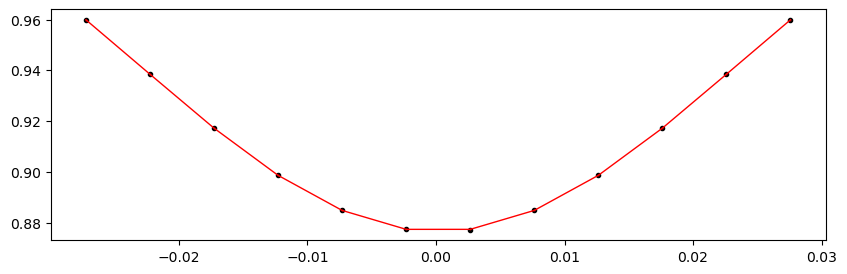

2455394.8288986 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.39it/s]


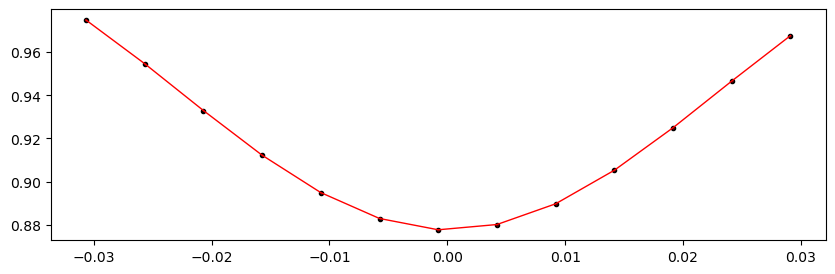

2455398.9297694 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.32it/s]


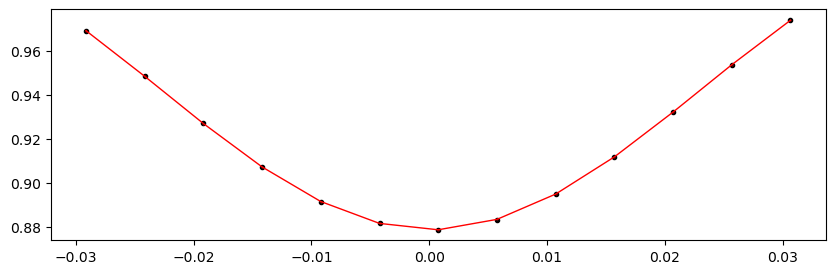

2455403.0306402 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.03it/s]


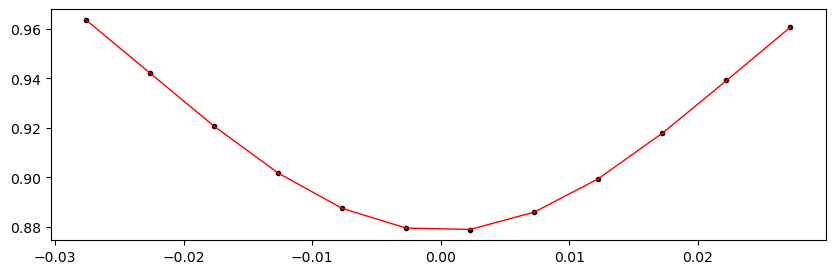

2455407.131511 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.74it/s]


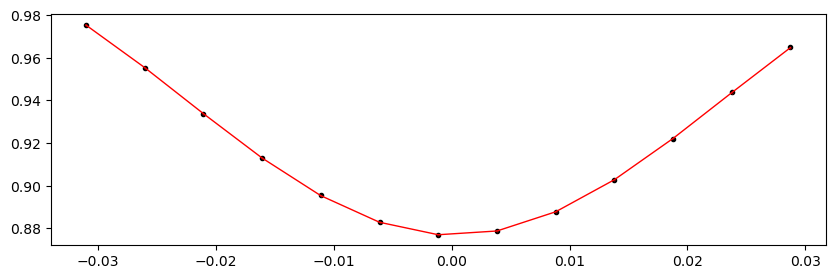

2455411.2323817997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.87it/s]


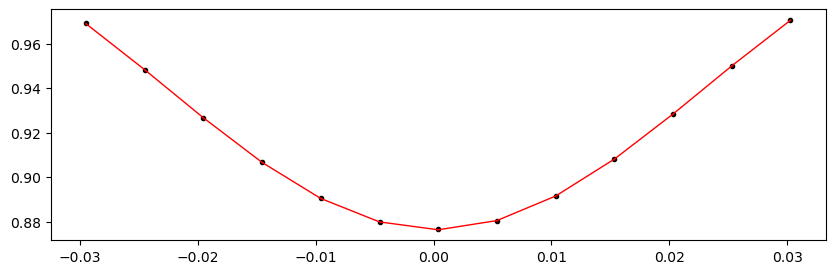

2455415.3332526 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.10it/s]


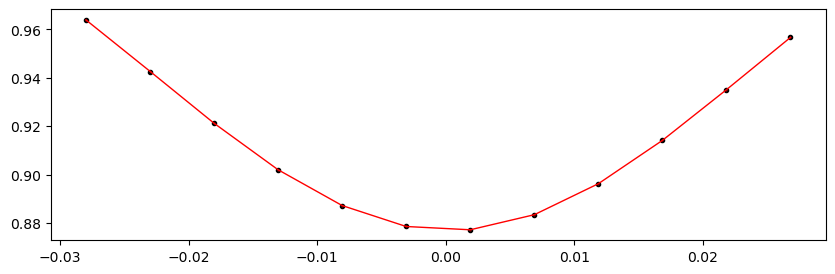

2455419.4341233997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.75it/s]


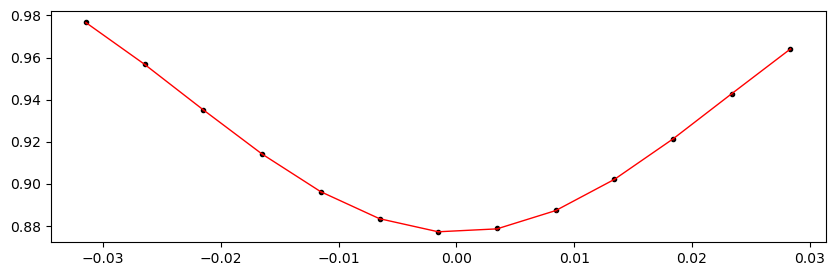

2455423.5349942 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.74it/s]


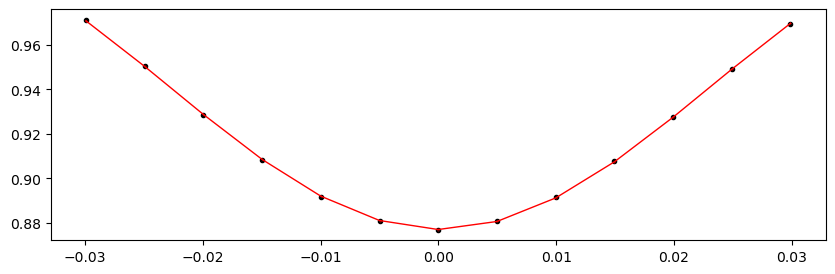

2455427.6358649996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.46it/s]


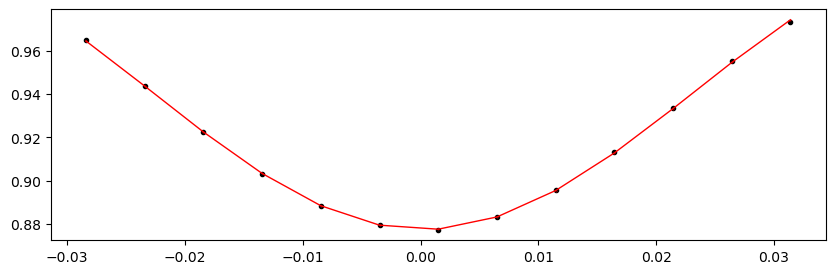

2455435.8376066 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.87it/s]


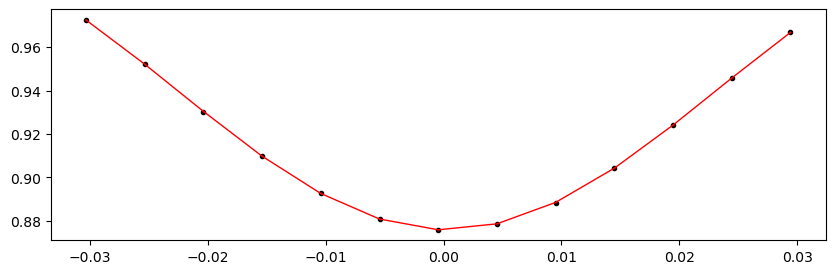

2455439.9384773998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.27it/s]


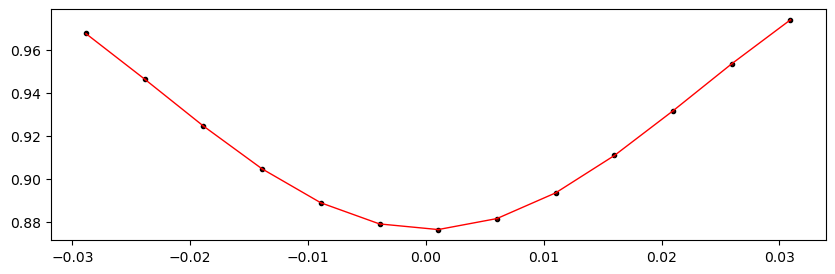

2455444.0393482 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.47it/s]


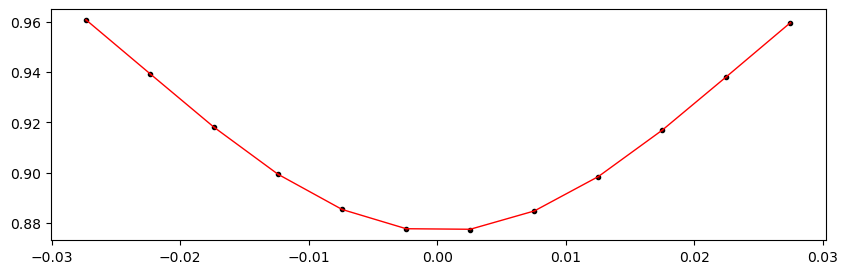

2455448.1402189997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.41it/s]


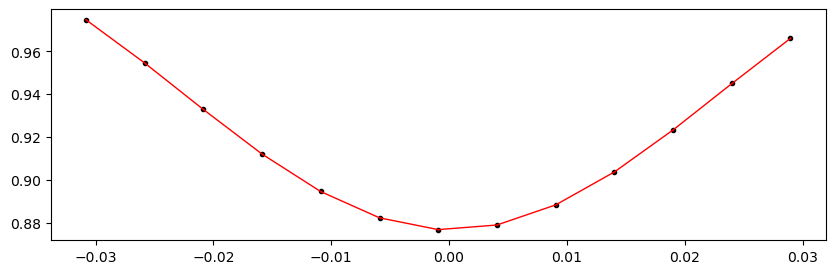

2455452.2410898 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.39it/s]


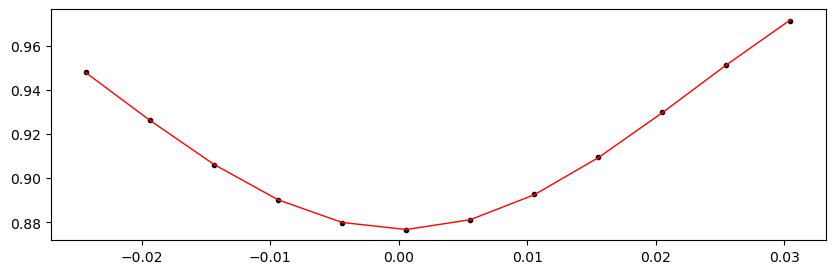

2455456.3419605996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.22it/s]


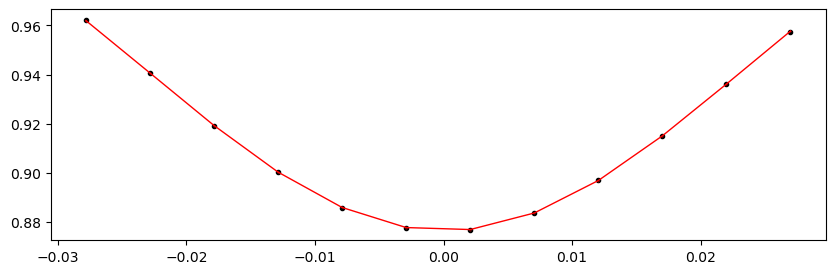

2455460.4428314 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.96it/s]


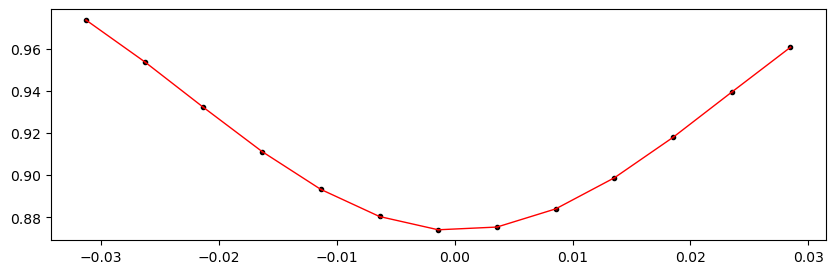

2455464.5437022 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.96it/s]


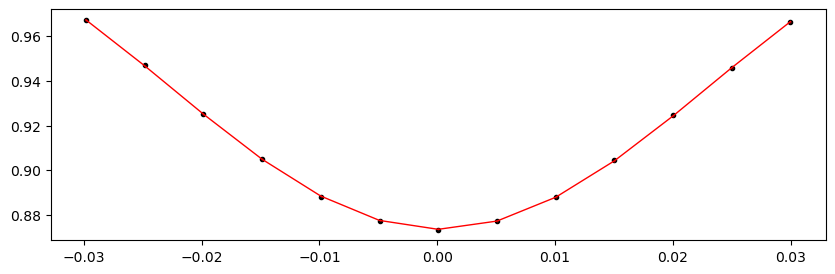

2455468.644573 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.10it/s]


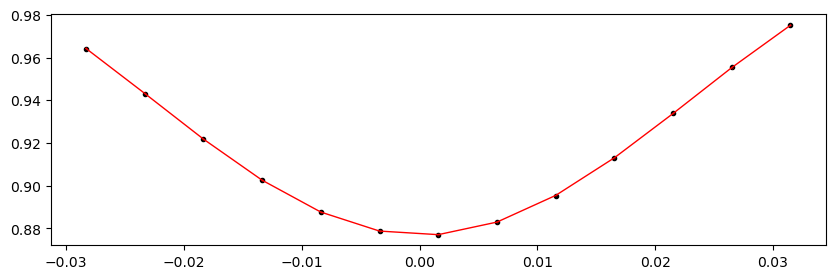

2455472.7454438 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.57it/s]


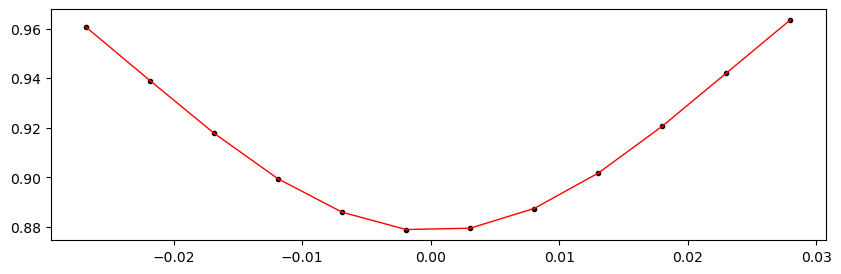

2455476.8463145997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.35it/s]


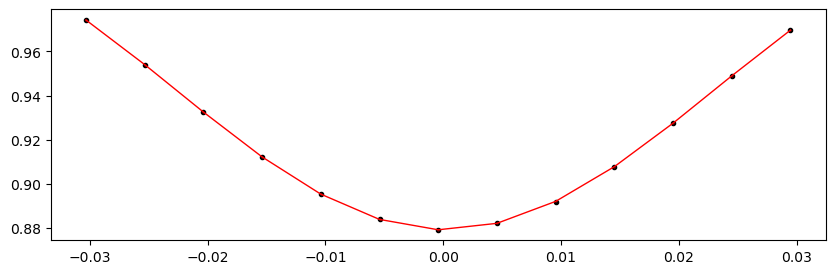

2455480.9471854 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.39it/s]


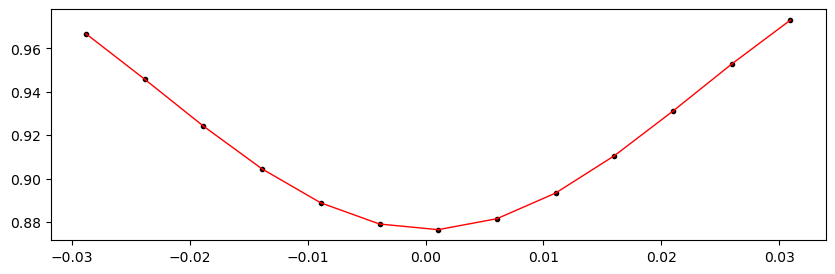

2455485.0480561997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 370.86it/s]


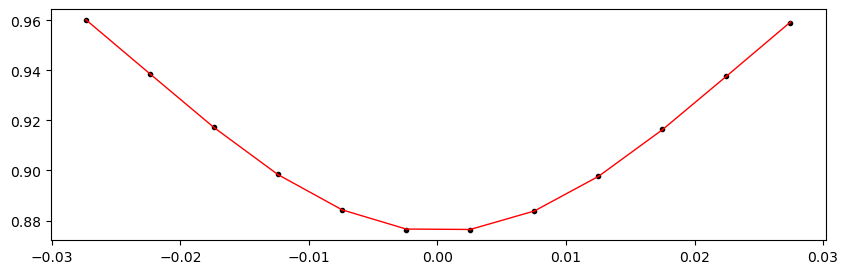

2455489.148927 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.09it/s]


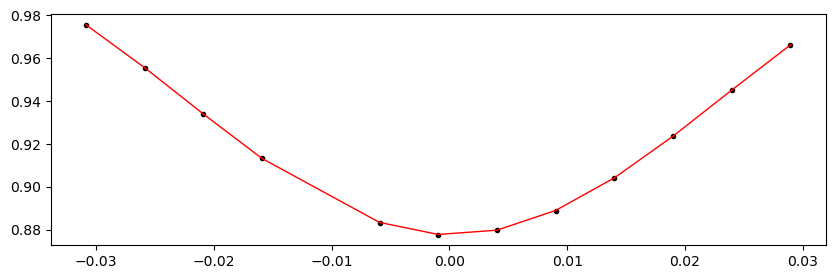

Time 2455493.2497977996 does not have enough data points: 7
2455497.3506686 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.55it/s]


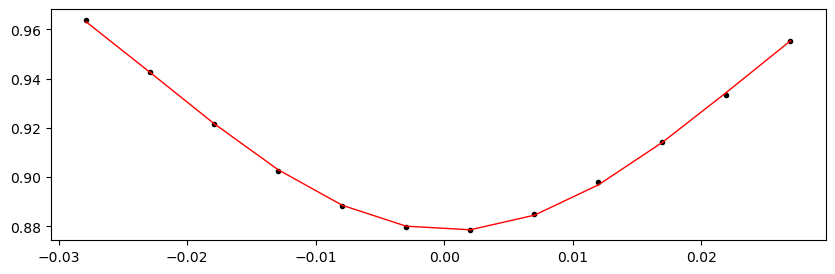

2455501.4515394 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.56it/s]


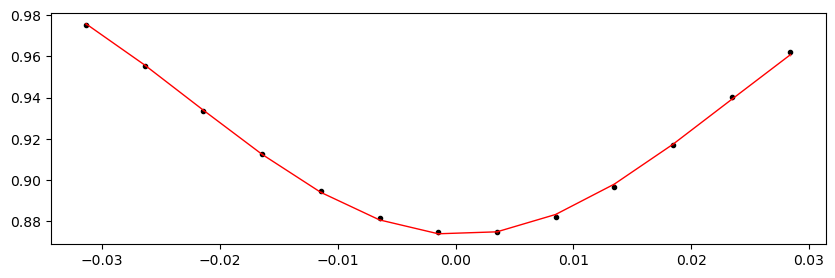

2455505.5524102 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.47it/s]


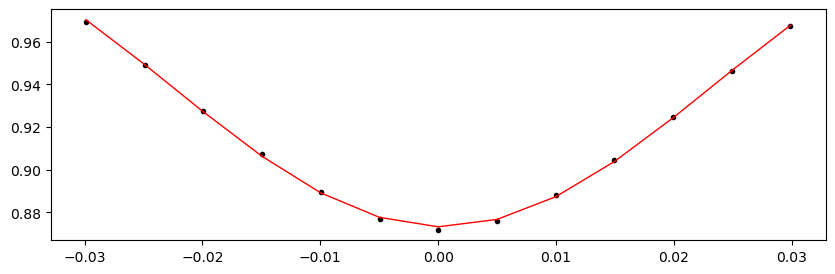

2455509.653281 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.42it/s]


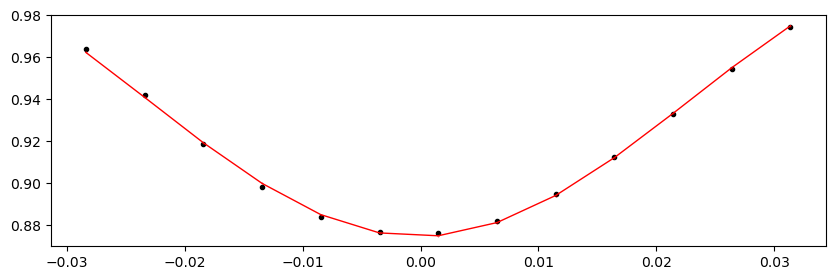

2455513.7541517997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.61it/s]


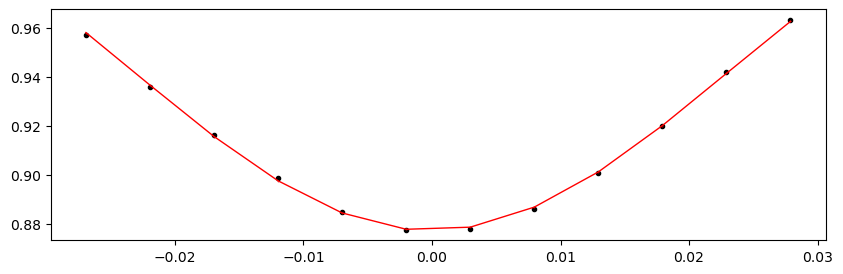

2455517.8550226 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.50it/s]


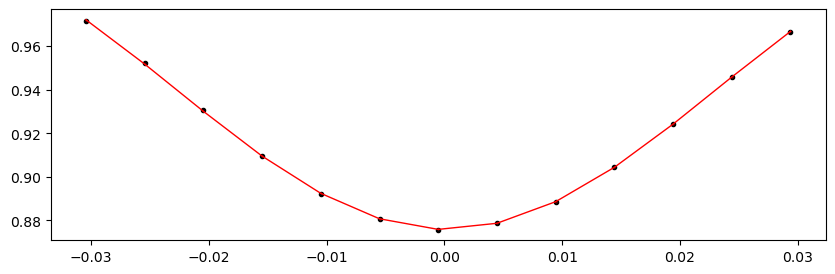

2455521.9558933997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.50it/s]


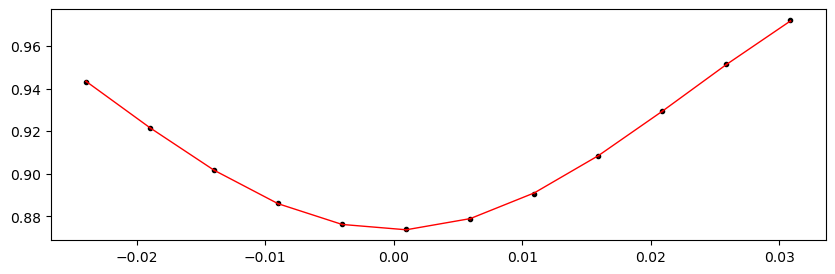

2455526.0567642 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.08it/s]


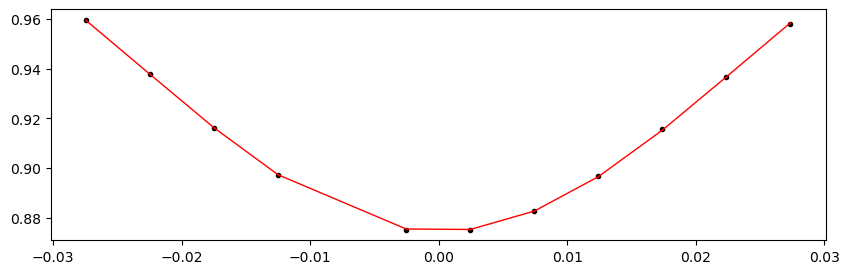

2455530.1576349996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.27it/s]


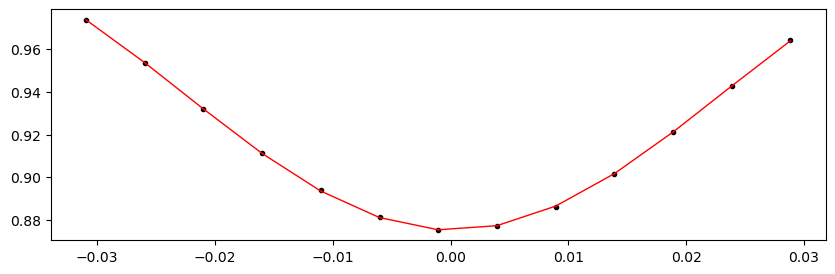

2455534.2585058 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.62it/s]


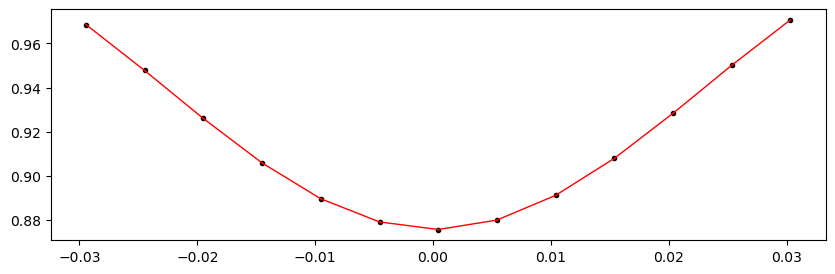

2455538.3593766 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.08it/s]


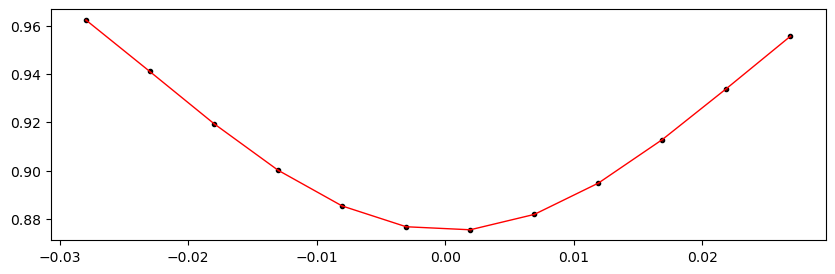

2455542.4602473998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.17it/s]


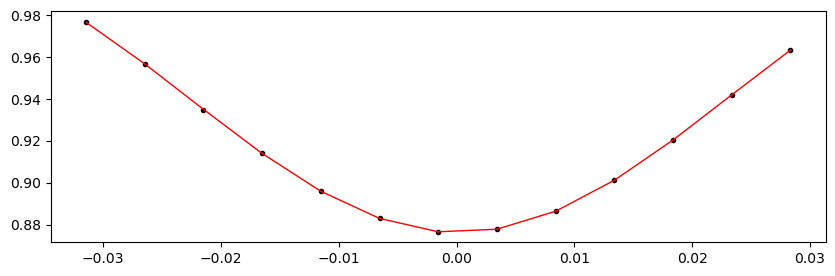

2455546.5611182 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.82it/s]


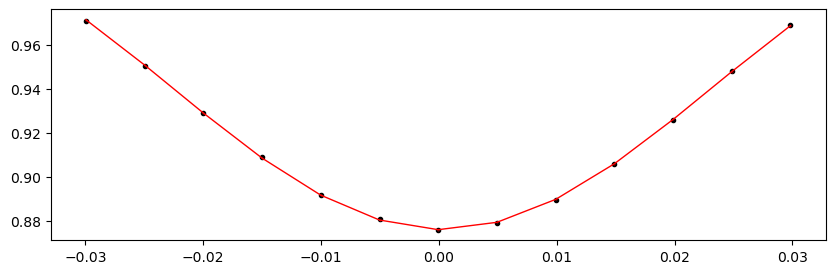

2455550.6619889997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.63it/s]


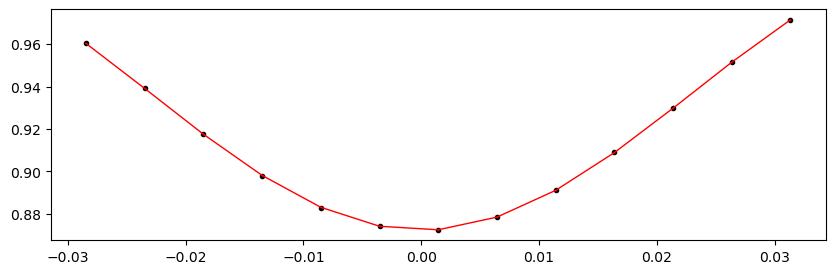

2455571.166343 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.44it/s]


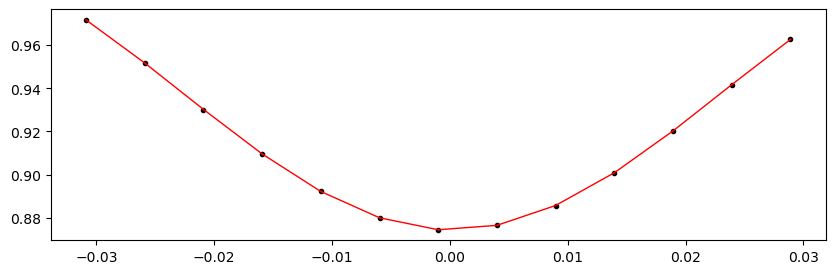

2455575.2672138 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.20it/s]


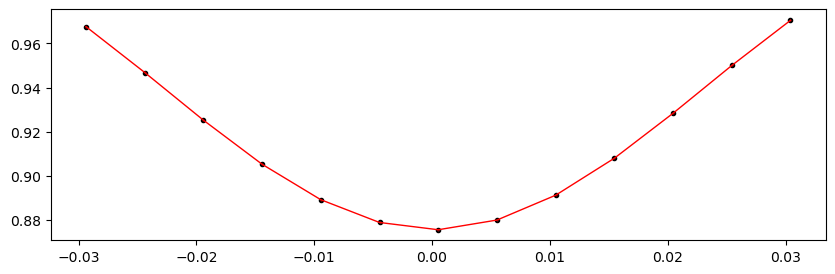

2455579.3680845997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.74it/s]


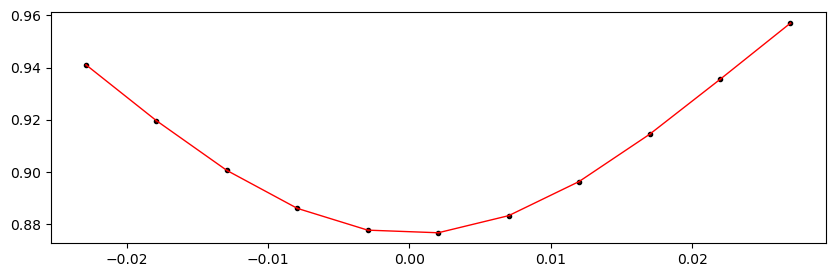

2455583.4689554 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.95it/s]


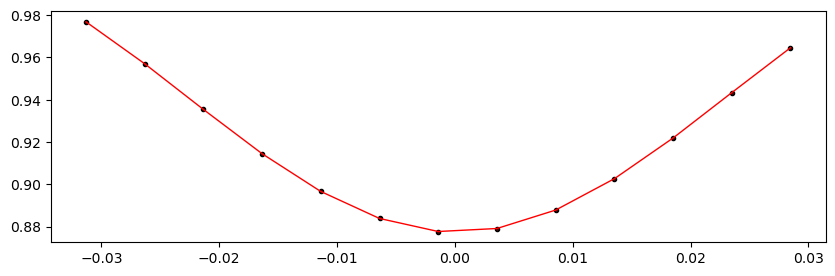

2455587.5698261997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.62it/s]


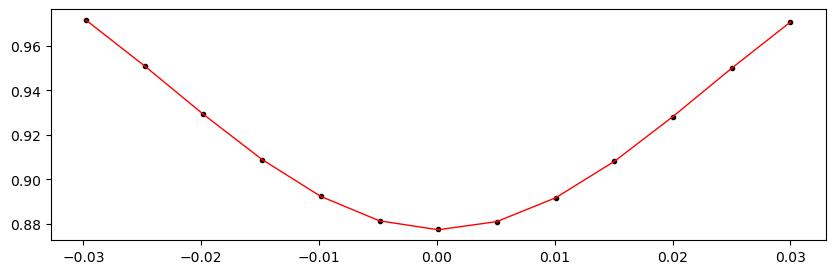

2455591.670697 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.00it/s]


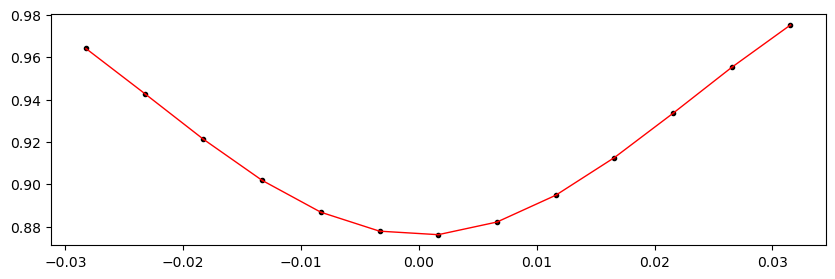

2455599.8724386 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.06it/s]


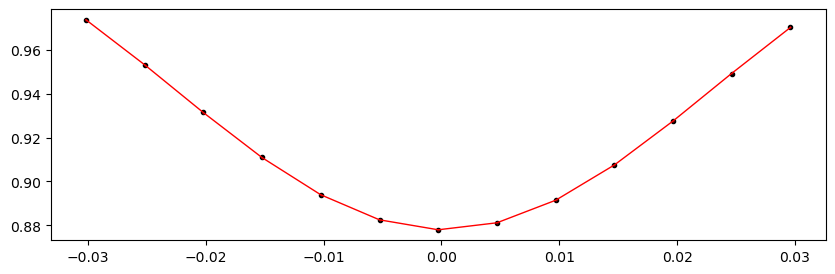

2455603.9733094 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.11it/s]


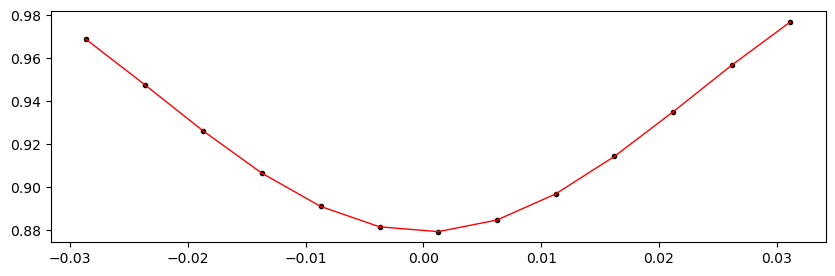

2455608.0741801998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.00it/s]


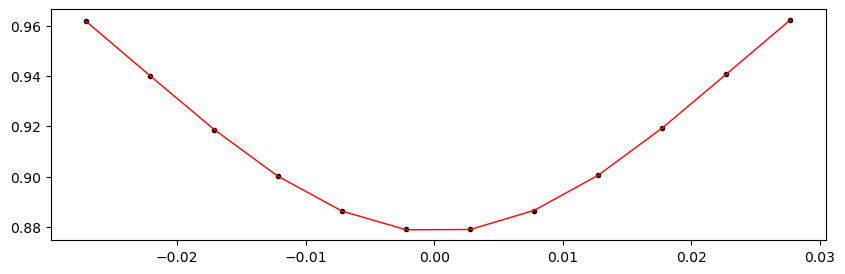

2455612.175051 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.06it/s]


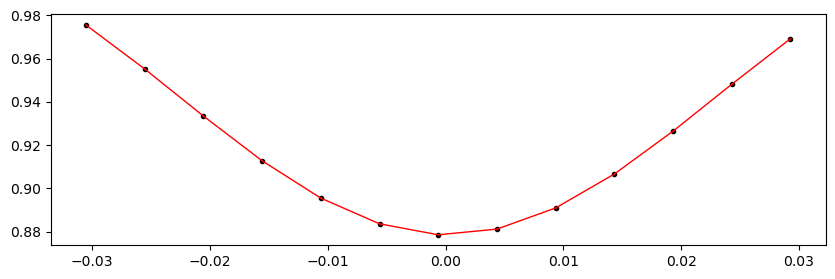

2455616.2759217997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.47it/s]


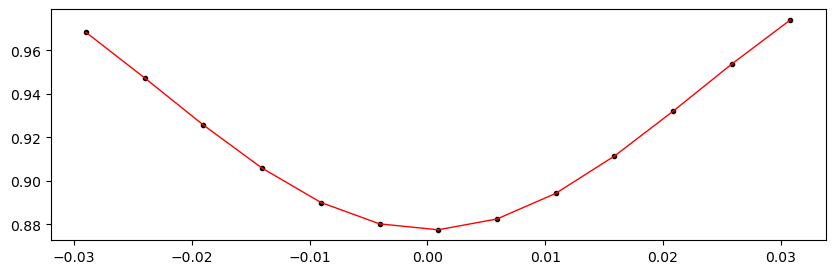

2455620.3767926 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.32it/s]


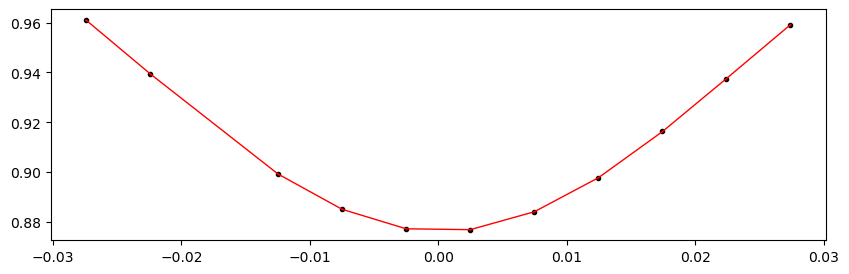

2455624.4776633997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.84it/s]


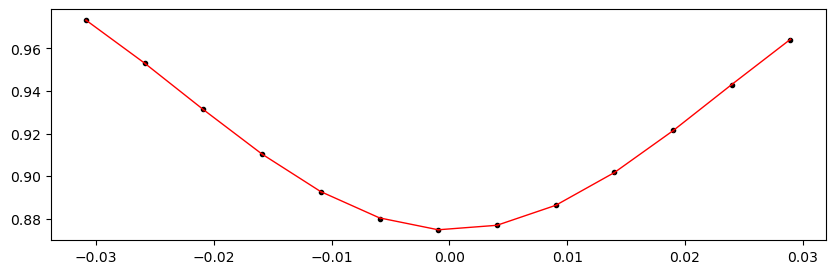

2455628.5785342 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.11it/s]


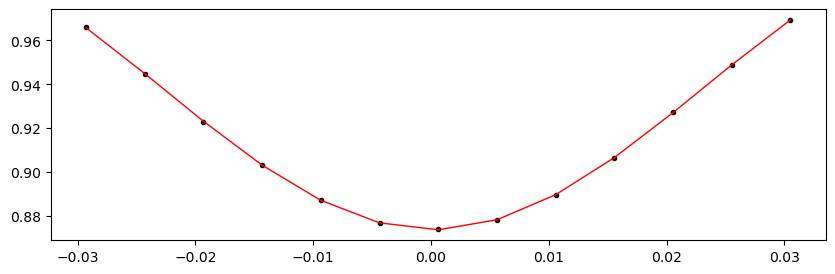

2455632.679405 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.68it/s]


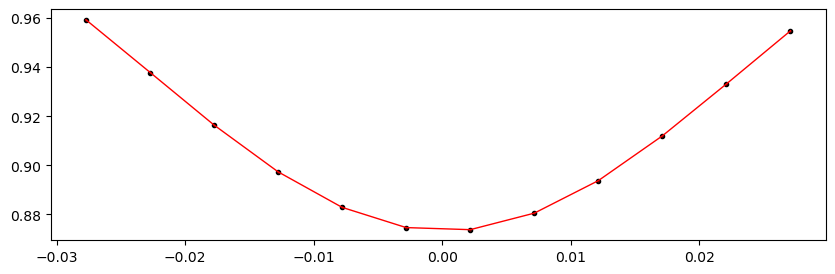

2455644.9820173997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.62it/s]


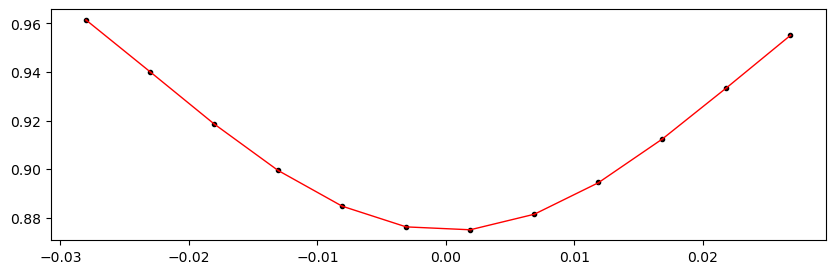

2455649.0828882 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.68it/s]


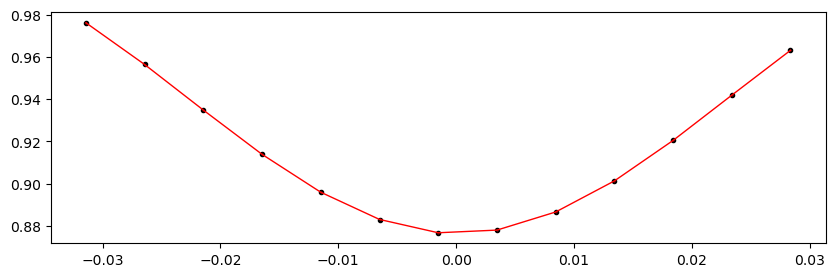

2455653.1837589997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.79it/s]


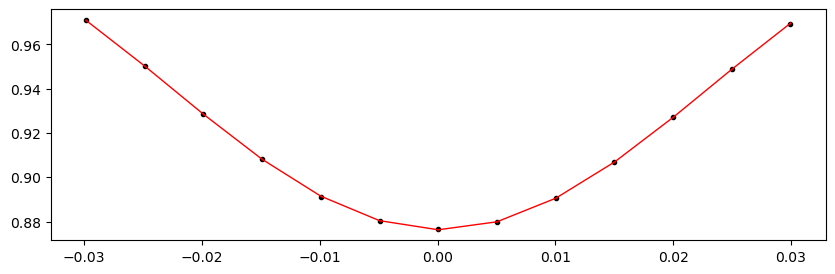

2455657.2846298 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.10it/s]


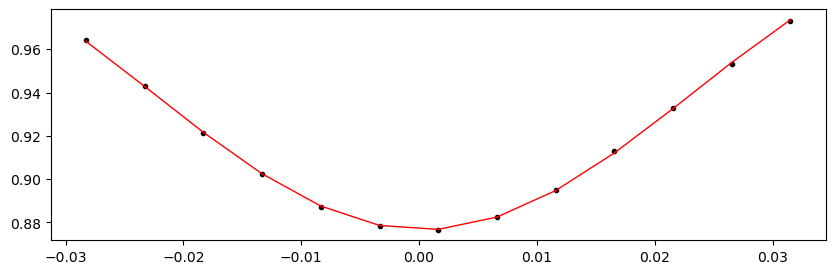

2455661.3855005996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.41it/s]


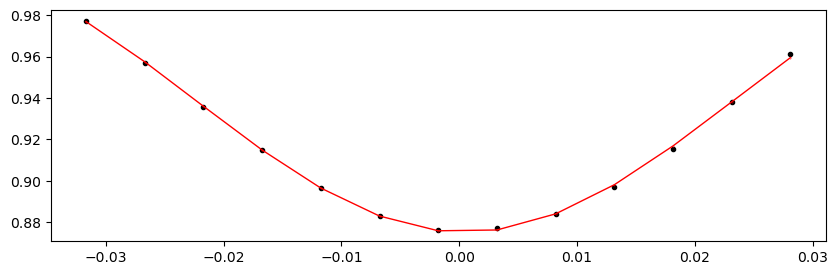

2455665.4863714 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.67it/s]


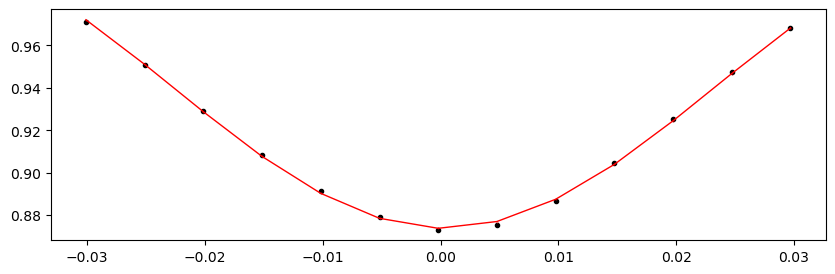

2455669.5872422 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.70it/s]


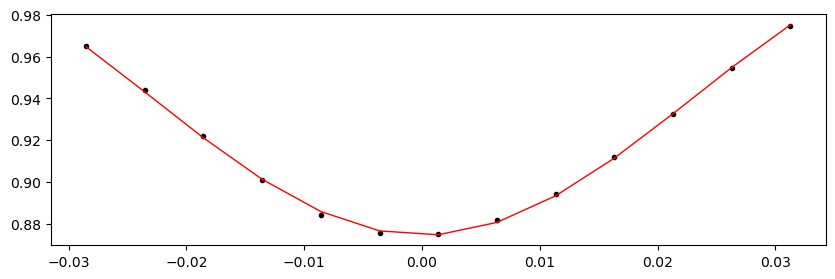

2455673.688113 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.24it/s]


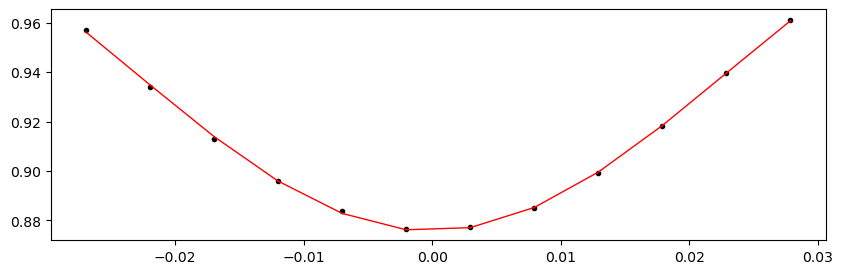

2455677.7889838 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.97it/s]


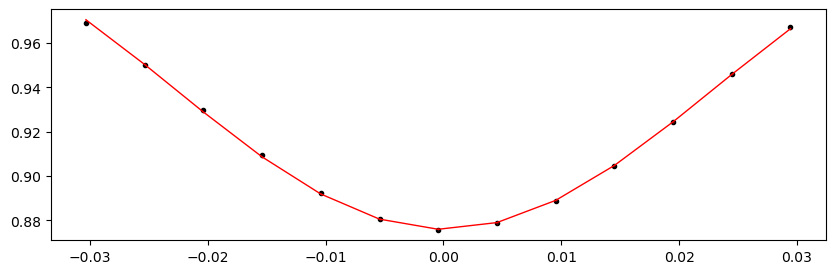

2455681.8898545997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.31it/s]


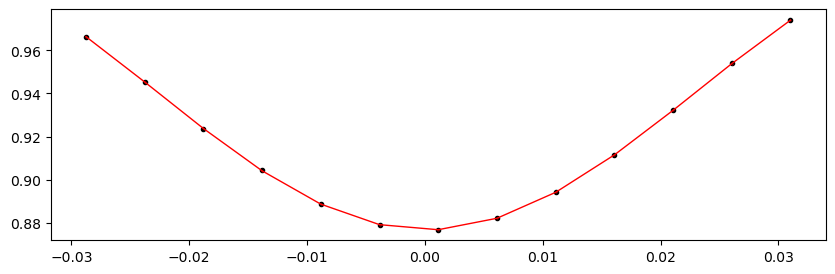

2455685.9907254 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.62it/s]


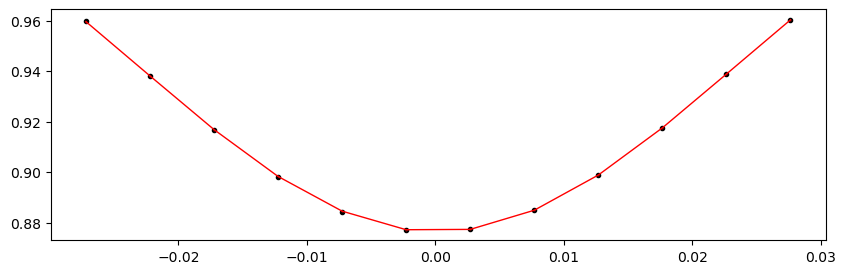

2455690.0915961997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.66it/s]


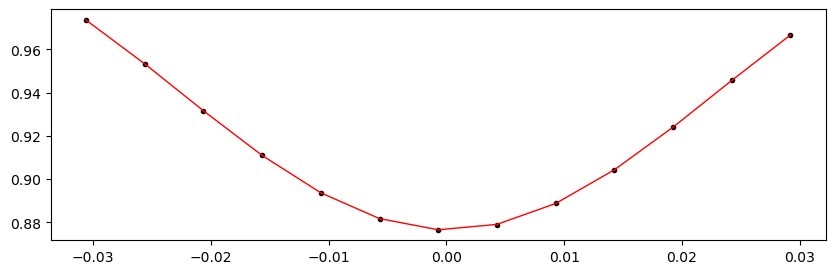

2455694.192467 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.66it/s]


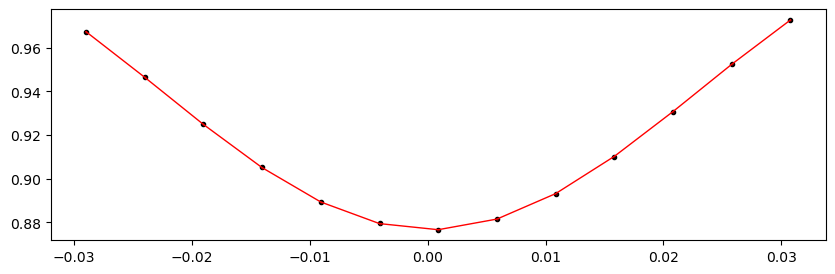

2455698.2933377996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.55it/s]


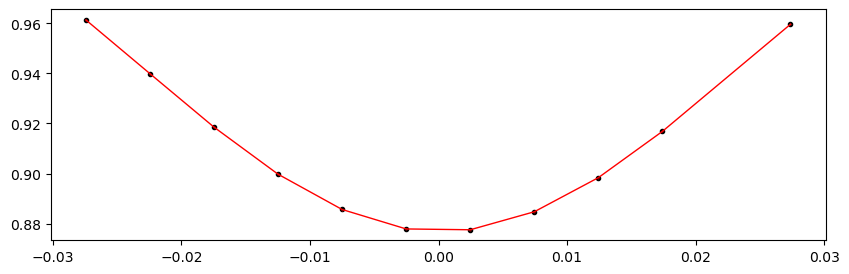

2455702.3942086 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.94it/s]


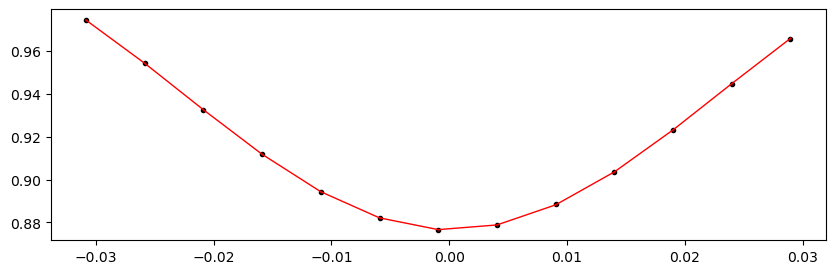

2455706.4950794 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.30it/s]


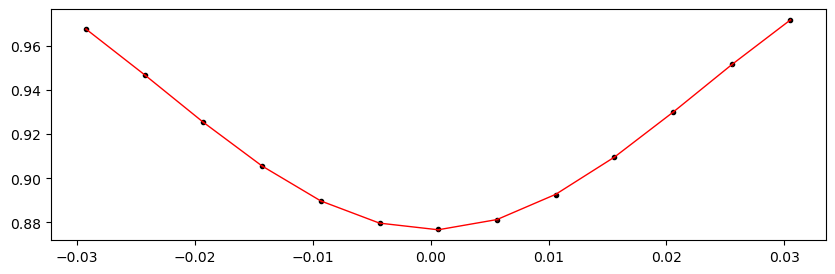

2455710.5959501998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.53it/s]


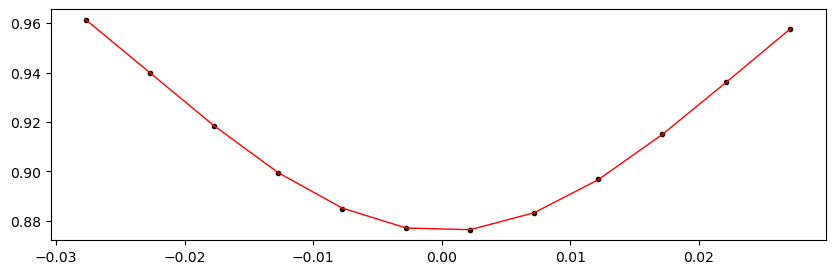

2455714.696821 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.59it/s]


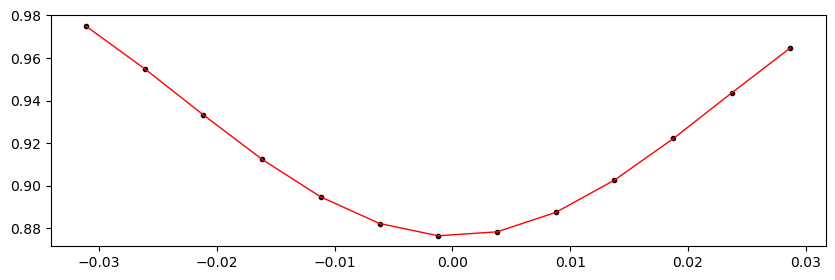

2455718.7976917997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.25it/s]


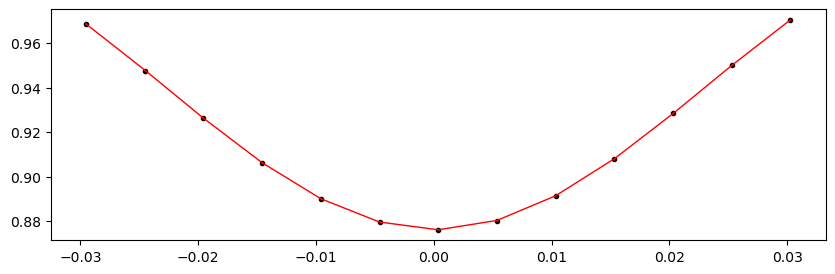

2455722.8985626 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.49it/s]


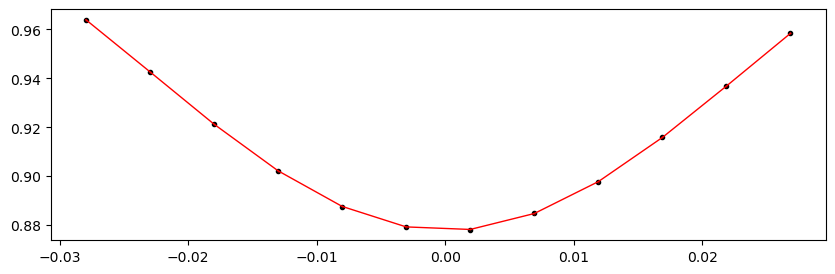

2455726.9994333996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.18it/s]


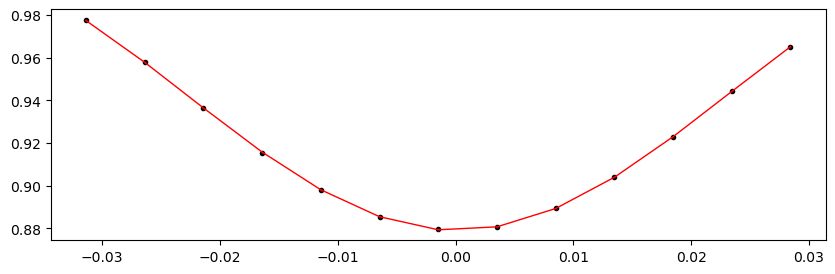

2455731.1003042 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.24it/s]


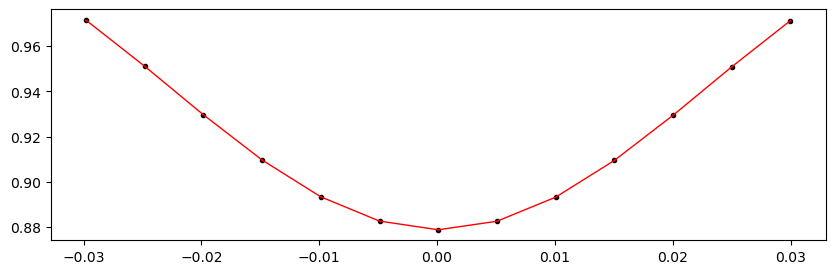

2455735.201175 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.58it/s]


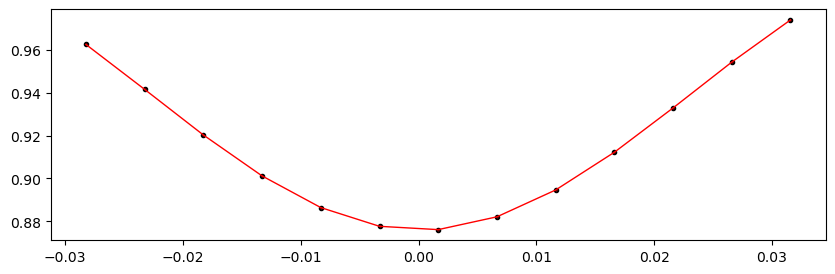

2455743.4029166 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.90it/s]


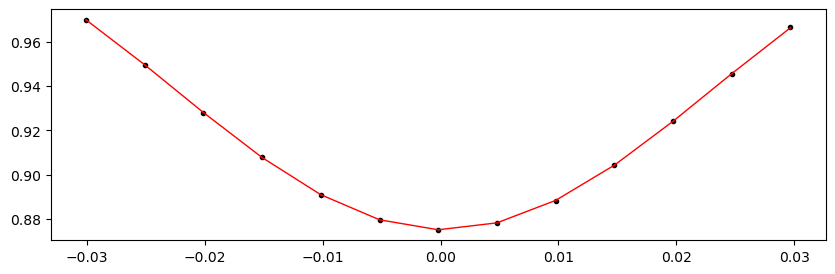

2455747.5037873997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.99it/s]


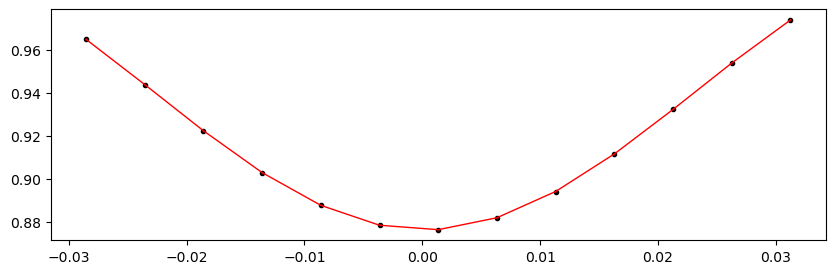

2455751.6046582 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.09it/s]


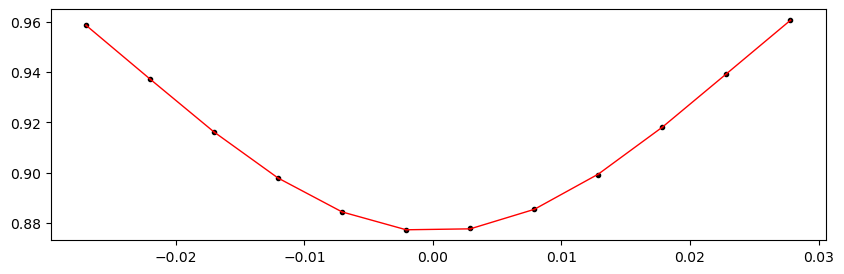

2455755.7055289997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.21it/s]


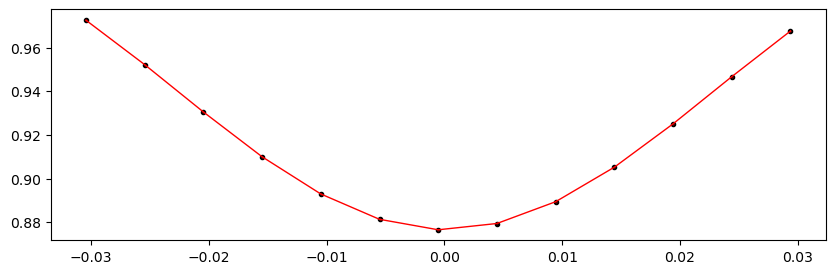

2455759.8063998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 360.26it/s]


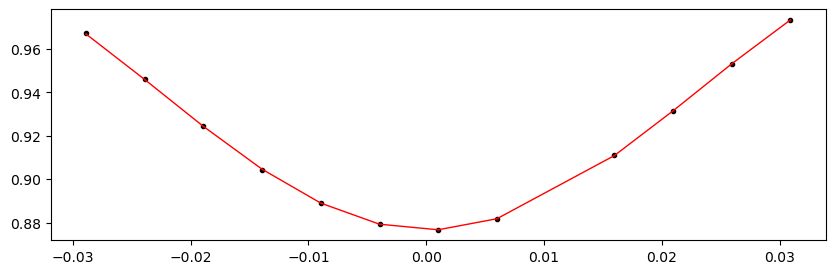

2455763.9072705996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.97it/s]


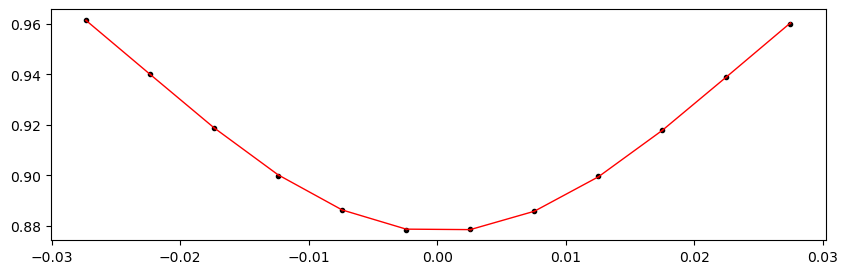

2455768.0081414 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.92it/s]


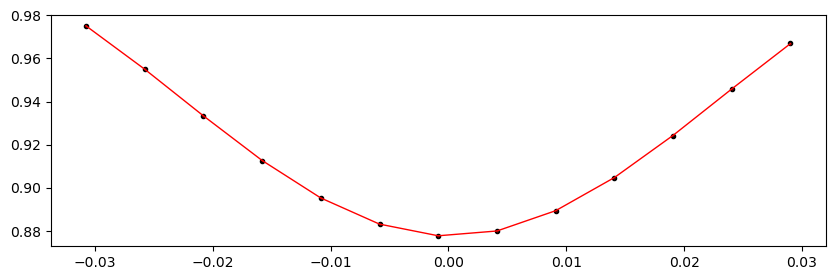

2455772.1090122 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.09it/s]


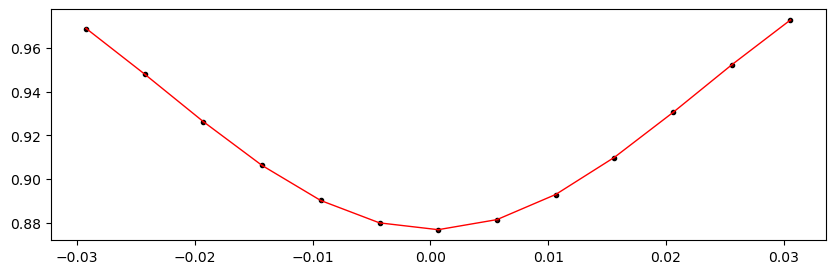

2455776.209883 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.59it/s]


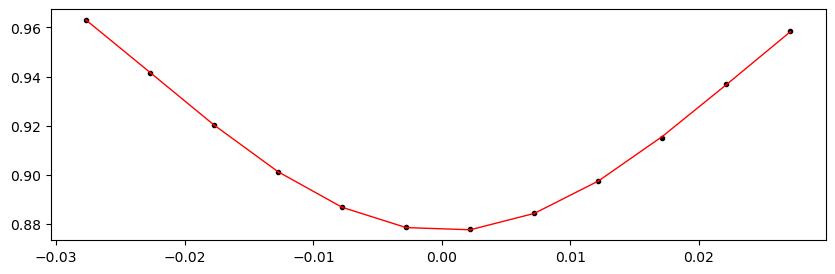

2455780.3107538 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.85it/s]


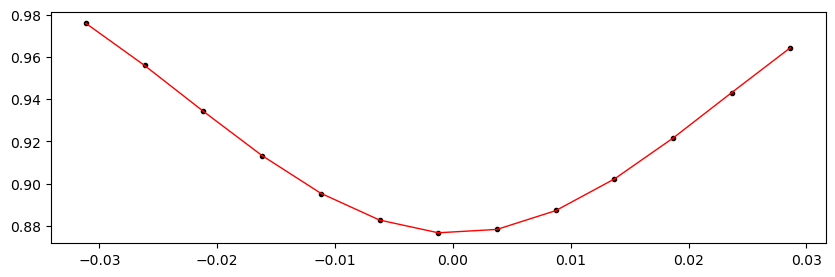

2455784.4116245997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.36it/s]


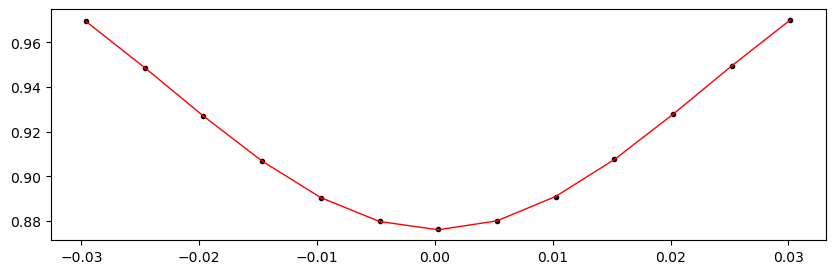

2455788.5124954 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.79it/s]


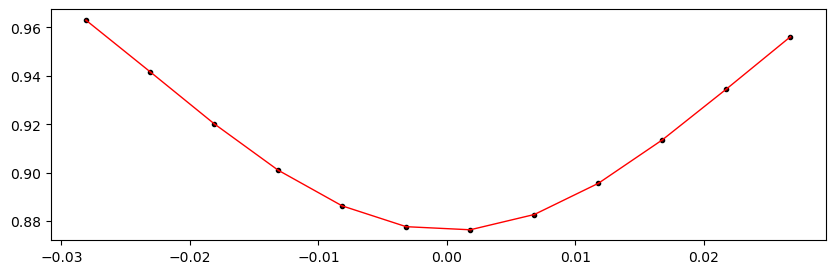

2455792.6133661997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.37it/s]


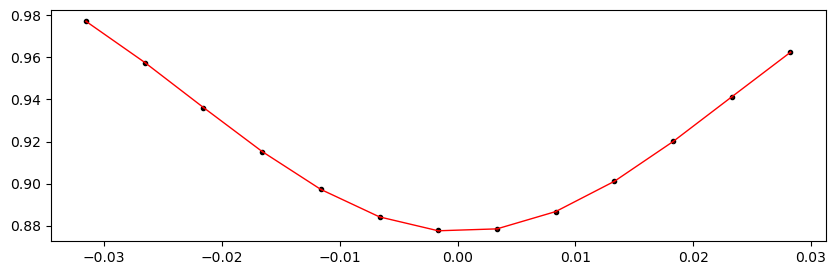

2455796.714237 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.91it/s]


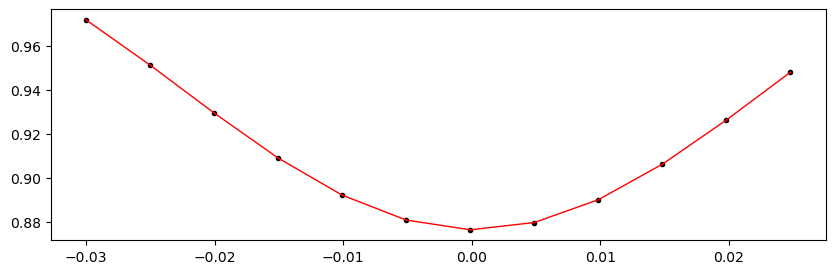

2455800.8151077996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.52it/s]


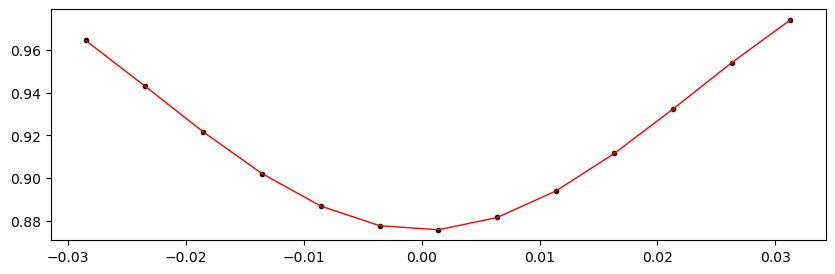

2455804.9159786 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.56it/s]


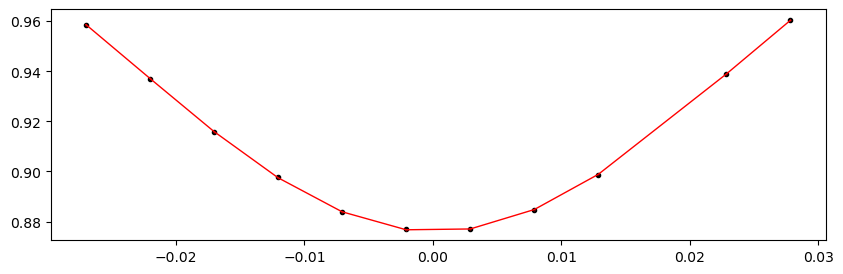

2455809.0168494 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.30it/s]


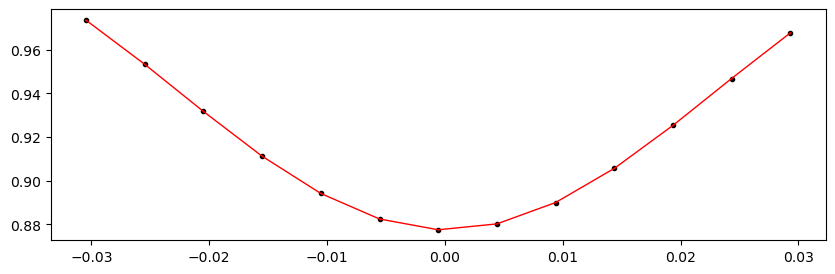

2455813.1177201997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.86it/s]


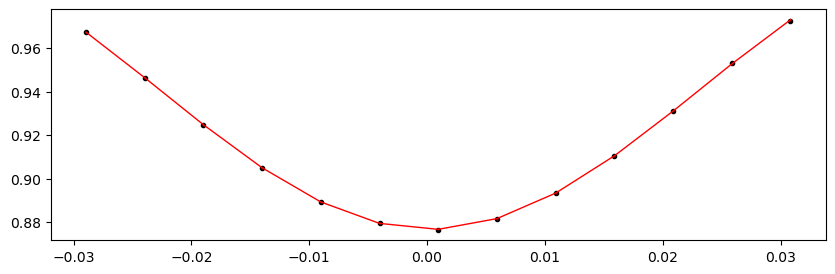

2455817.218591 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.71it/s]


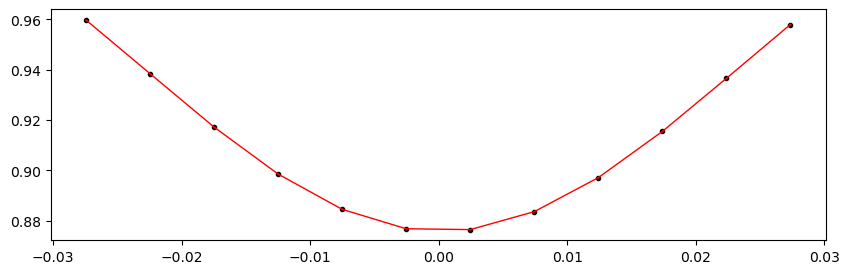

2455821.3194617997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.33it/s]


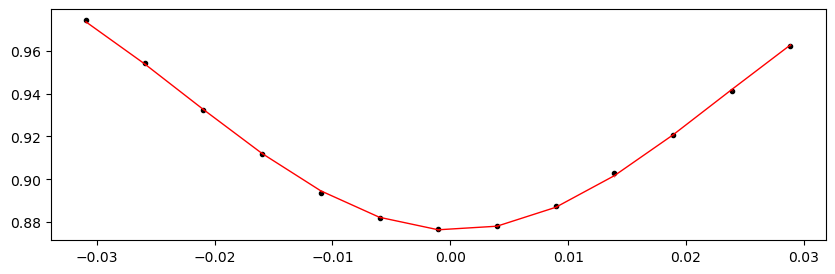

2455825.4203326 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.91it/s]


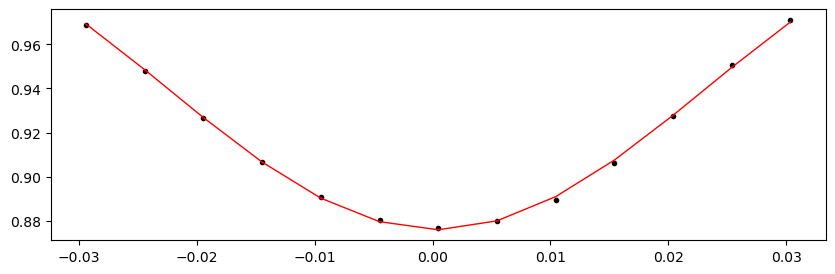

2455829.5212033996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.98it/s]


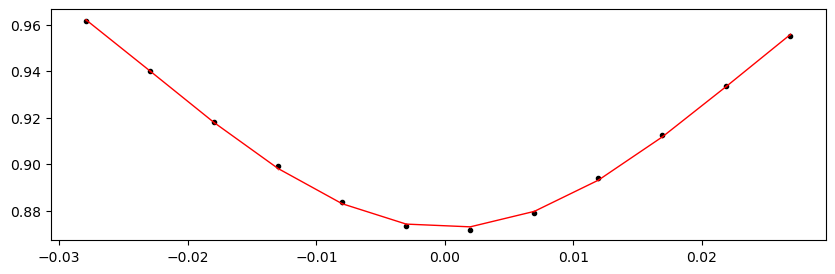

2455837.722945 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.46it/s]


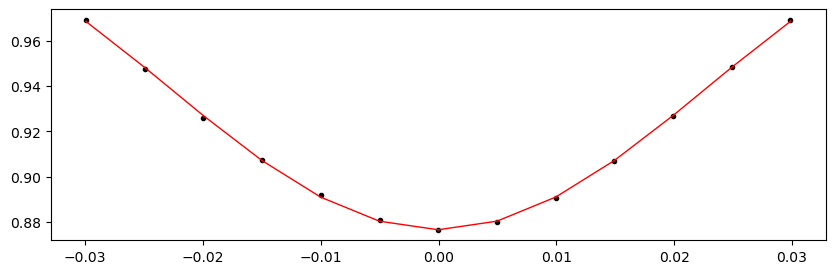

2455841.8238158 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.33it/s]


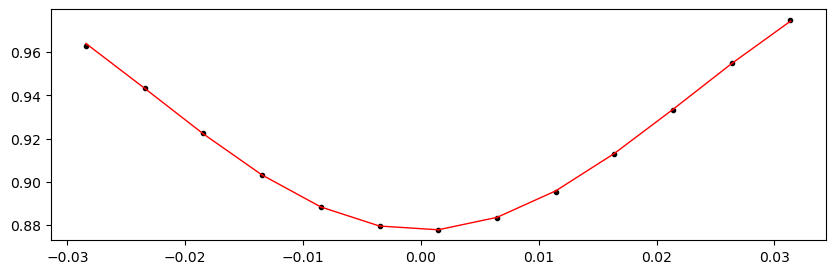

2455845.9246866 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.38it/s]


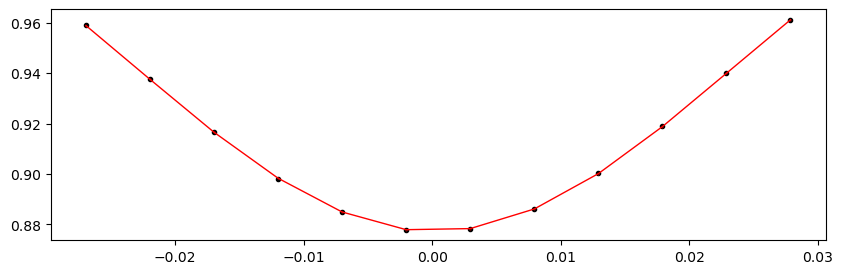

2455850.0255573997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.90it/s]


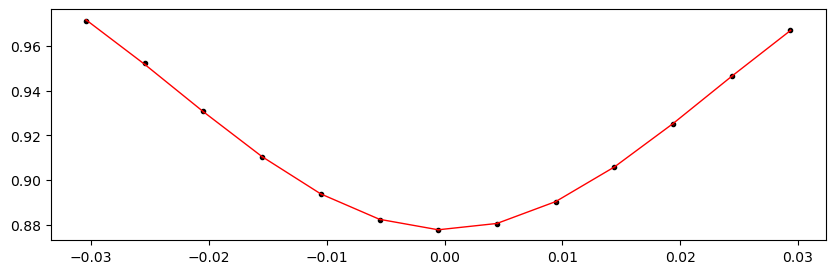

2455854.1264282 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.11it/s]


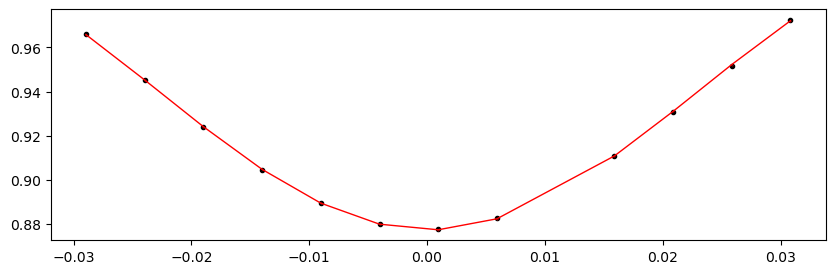

2455858.2272989997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.57it/s]


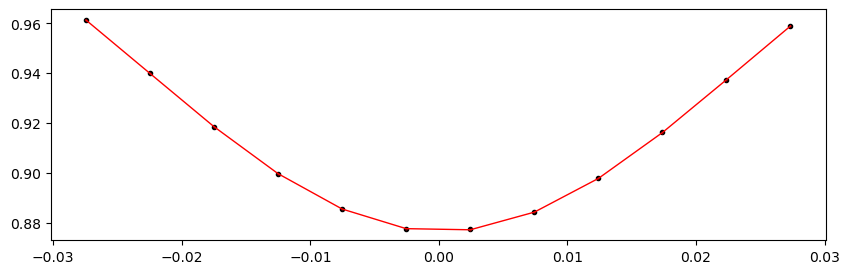

2455862.3281698 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.45it/s]


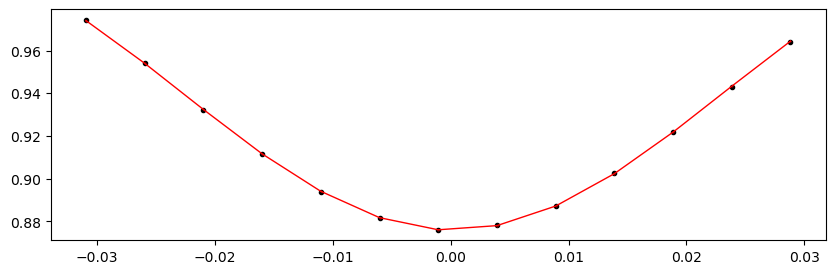

2455866.4290405996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.27it/s]


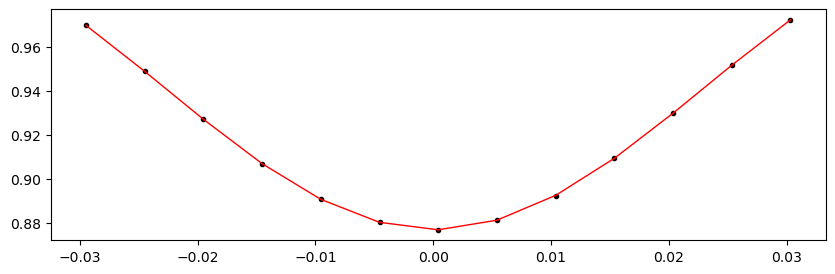

2455870.5299114 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.07it/s]


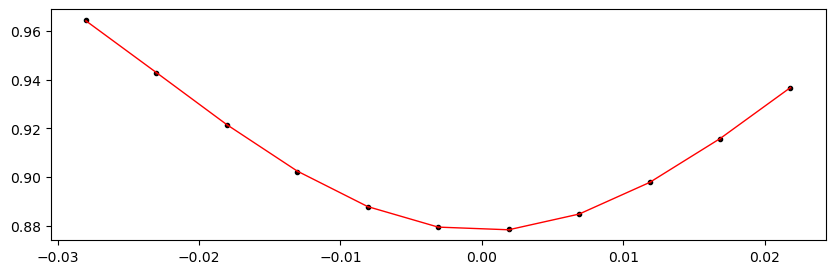

2455874.6307822 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.79it/s]


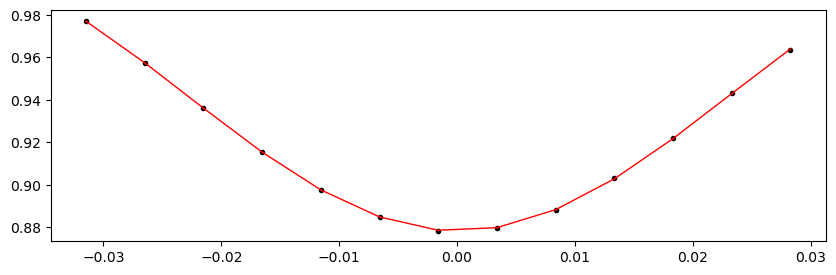

2455878.7316529998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.72it/s]


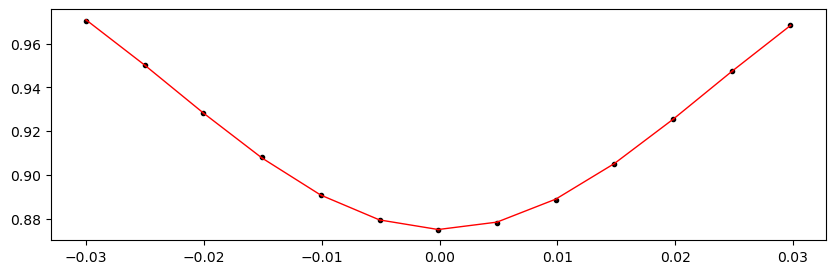

2455882.8325238 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.64it/s]


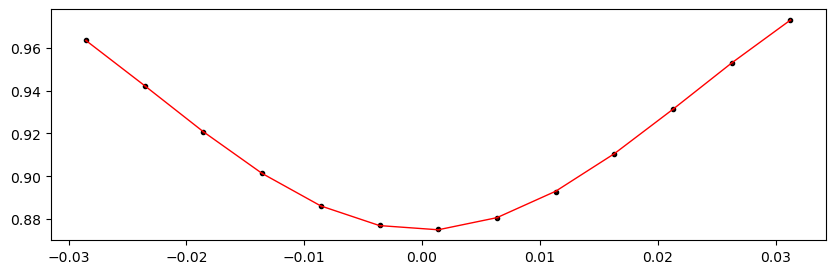

2455886.9333945997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.30it/s]


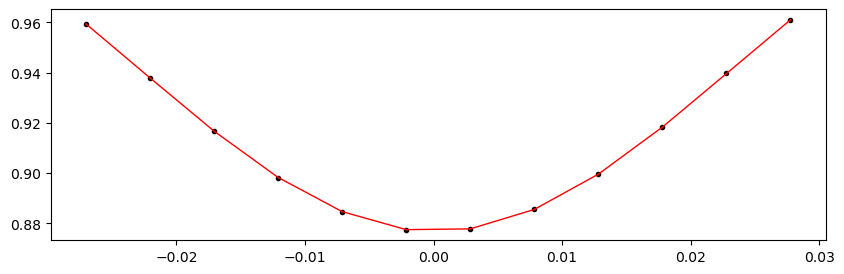

2455891.0342654 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.92it/s]


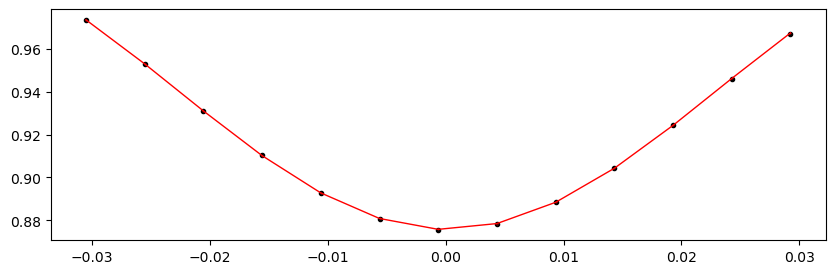

2455895.1351361996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.00it/s]


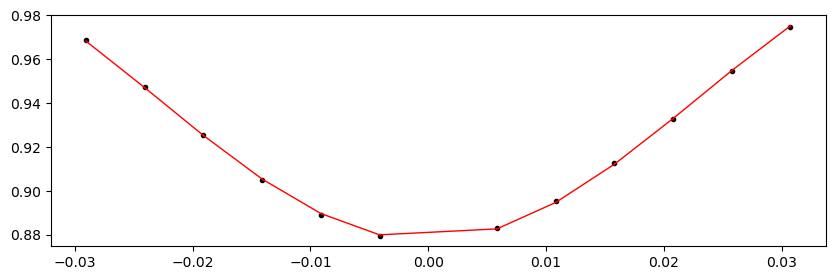

2455899.236007 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.04it/s]


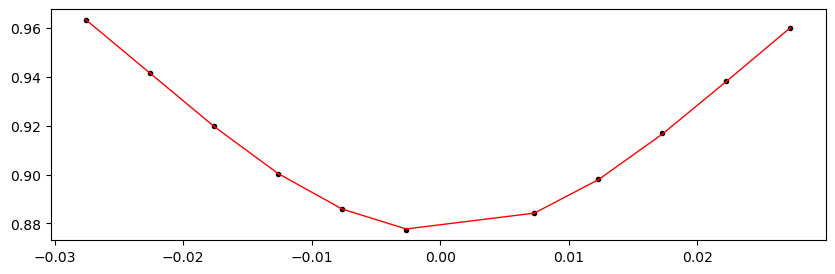

2455907.4377486 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.56it/s]


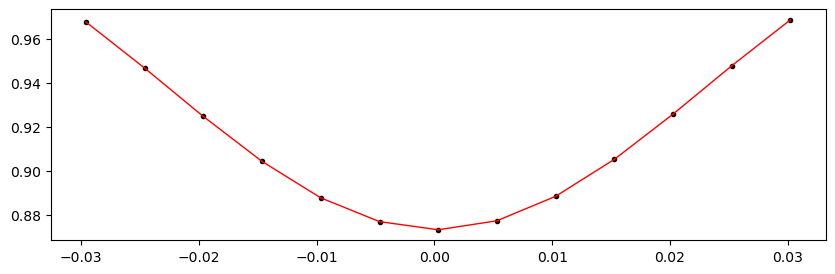

2455911.5386194 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.07it/s]


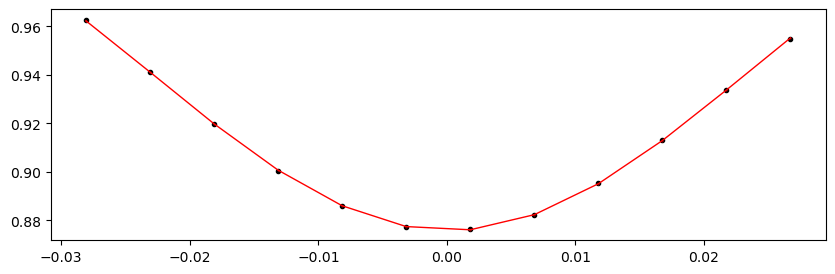

2455915.6394901997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.41it/s]


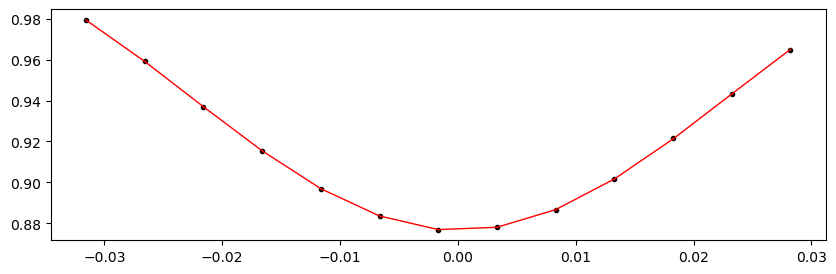

2455919.740361 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.90it/s]


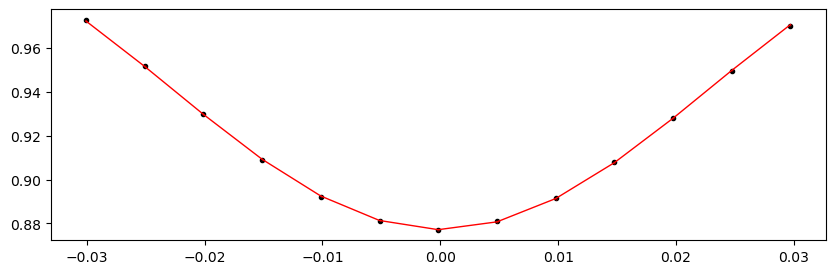

2455923.8412317997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.48it/s]


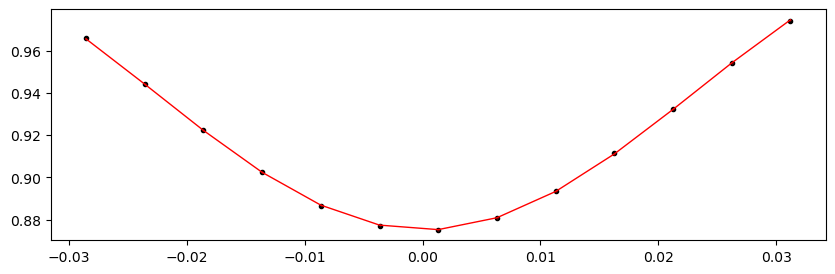

2455927.9421026 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.71it/s]


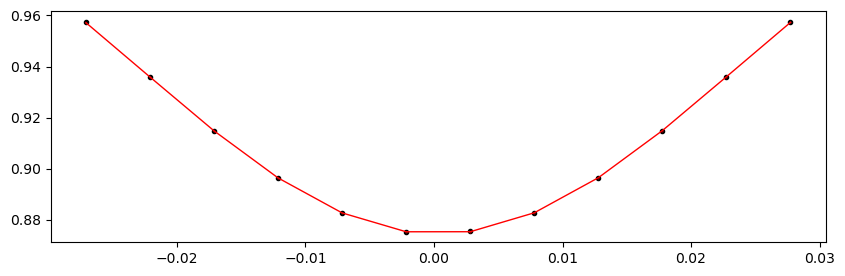

2455936.1438442 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.00it/s]


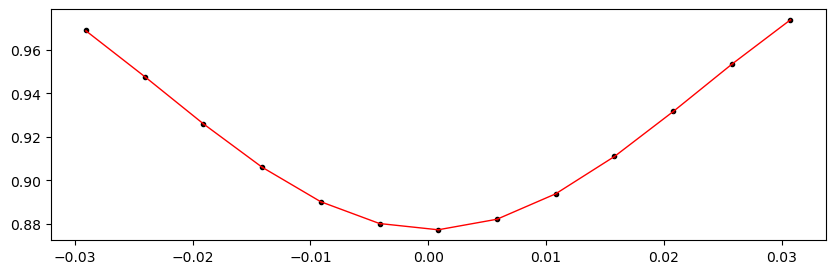

2455940.244715 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.14it/s]


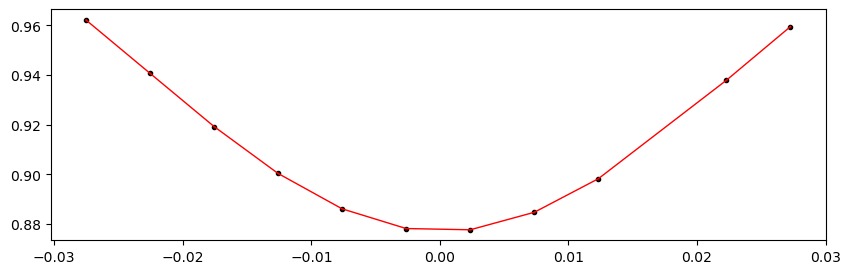

2455944.3455858 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.13it/s]


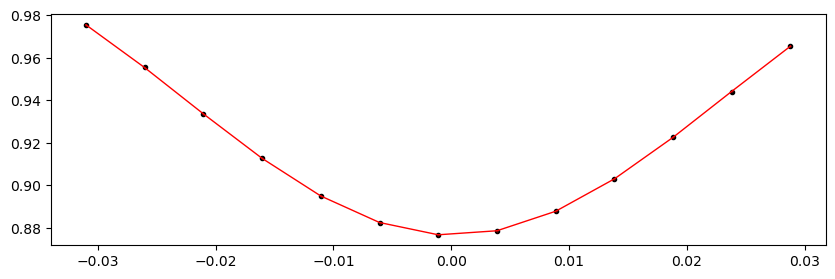

2455948.4464566 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.80it/s]


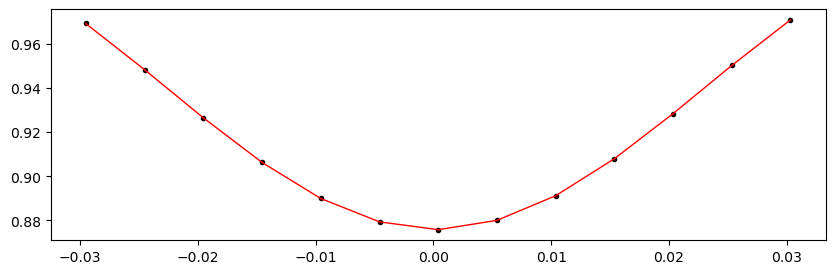

2455952.5473273997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.05it/s]


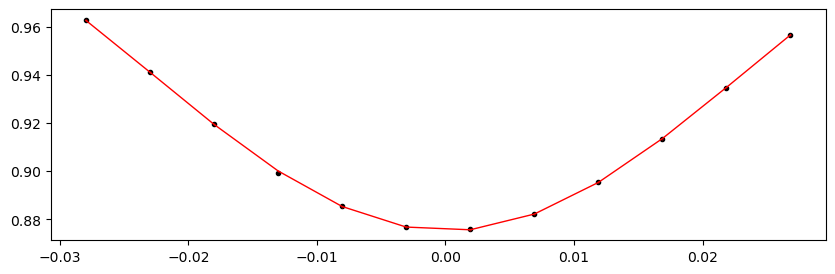

2455956.6481982 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.90it/s]


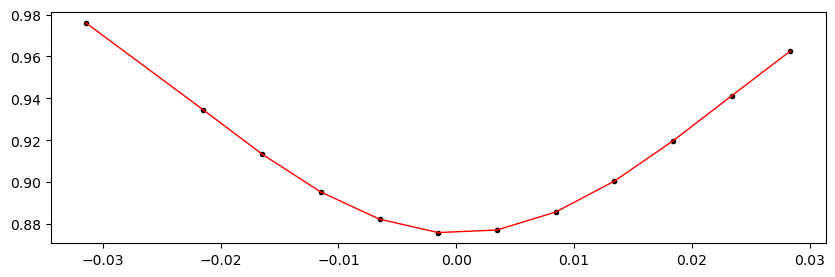

2455960.7490689997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.59it/s]


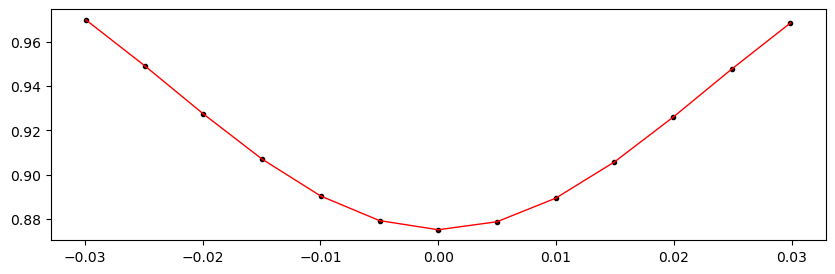

2455964.8499398 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.55it/s]


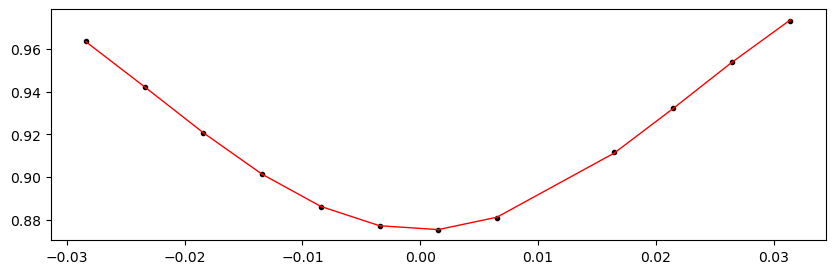

2455968.9508105996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.26it/s]


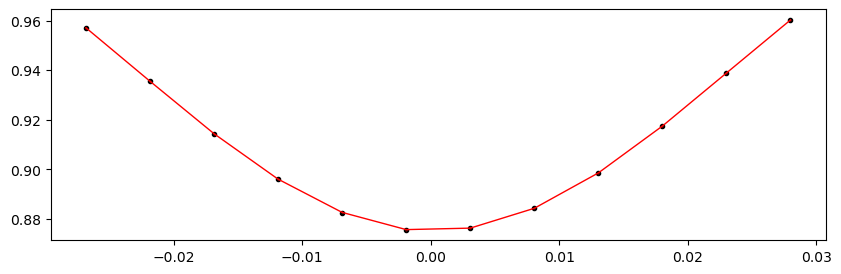

2455973.0516814 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.32it/s]


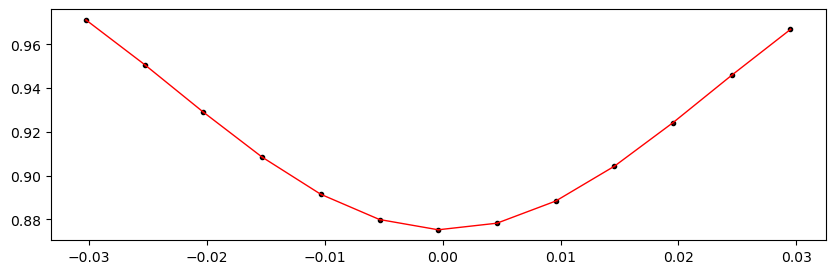

2455977.1525522 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.29it/s]


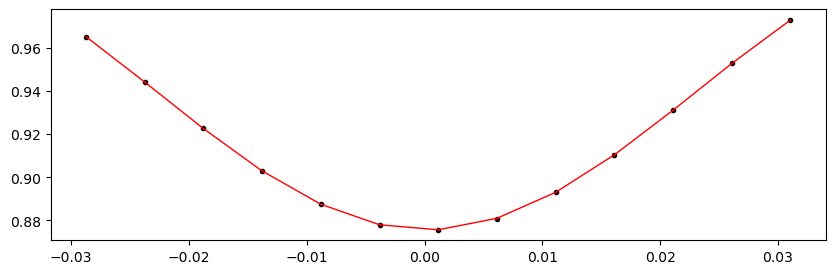

2455981.2534229998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.73it/s]


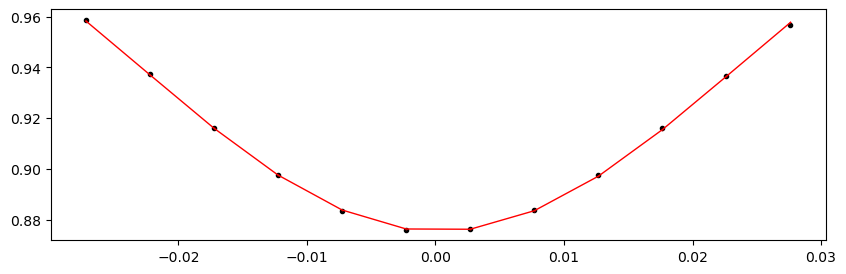

2455985.3542938 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.79it/s]


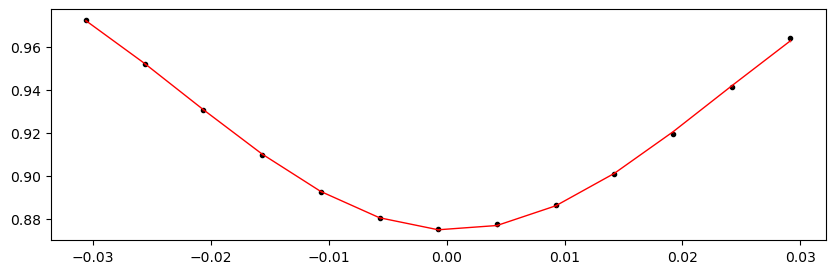

2455989.4551645997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.55it/s]


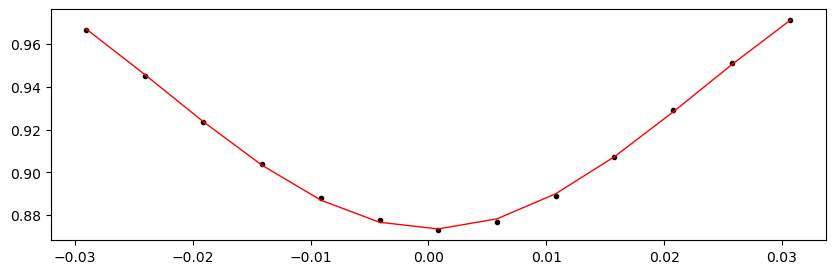

Time 2455993.5560354 does not have enough data points: 5
2456001.757777 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.71it/s]


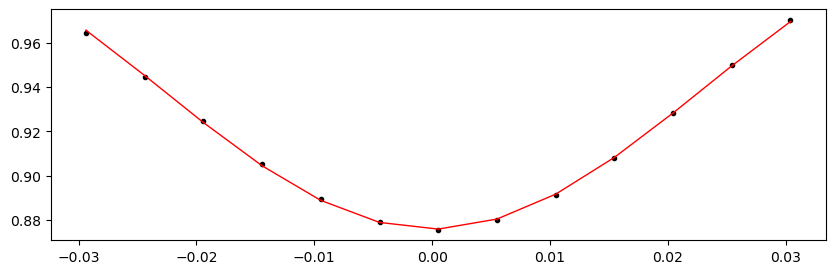

2456005.8586478 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 338.25it/s]


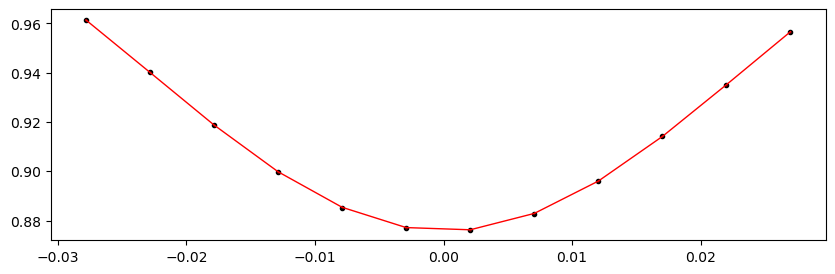

2456009.9595186 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.79it/s]


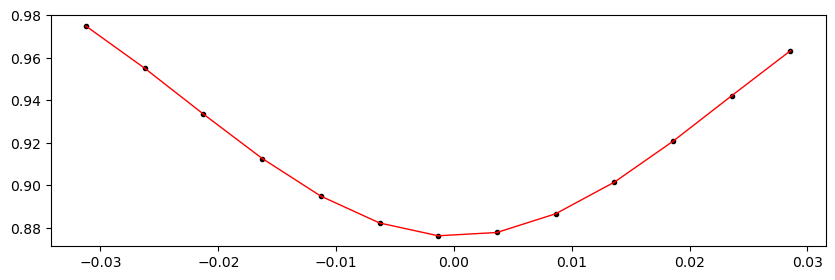

2456014.0603894 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 347.60it/s]


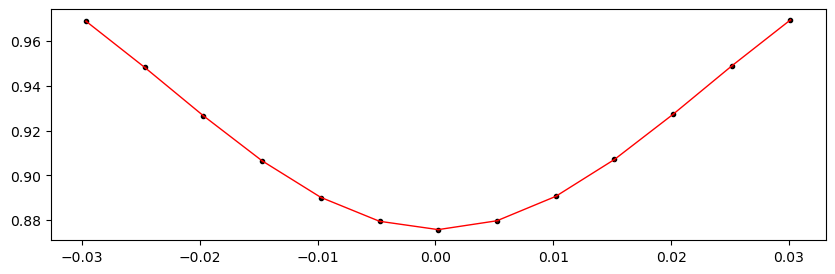

2456018.1612601997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.68it/s]


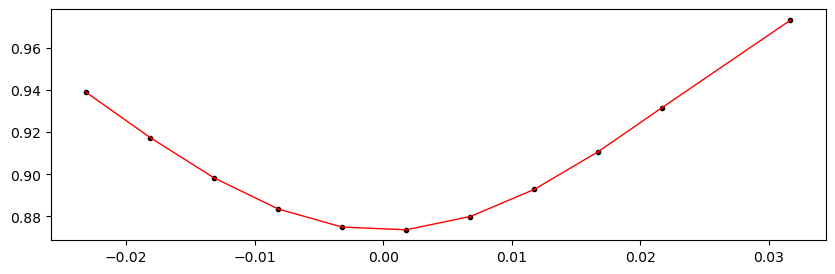

2456022.262131 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.76it/s]


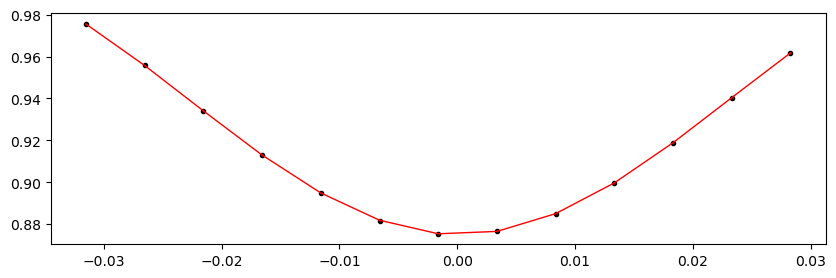

2456026.3630017997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.16it/s]


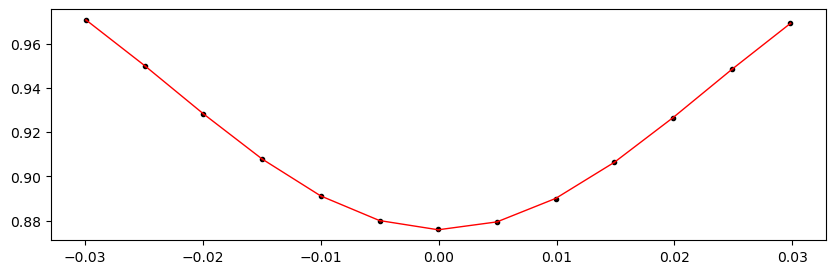

2456030.4638726 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.14it/s]


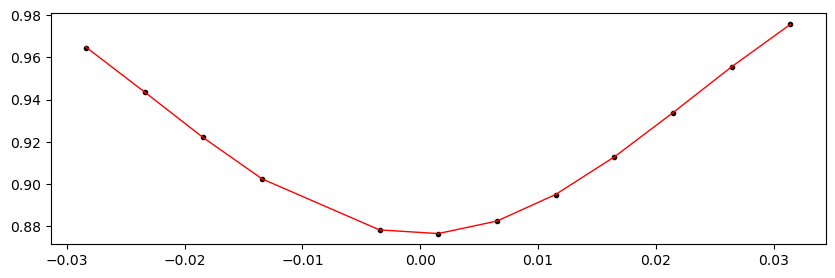

2456034.5647433996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.81it/s]


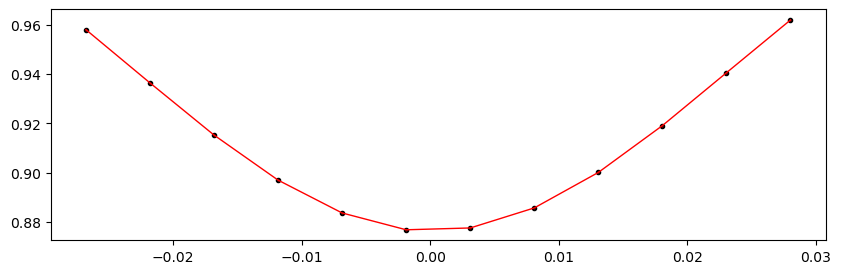

2456038.6656142 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.73it/s]


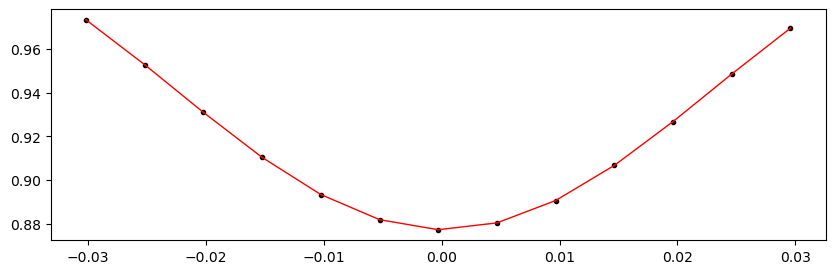

2456042.766485 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.68it/s]


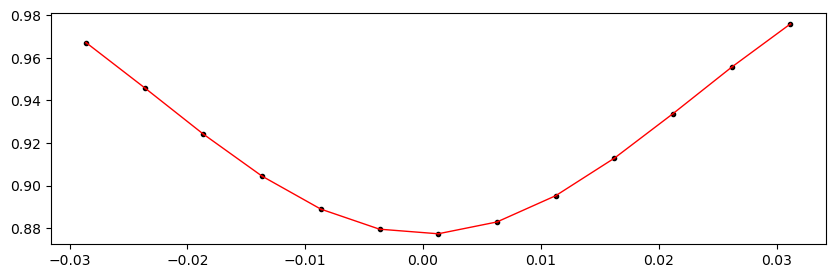

2456046.8673558 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.72it/s]


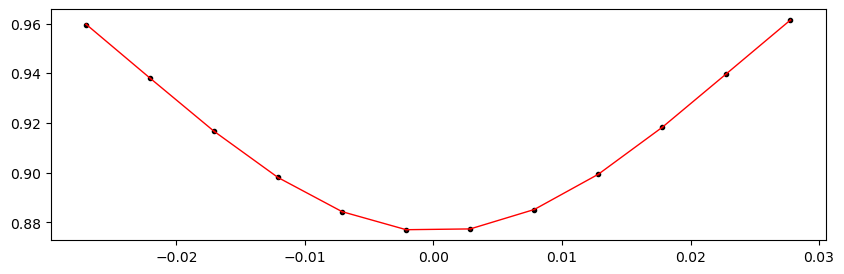

2456050.9682266 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.19it/s]


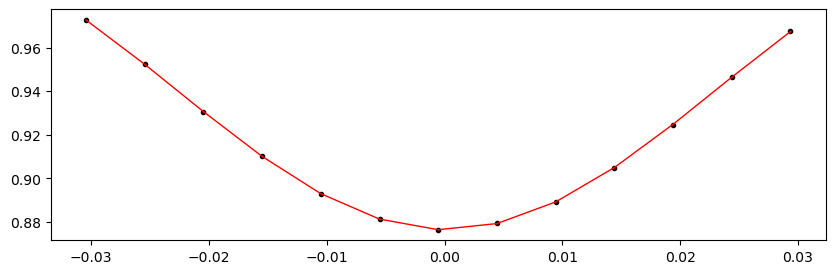

2456055.0690973997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 408.95it/s]


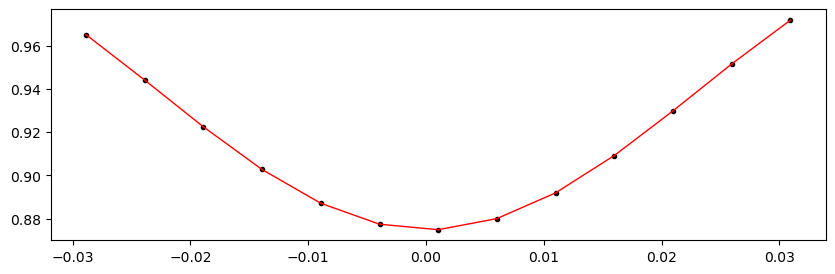

2456059.1699682 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.10it/s]


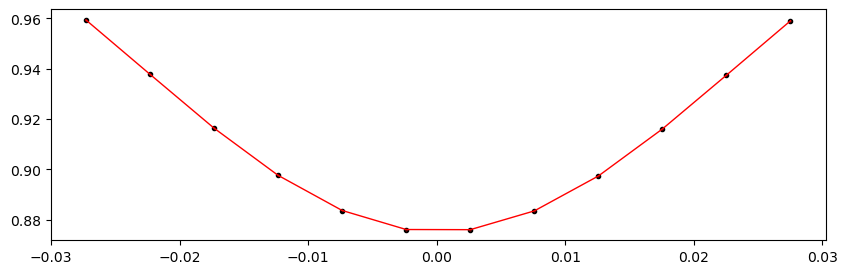

2456063.2708389997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.12it/s]


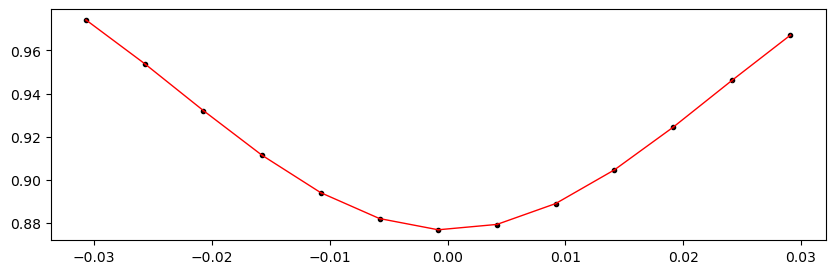

2456067.3717098 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.54it/s]


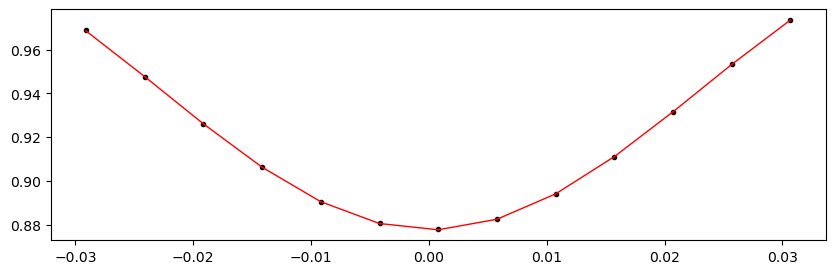

2456071.4725806 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.36it/s]


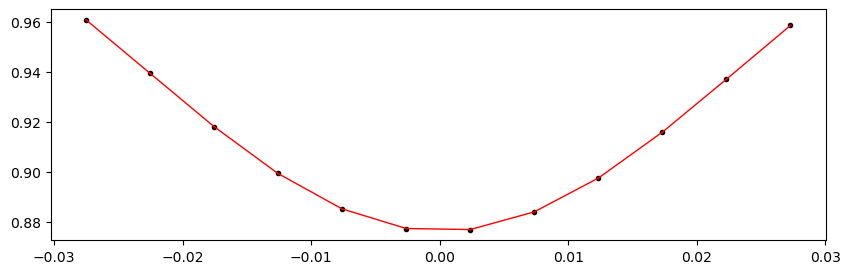

2456075.5734514 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.28it/s]


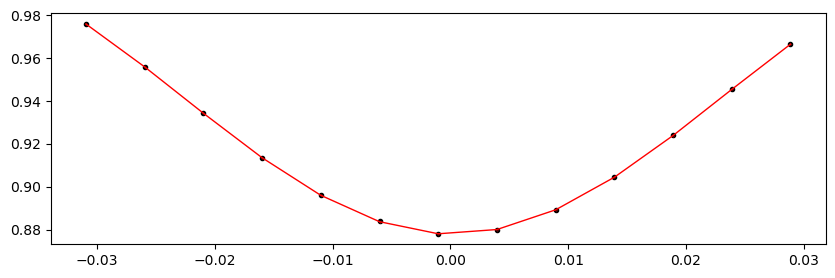

2456079.6743222 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.17it/s]


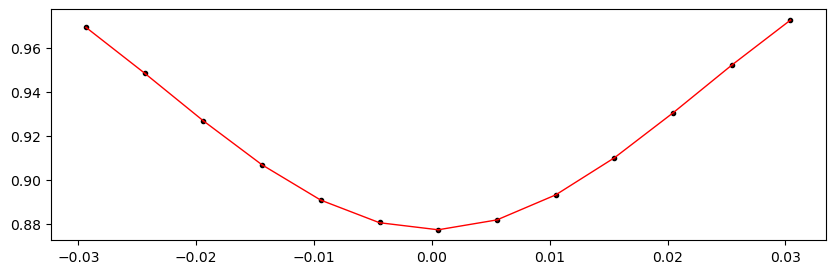

2456083.7751929997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.05it/s]


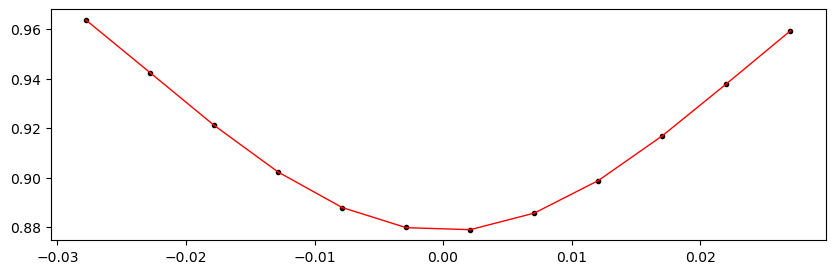

2456087.8760638 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.66it/s]


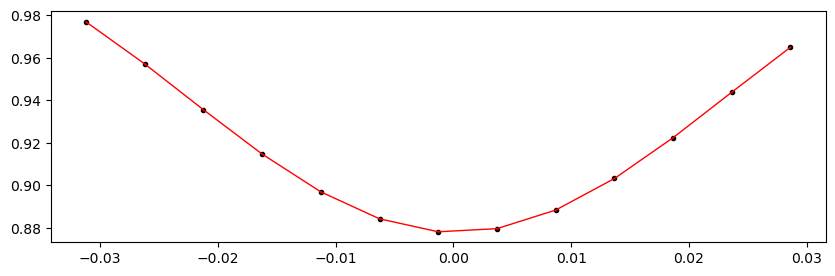

2456091.9769345997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.51it/s]


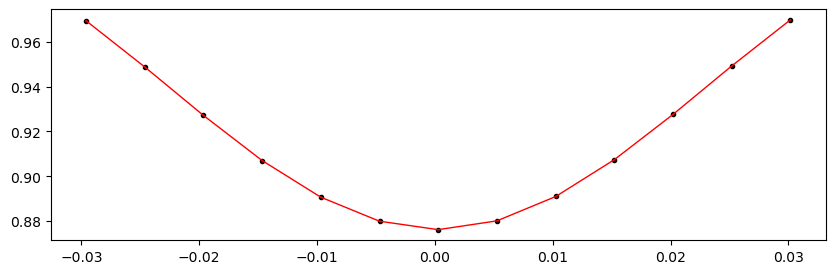

2456096.0778054 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.35it/s]


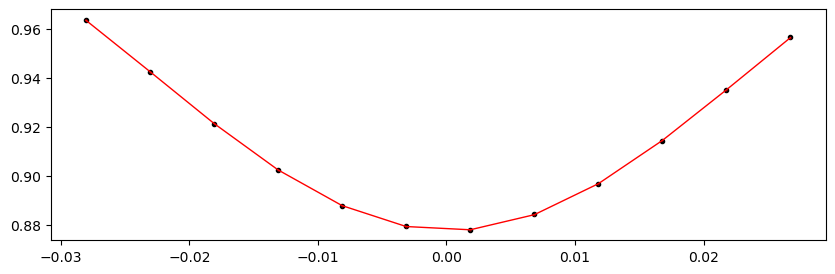

2456100.1786761996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.36it/s]


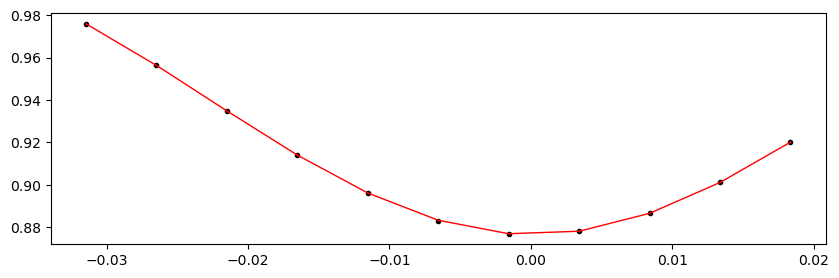

2456104.279547 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.34it/s]


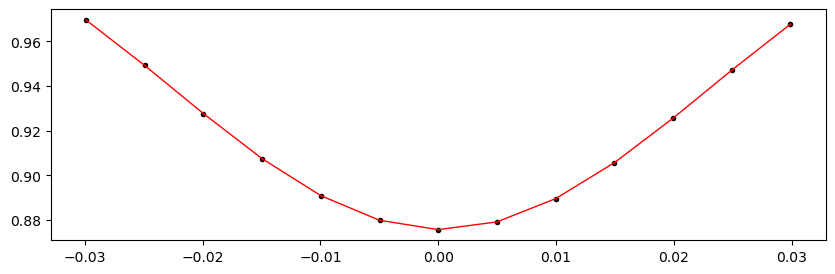

2456108.3804178 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.60it/s]


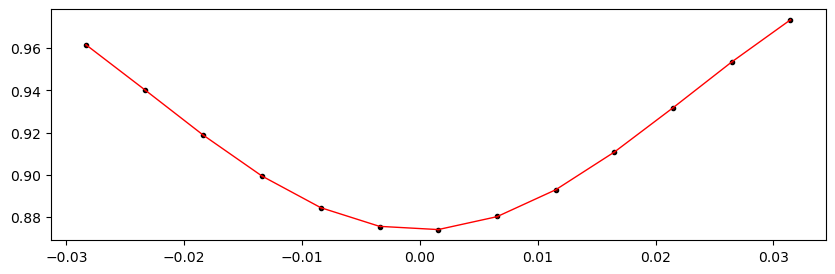

2456112.4812886 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.25it/s]


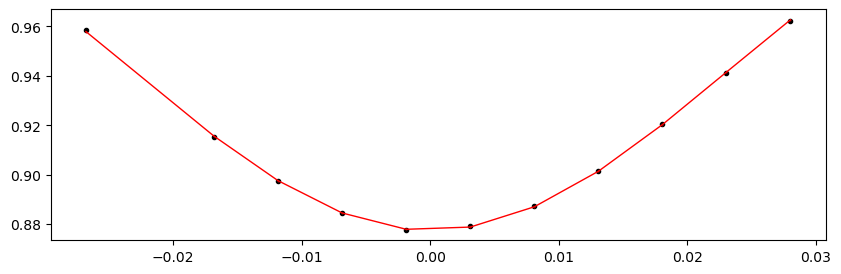

2456116.5821594 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.03it/s]


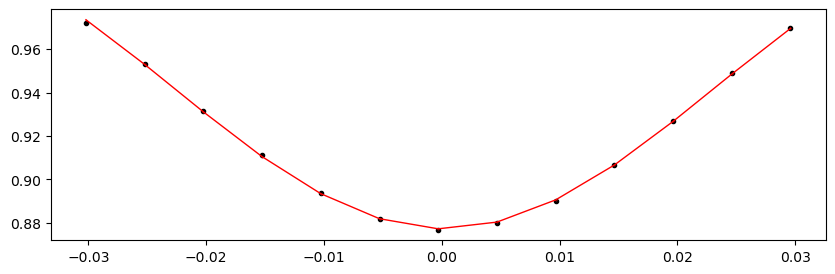

2456120.6830301997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.38it/s]


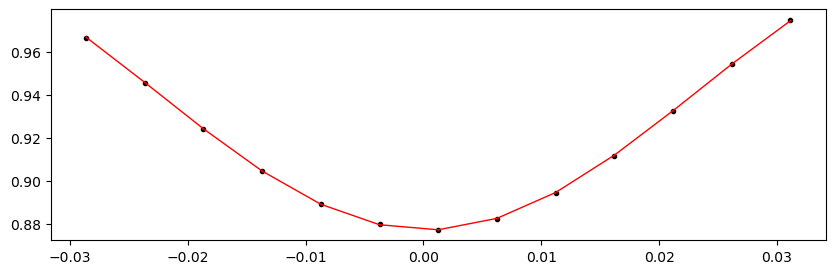

2456132.9856426 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.48it/s]


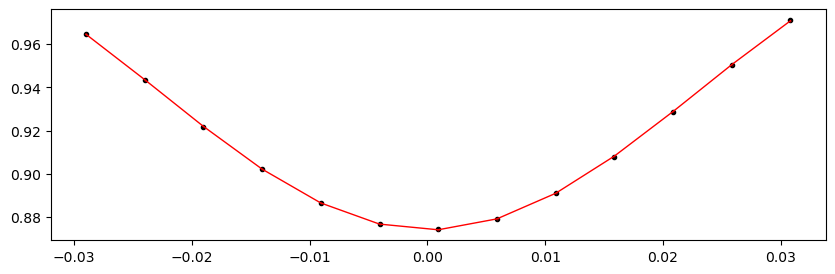

2456137.0865133996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.49it/s]


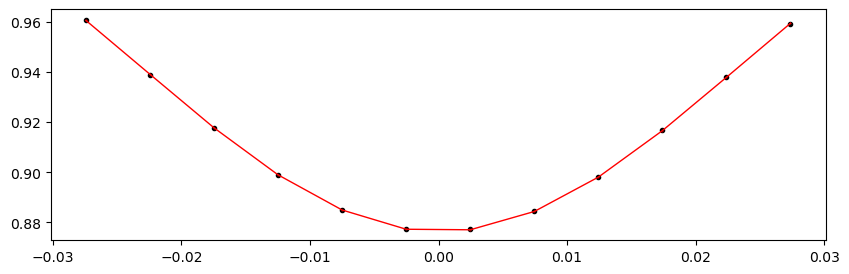

2456141.1873842 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.65it/s]


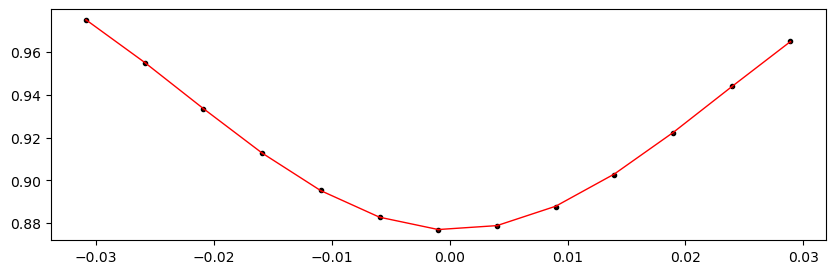

2456145.288255 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.52it/s]


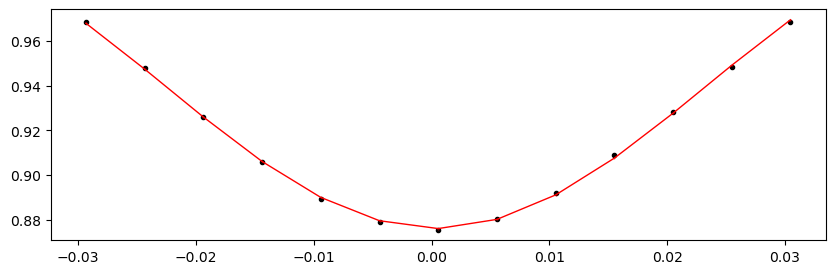

2456149.3891257998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.14it/s]


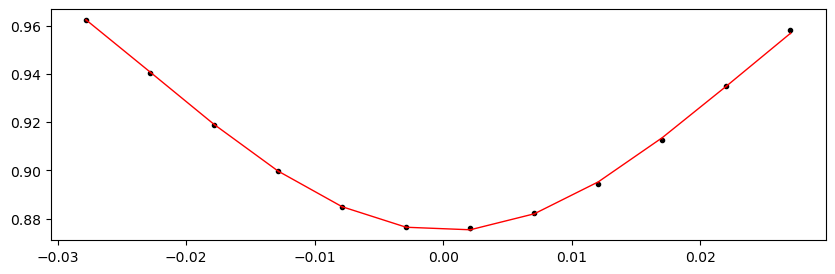

2456153.4899966 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.91it/s]


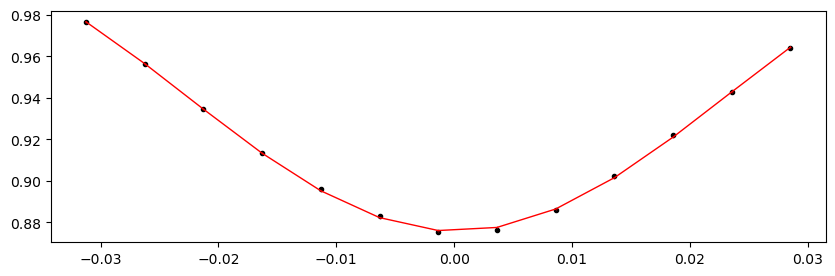

2456157.5908673997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.41it/s]


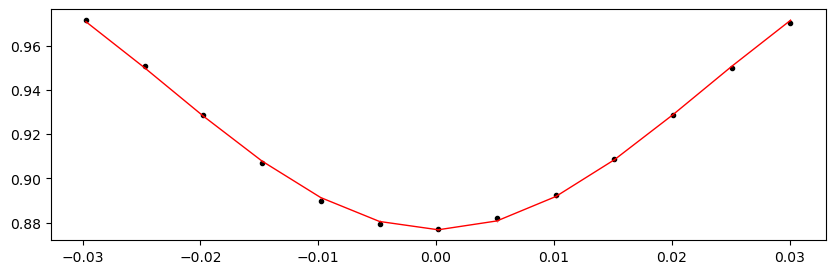

2456161.6917382 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.14it/s]


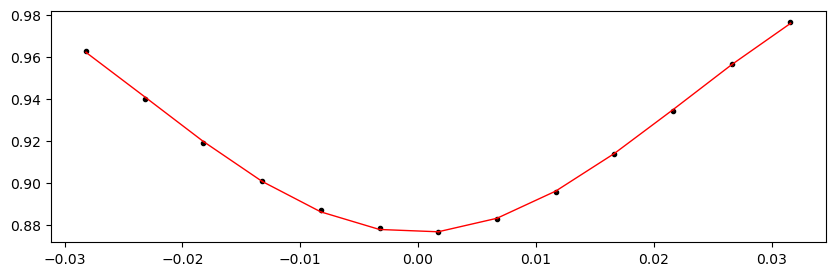

2456165.7926089996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.89it/s]


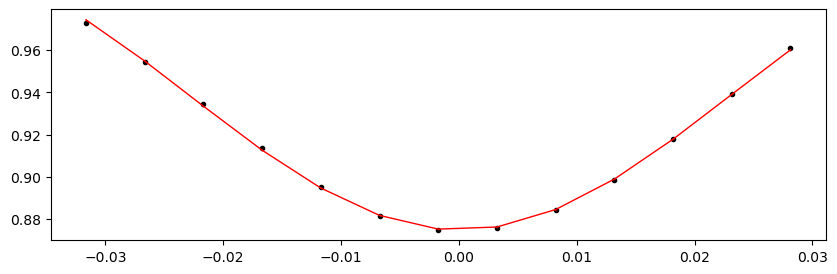

2456173.9943506 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.49it/s]


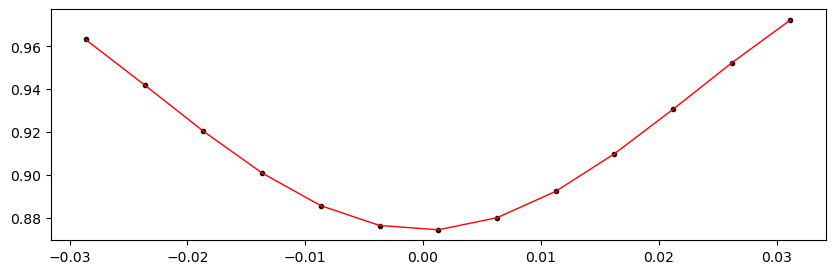

2456178.0952214 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.28it/s]


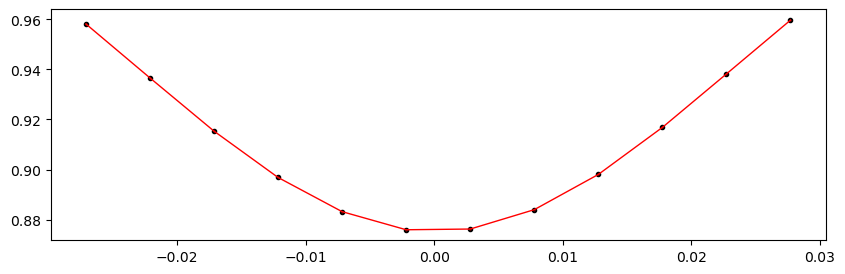

2456182.1960922 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.48it/s]


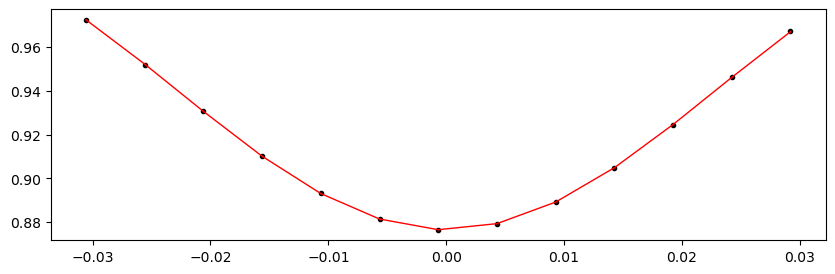

2456186.2969629997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.58it/s]


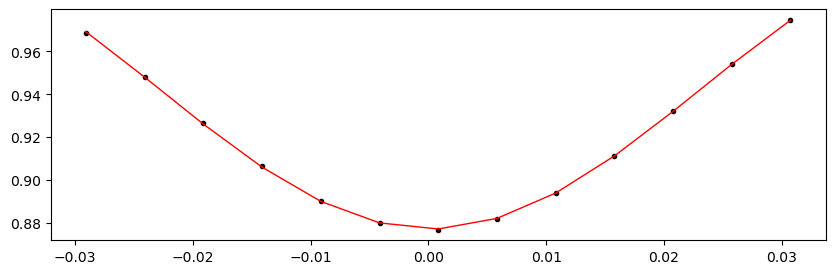

2456190.3978338 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.04it/s]


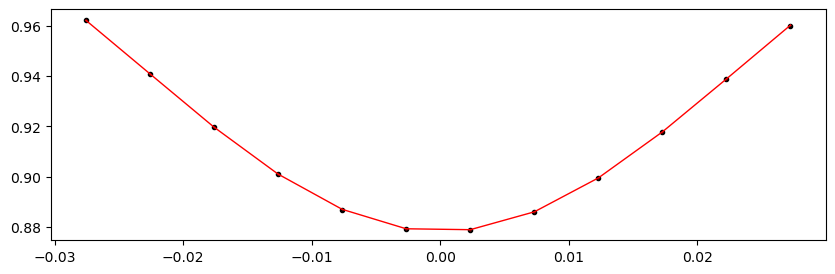

2456194.4987045997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.39it/s]


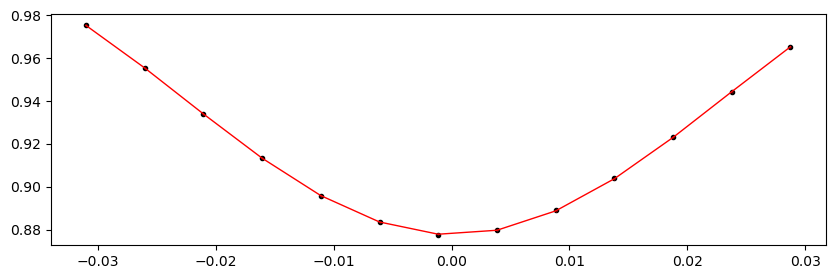

2456198.5995754 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.39it/s]


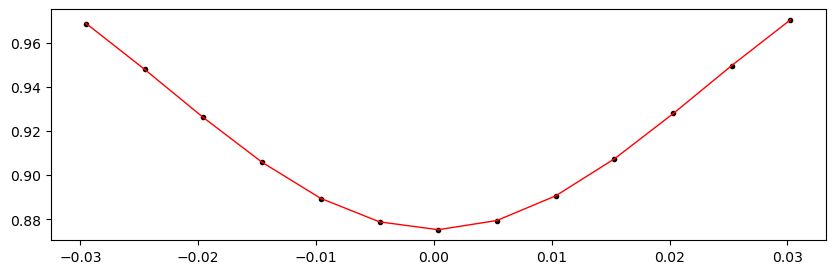

2456202.7004461996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.49it/s]


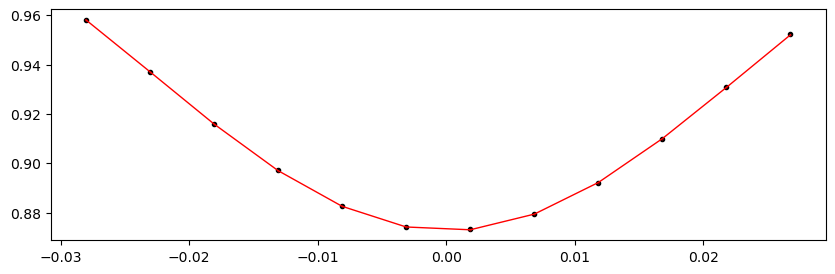

2456206.801317 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.56it/s]


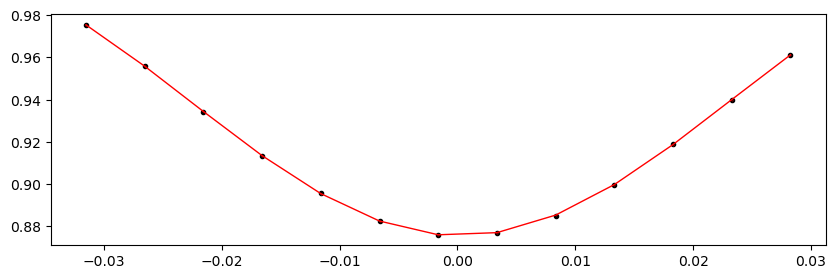

2456210.9021878 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.98it/s]


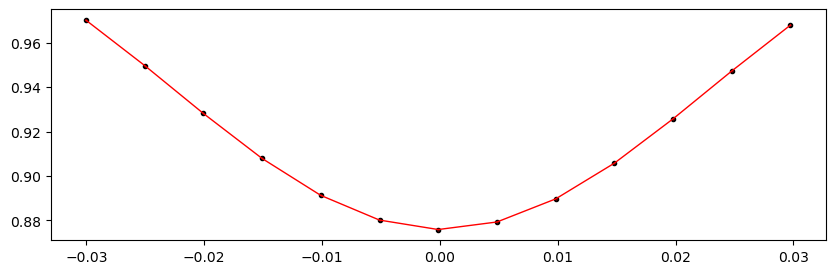

2456215.0030586 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.52it/s]


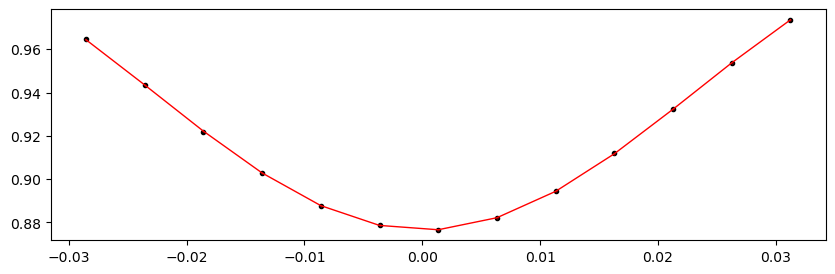

2456219.1039294 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.73it/s]


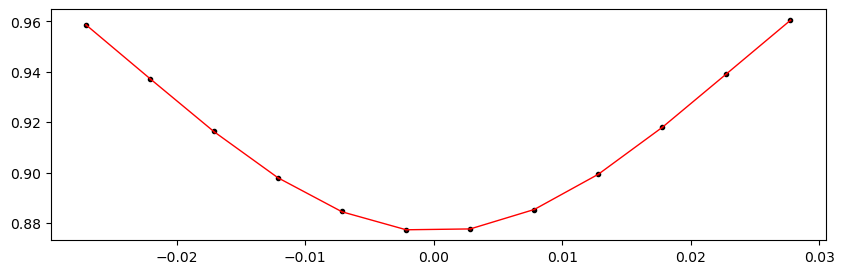

2456223.2048001997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.11it/s]


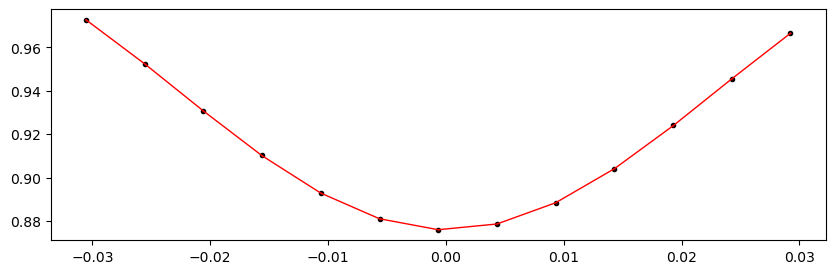

2456227.305671 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.70it/s]


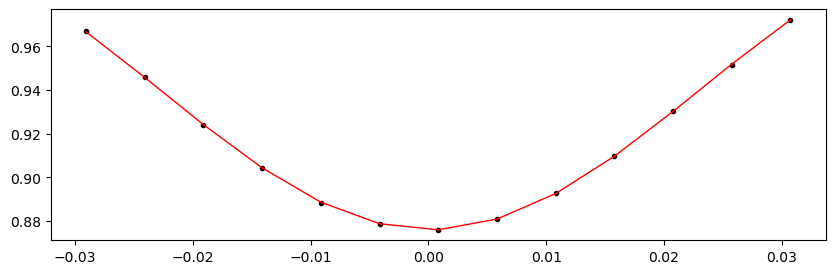

2456231.4065417997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.78it/s]


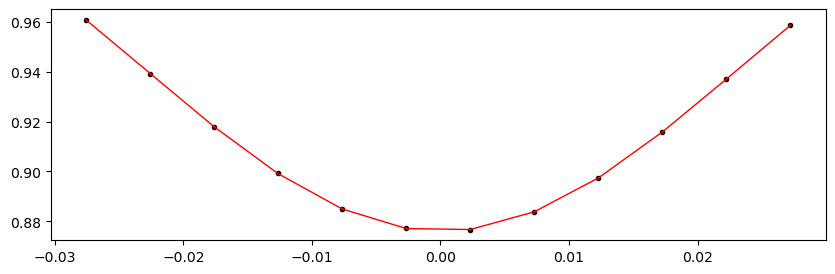

2456235.5074126 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.22it/s]


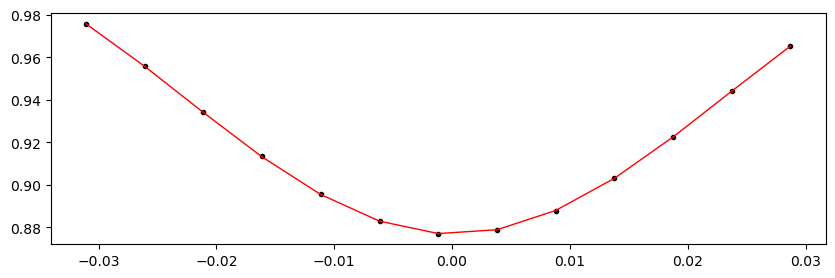

2456239.6082833996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.24it/s]


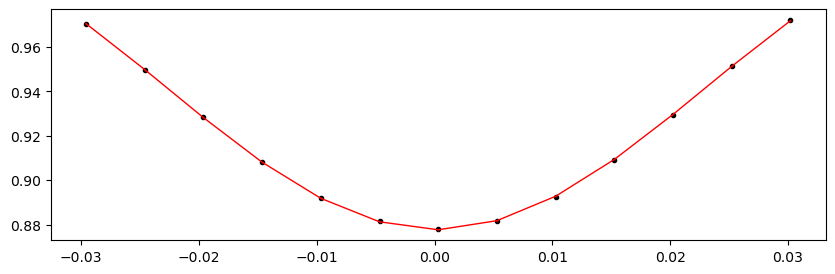

2456243.7091542 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.04it/s]


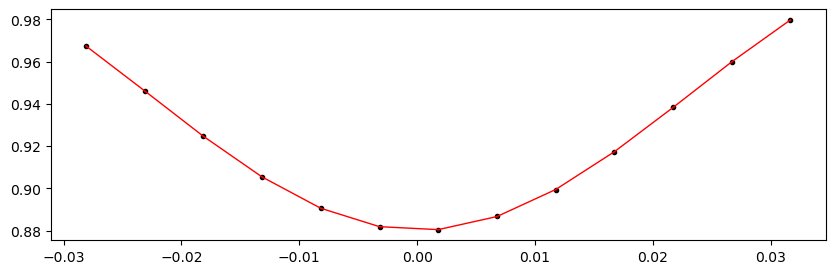

2456251.9108957998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:35<00:00, 284.96it/s]


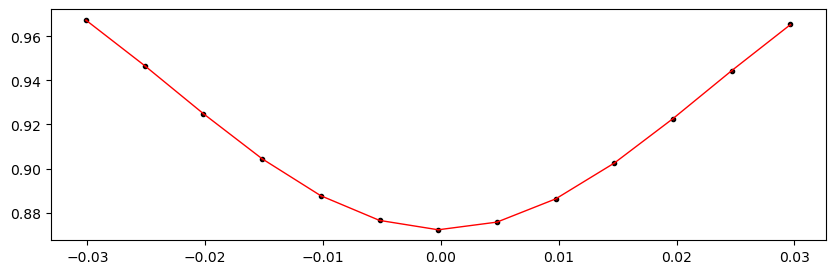

2456256.0117666 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.01it/s]


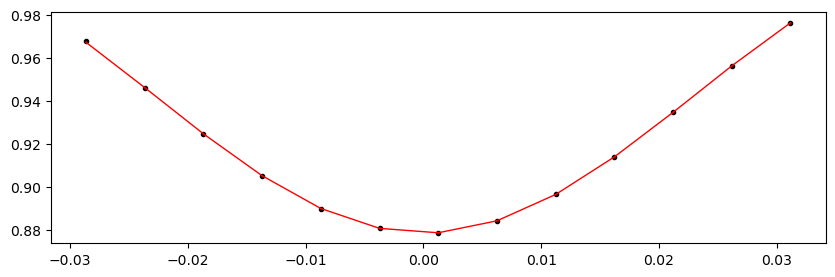

2456260.1126373997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.66it/s]


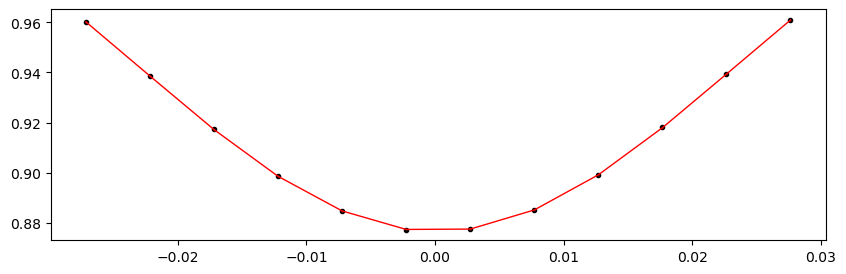

2456264.2135082 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.73it/s]


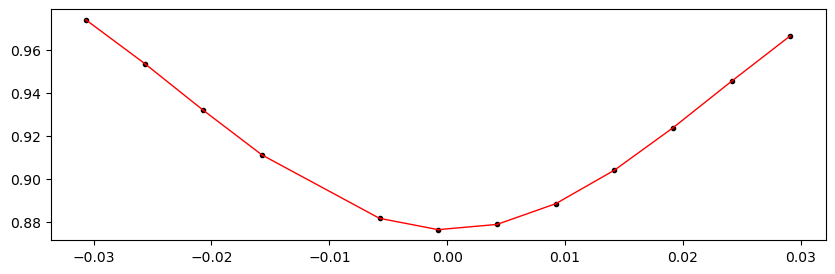

Time 2456268.3143789996 does not have enough data points: 10
2456272.4152498 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.10it/s]


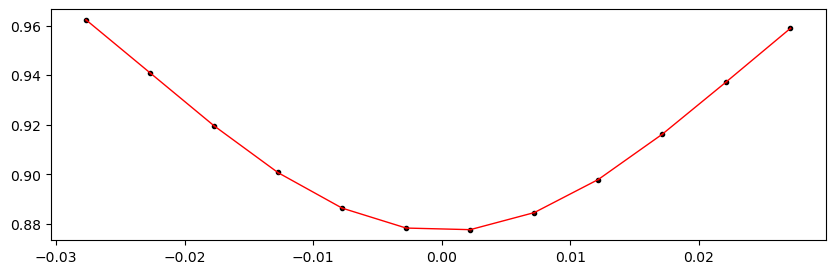

2456276.5161206 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.79it/s]


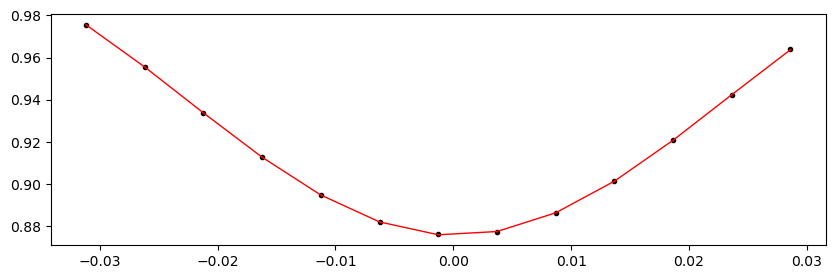

2456280.6169914 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.07it/s]


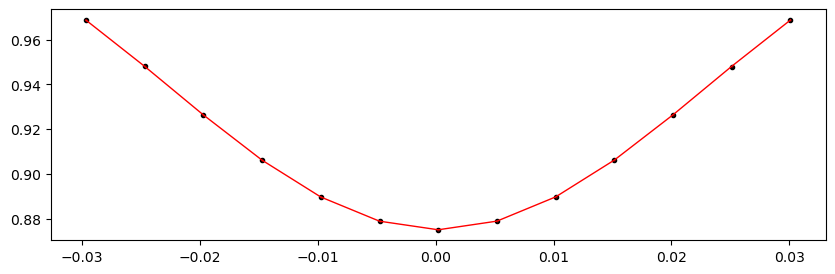

2456284.7178622 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.01it/s]


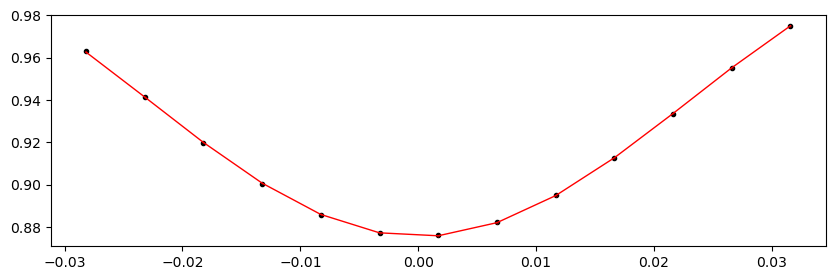

2456288.8187329997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.23it/s]


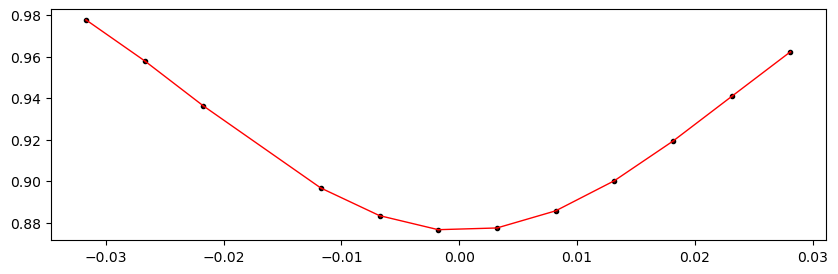

2456292.9196038 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.94it/s]


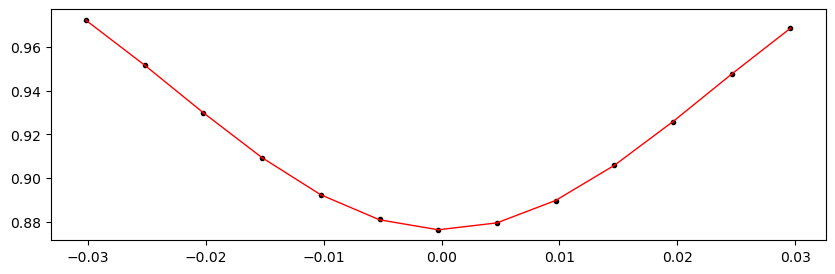

2456297.0204745997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.61it/s]


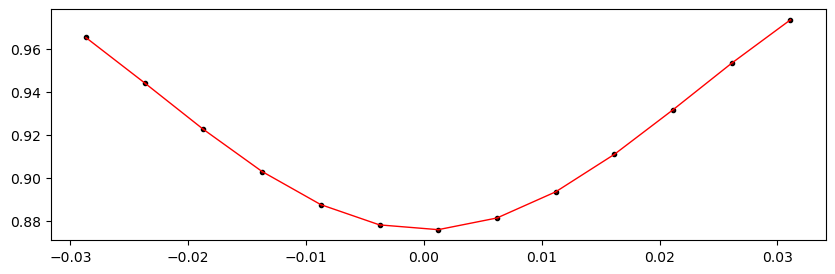

2456301.1213454 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.51it/s]


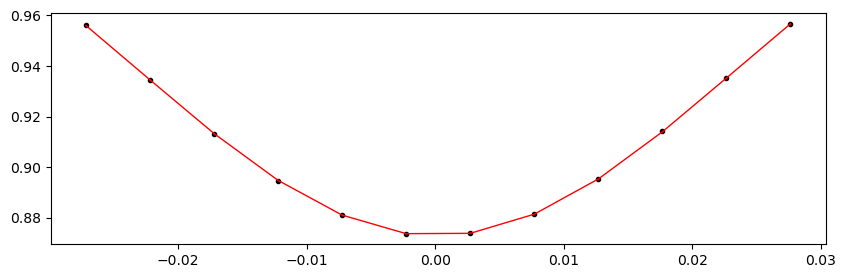

2456305.2222161996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.75it/s]


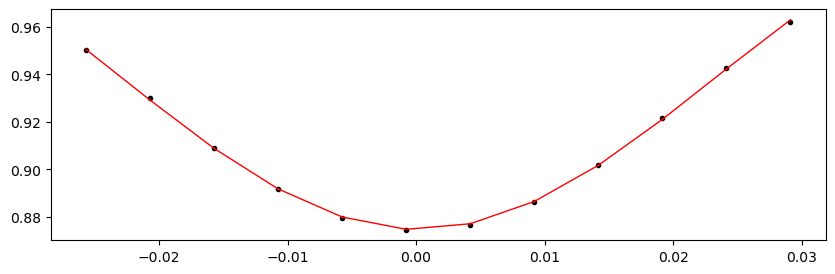

2456309.323087 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.08it/s]


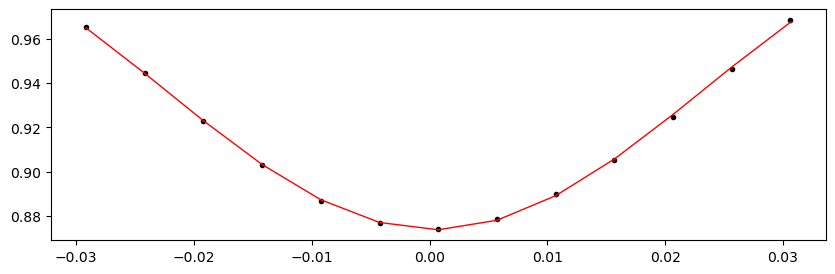

Time 2456321.6256994 does not have enough data points: 4
2456325.7265701997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.12it/s]


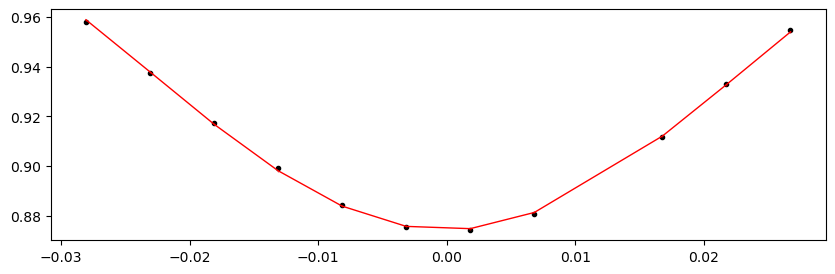

2456329.827441 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.32it/s]


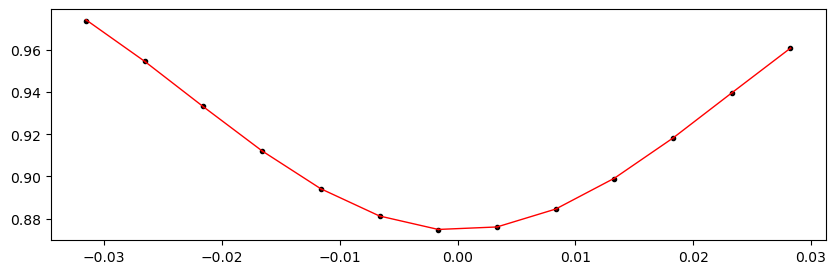

2456333.9283117997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.95it/s]


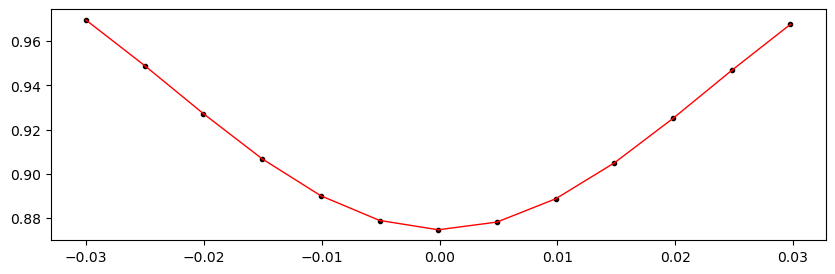

2456338.0291826 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.57it/s]


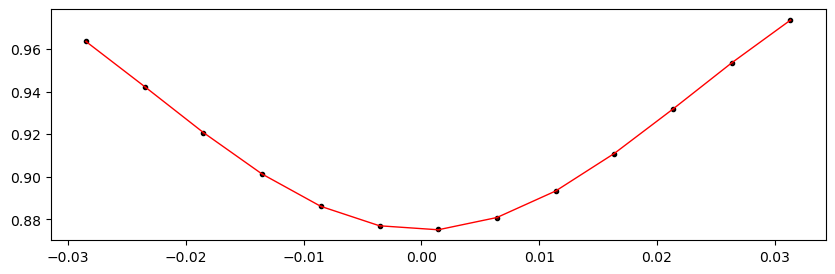

2456342.1300534 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.36it/s]


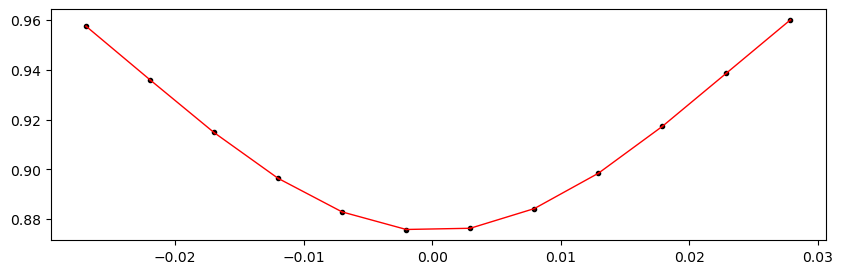

2456346.2309242 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.87it/s]


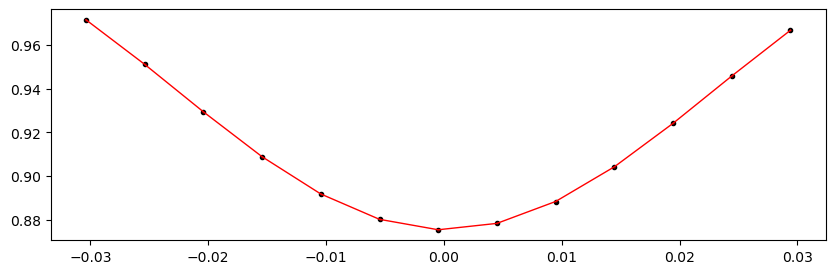

2456350.331795 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.56it/s]


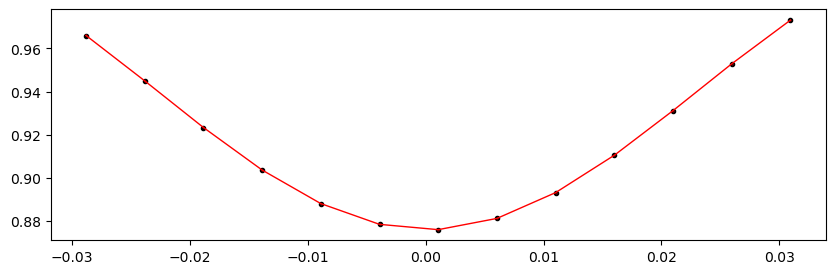

2456354.4326657997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.38it/s]


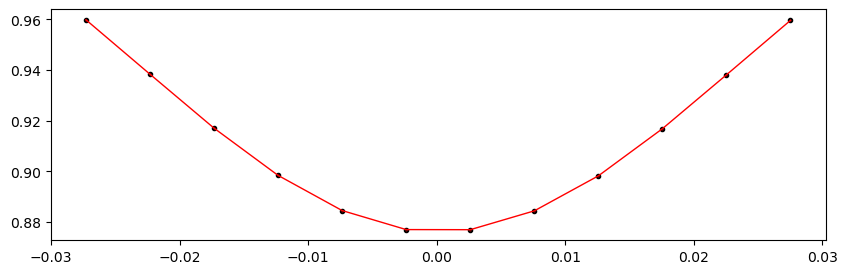

2456362.6344073997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.85it/s]


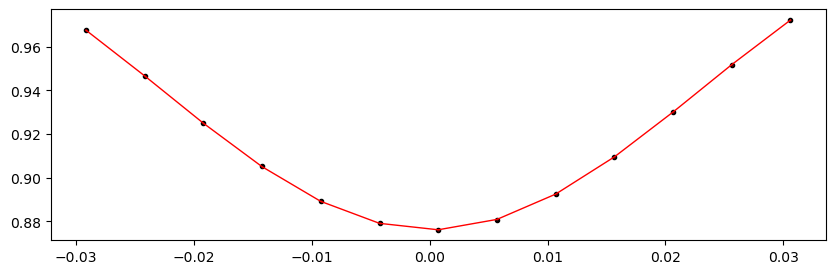

2456366.7352782 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.03it/s]


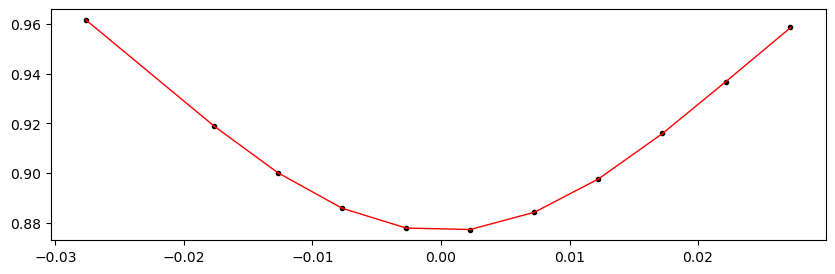

2456370.8361489996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.75it/s]


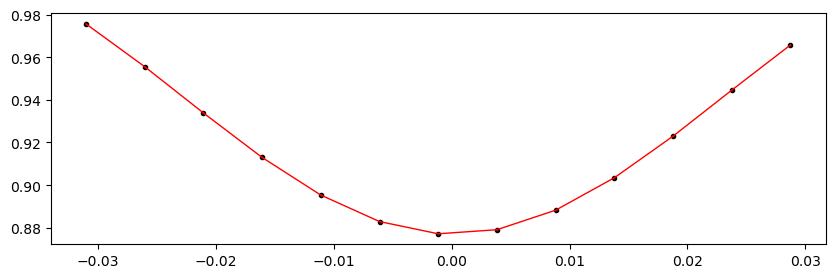

2456374.9370198 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.72it/s]


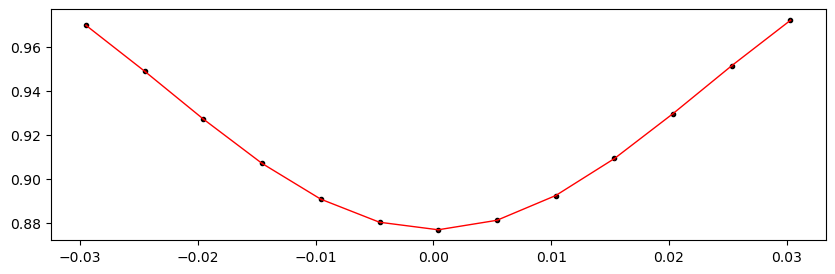

2456379.0378906 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.96it/s]


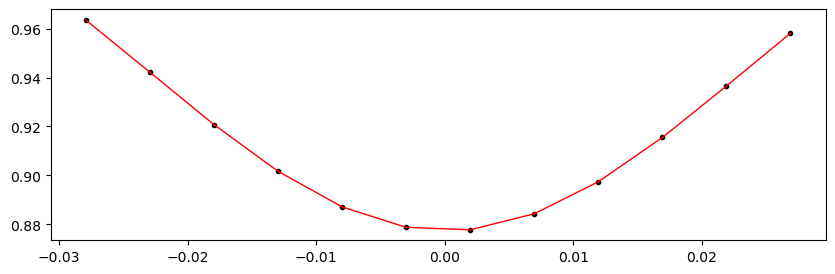

2456383.1387614 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.72it/s]


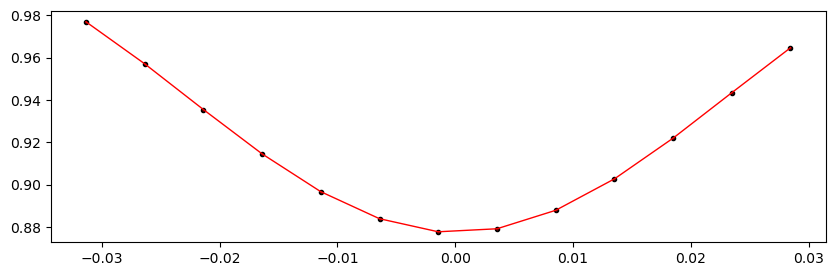

2456387.2396322 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.21it/s]


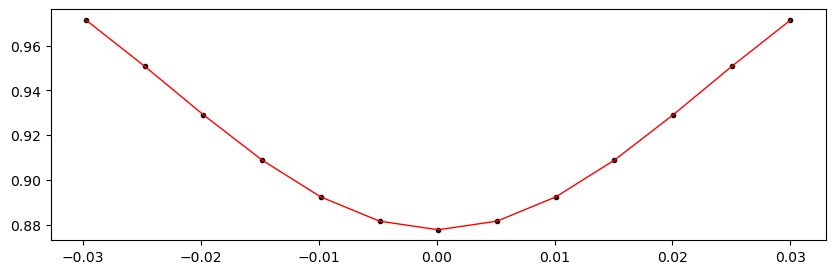

2456395.4413738 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.13it/s]


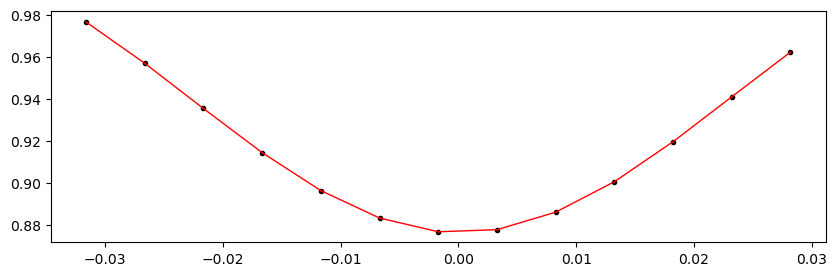

2456399.5422445997 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.13it/s]


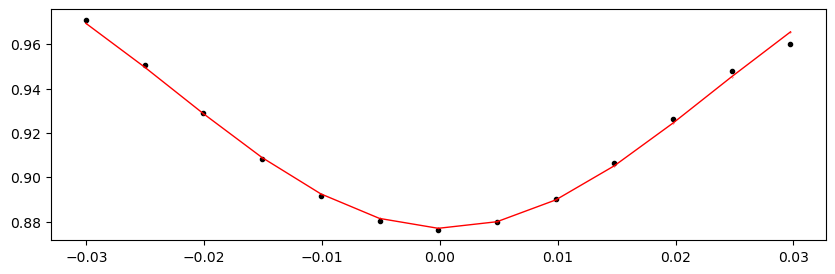

2456403.6431154 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.45it/s]


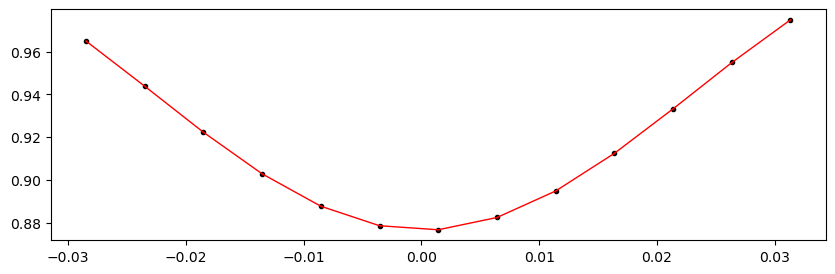

2456407.7439861996 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.86it/s]


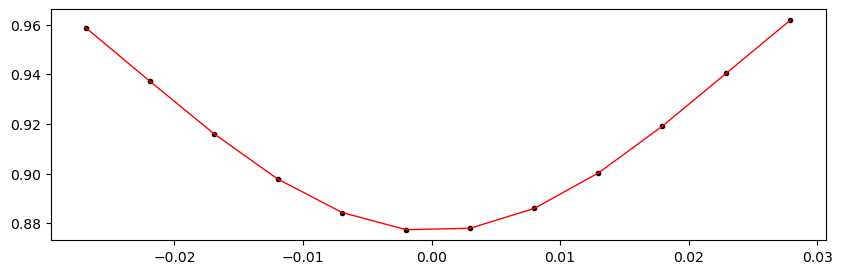

2456411.844857 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.77it/s]


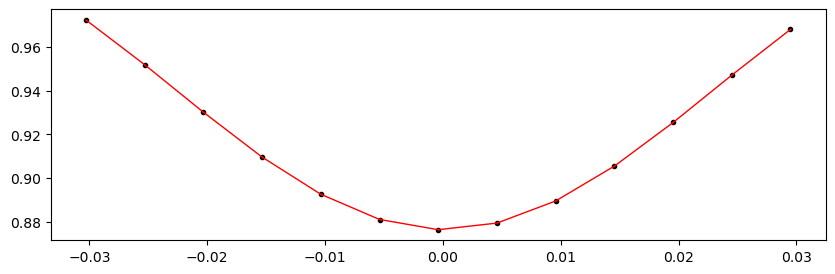

2456420.0465985998 1.0153426816937374 -0.13916813407386314 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.14it/s]


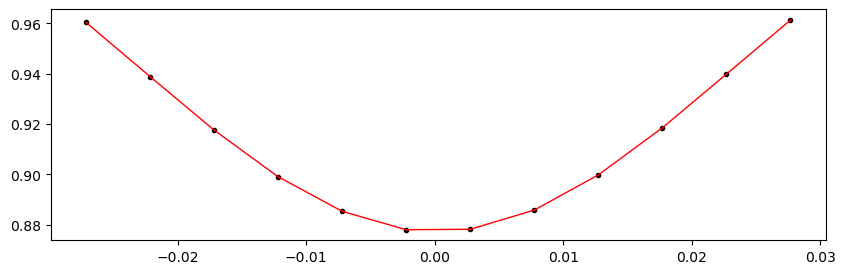

In [40]:
%matplotlib inline

# from importlib import reload
# reload(etv_functions)

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path,
                               min_number_data=10, # to fit 30 min cadence data
                              )
!$NOTIFY_CMD "Individual primary eclipses fit done"


Fitting individual secondary eclipses...
Existing manifest file found, will skip previously processed LCs and append to end of manifest file
Number 0 has already been completed -- skip
2454958.0861584 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.20it/s]


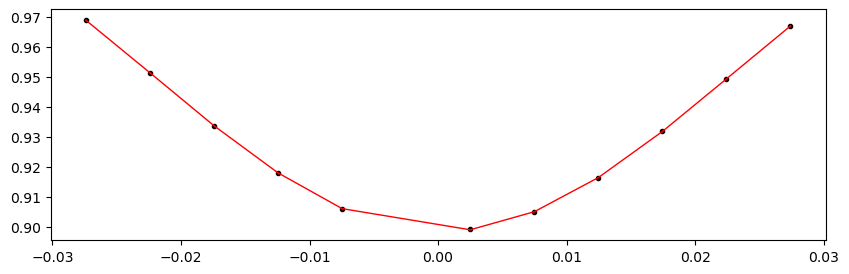

2454962.1870291997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.42it/s]


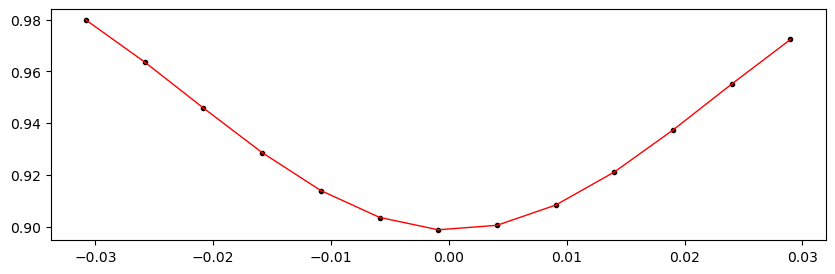

2454966.2879 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.95it/s]


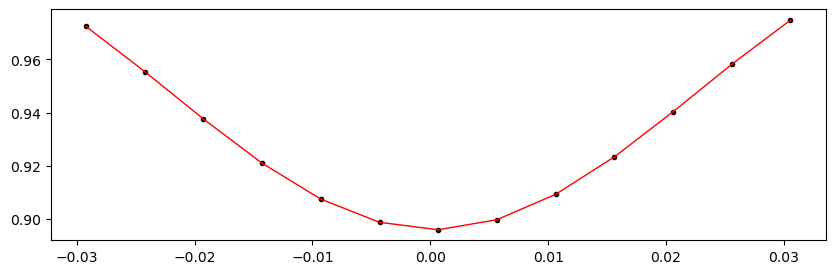

2454970.3887707996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.30it/s]


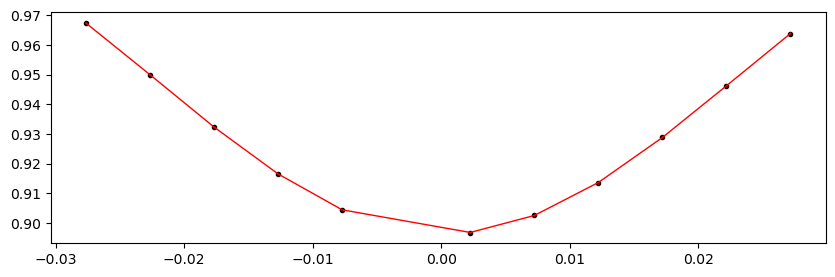

2454974.4896416 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.18it/s]


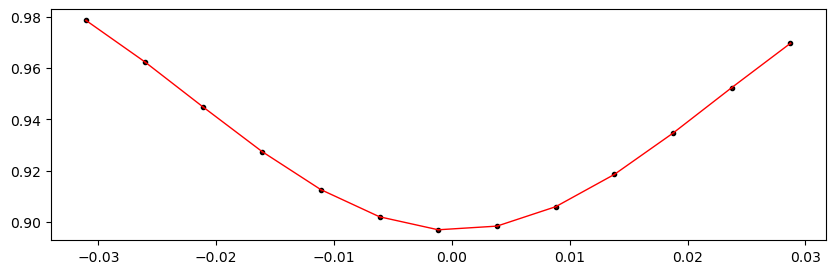

2454978.5905123996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.62it/s]


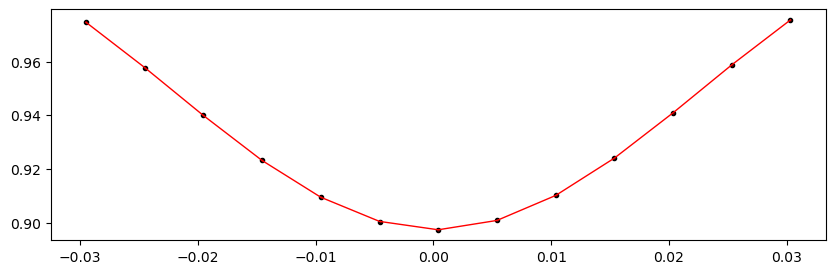

2454982.6913831998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.14it/s]


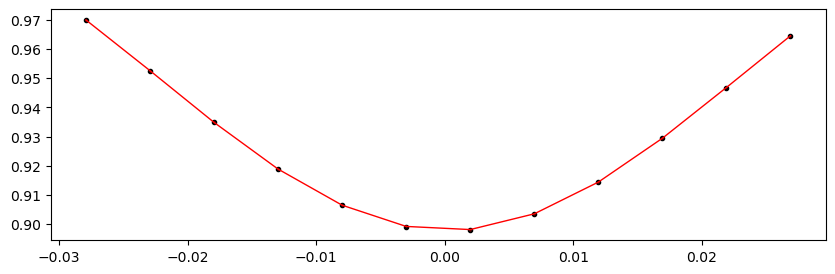

2454986.7922539995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.32it/s]


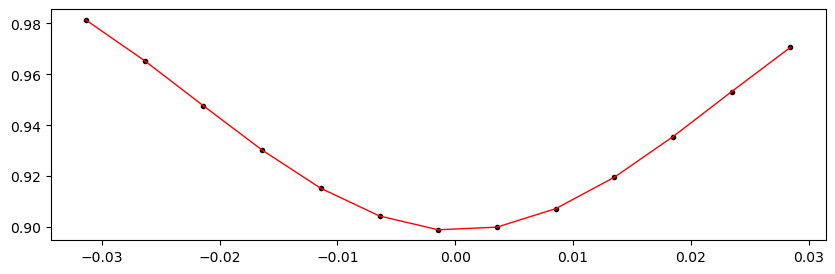

2454990.8931247997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.94it/s]


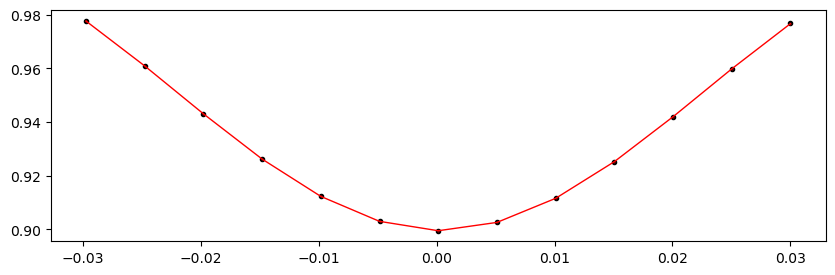

2454994.9939956 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.79it/s]


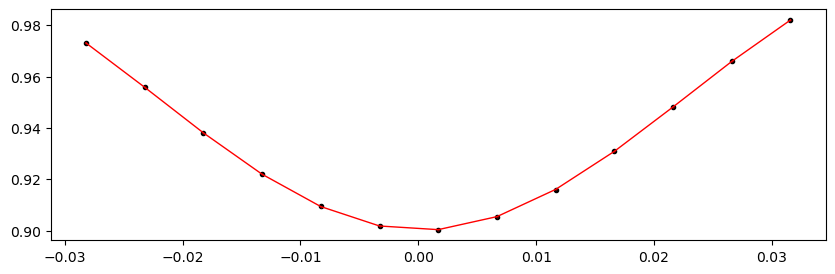

2455003.1957372 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.31it/s]


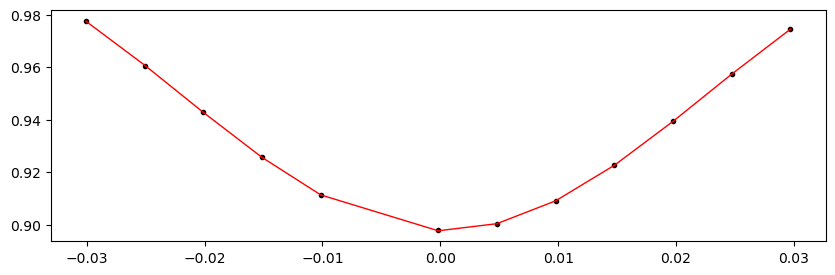

2455007.2966079996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.72it/s]


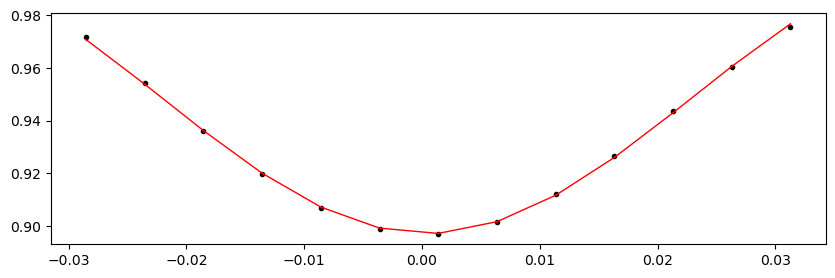

2455011.3974788 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.99it/s]


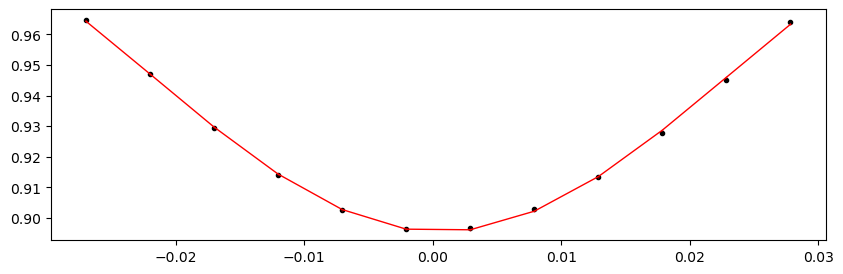

2455019.5992203997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.98it/s]


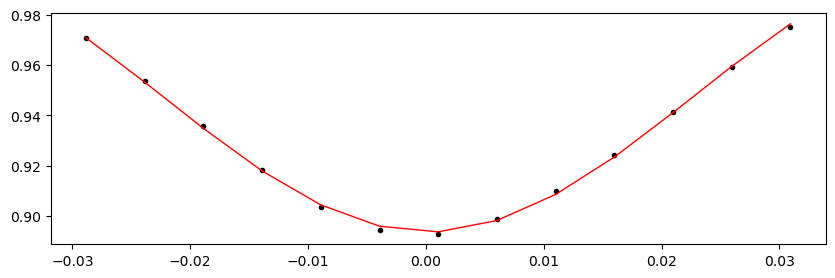

2455023.7000912 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.90it/s]


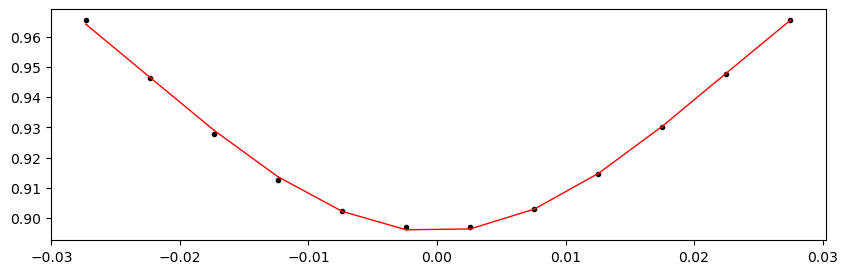

2455027.8009619997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.45it/s]


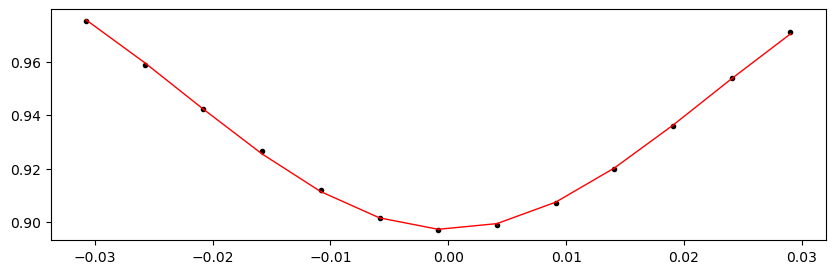

2455031.9018328 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.60it/s]


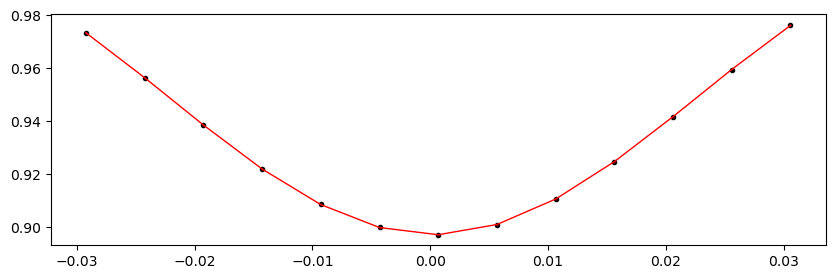

2455036.0027035996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.05it/s]


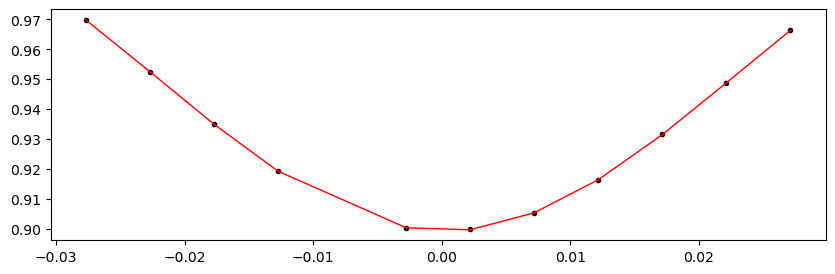

2455040.1035744 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.36it/s]


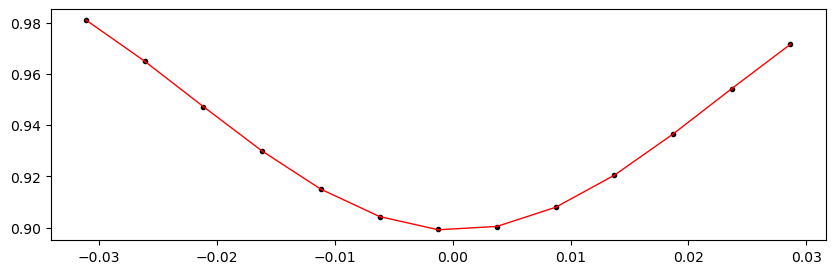

2455044.2044451996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.65it/s]


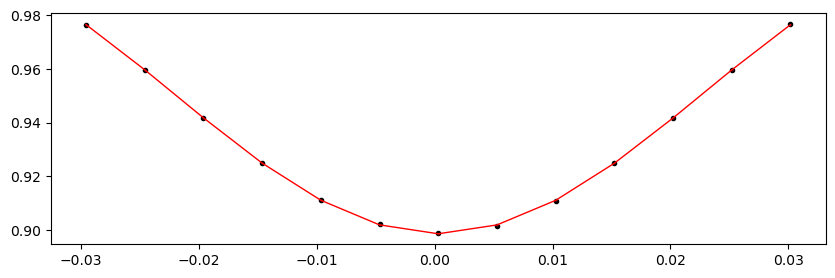

2455048.305316 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.95it/s]


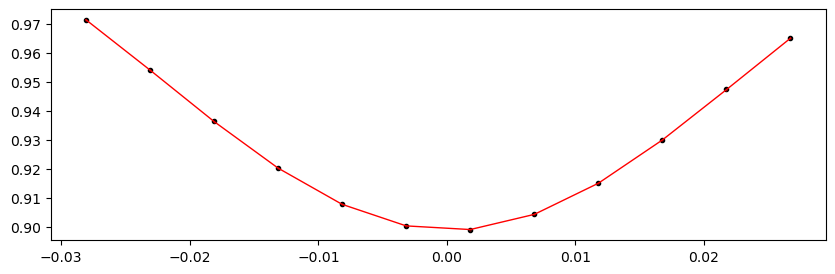

2455052.4061867995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.11it/s]


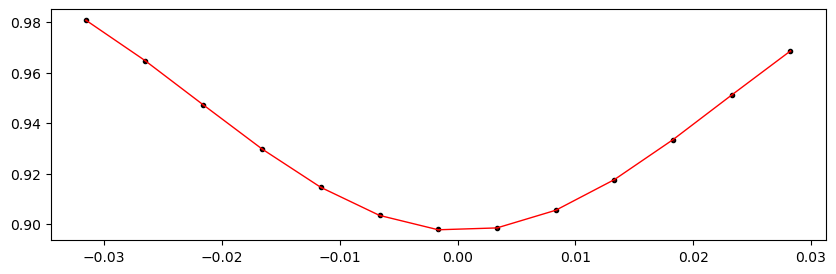

Time 2455056.5070575997 does not have enough data points: 5
2455060.6079284 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.41it/s]


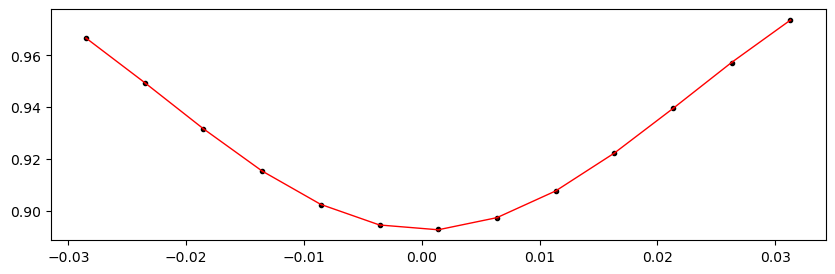

2455064.7087991997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.03it/s]


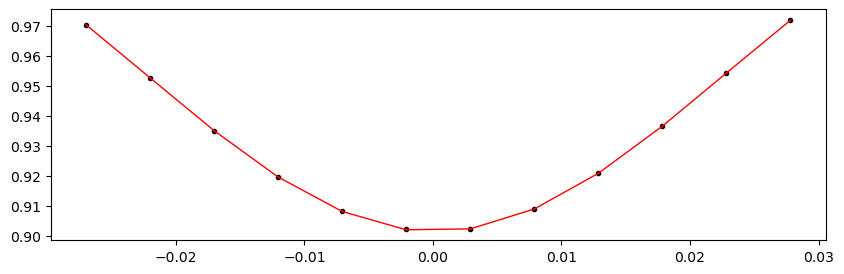

2455068.80967 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.64it/s]


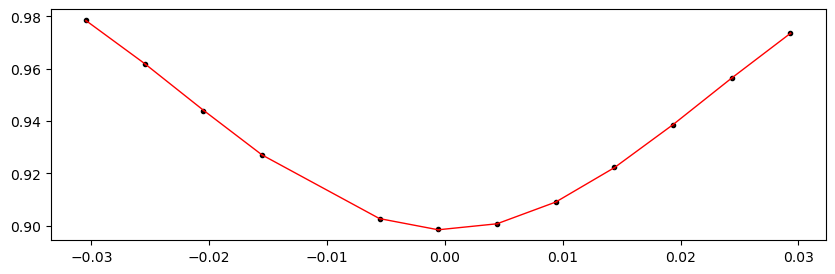

2455072.9105407996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.31it/s]


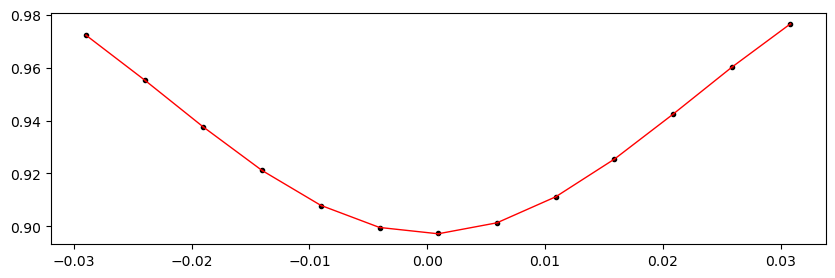

2455077.0114116 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.09it/s]


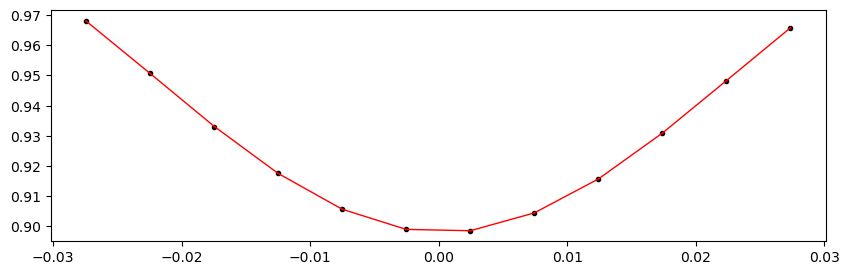

2455081.1122823996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.77it/s]


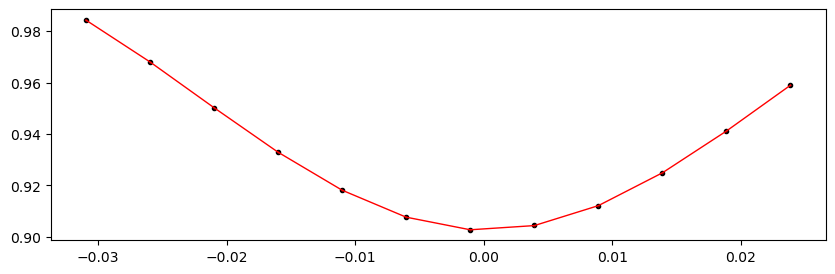

2455085.2131531998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.80it/s]


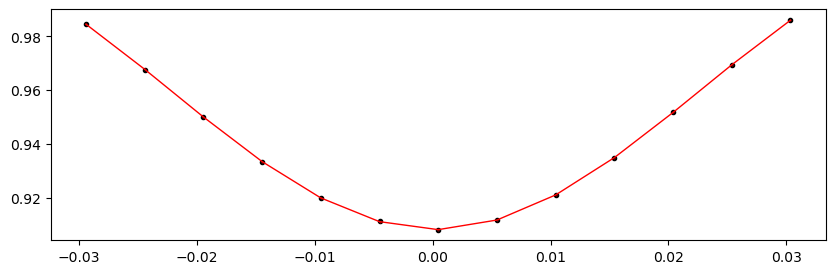

Time 2455089.314024 does not have enough data points: 5
2455093.4148947997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.34it/s]


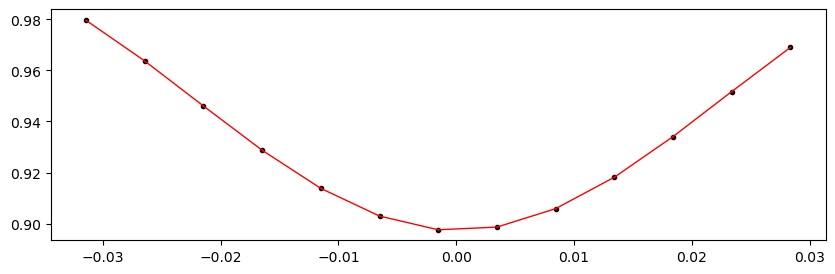

2455097.5157656 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 365.37it/s]


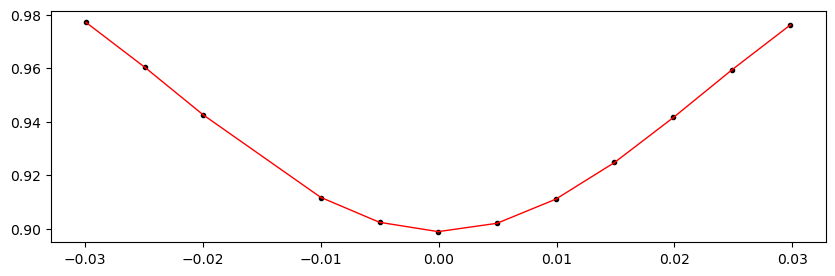

2455101.6166363996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.92it/s]


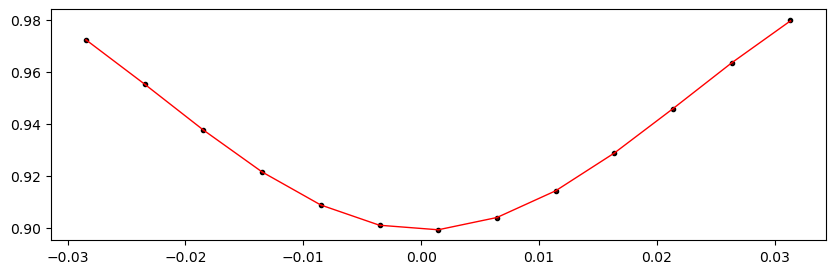

2455105.7175072 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.86it/s]


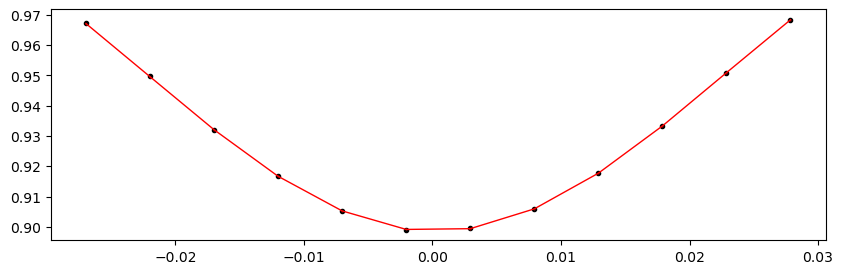

2455109.8183779996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.23it/s]


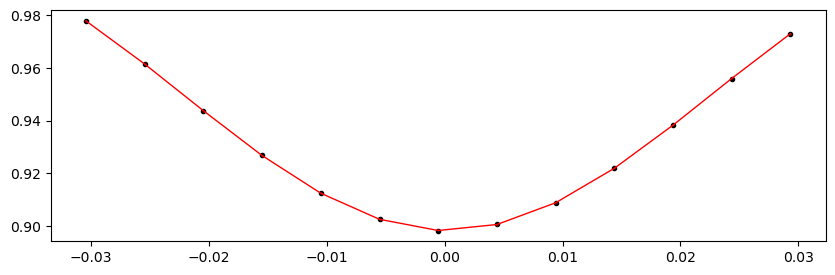

2455118.0201195995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.88it/s]


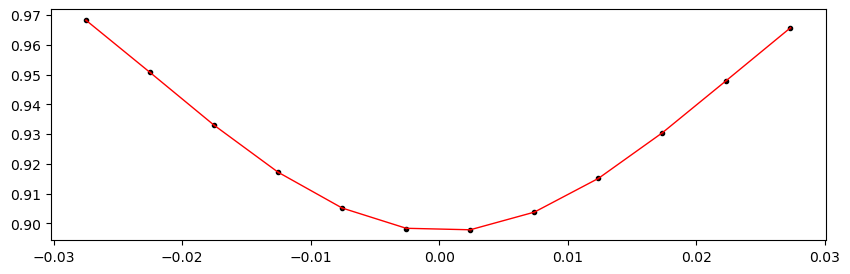

2455122.1209903997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.95it/s]


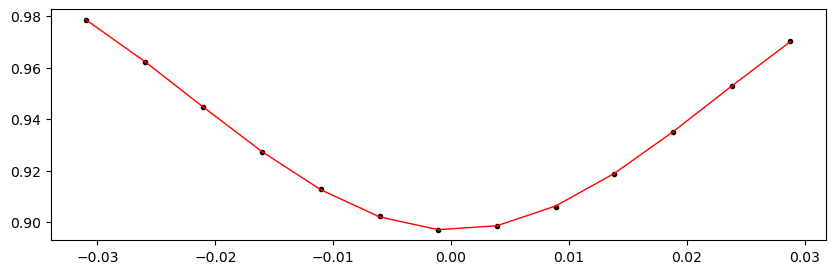

2455126.2218612 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.45it/s]


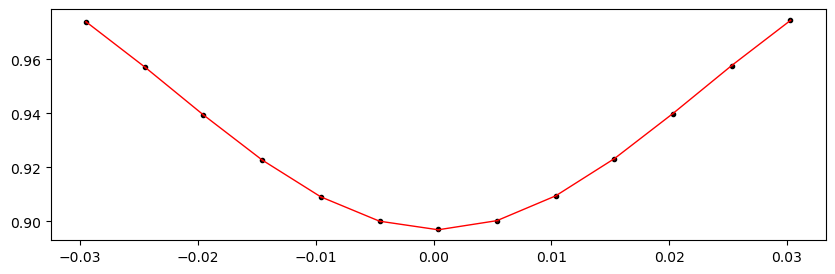

2455130.3227319997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.68it/s]


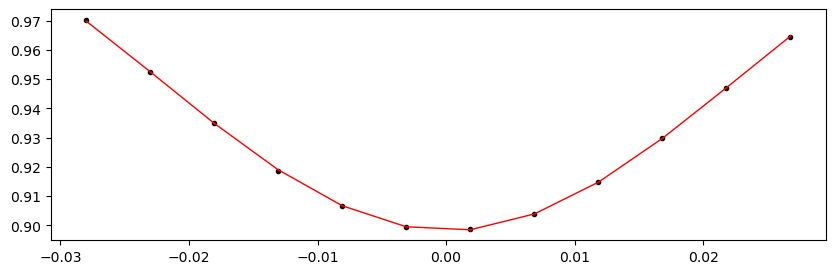

2455134.4236028 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.93it/s]


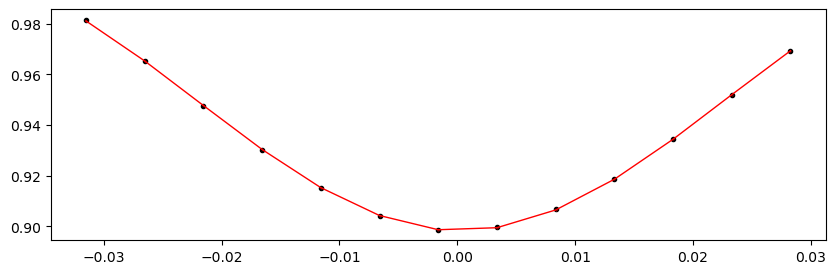

2455138.5244735996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 349.81it/s]


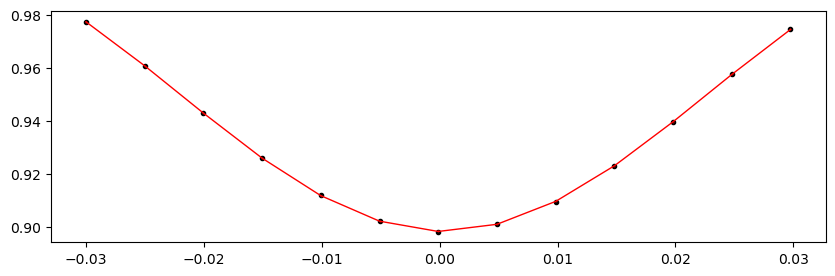

2455142.6253444 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.31it/s]


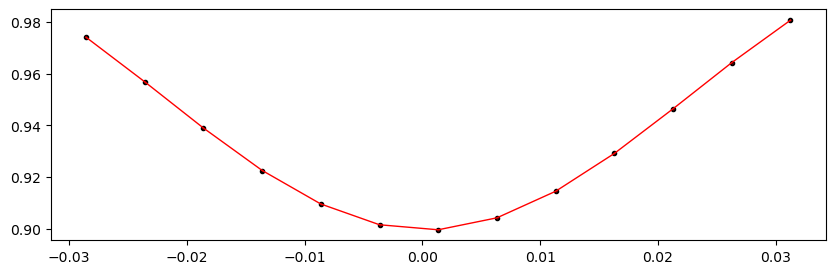

2455146.7262151996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.82it/s]


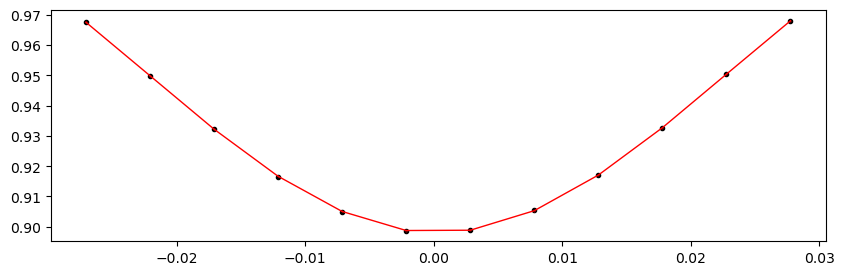

2455150.827086 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.37it/s]


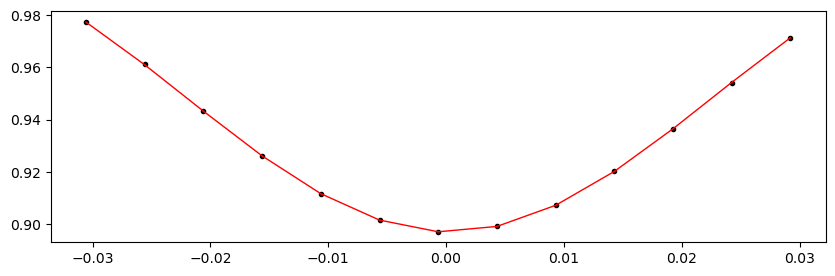

2455159.0288275997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.12it/s]


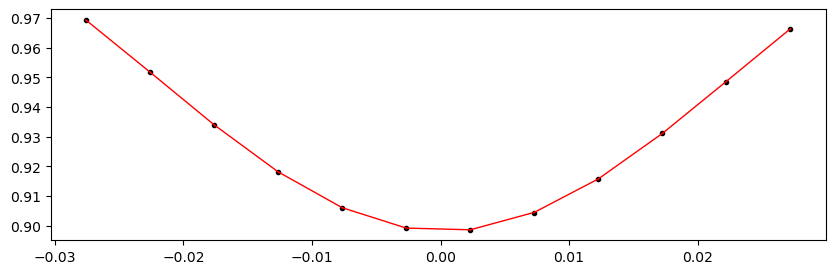

2455163.1296984 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.06it/s]


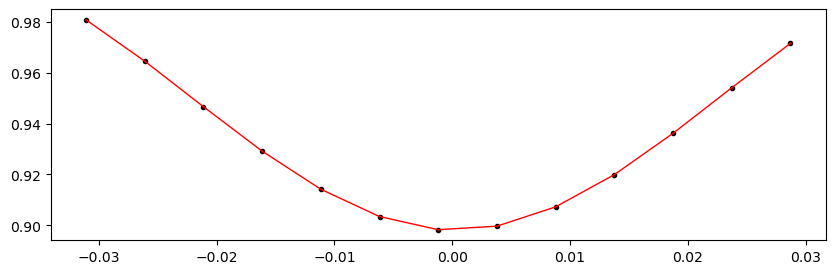

2455167.2305691997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.15it/s]


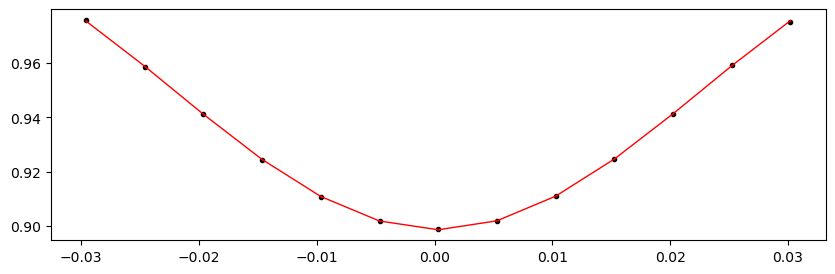

2455171.33144 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.43it/s]


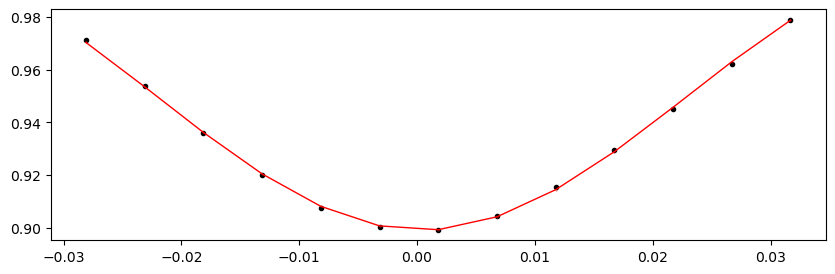

2455175.4323107996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.67it/s]


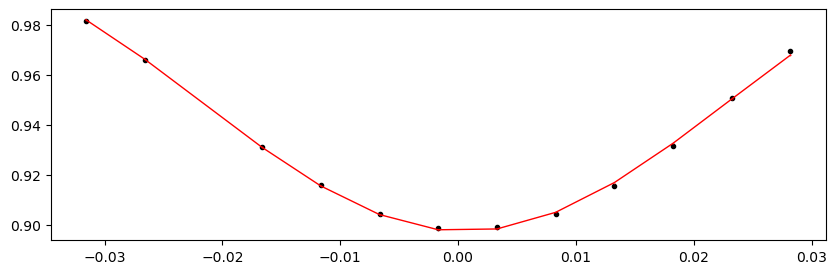

2455179.5331816 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.41it/s]


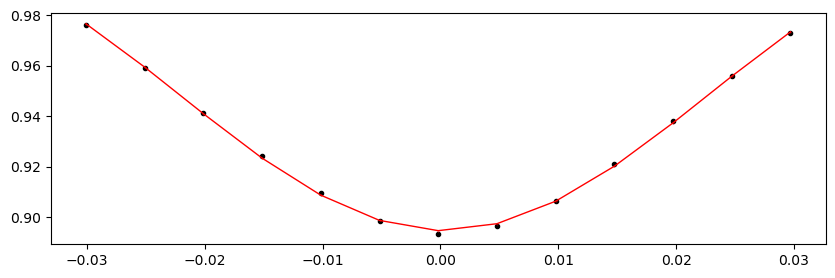

2455187.7349231998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.19it/s]


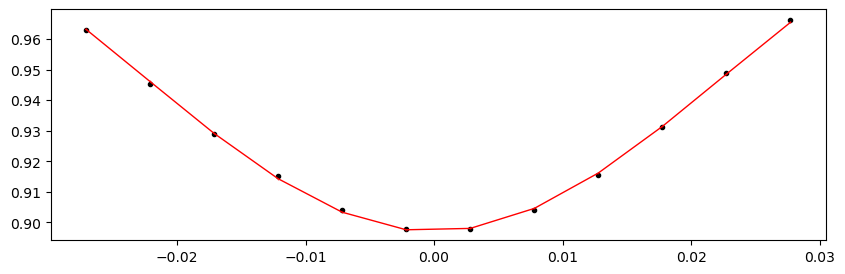

2455191.835794 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.85it/s]


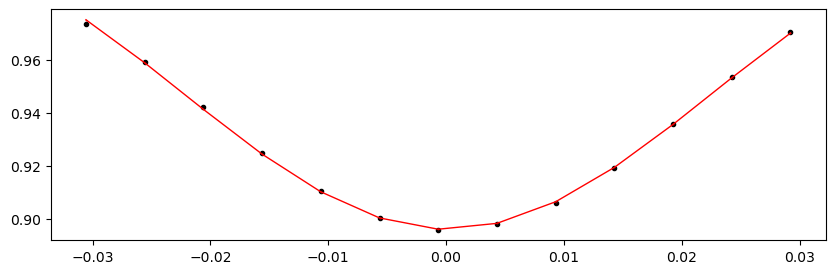

2455195.9366647997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.08it/s]


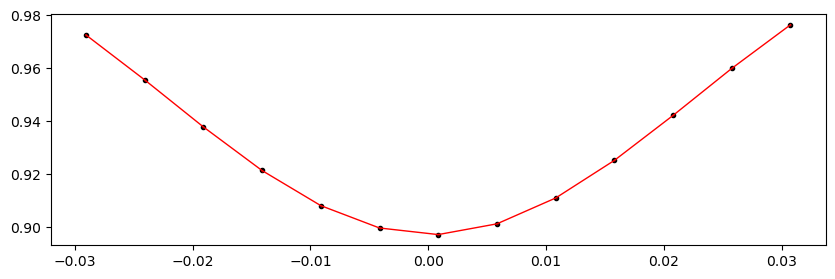

2455200.0375356 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.06it/s]


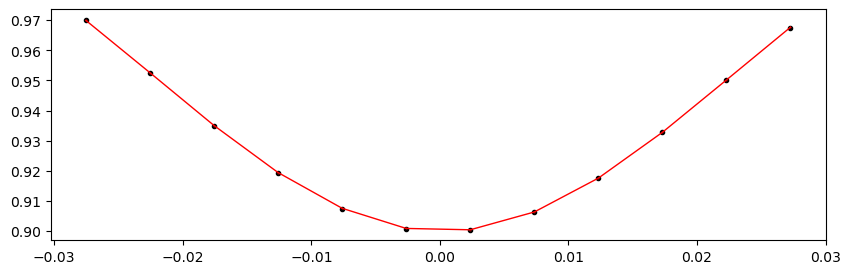

2455204.1384063996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.12it/s]


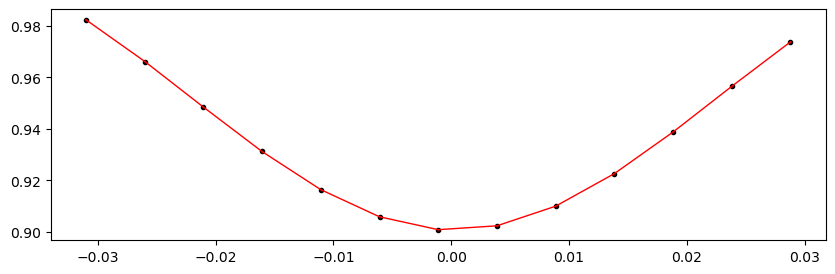

2455208.2392772 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.08it/s]


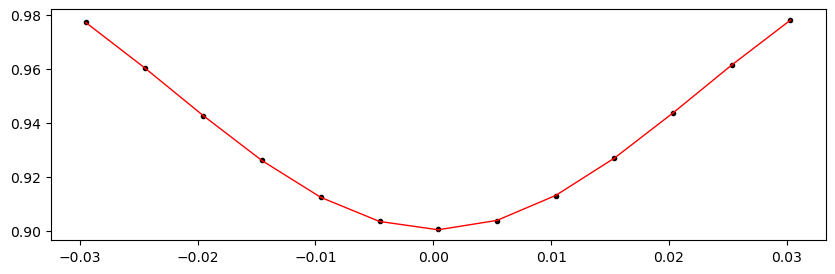

2455212.3401479996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.46it/s]


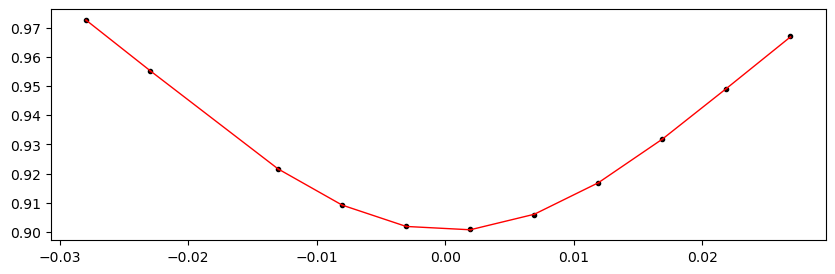

Time 2455216.4410188 does not have enough data points: 5
2455220.5418895995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.16it/s]


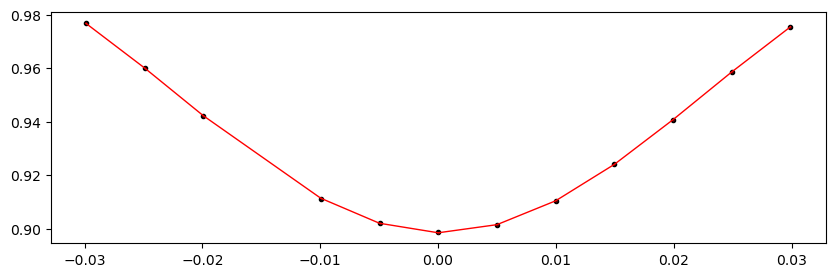

2455224.6427603997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.96it/s]


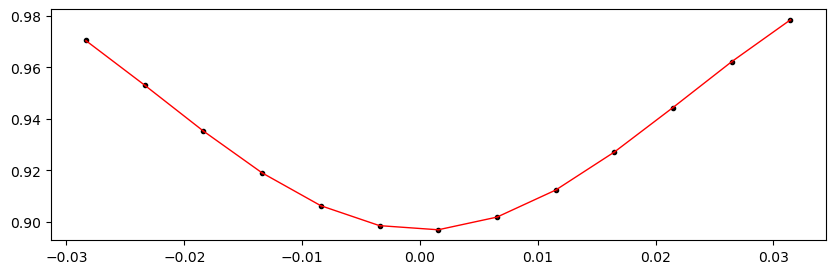

2455228.7436312 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.64it/s]


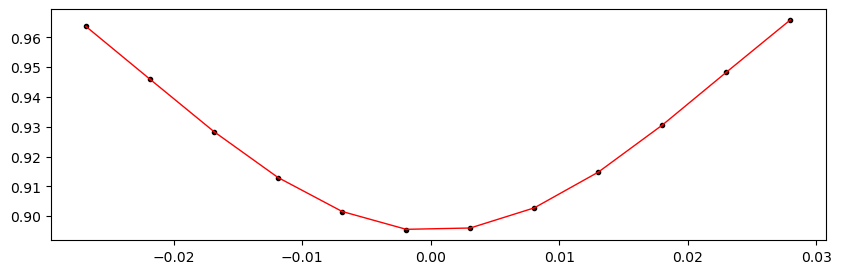

2455236.9453728 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.77it/s]


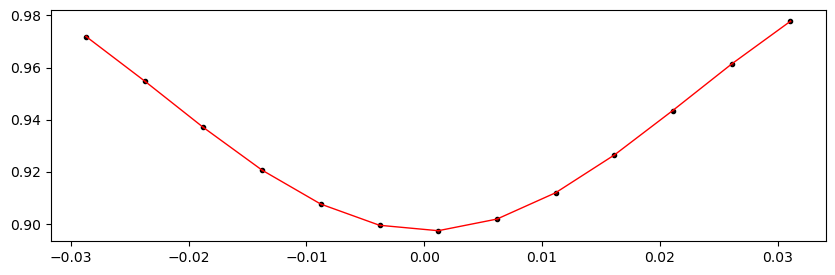

2455241.0462435996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.01it/s]


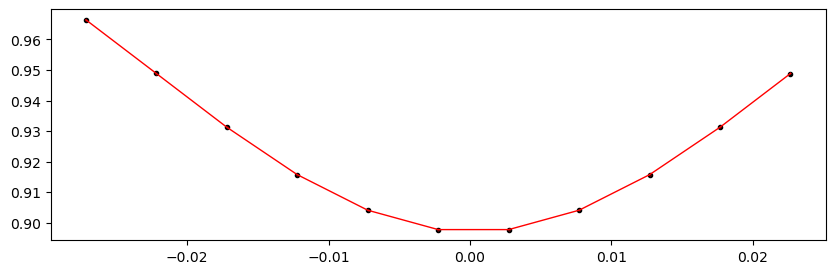

2455245.1471144 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.08it/s]


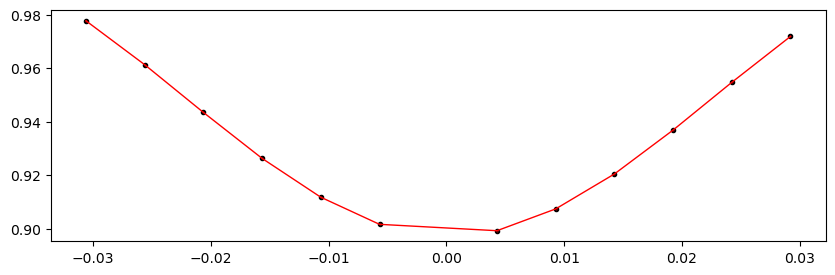

2455249.2479851996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.47it/s]


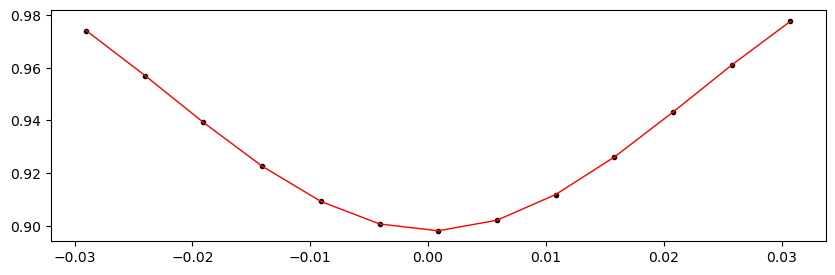

2455253.3488559998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.97it/s]


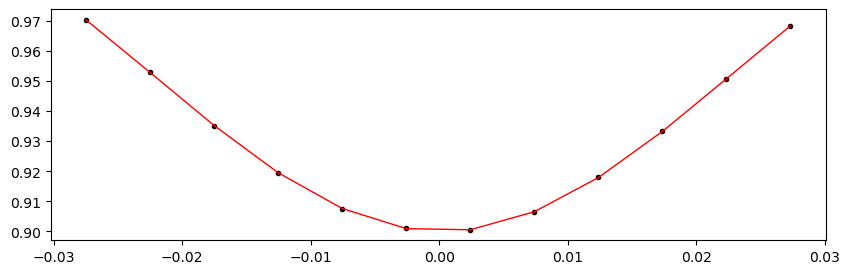

2455257.4497267995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 321.62it/s]


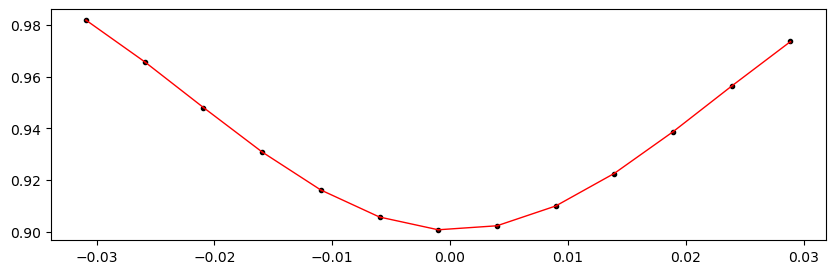

2455261.5505975997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 247.88it/s]


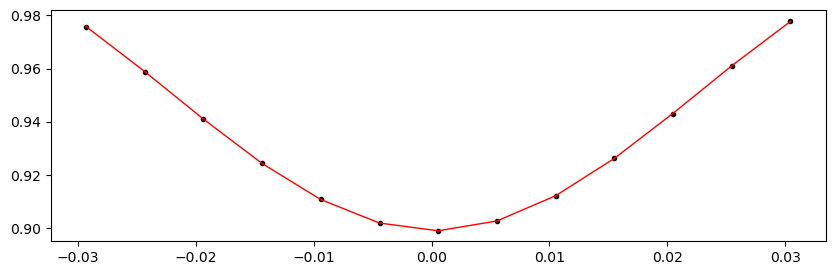

2455265.6514684 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.41it/s]


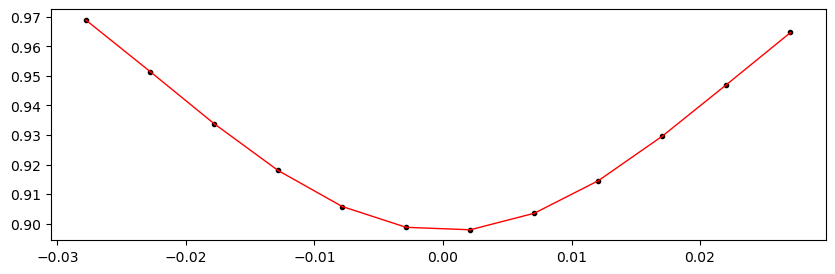

2455269.7523391997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.75it/s]


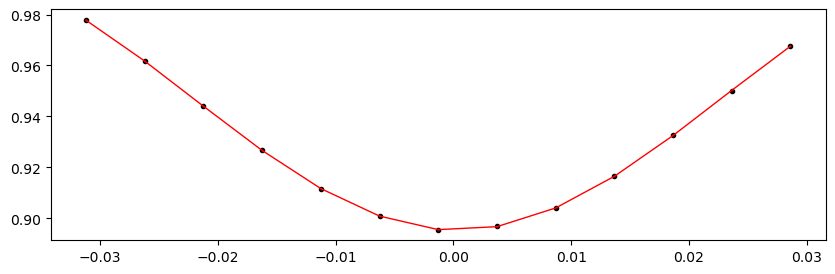

2455273.85321 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.38it/s]


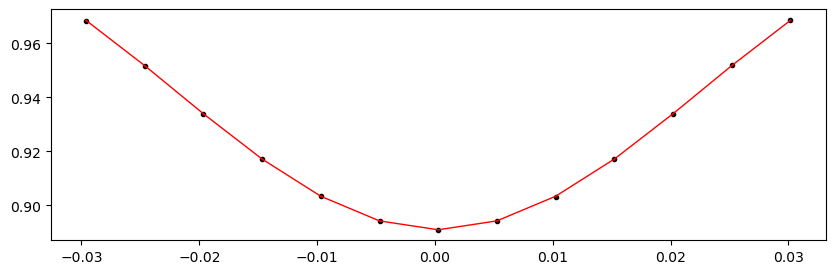

2455277.9540807996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.76it/s]


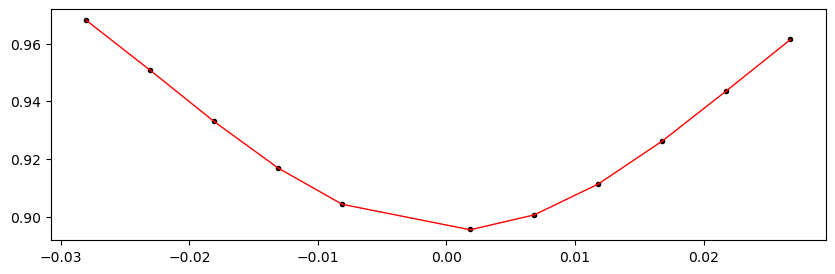

2455282.0549516 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.39it/s]


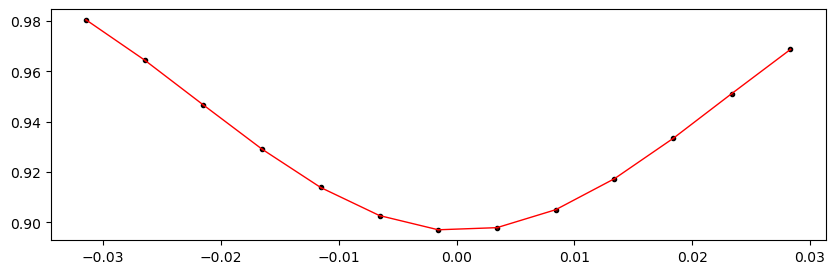

2455286.1558223995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.73it/s]


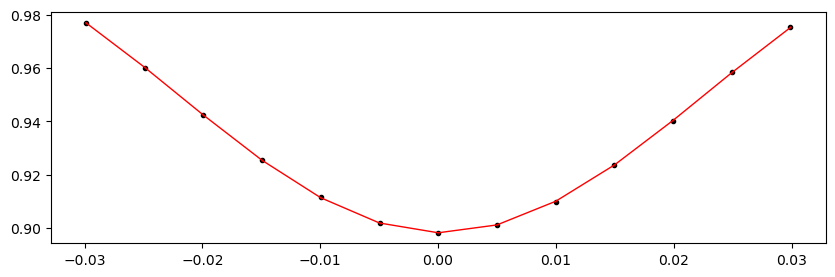

2455290.2566931997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.67it/s]


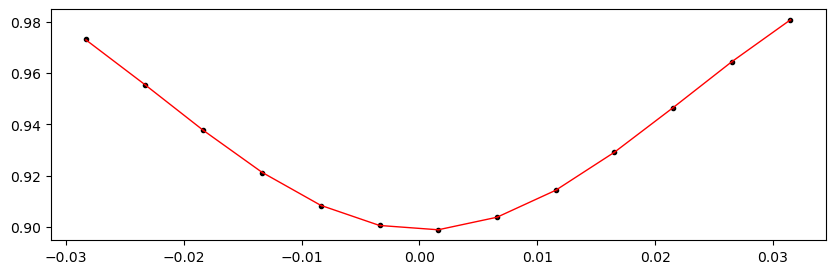

2455294.357564 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.93it/s]


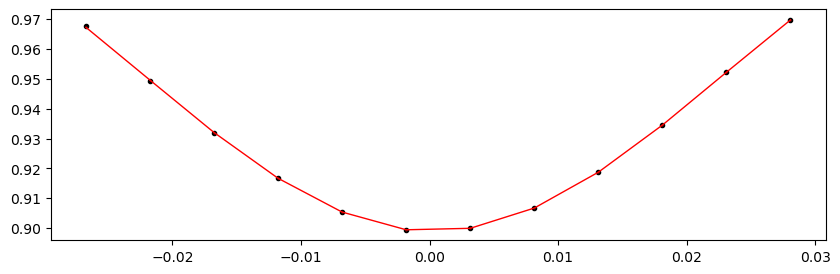

2455298.4584347997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.53it/s]


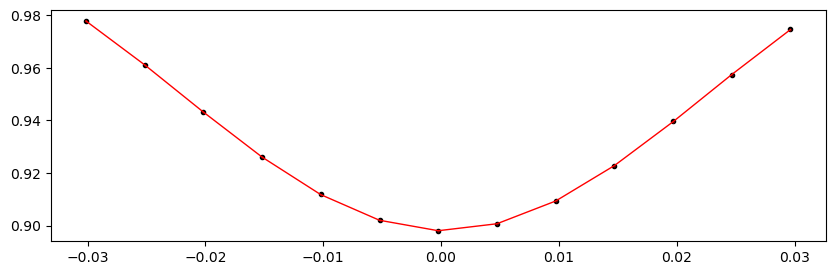

2455302.5593056 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.24it/s]


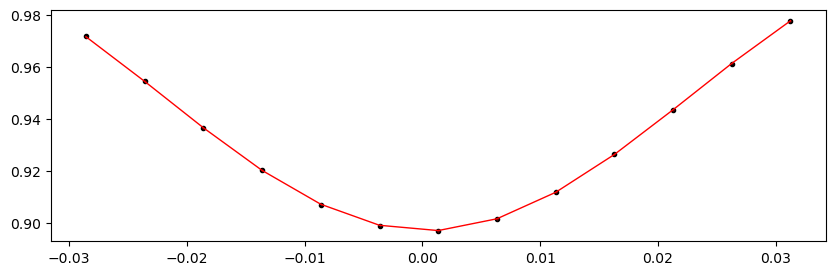

2455306.6601763996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.78it/s]


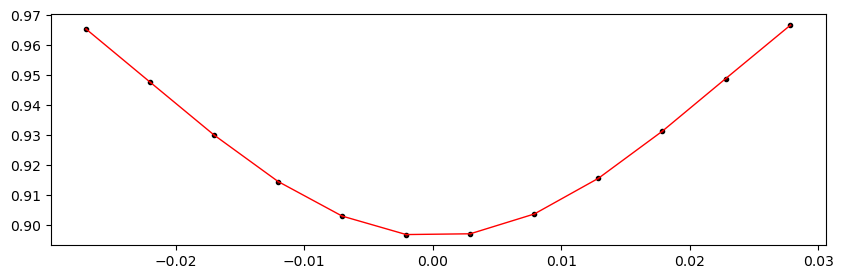

2455310.7610472 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.42it/s]


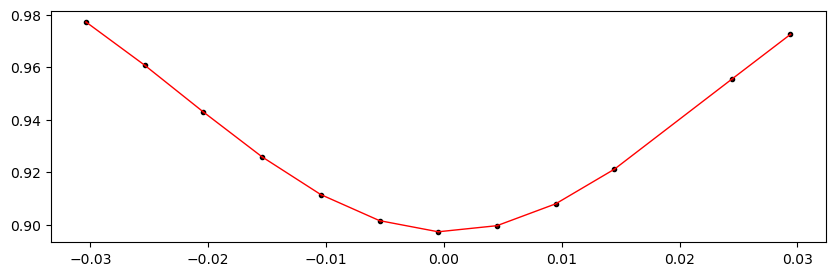

2455314.8619179996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.28it/s]


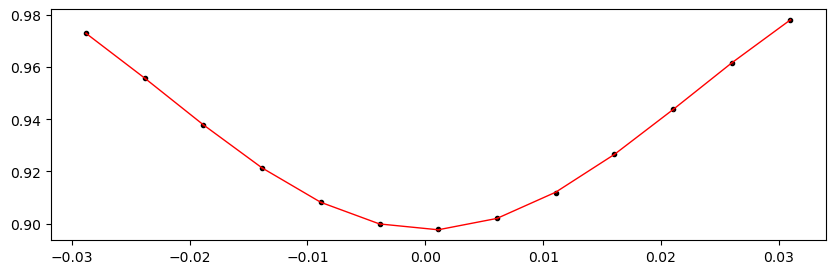

2455318.9627888 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.33it/s]


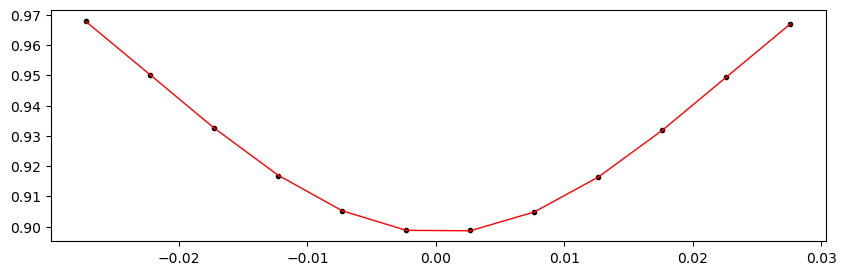

2455323.0636595995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.01it/s]


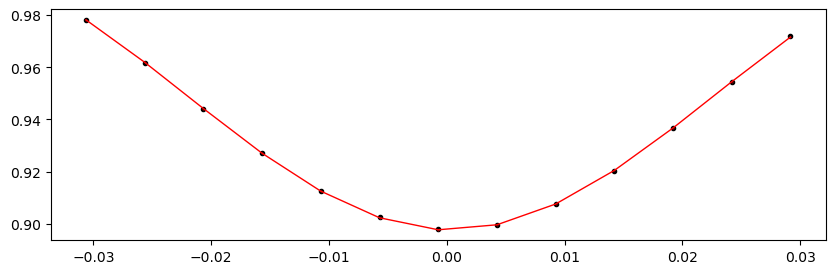

2455327.1645303997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.17it/s]


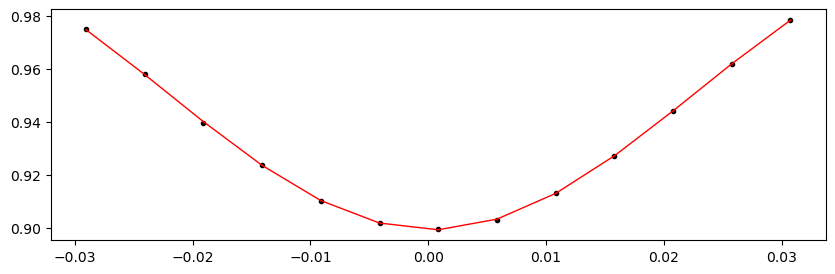

2455331.2654012 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.20it/s]


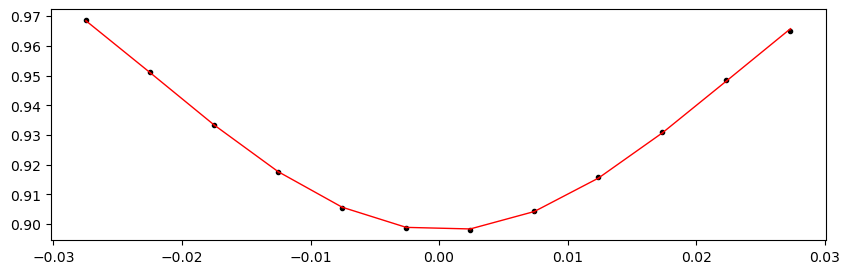

2455335.3662719997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.33it/s]


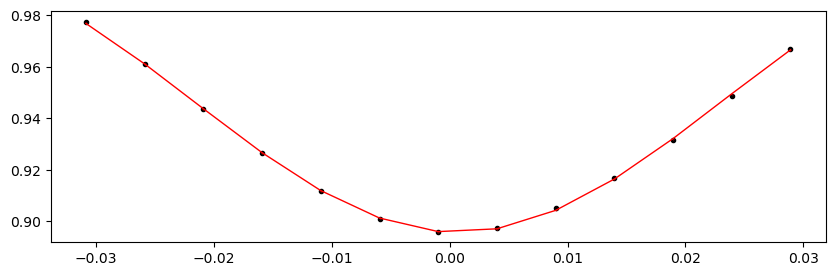

2455339.4671428 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.39it/s]


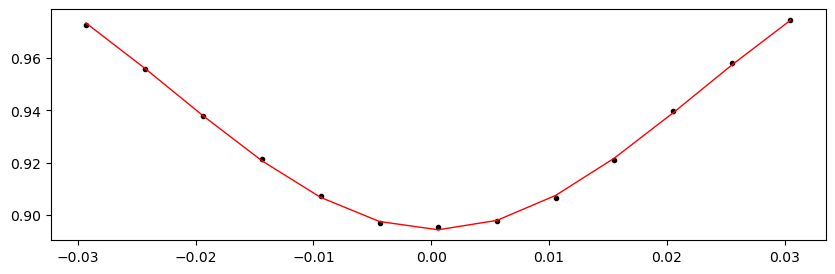

2455343.5680135996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.47it/s]


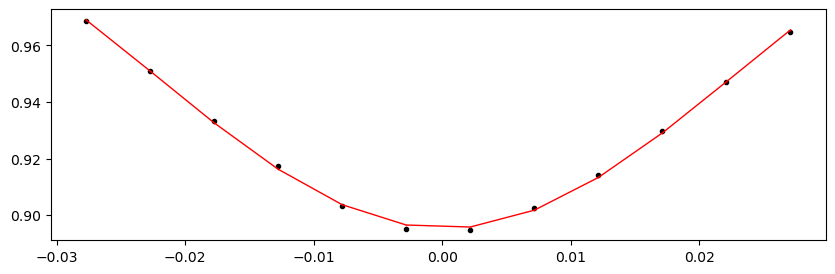

2455347.6688844 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.86it/s]


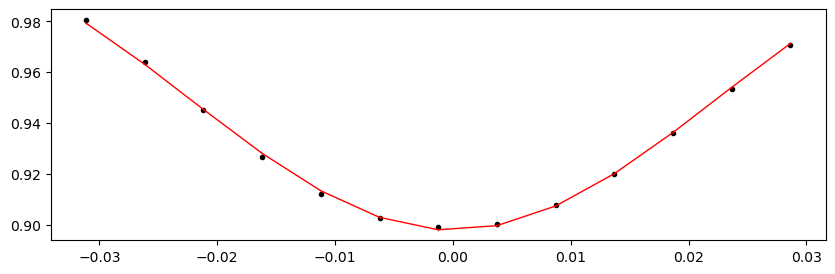

2455351.7697551996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.49it/s]


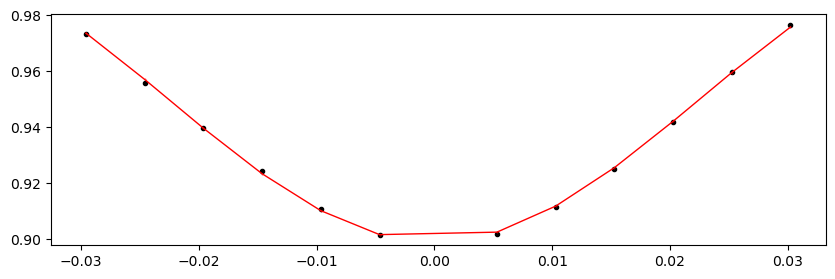

2455355.8706259998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.48it/s]


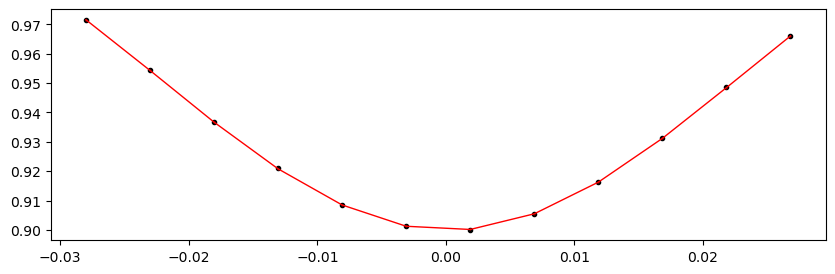

2455359.9714968 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.78it/s]


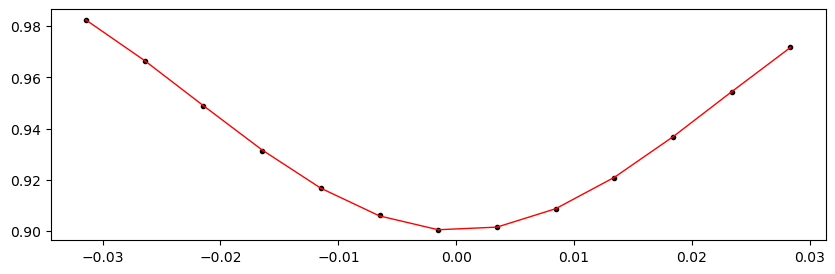

2455364.0723675997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.29it/s]


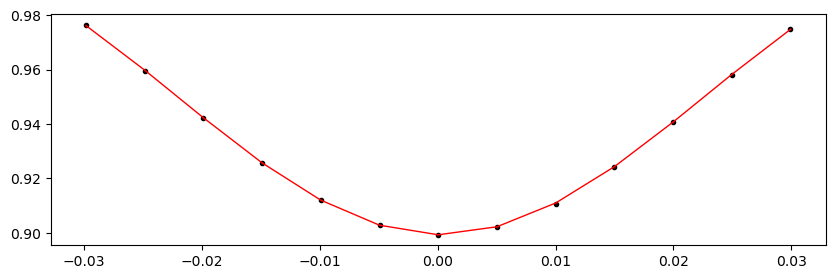

2455368.1732384 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.41it/s]


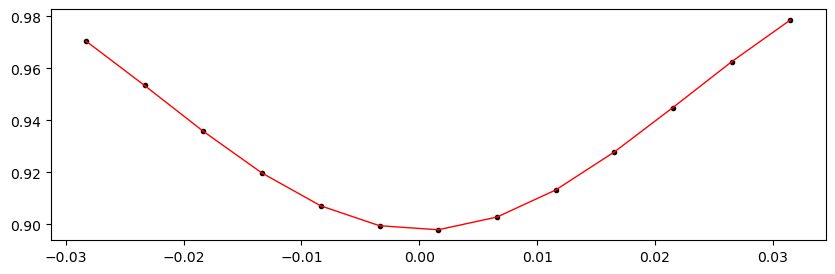

2455376.37498 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.11it/s]


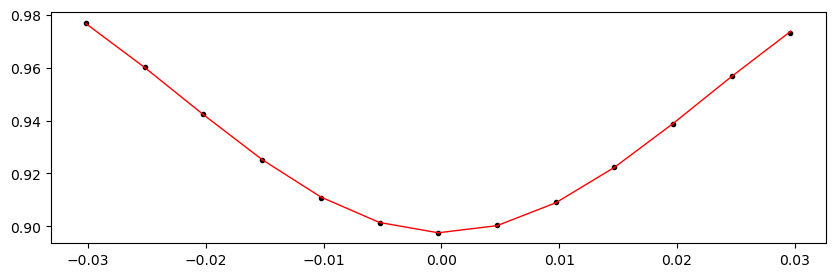

2455380.4758507996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.55it/s]


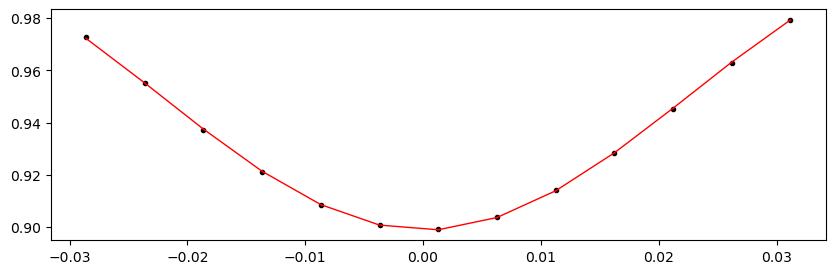

2455384.5767216 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.30it/s]


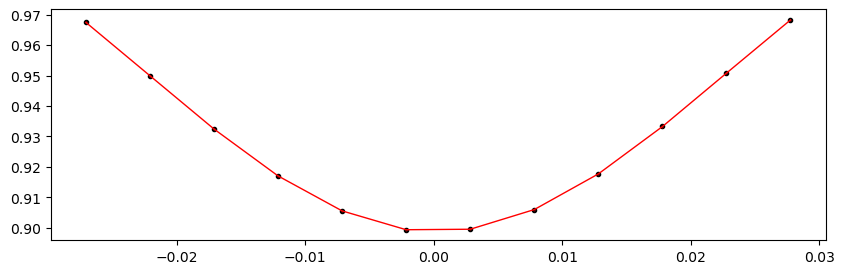

2455388.6775923995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.51it/s]


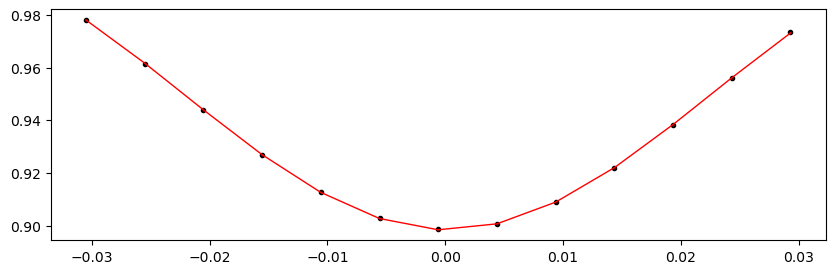

2455392.7784631997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.80it/s]


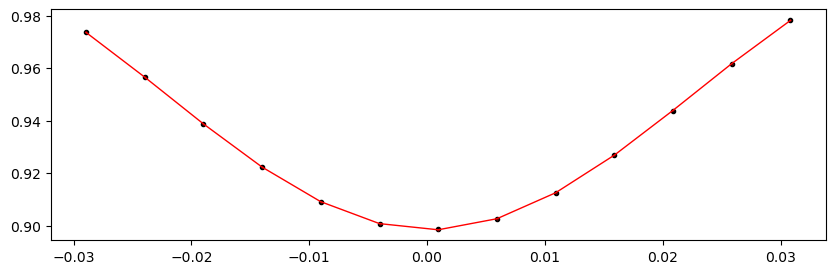

2455396.879334 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.62it/s]


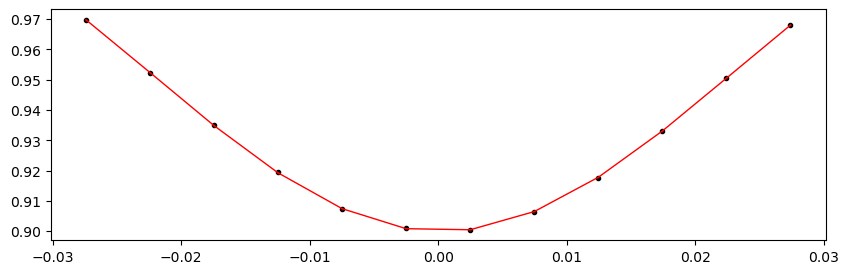

2455400.9802047997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.03it/s]


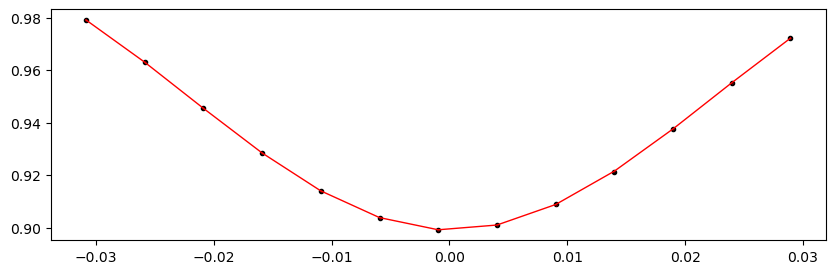

2455405.0810756 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.48it/s]


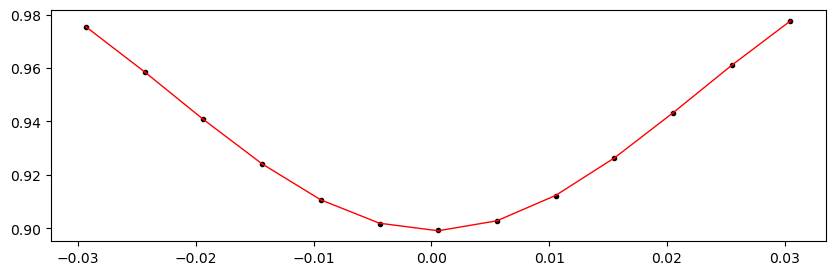

2455409.1819463996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.61it/s]


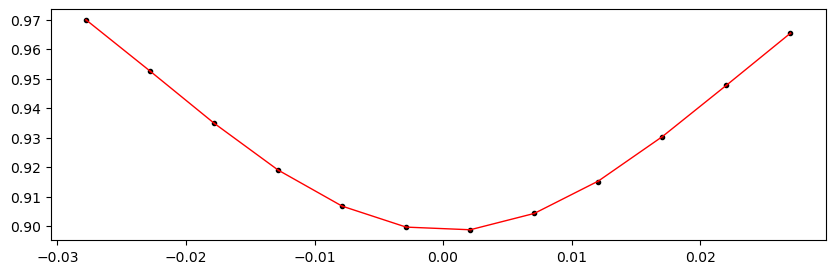

2455413.2828172 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.11it/s]


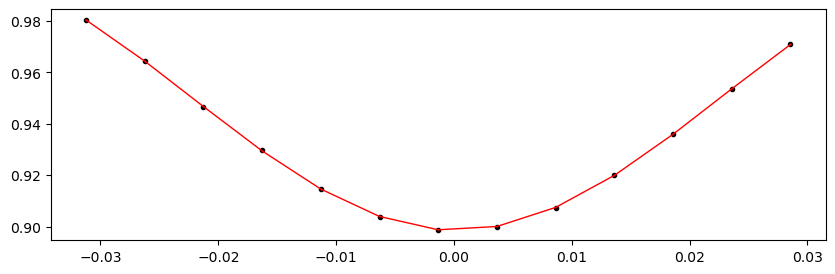

2455417.3836879996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.36it/s]


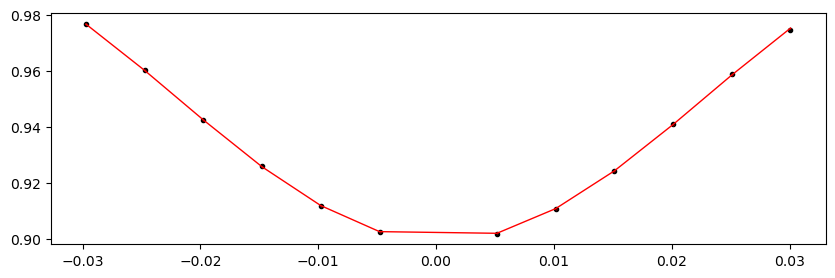

2455421.4845588 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.03it/s]


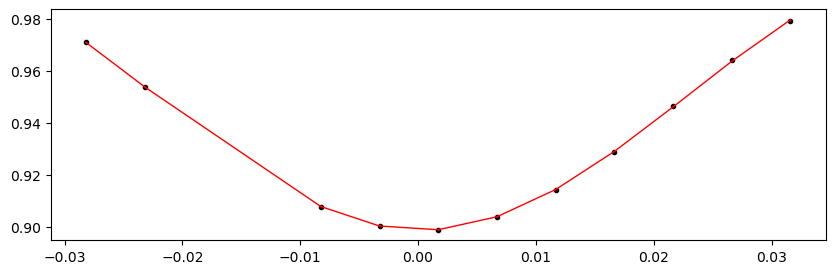

2455425.5854295995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.60it/s]


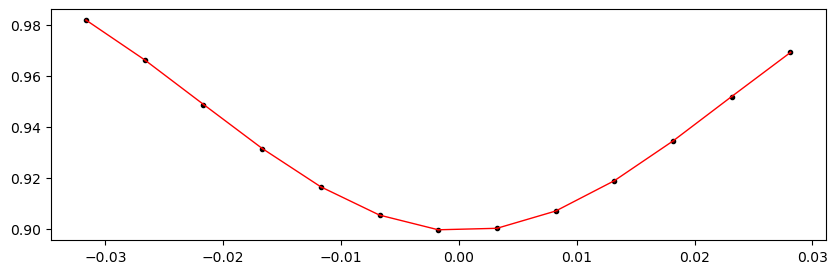

2455429.6863003997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.74it/s]


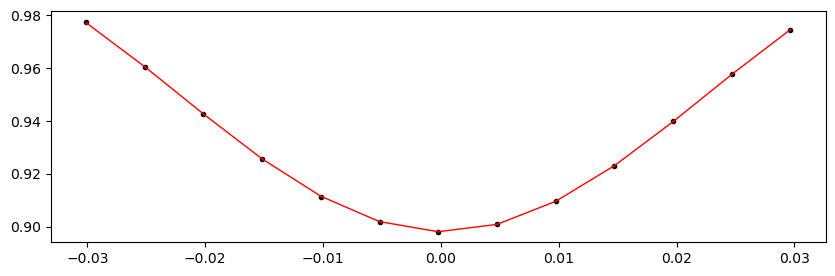

2455433.7871712 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.45it/s]


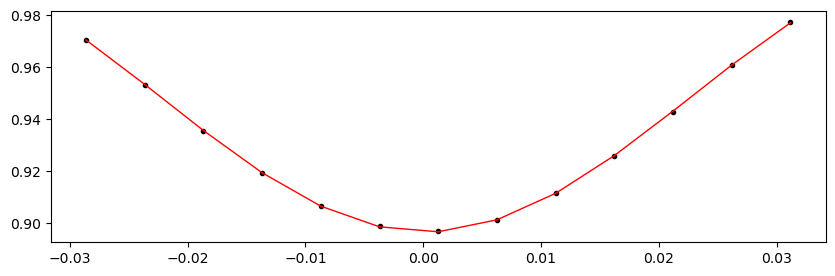

2455437.8880419997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.52it/s]


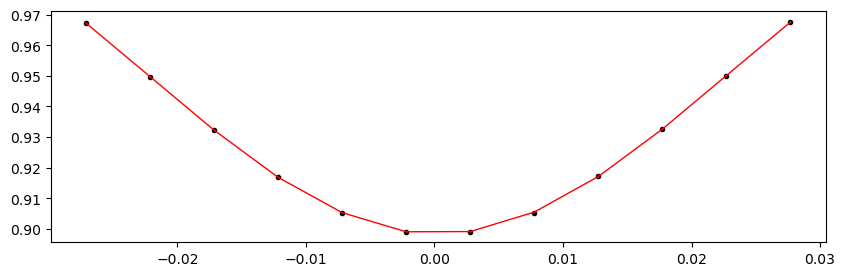

2455441.9889128 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 333.06it/s]


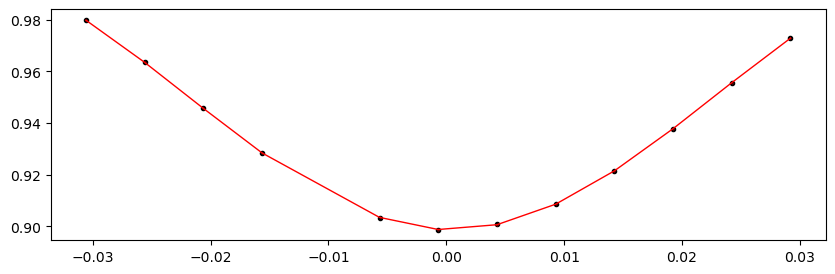

2455446.0897835996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 367.51it/s]


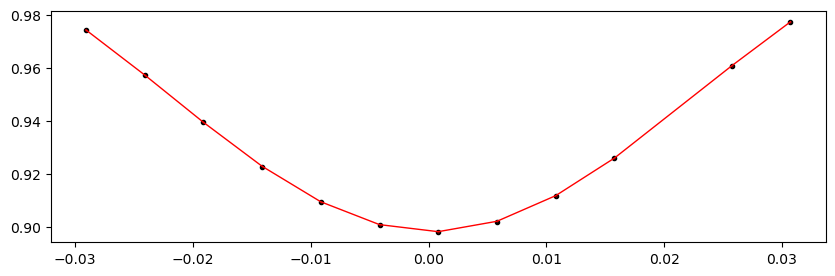

2455450.1906544 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.46it/s]


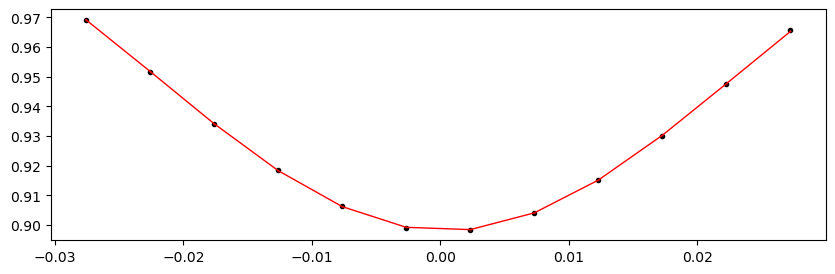

2455454.2915251995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.12it/s]


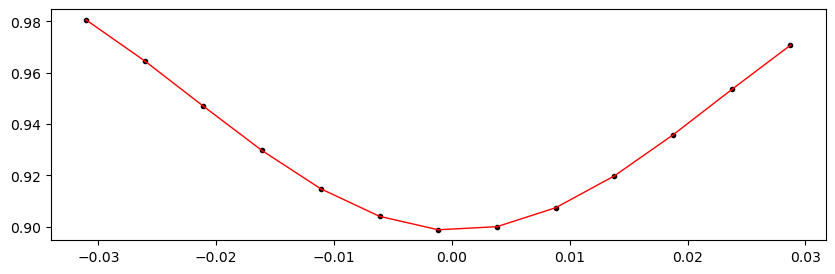

2455458.3923959997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.39it/s]


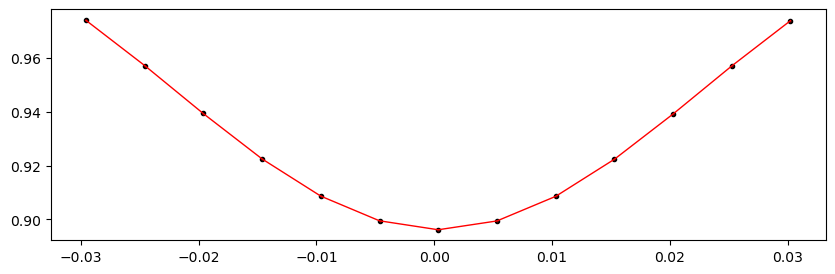

2455466.5941375997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.28it/s]


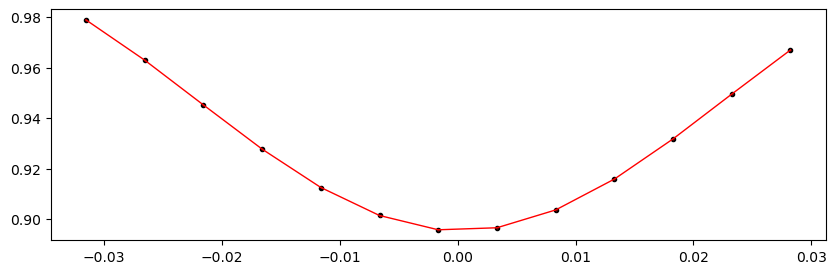

2455470.6950084 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.57it/s]


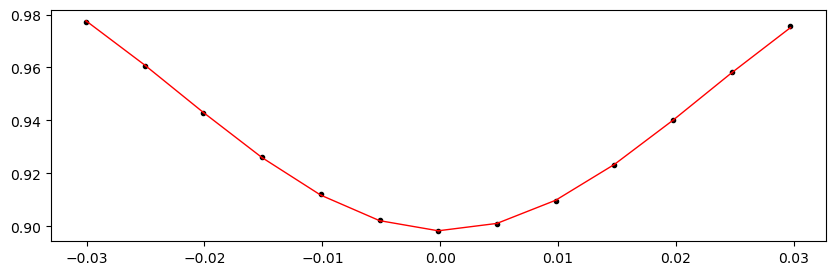

2455474.7958791996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.87it/s]


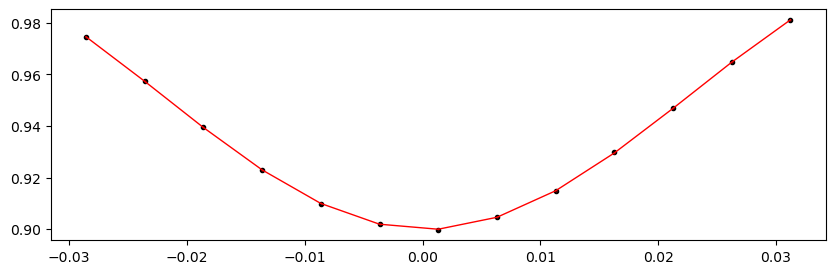

2455478.89675 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.68it/s]


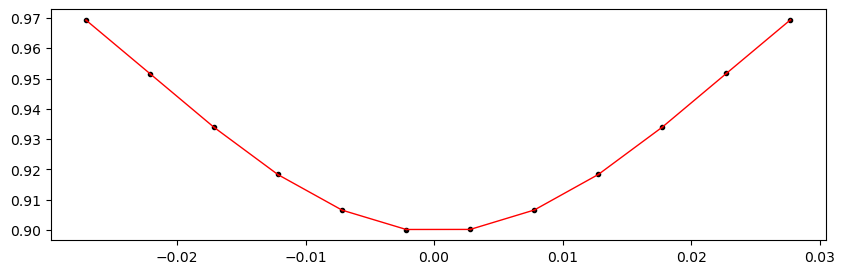

2455482.9976207996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.80it/s]


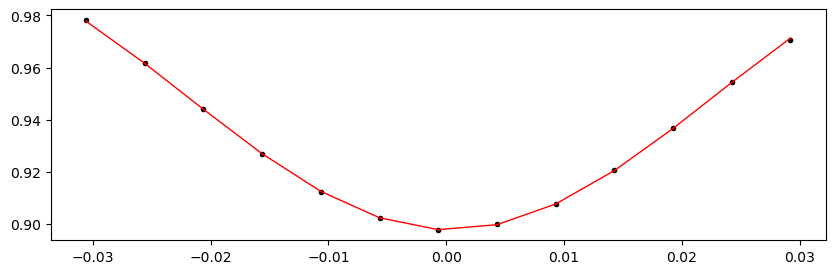

2455487.0984916 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.84it/s]


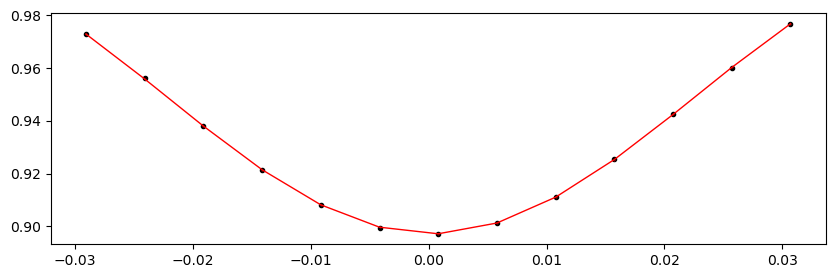

2455491.1993623995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.20it/s]


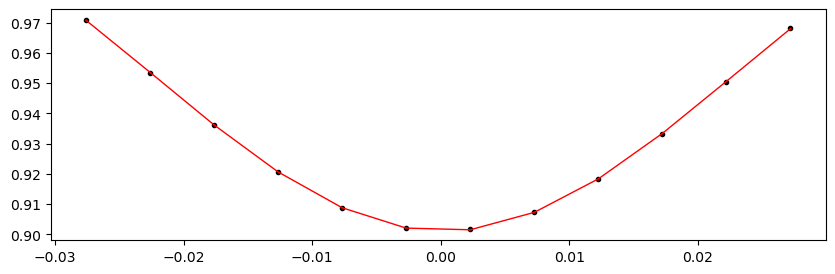

2455495.3002331997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.72it/s]


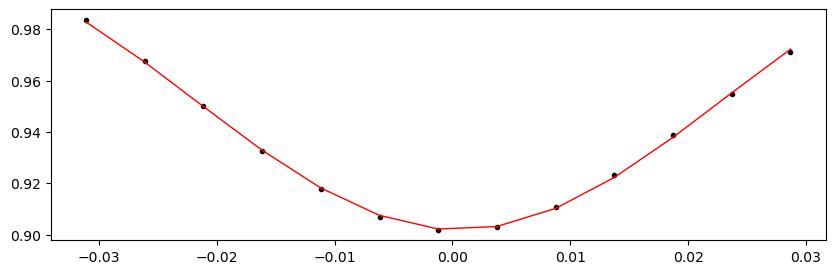

2455499.401104 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.63it/s]


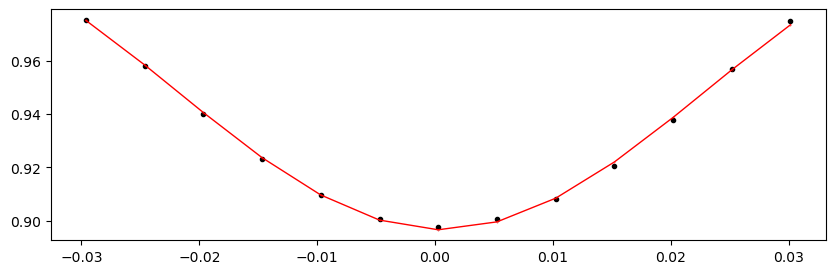

2455503.5019747997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.02it/s]


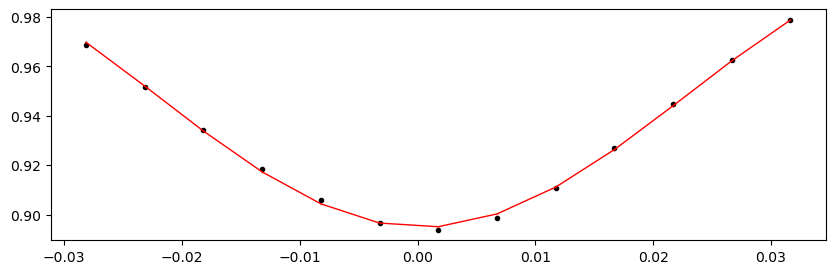

2455507.6028456 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.93it/s]


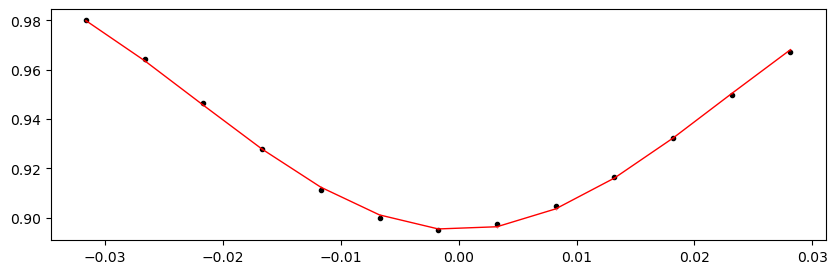

2455511.7037163996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.78it/s]


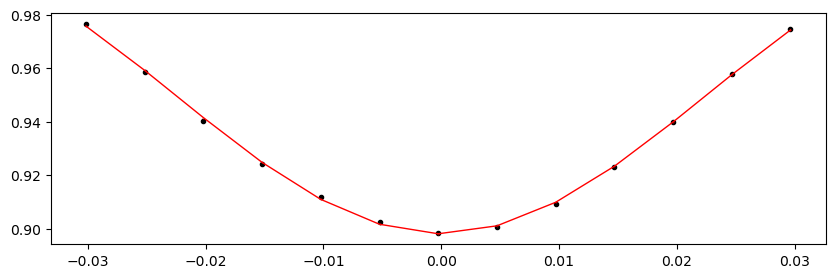

2455515.8045872 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.84it/s]


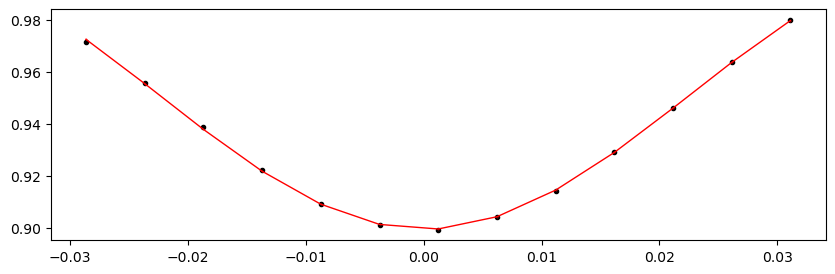

2455519.9054579996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.44it/s]


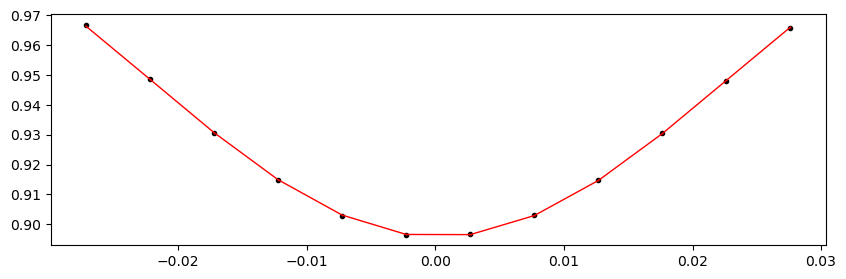

2455528.1071995995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.11it/s]


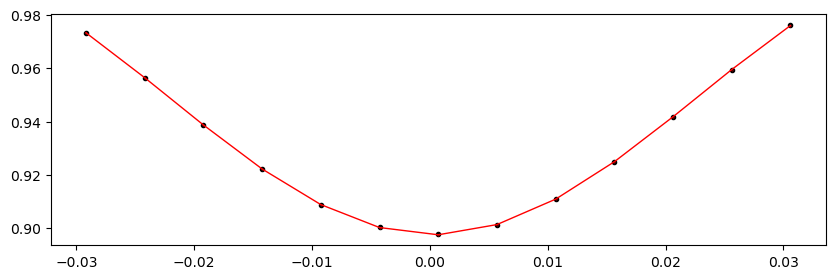

2455532.2080703997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.64it/s]


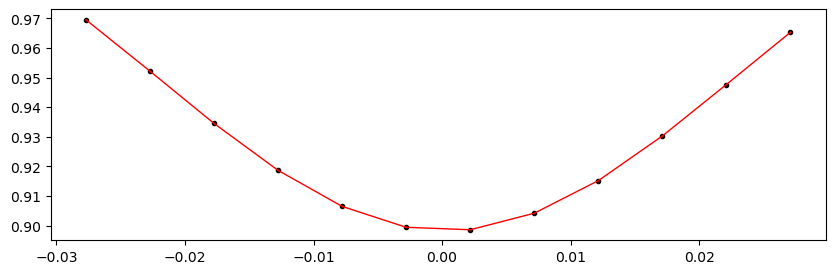

2455536.3089412 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.30it/s]


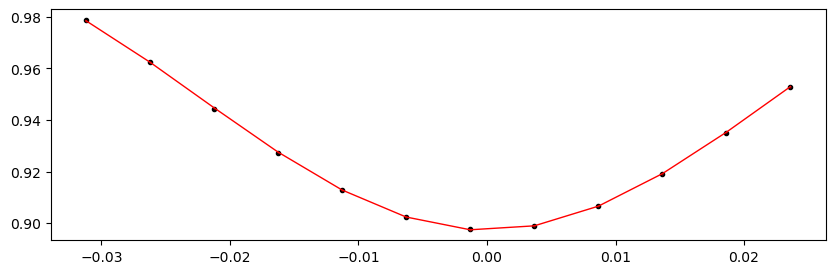

2455540.4098119996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.80it/s]


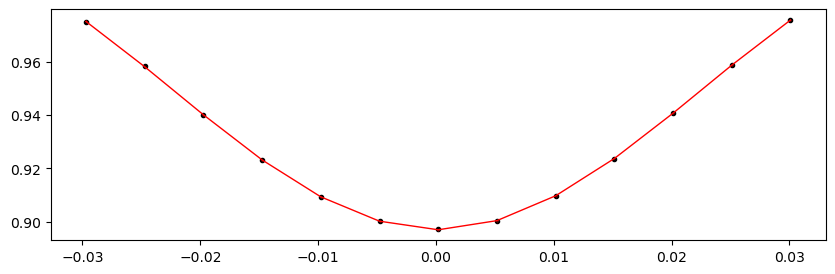

2455544.5106828 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.06it/s]


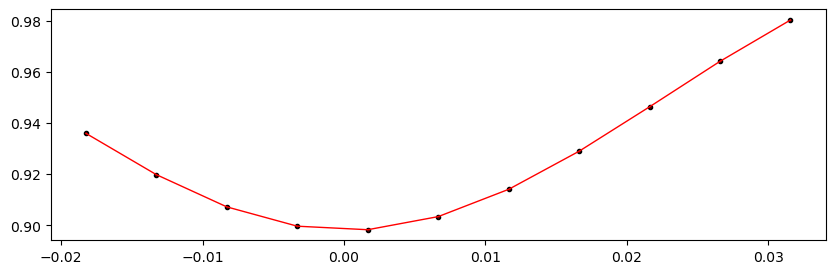

2455548.6115535996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.68it/s]


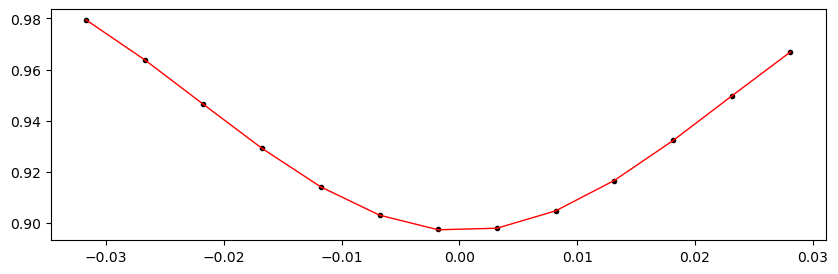

2455569.1159075997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.75it/s]


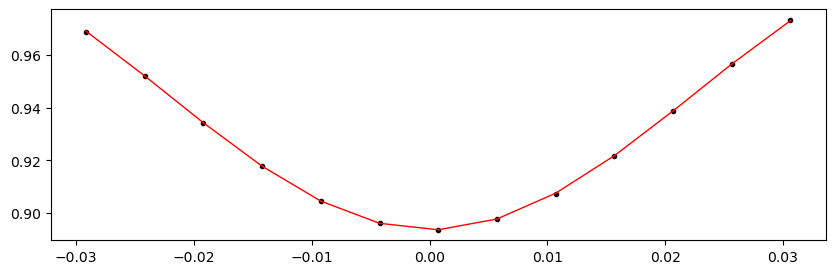

2455573.2167784 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.53it/s]


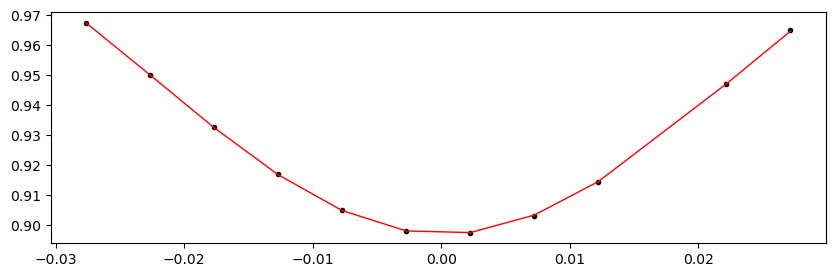

2455577.3176491996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.52it/s]


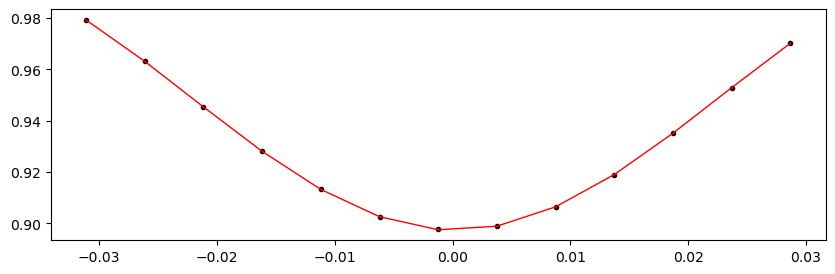

2455581.41852 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.76it/s]


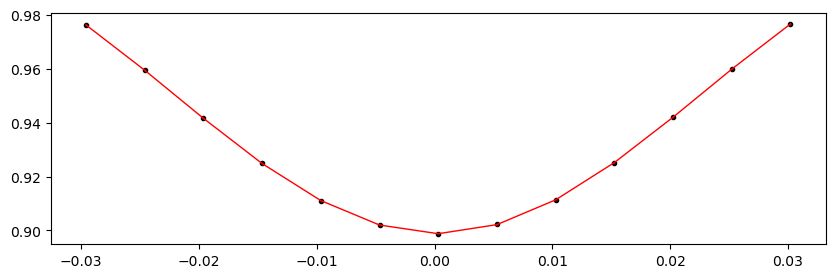

2455585.5193907996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.50it/s]


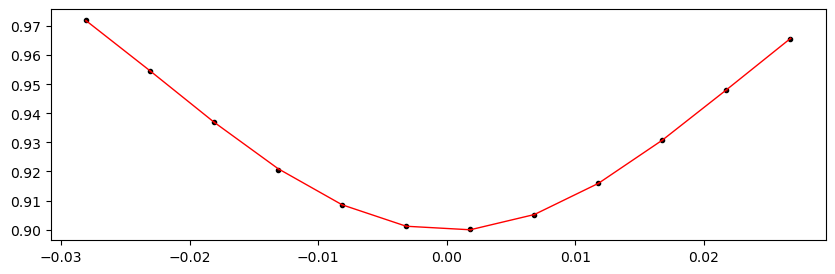

2455589.6202616 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.05it/s]


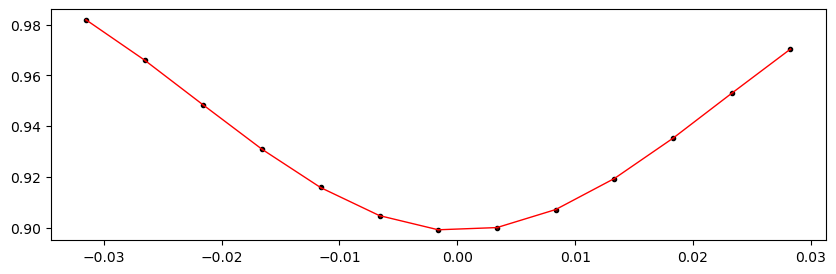

2455593.7211323995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.17it/s]


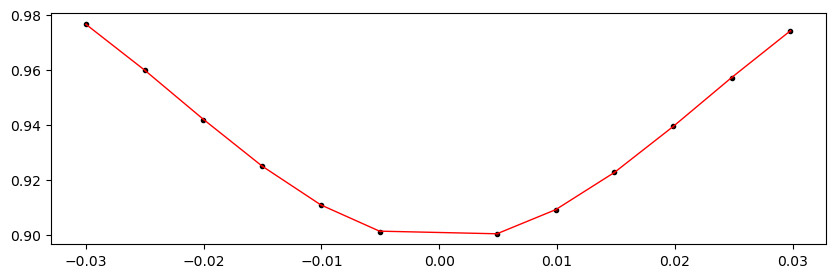

2455597.8220031997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.67it/s]


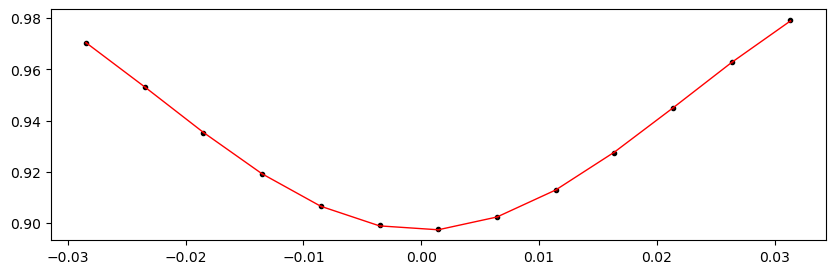

2455601.922874 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.66it/s]


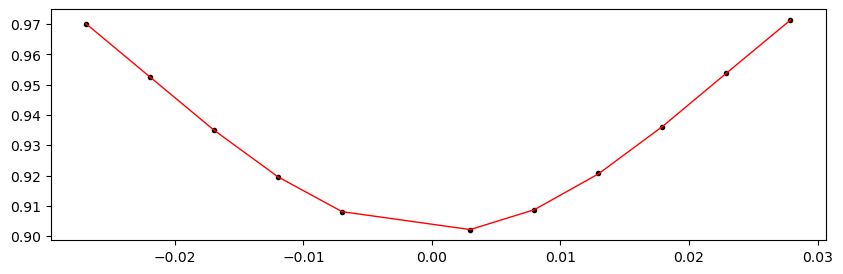

2455606.0237447997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.20it/s]


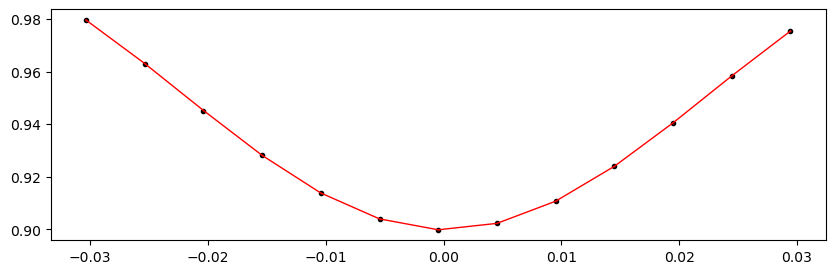

2455610.1246156 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.75it/s]


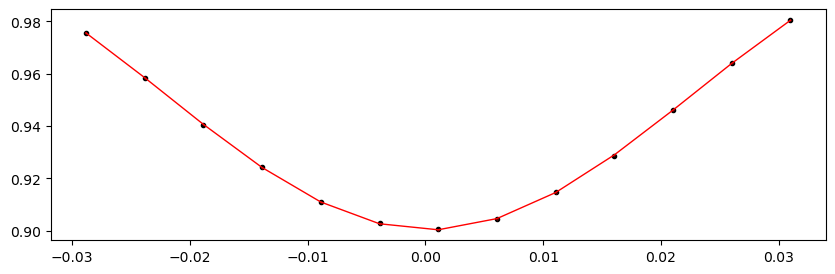

2455614.2254863996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.96it/s]


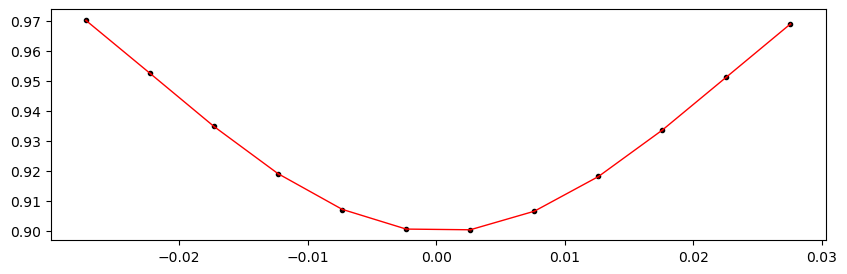

2455618.3263572 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.39it/s]


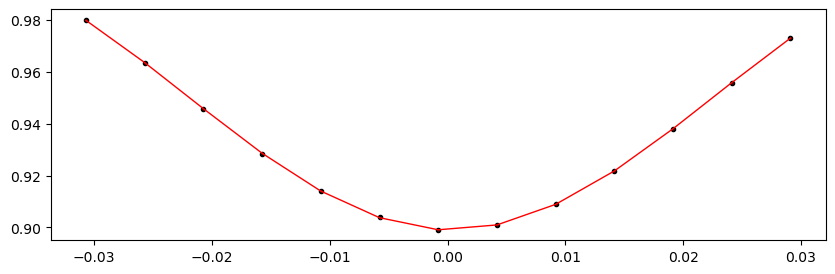

2455622.4272279995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.96it/s]


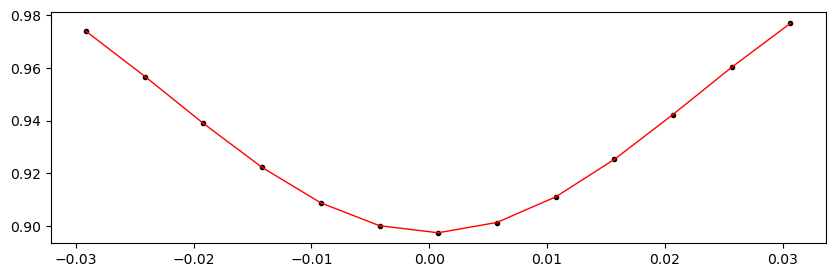

2455626.5280987998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.11it/s]


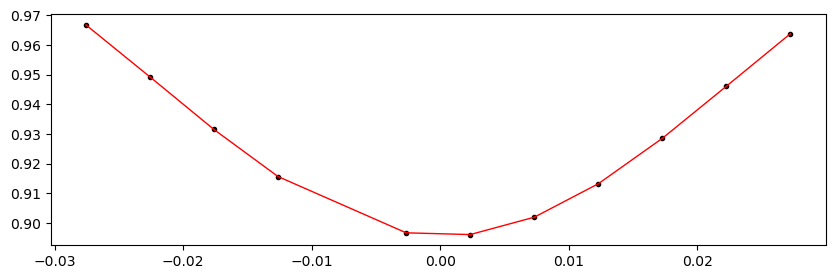

2455630.6289696 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.09it/s]


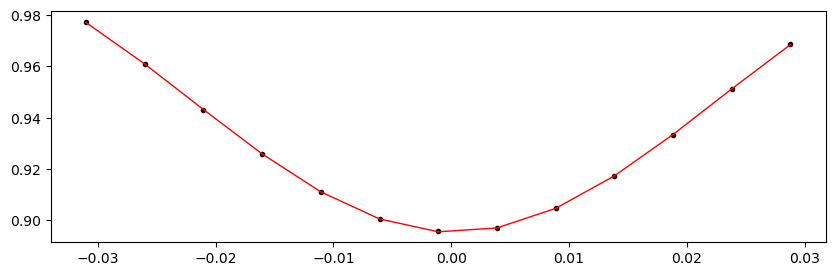

2455634.7298403997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.63it/s]


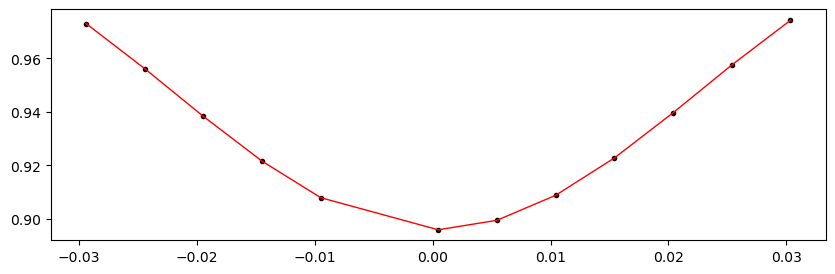

2455642.9315819996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.28it/s]


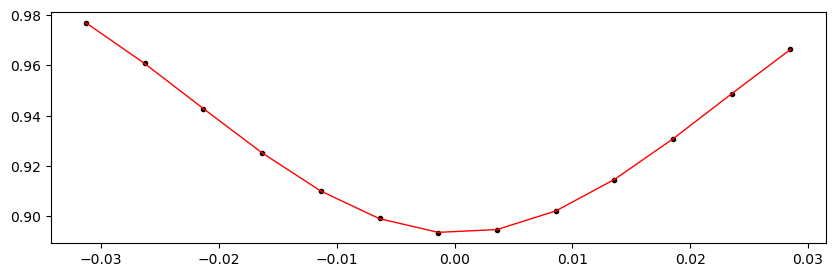

2455647.0324528 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.62it/s]


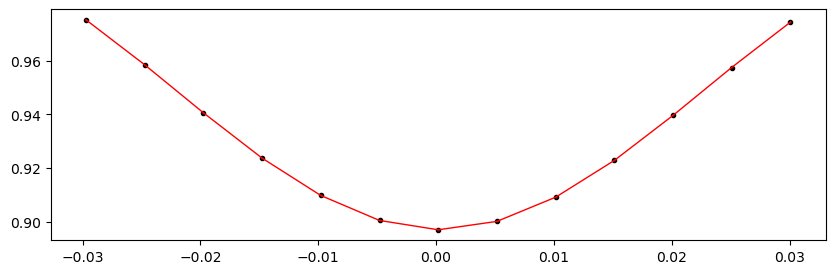

2455651.1333235996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.48it/s]


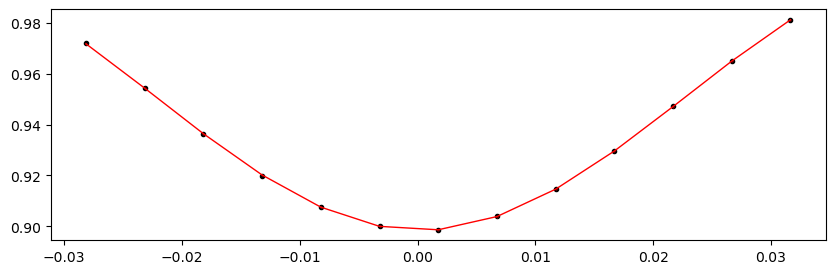

2455655.2341944 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.20it/s]


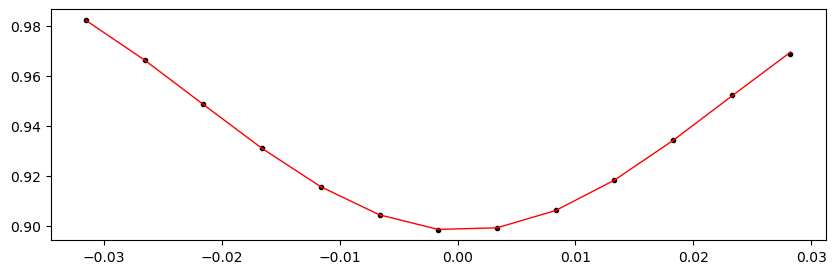

2455659.3350651995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.75it/s]


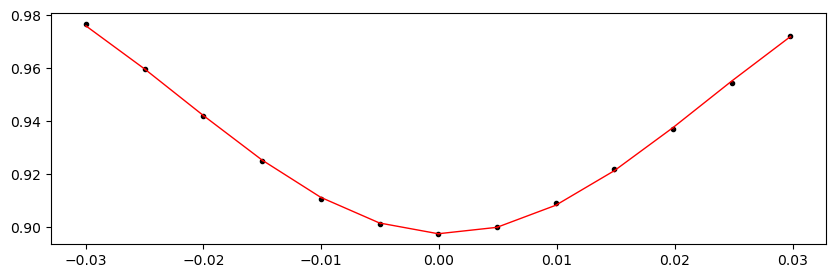

2455663.4359359997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.02it/s]


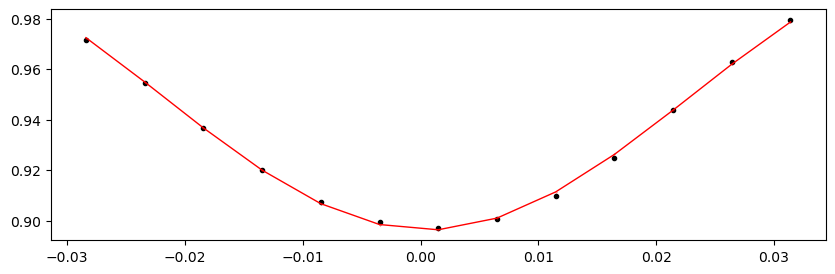

2455667.5368068 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.44it/s]


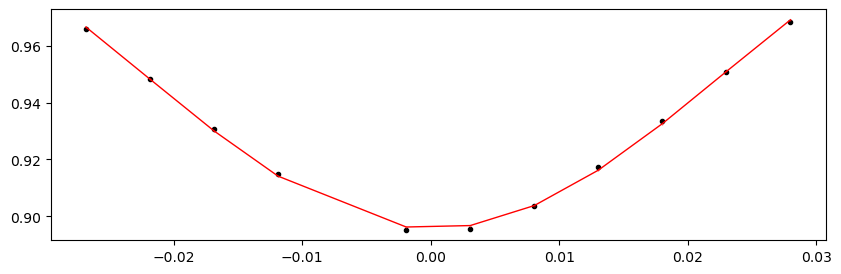

2455671.6376775997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.74it/s]


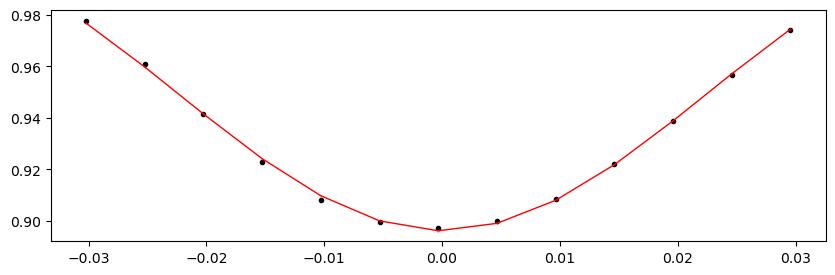

2455675.7385484 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.30it/s]


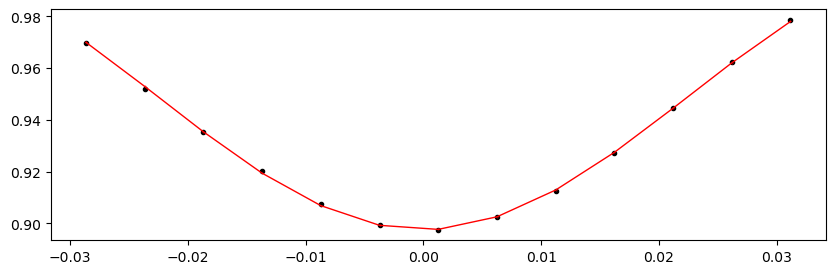

2455679.8394191996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.13it/s]


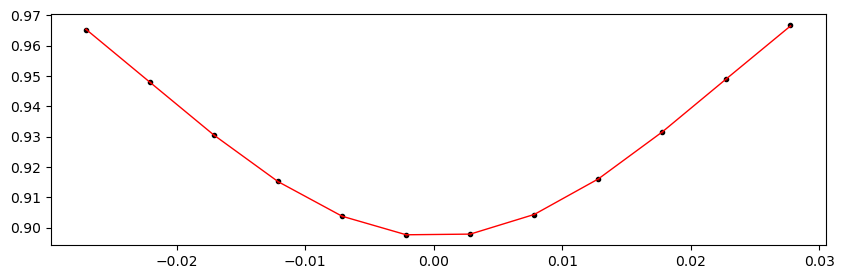

2455683.94029 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.79it/s]


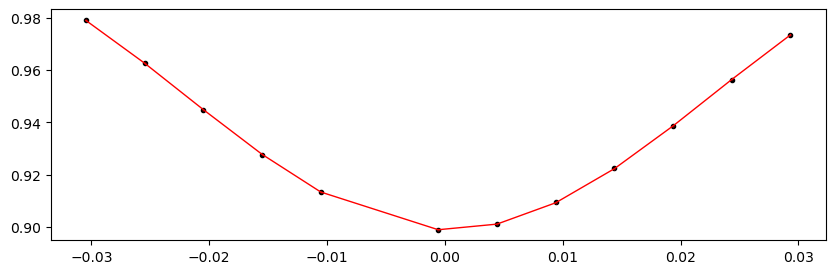

2455688.0411607996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.28it/s]


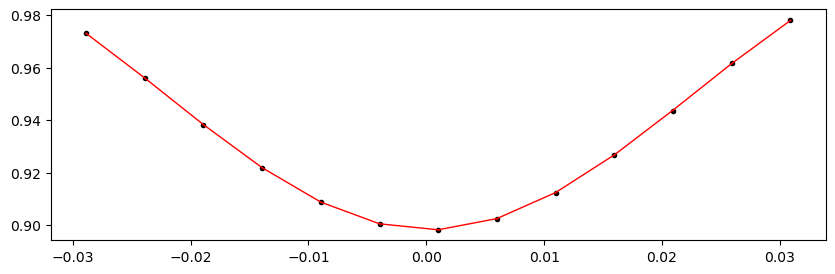

2455692.1420316 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.13it/s]


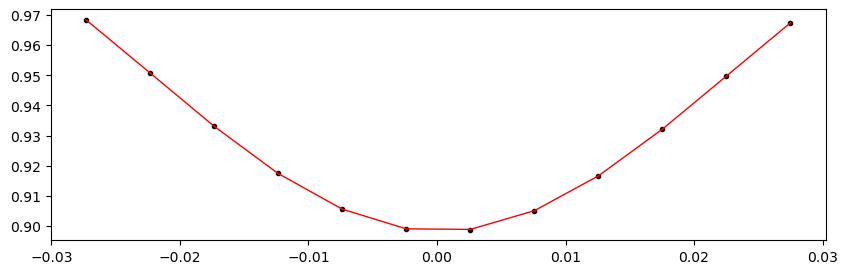

2455696.2429023995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.99it/s]


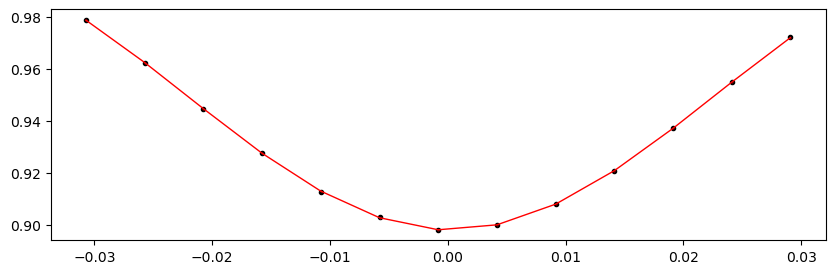

2455700.3437731997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.37it/s]


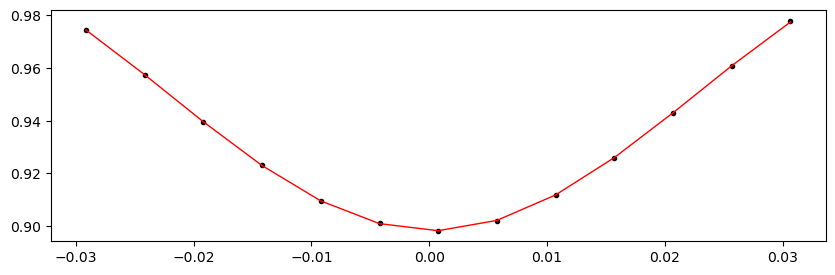

2455704.444644 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.84it/s]


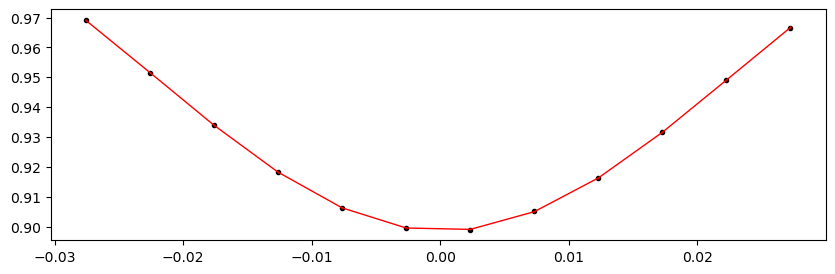

2455708.5455147997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.52it/s]


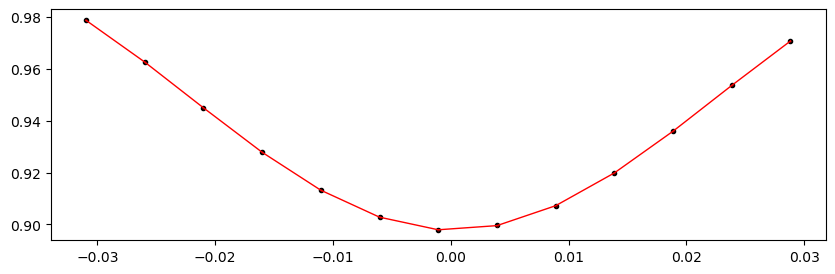

2455712.6463856 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.16it/s]


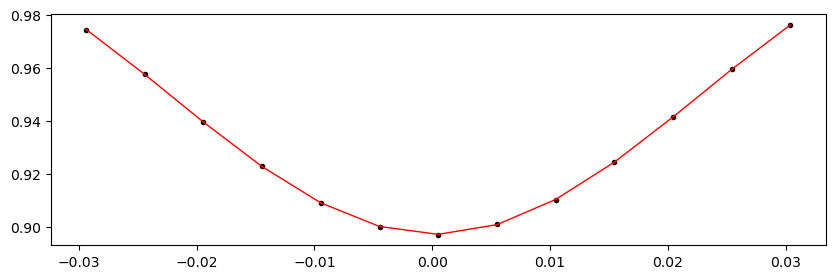

2455716.7472563996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.73it/s]


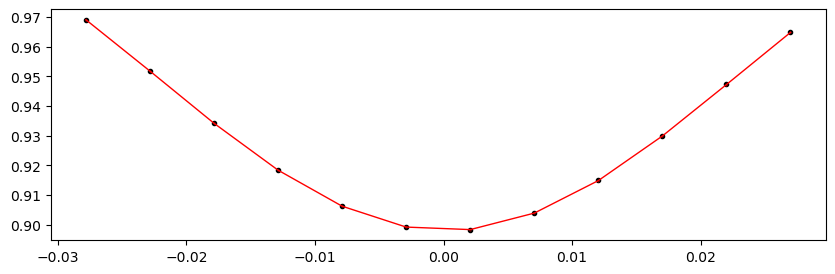

2455720.8481272 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.39it/s]


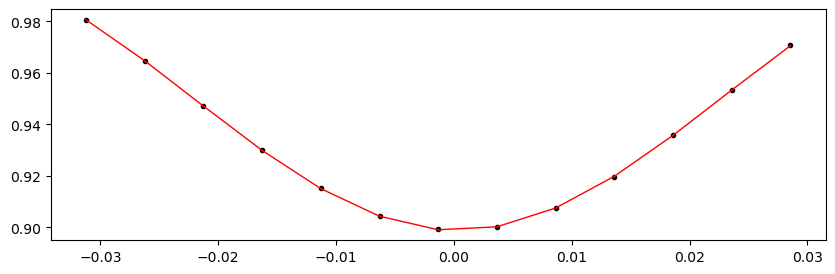

2455724.9489979995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.58it/s]


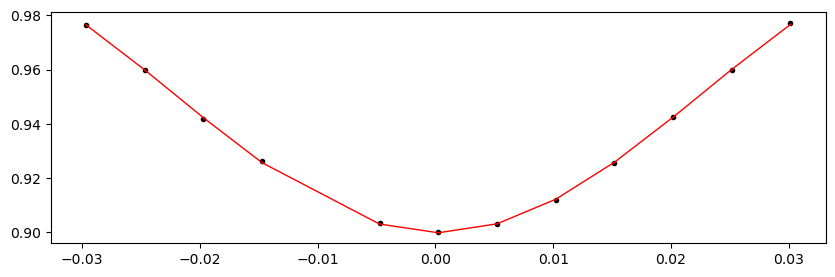

2455729.0498687997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.54it/s]


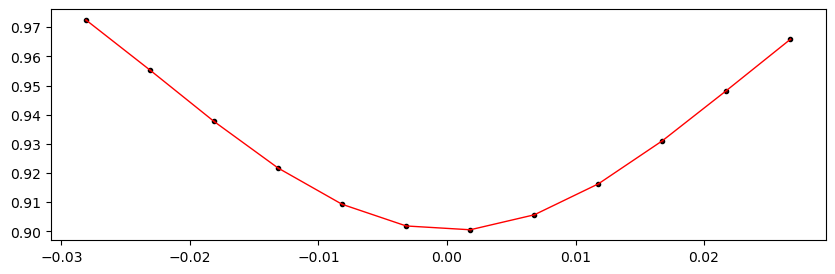

2455733.1507396 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.35it/s]


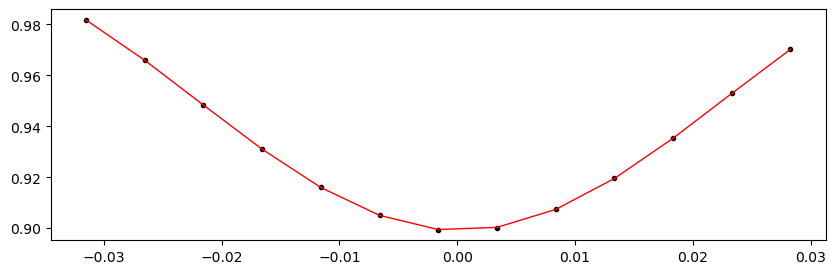

2455737.2516103997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.42it/s]


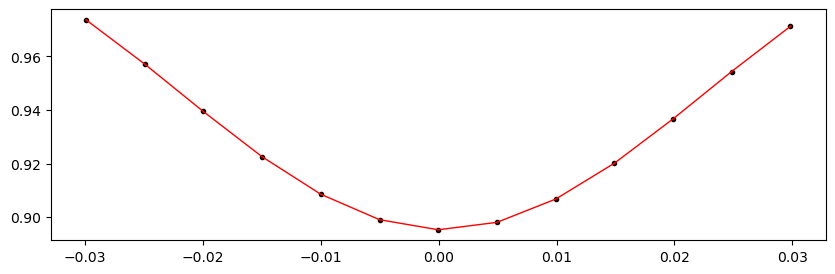

2455741.3524812 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.40it/s]


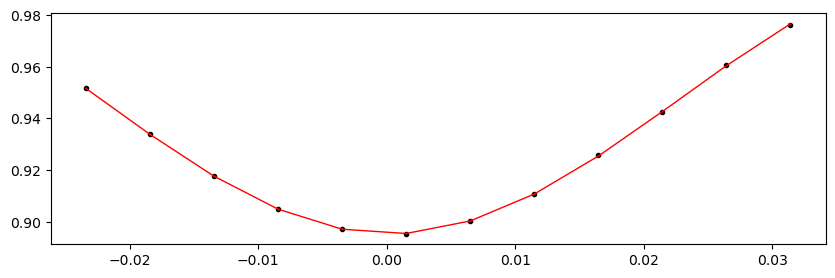

2455745.4533519996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.67it/s]


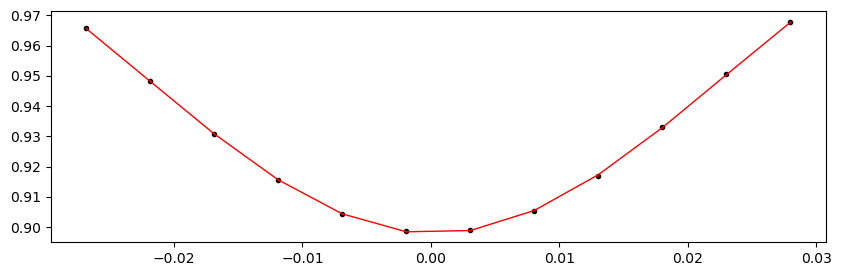

2455749.5542228 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.20it/s]


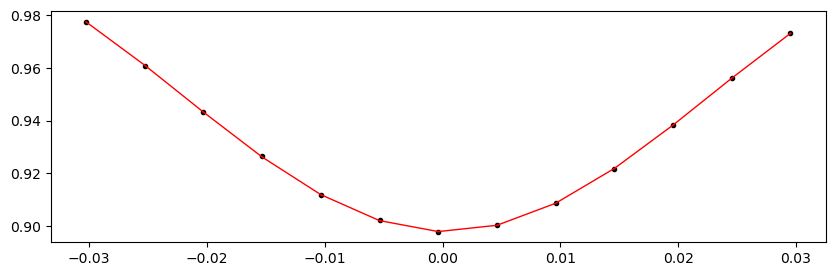

2455753.6550935996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 370.07it/s]


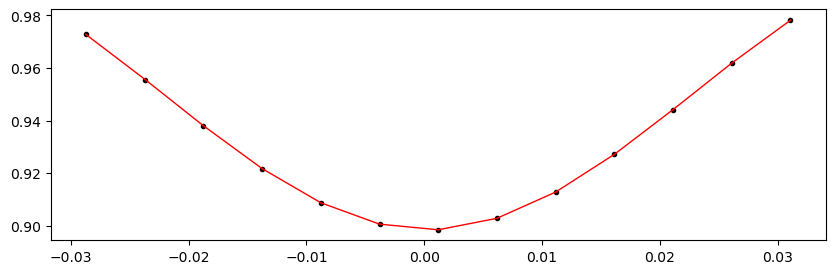

2455757.7559644 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 315.46it/s]


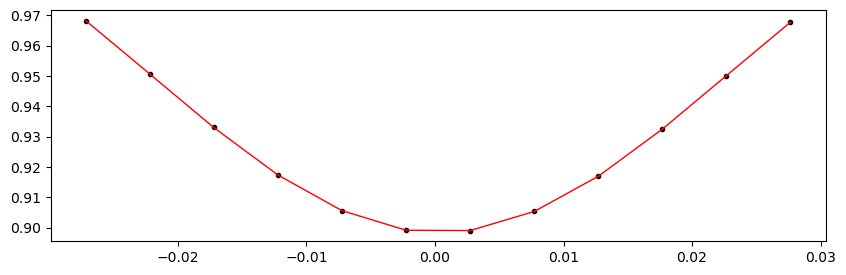

2455761.8568351995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 363.76it/s]


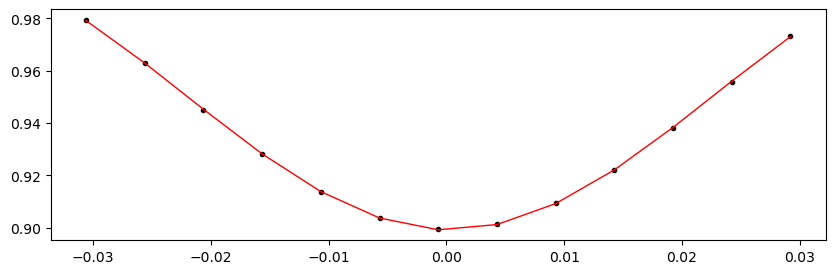

2455765.9577059997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 355.77it/s]


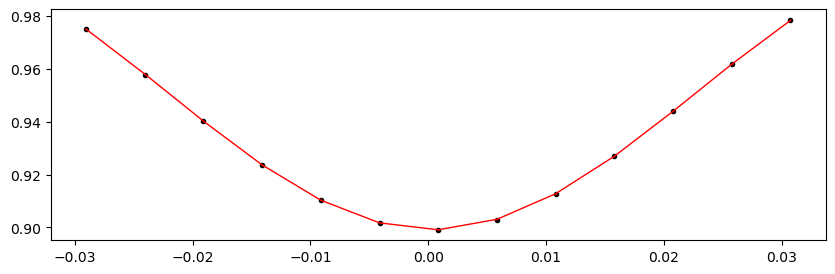

Time 2455770.0585768 does not have enough data points: 1
2455774.1594475997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 326.19it/s]


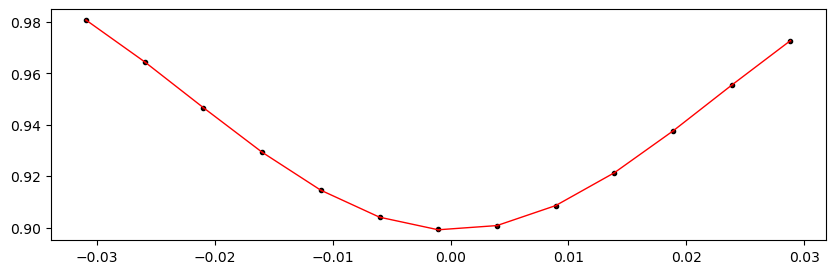

2455778.2603184 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.91it/s]


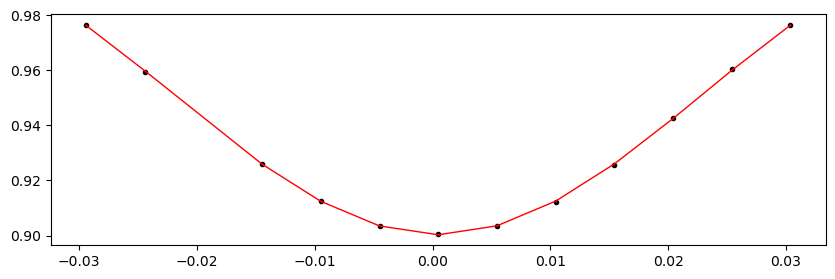

2455782.3611891996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.13it/s]


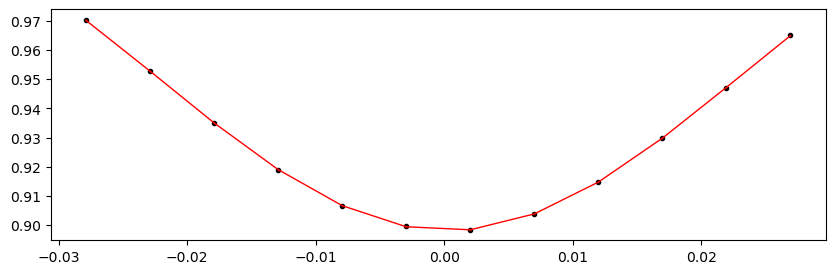

2455786.46206 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 361.83it/s]


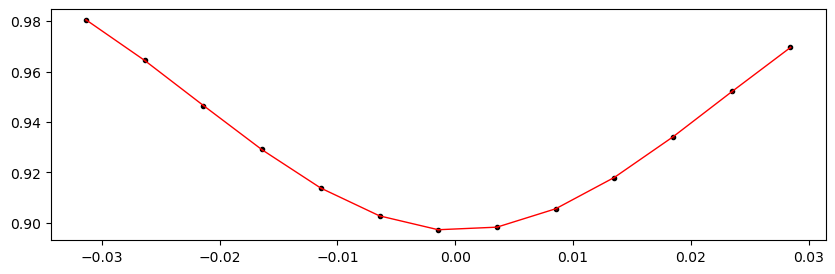

2455790.5629307996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.82it/s]


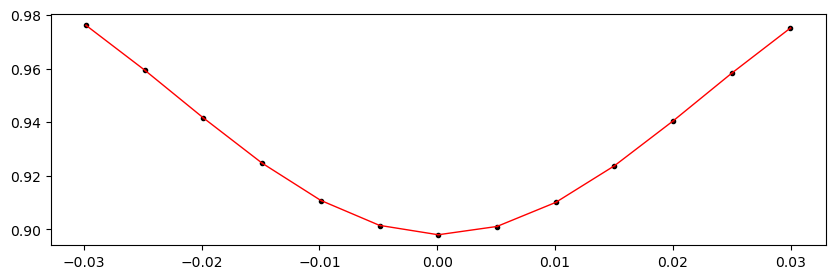

2455794.6638015998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.67it/s]


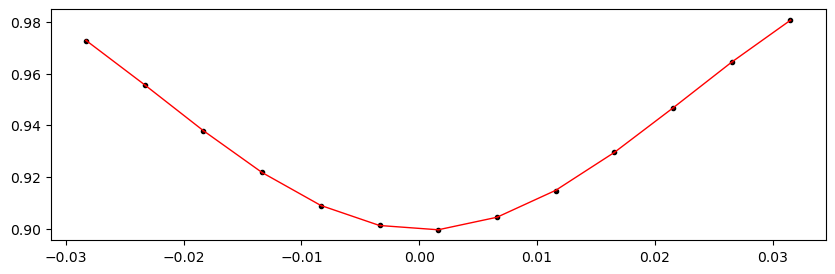

2455798.7646723995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.26it/s]


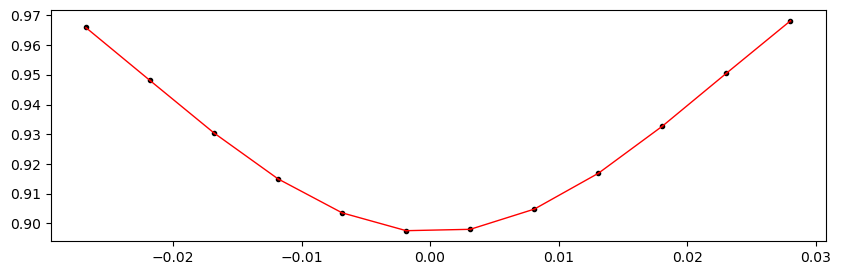

2455806.966414 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.58it/s]


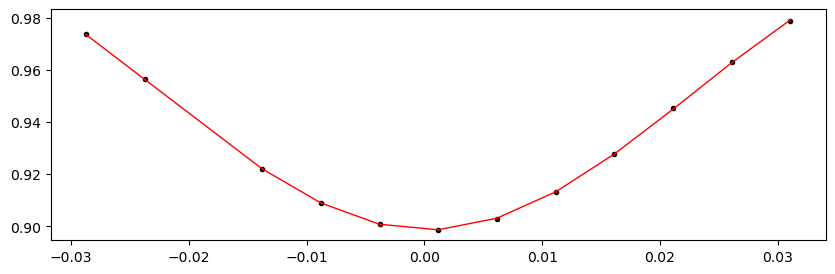

2455811.0672847996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.24it/s]


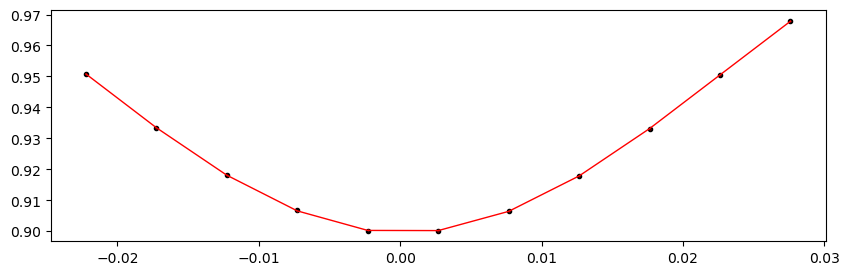

2455815.1681556 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.46it/s]


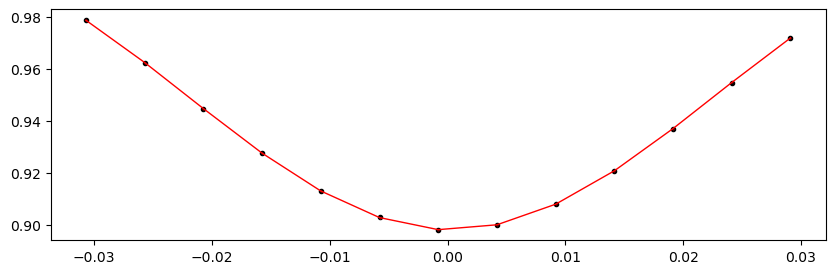

2455819.2690263996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.33it/s]


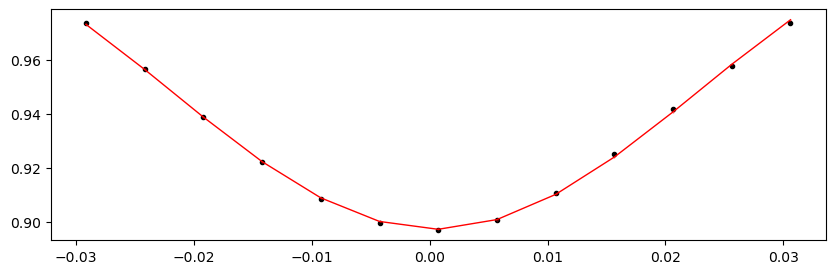

2455823.3698972 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.79it/s]


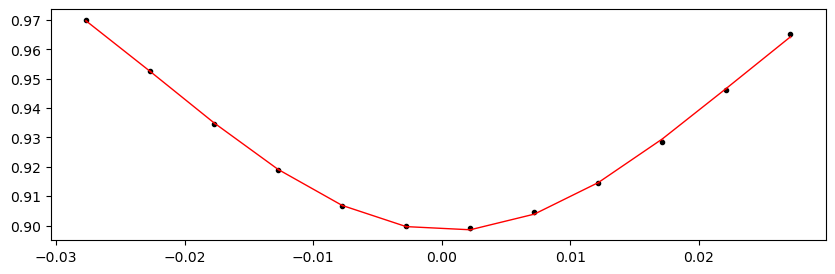

2455827.4707679995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.84it/s]


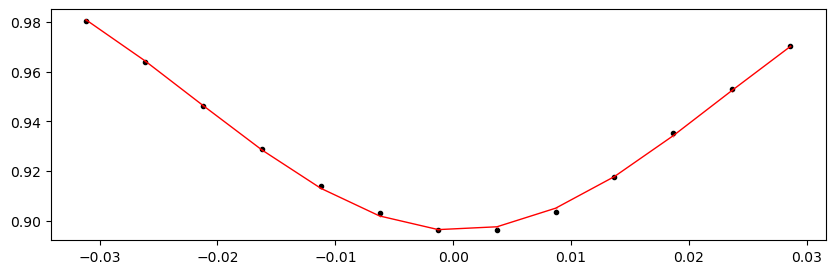

2455831.5716387997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.98it/s]


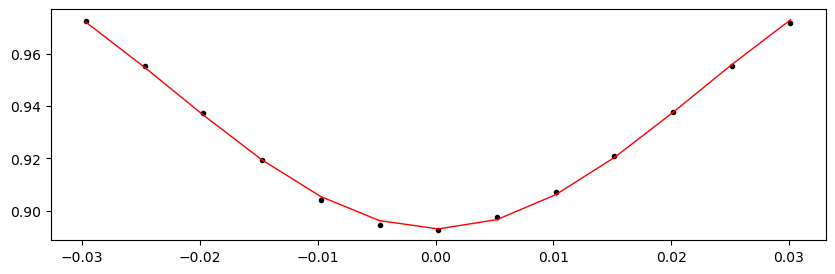

2455835.6725096 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.87it/s]


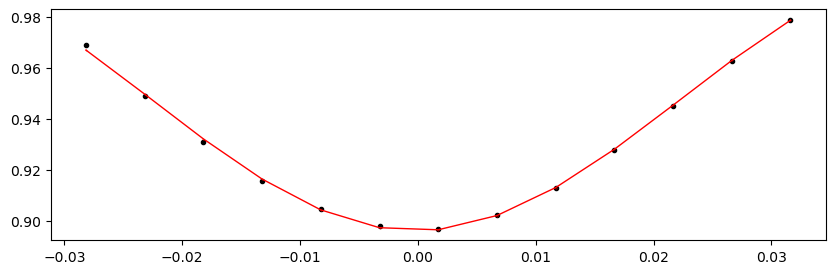

2455839.7733803997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.70it/s]


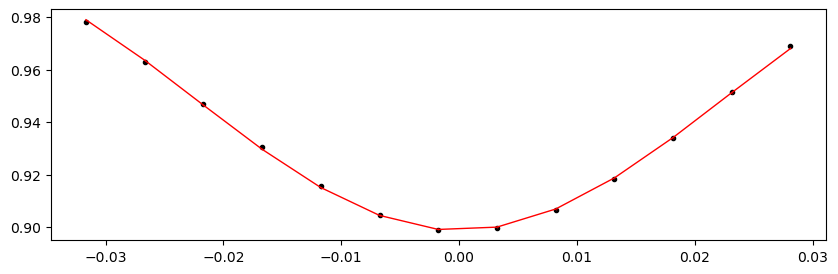

2455843.8742512 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.48it/s]


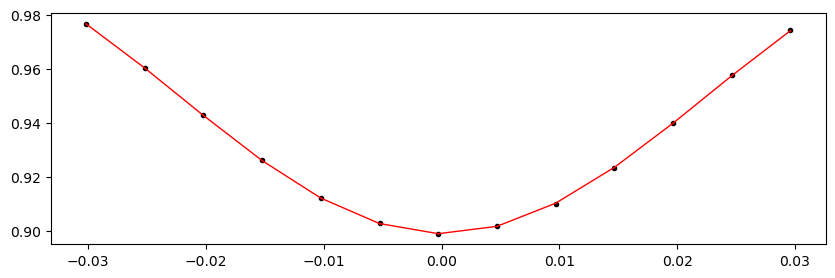

2455847.9751219996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:40<00:00, 249.52it/s]


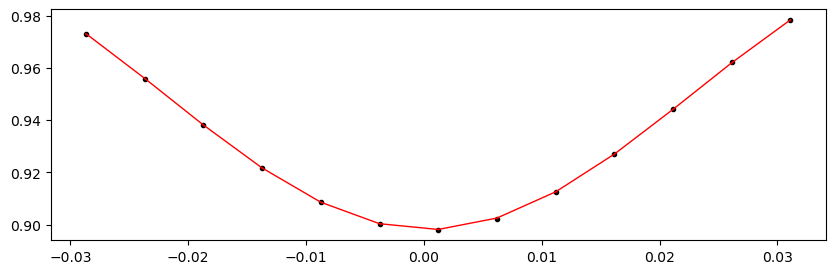

2455852.0759928 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:39<00:00, 254.70it/s]


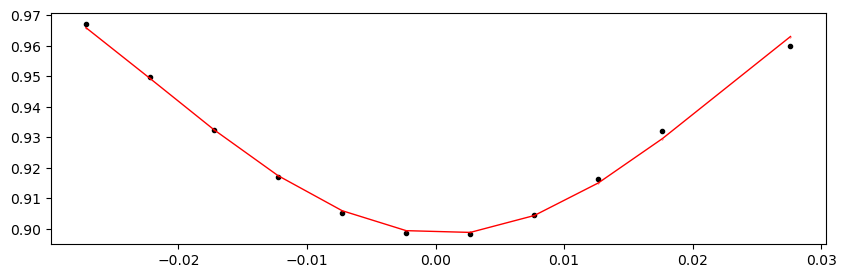

2455856.1768635996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.29it/s]


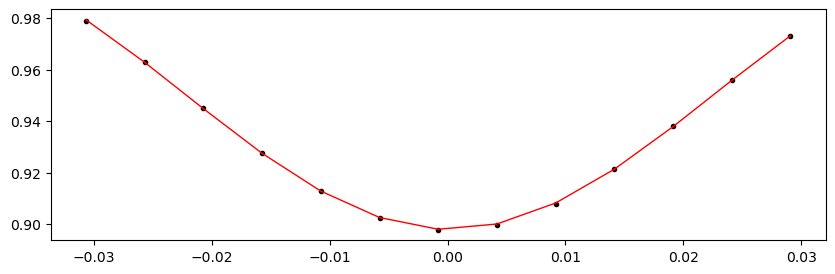

2455860.2777344 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.64it/s]


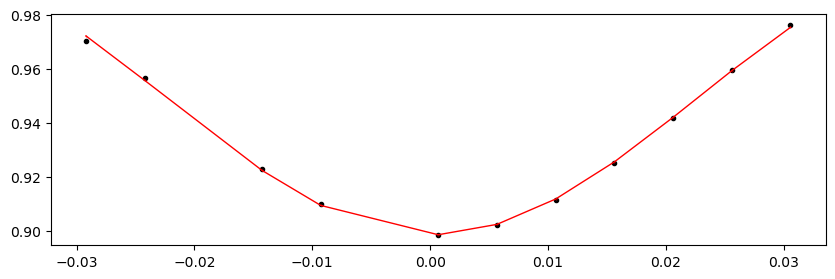

2455864.3786051995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.38it/s]


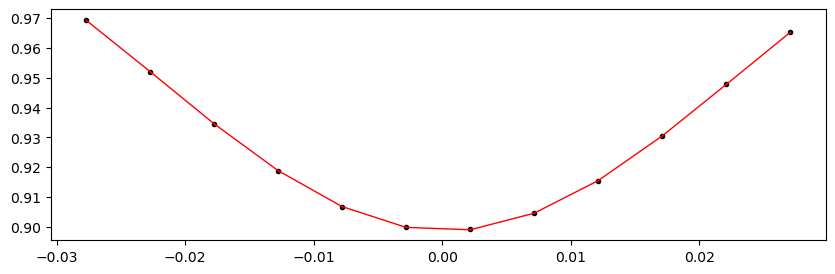

2455868.4794759997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.39it/s]


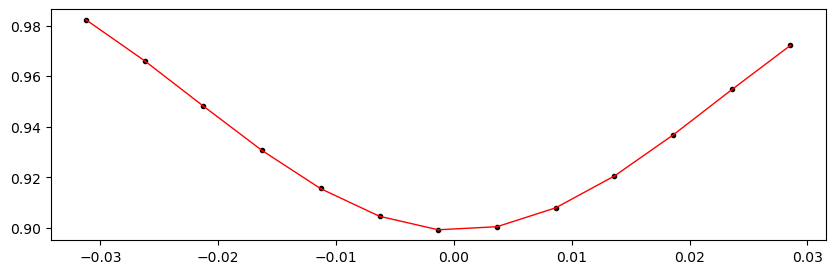

2455872.5803468 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.81it/s]


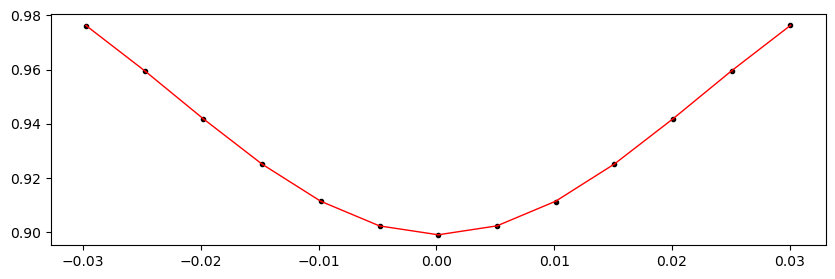

2455876.6812175997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.12it/s]


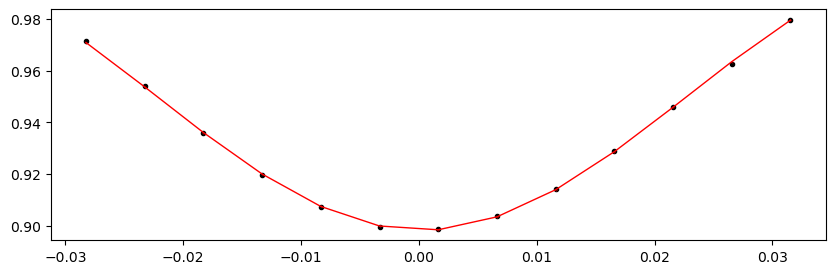

2455880.7820884 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.55it/s]


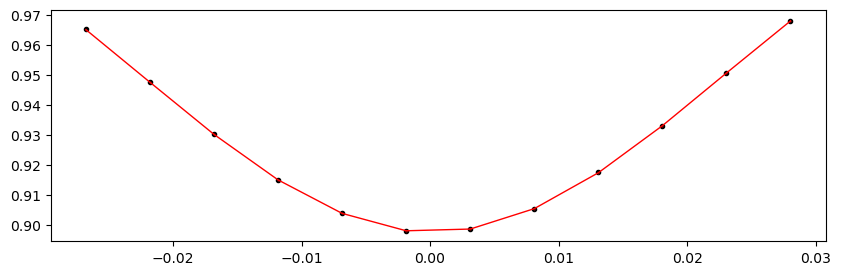

2455884.8829591996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.39it/s]


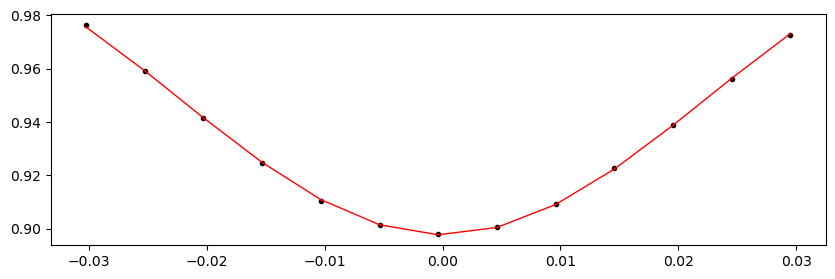

2455888.98383 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 395.18it/s]


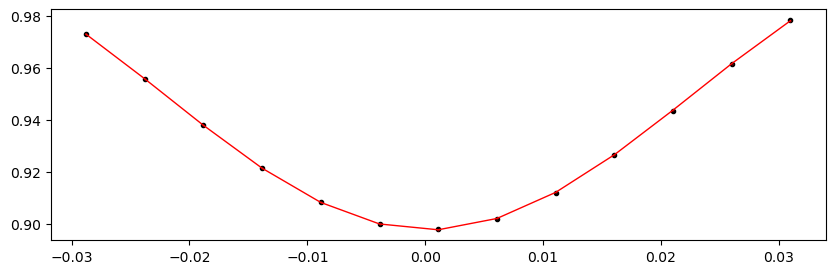

2455893.0847007995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.48it/s]


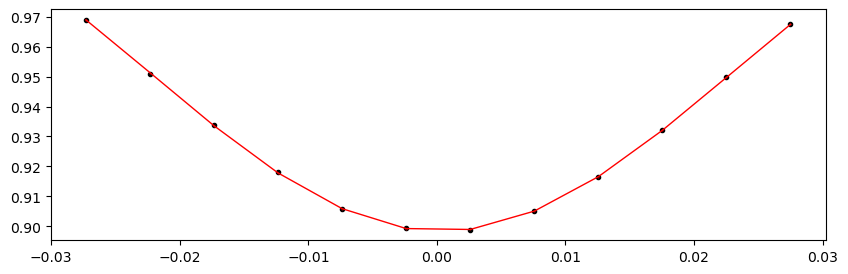

Time 2455897.1855715998 does not have enough data points: 9
2455901.2864424 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.98it/s]


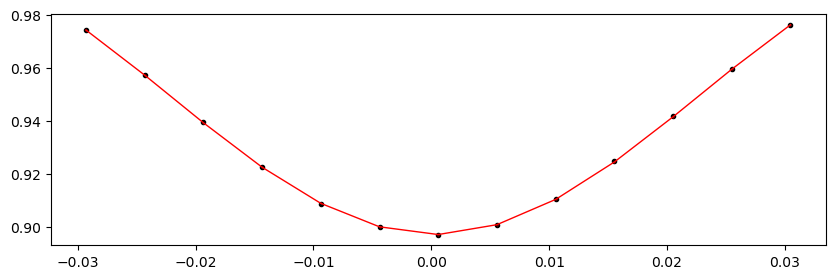

2455909.488184 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.26it/s]


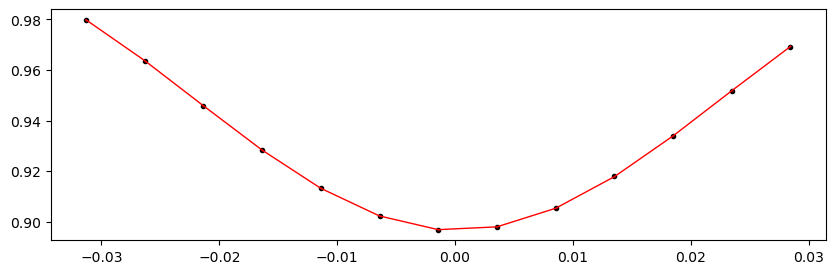

2455913.5890547996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 400.68it/s]


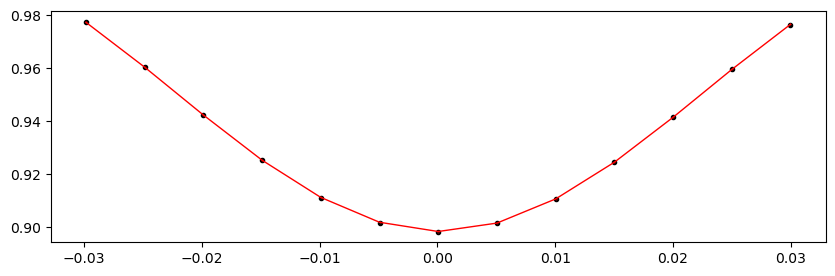

2455917.6899256 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 393.52it/s]


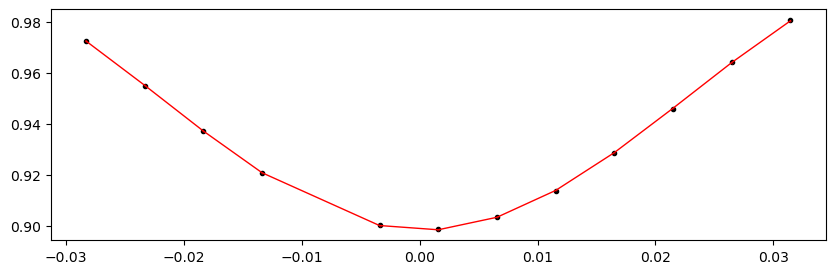

2455921.7907963996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.05it/s]


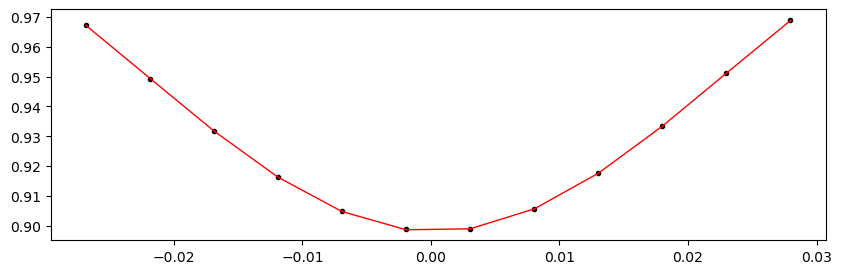

2455925.8916672 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 389.46it/s]


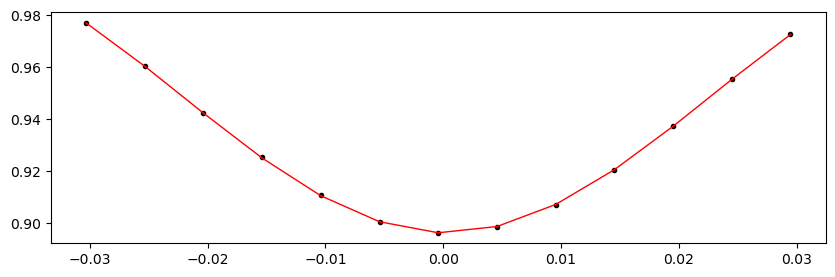

Time 2455929.9925379995 does not have enough data points: 10
2455934.0934087997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.76it/s]


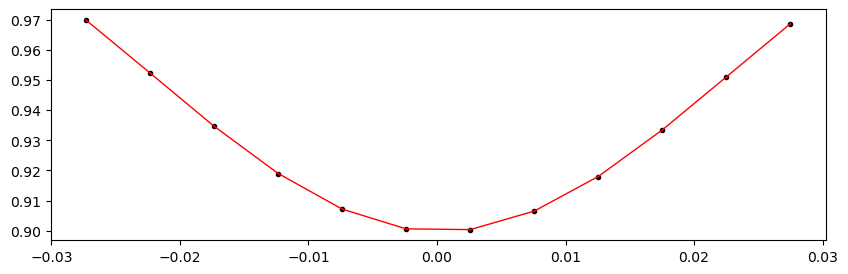

2455938.1942796 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 398.00it/s]


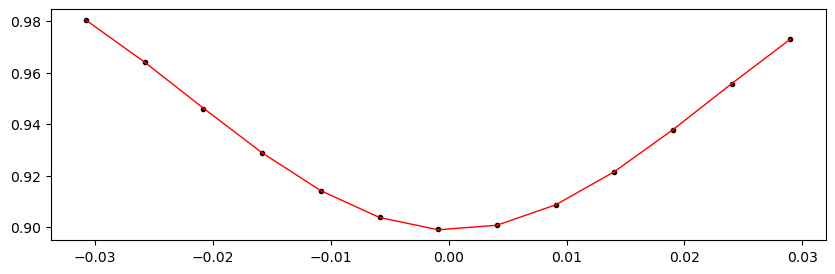

2455942.2951503997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.70it/s]


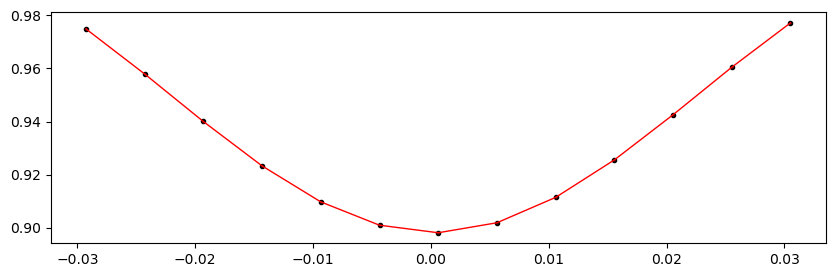

2455946.3960212 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.76it/s]


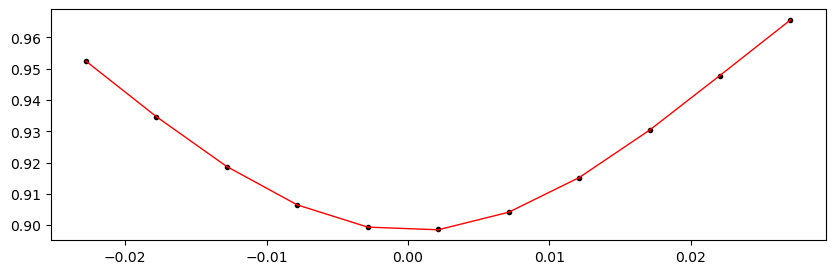

2455958.6986335996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 399.91it/s]


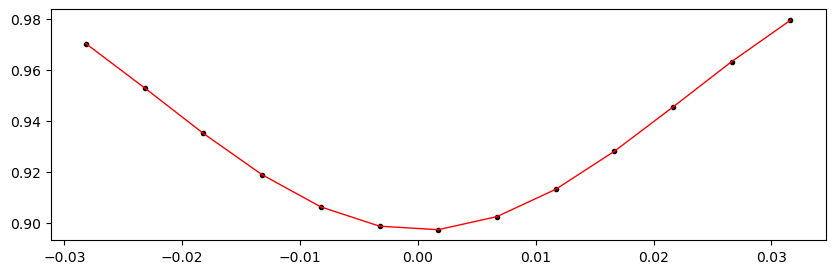

2455962.7995043998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.49it/s]


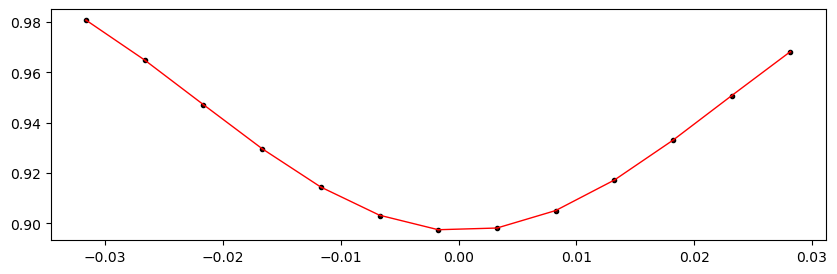

2455966.9003751995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 405.10it/s]


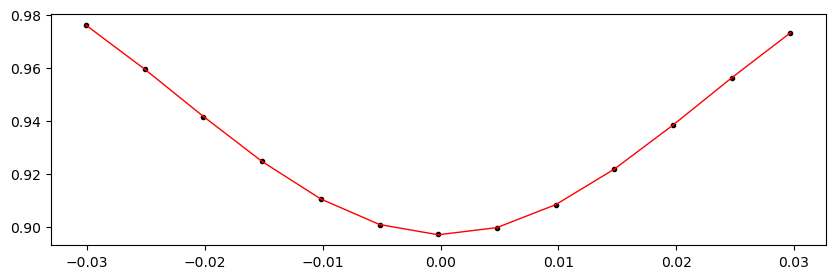

2455971.0012459997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.06it/s]


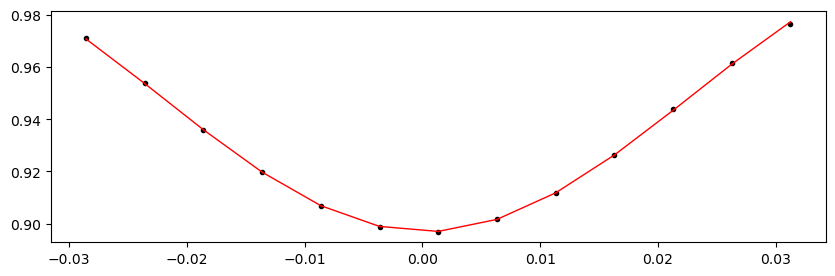

2455975.1021168 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 403.99it/s]


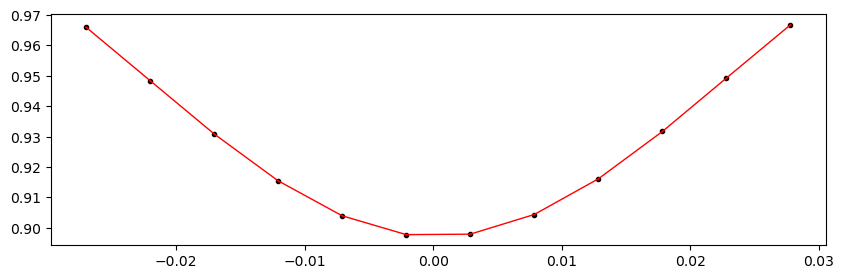

2455979.2029875997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.95it/s]


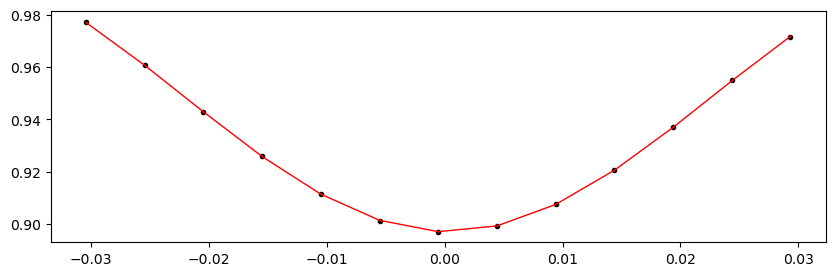

2455983.3038584 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.34it/s]


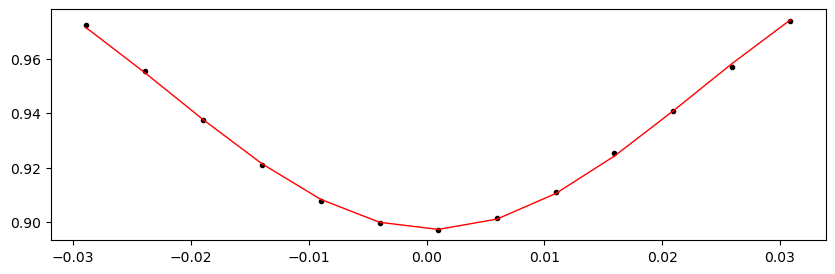

2455991.5056 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.42it/s]


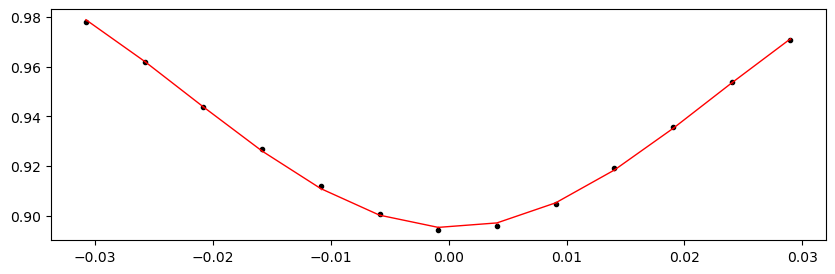

2455999.7073415997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 401.50it/s]


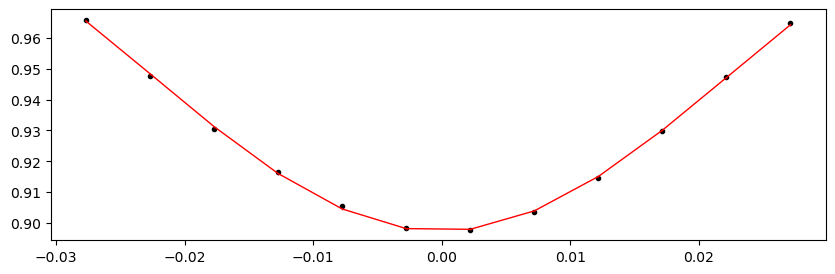

2456003.8082124 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.57it/s]


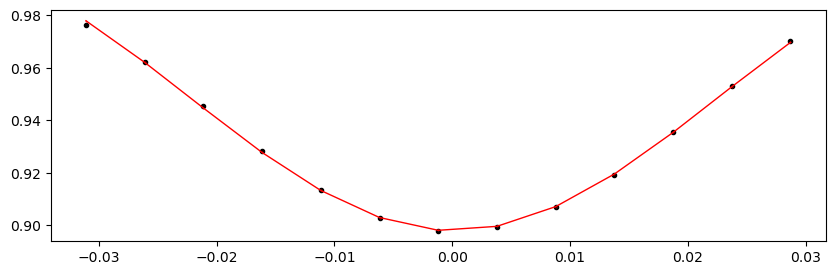

2456007.9090831997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.72it/s]


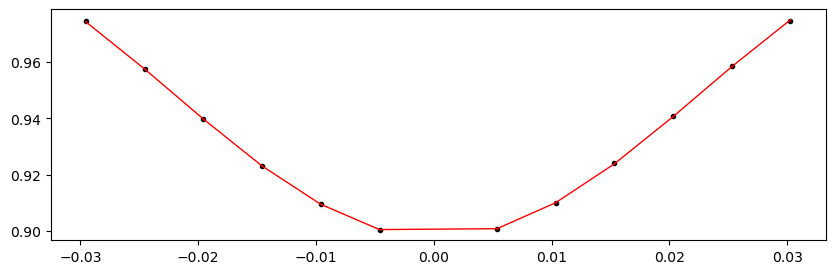

2456012.009954 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.05it/s]


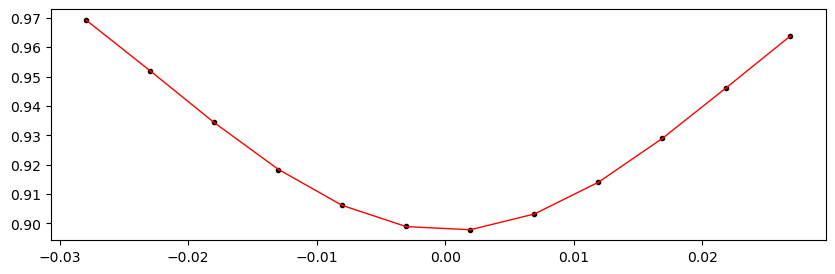

2456016.1108247996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.88it/s]


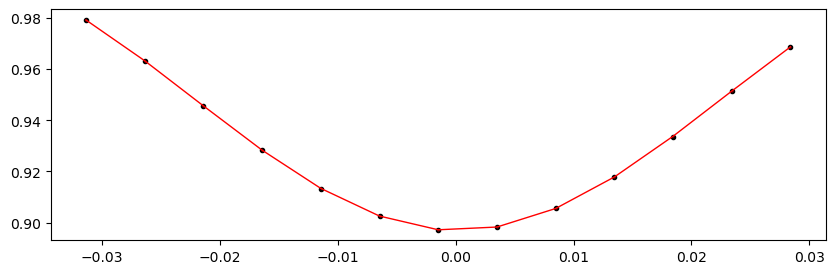

2456020.2116956 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.01it/s]


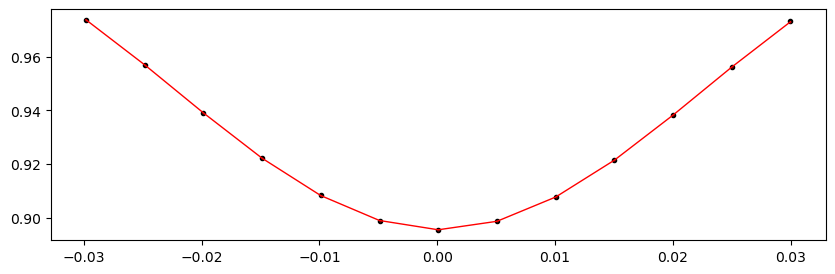

2456024.3125663996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.16it/s]


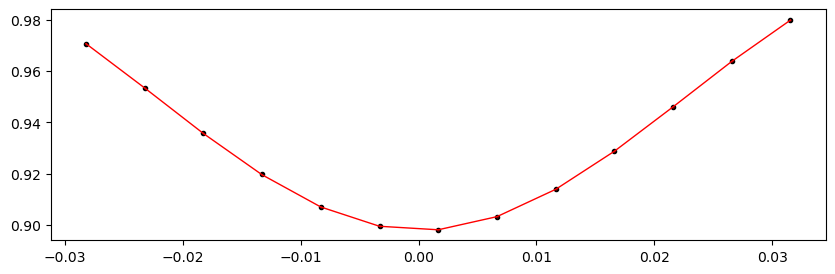

2456028.4134372 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.58it/s]


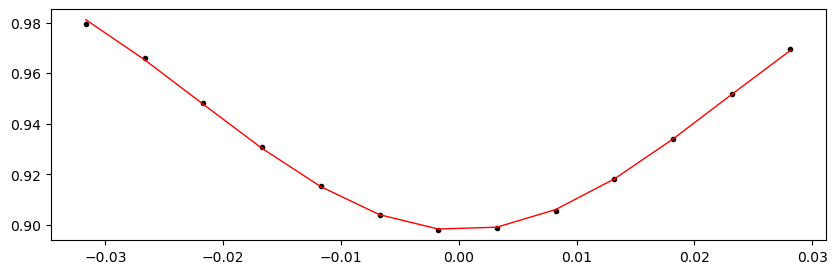

2456032.5143079995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 394.69it/s]


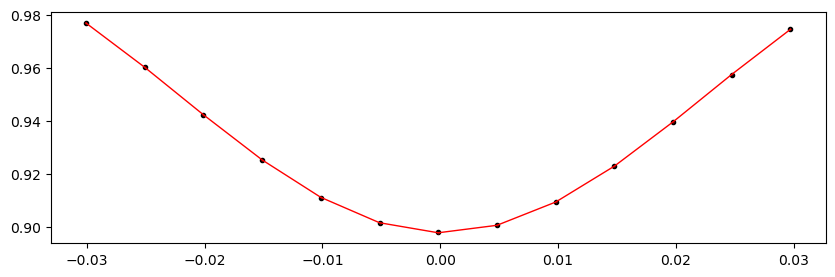

2456036.6151787997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.08it/s]


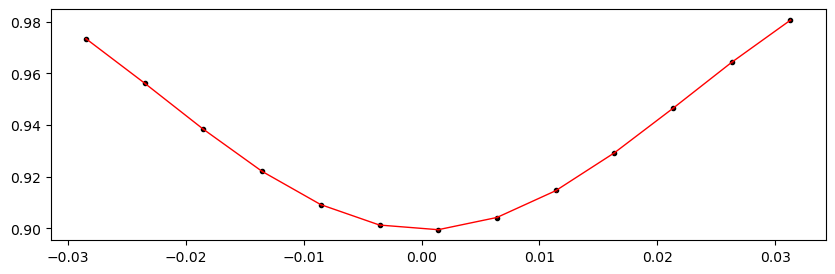

2456040.7160496 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.19it/s]


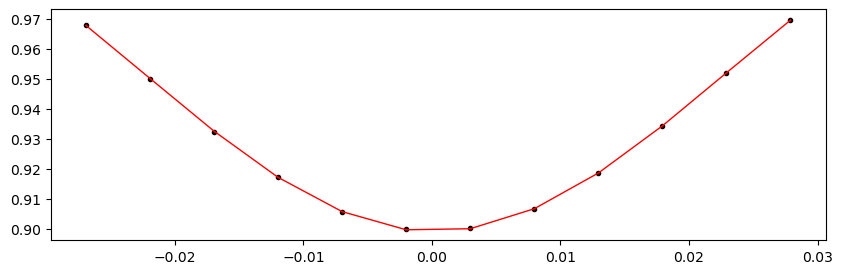

2456044.8169203997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.37it/s]


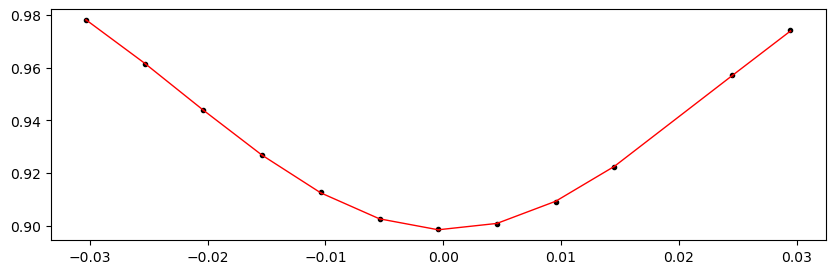

2456048.9177912 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.15it/s]


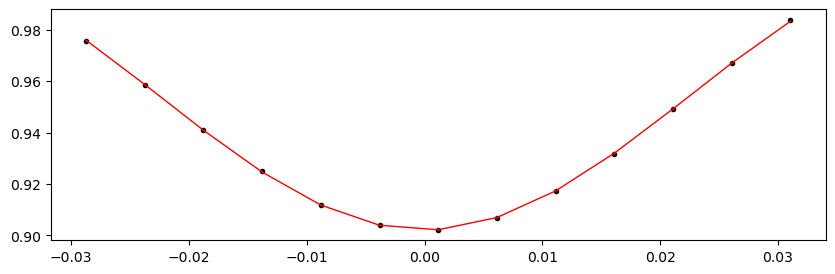

2456053.0186619996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.62it/s]


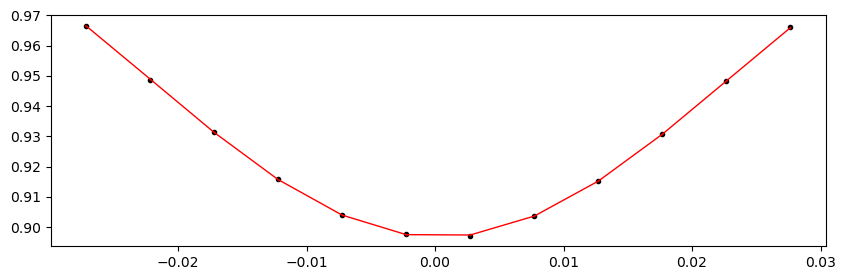

2456057.1195328 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 396.29it/s]


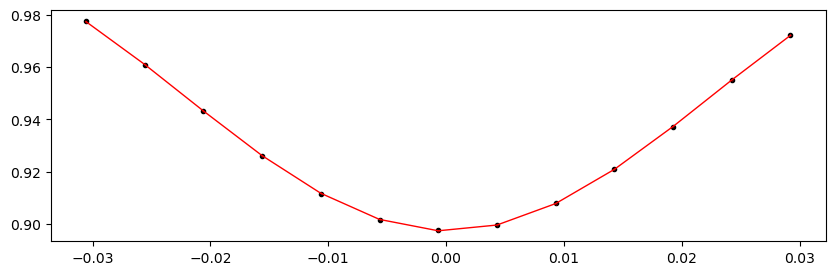

2456061.2204035996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.67it/s]


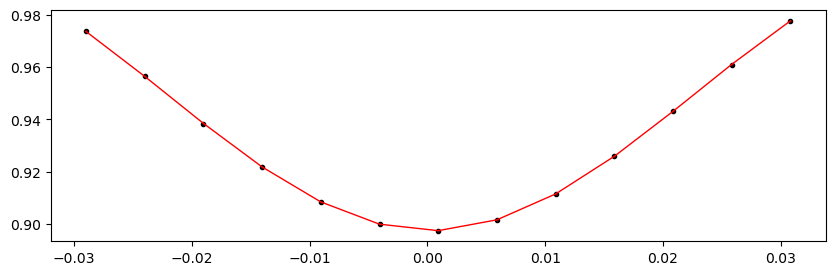

2456065.3212743998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 397.75it/s]


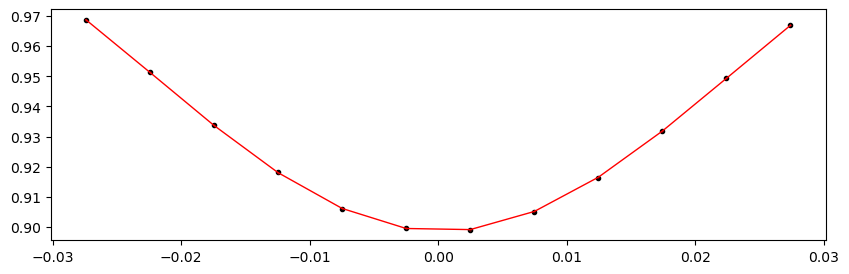

2456069.4221452 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.76it/s]


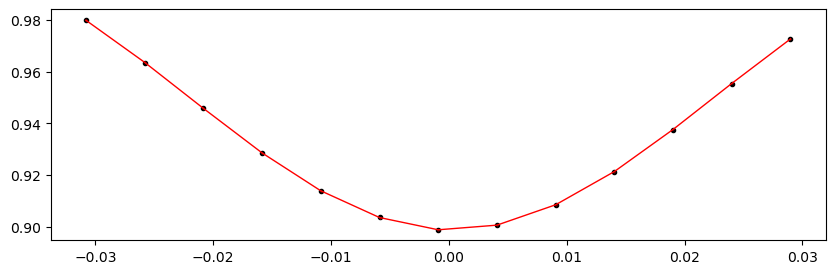

2456073.5230159997 1.0104790602938793 -0.11261474738251852 0


100%|██████████████████████████████████████████████████████| 10000/10000 [8:45:24<00:00,  3.15s/it]


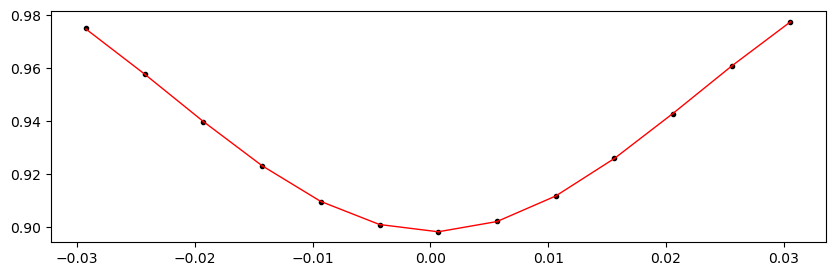

2456077.6238868 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 312.66it/s]


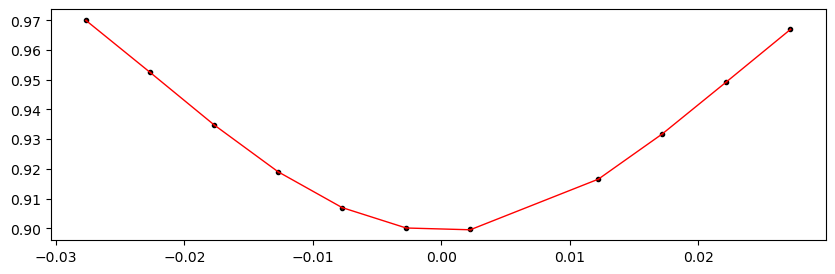

2456081.7247575996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:29<00:00, 336.49it/s]


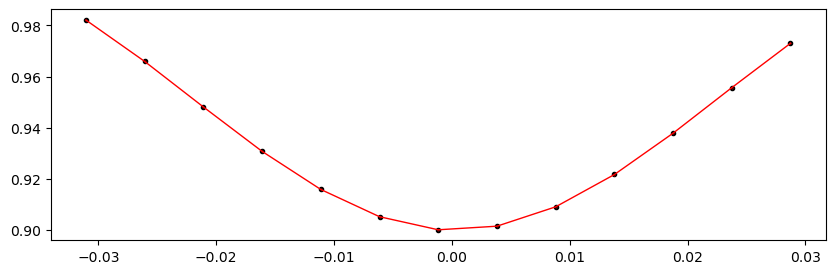

2456085.8256284 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.83it/s]


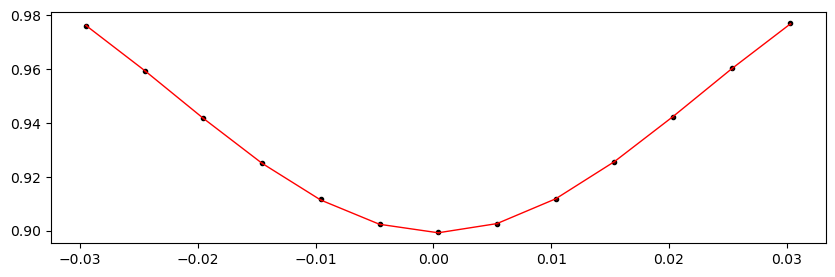

2456089.9264991996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 372.20it/s]


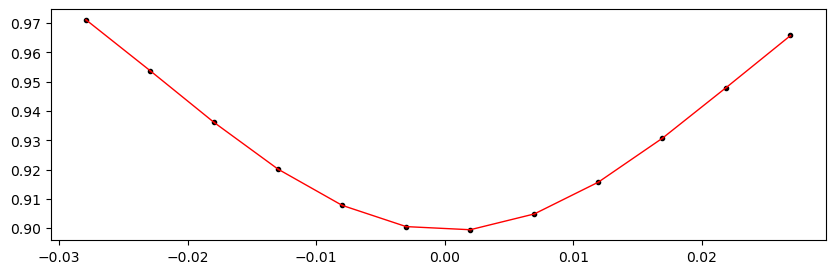

2456094.02737 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.93it/s]


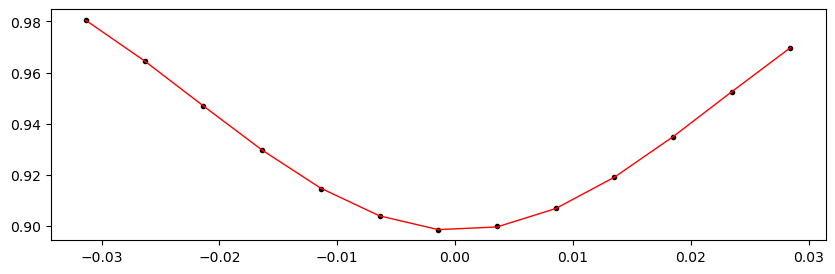

2456098.1282407995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 289.64it/s]


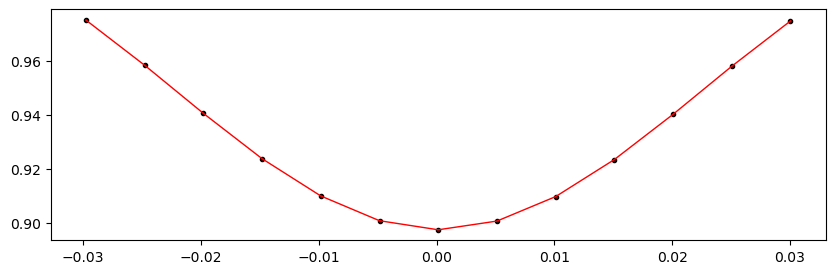

Time 2456102.2291115997 does not have enough data points: 7
2456110.4308531997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.31it/s]


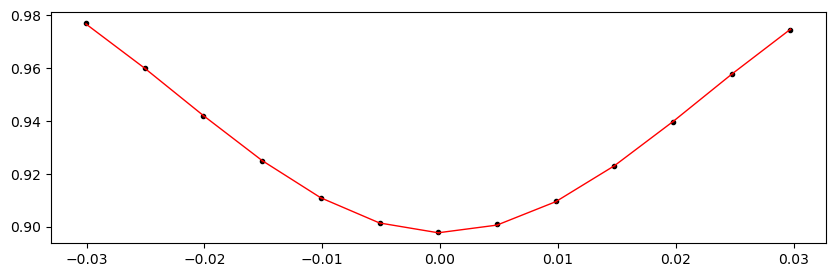

2456114.531724 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 391.25it/s]


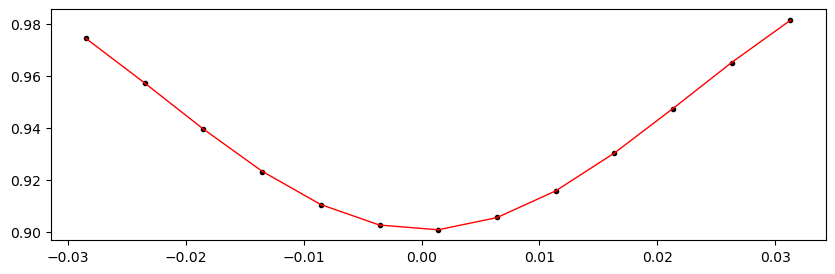

2456118.6325947996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.36it/s]


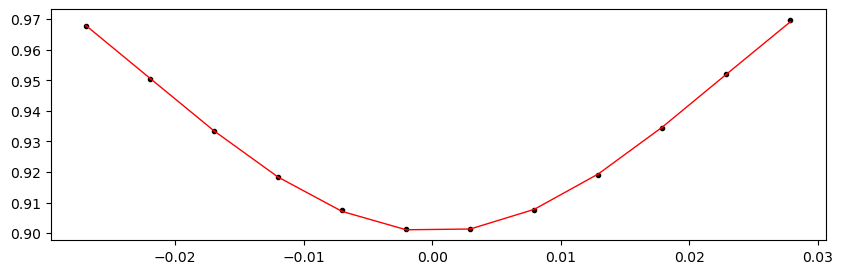

2456130.9352072 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.48it/s]


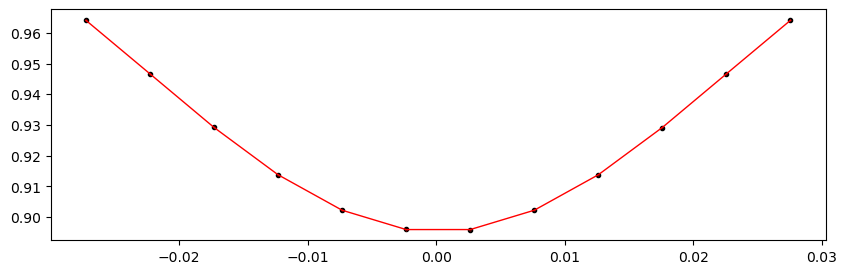

2456135.0360779995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.20it/s]


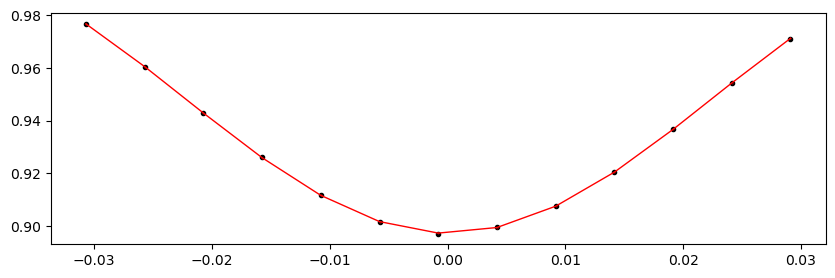

Time 2456139.1369487997 does not have enough data points: 5
2456143.2378196 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 346.04it/s]


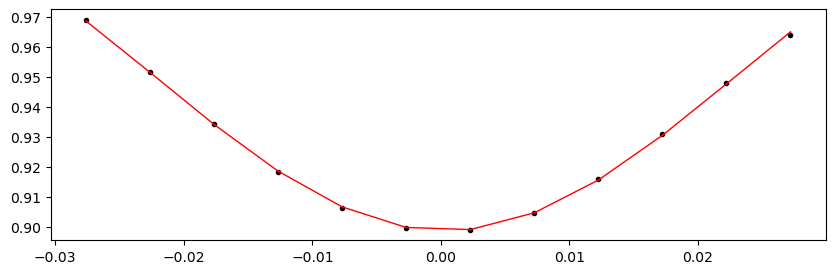

2456147.3386903997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 351.51it/s]


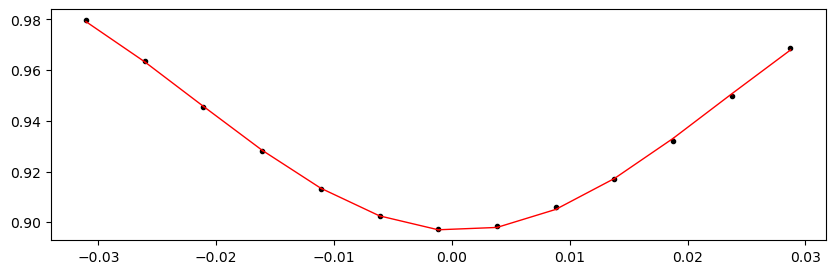

2456151.4395612 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.21it/s]


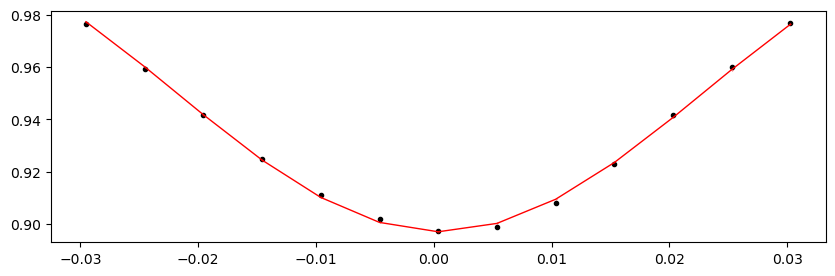

2456155.5404319996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.59it/s]


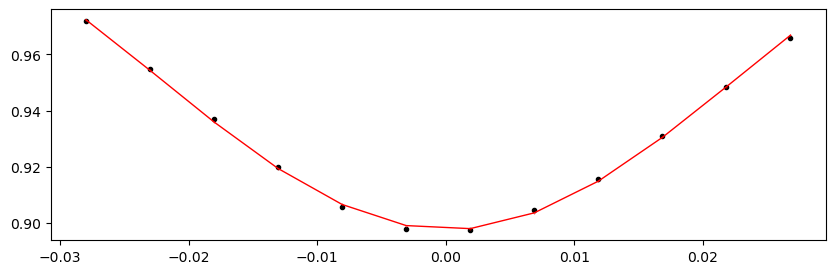

2456159.6413028 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.18it/s]


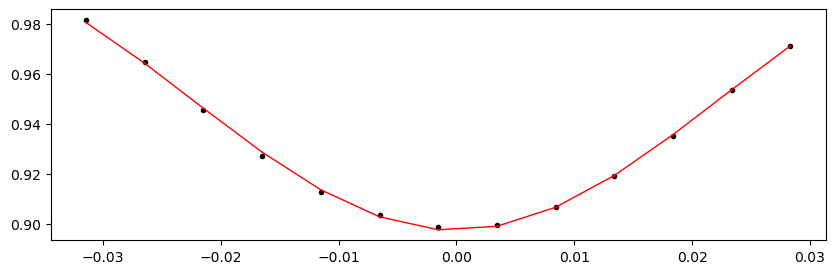

2456163.7421735995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.37it/s]


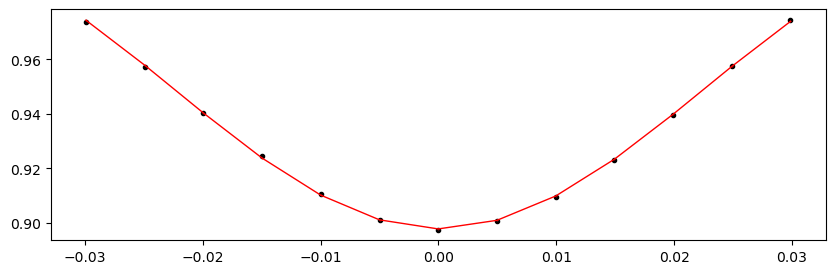

2456167.8430443997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.04it/s]


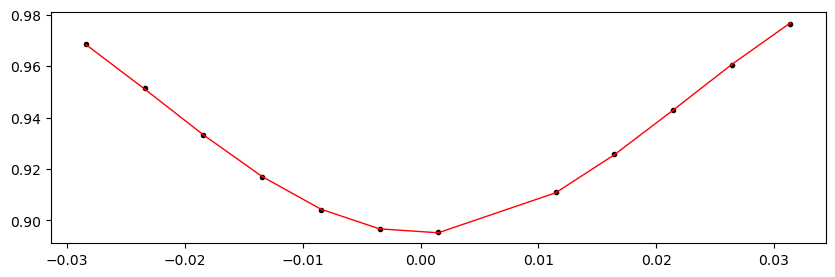

2456171.9439152 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 390.13it/s]


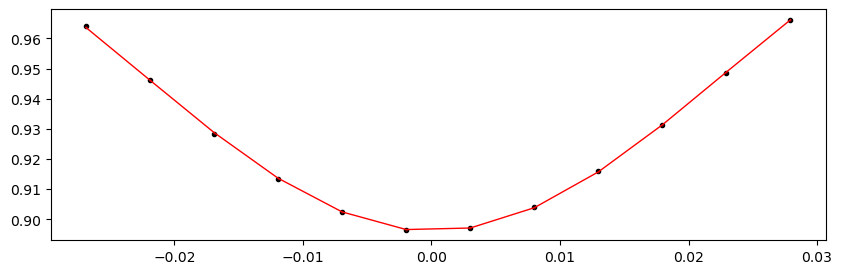

2456176.0447859997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.08it/s]


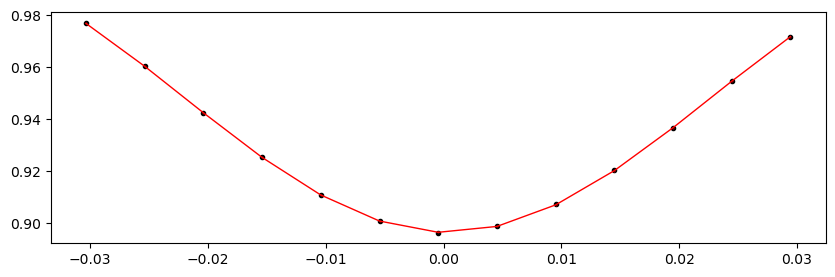

2456180.1456568 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.42it/s]


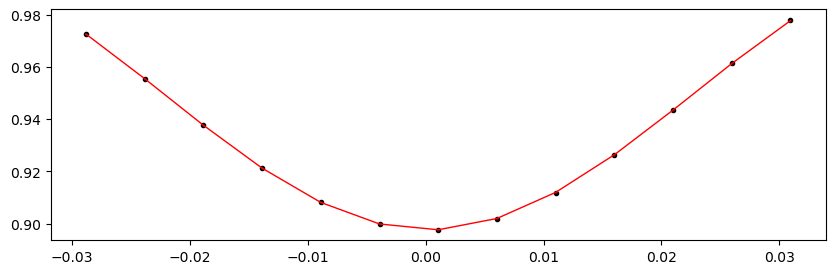

2456184.2465275996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.96it/s]


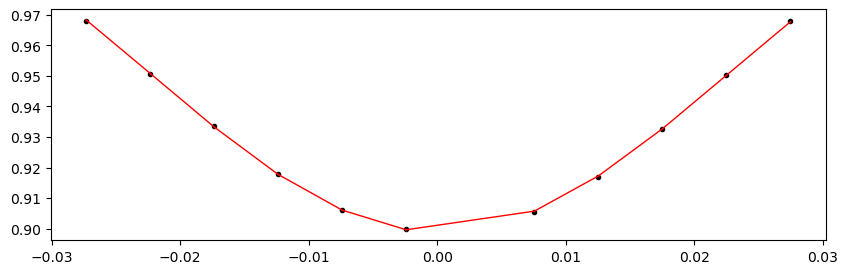

2456188.3473984 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.60it/s]


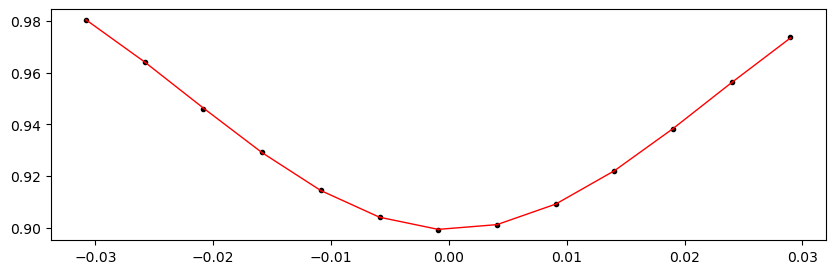

2456192.4482691996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 359.16it/s]


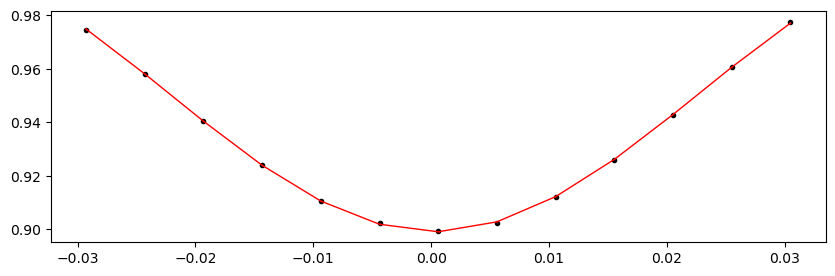

2456196.54914 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 388.05it/s]


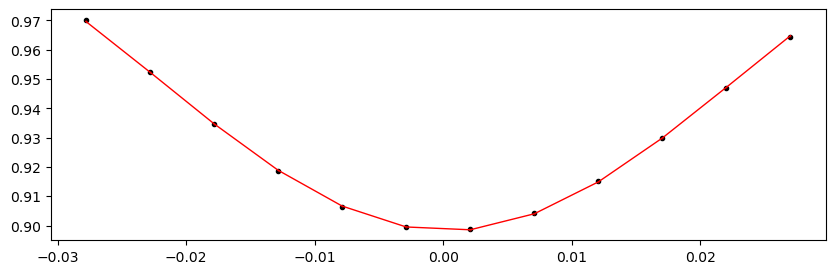

2456200.6500107995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.40it/s]


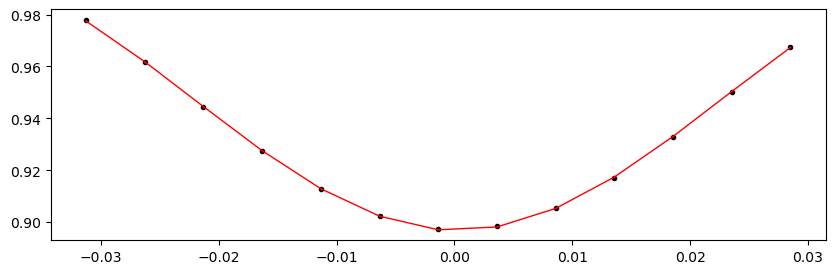

2456208.8517524 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.97it/s]


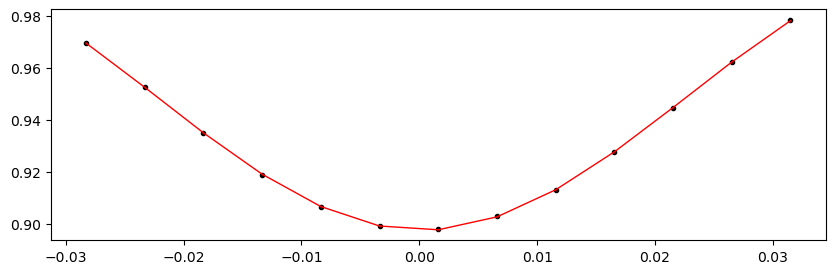

2456212.9526231997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.12it/s]


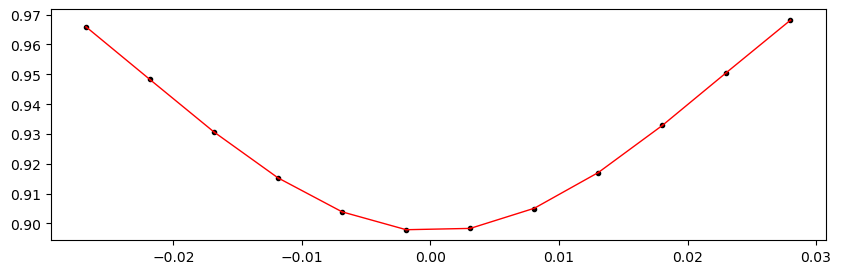

2456217.053494 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 387.92it/s]


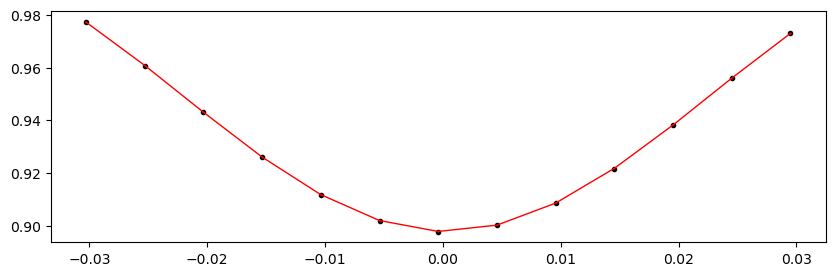

2456221.1543647996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.07it/s]


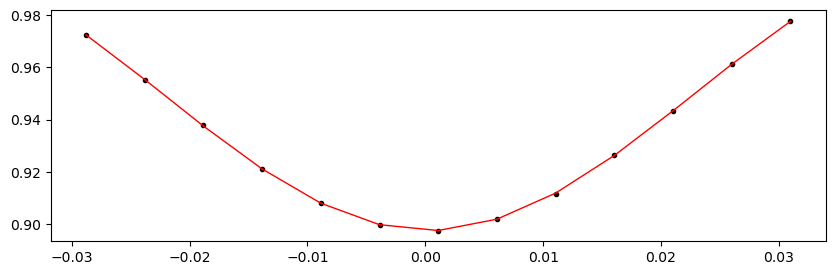

2456225.2552356 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 384.19it/s]


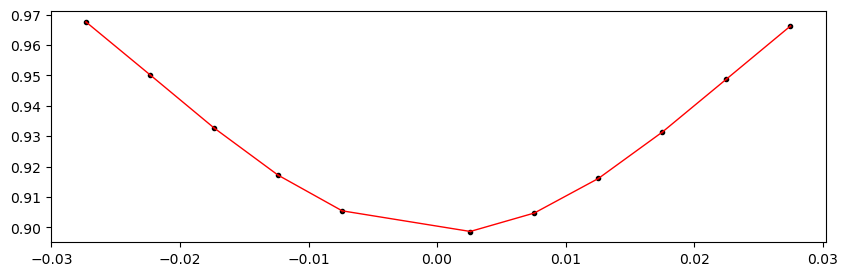

2456229.3561063996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.50it/s]


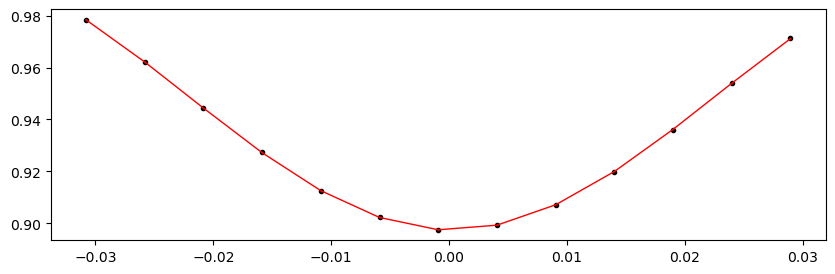

2456233.4569771998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 368.55it/s]


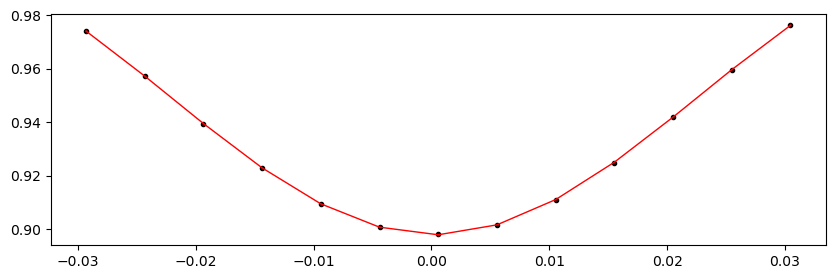

2456241.6587187997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.37it/s]


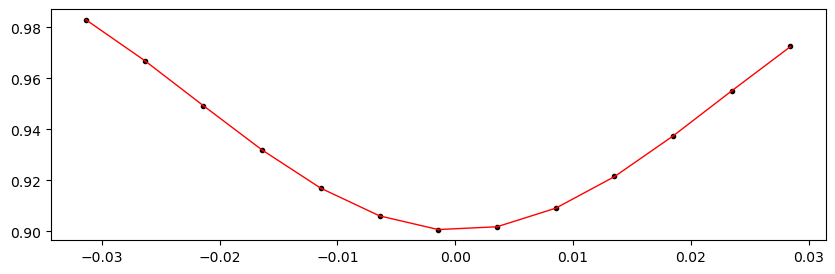

Time 2456245.7595896 does not have enough data points: 8
2456253.9613312 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 364.73it/s]


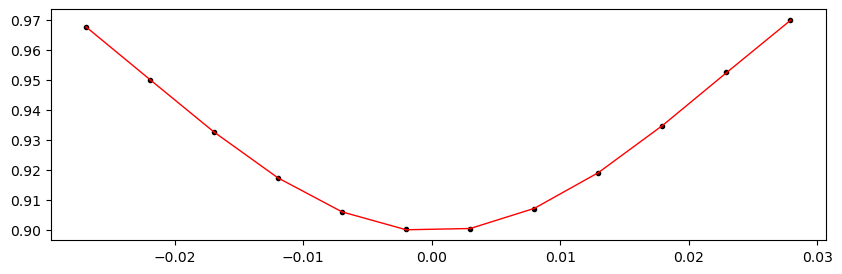

2456258.0622019996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.50it/s]


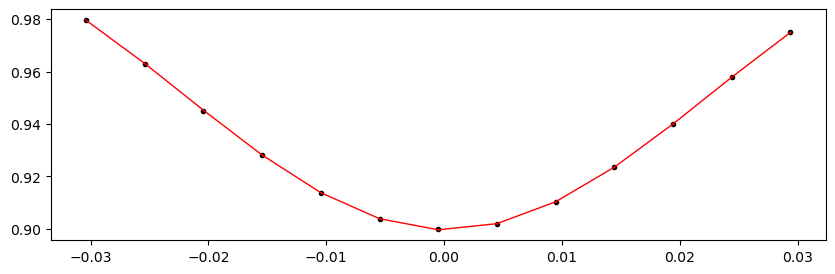

2456262.1630728 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.95it/s]


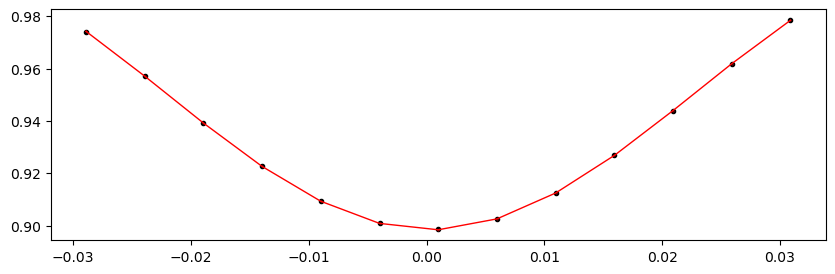

2456266.2639435995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.65it/s]


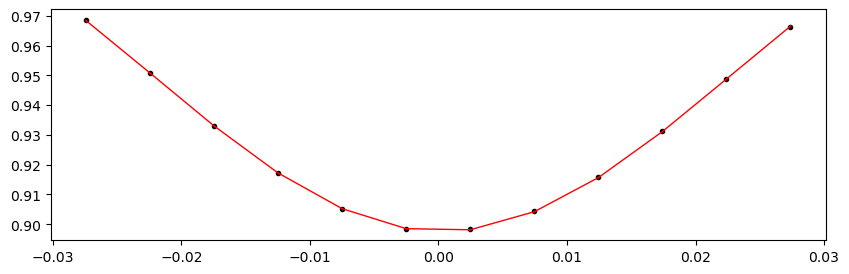

2456270.3648143997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 374.34it/s]


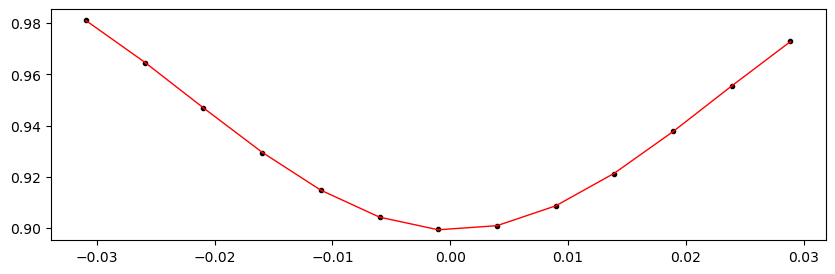

2456274.4656852 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:34<00:00, 292.43it/s]


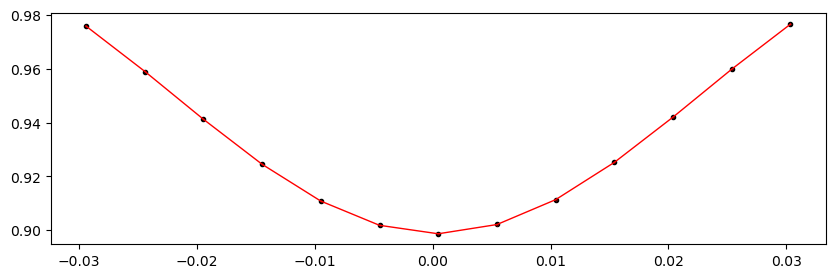

2456278.5665559997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:31<00:00, 317.40it/s]


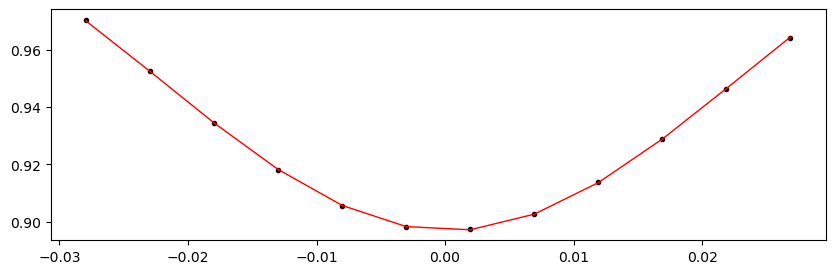

2456282.6674268 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:30<00:00, 330.90it/s]


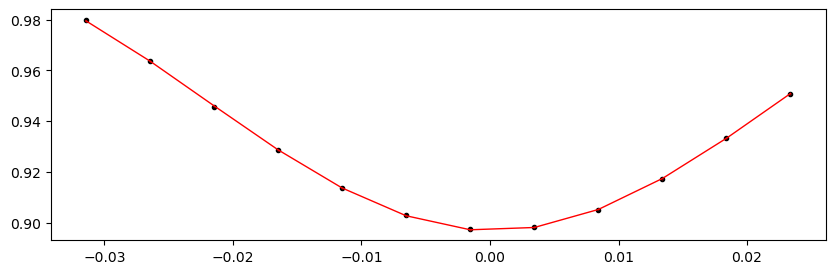

2456286.7682975996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.71it/s]


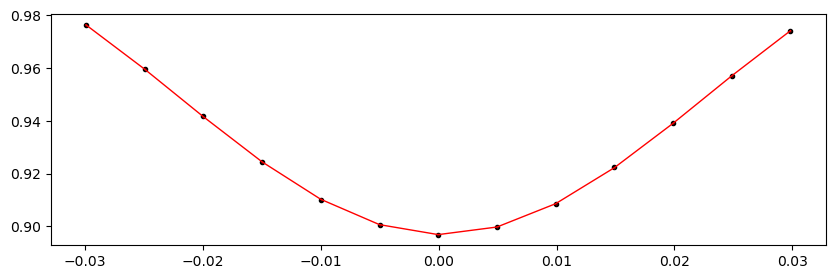

2456290.8691684 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 371.71it/s]


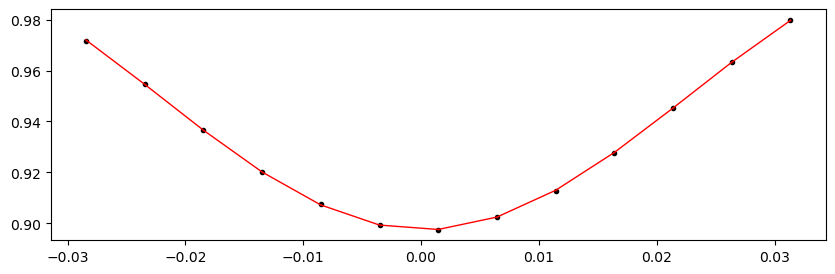

2456294.9700391996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.94it/s]


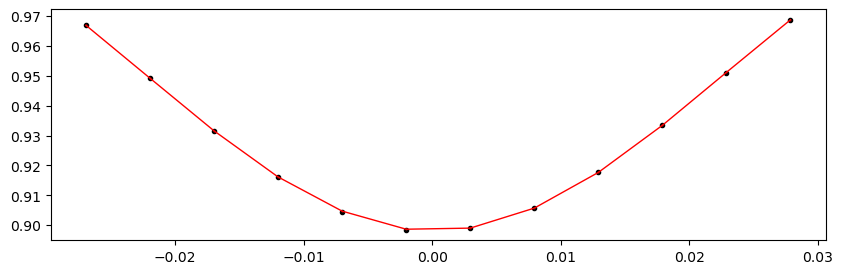

2456299.07091 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:28<00:00, 354.85it/s]


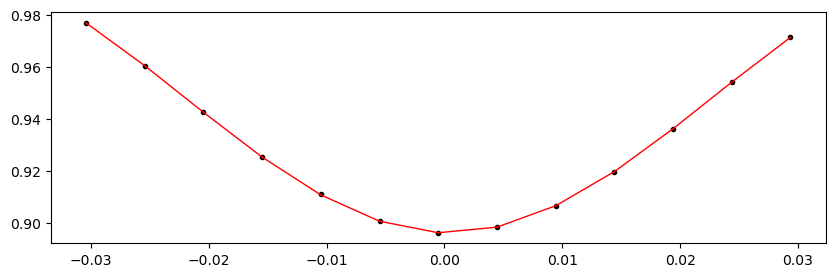

2456303.1717807995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 378.54it/s]


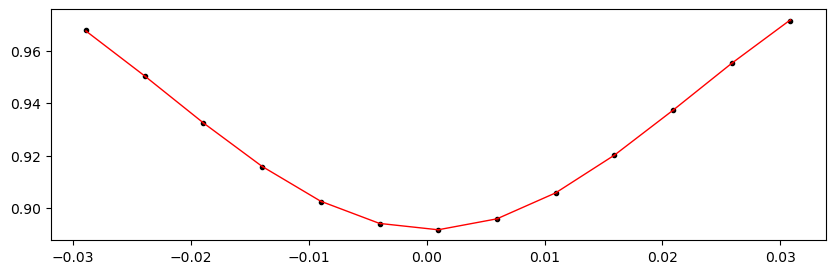

2456307.2726515997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.75it/s]


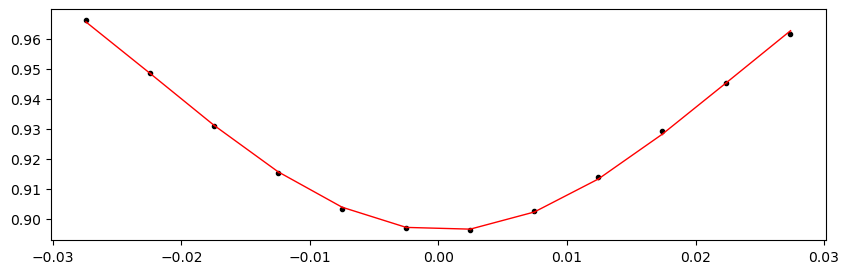

2456323.6761347996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.53it/s]


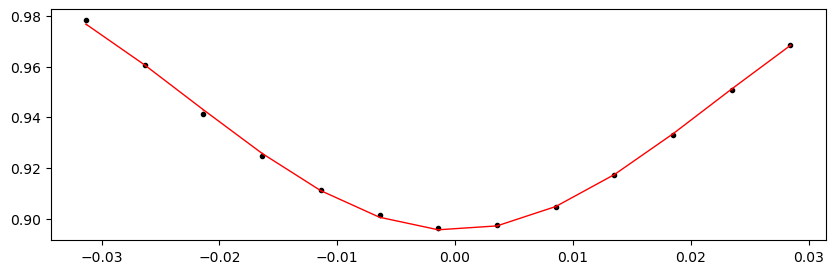

2456327.7770056 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 376.20it/s]


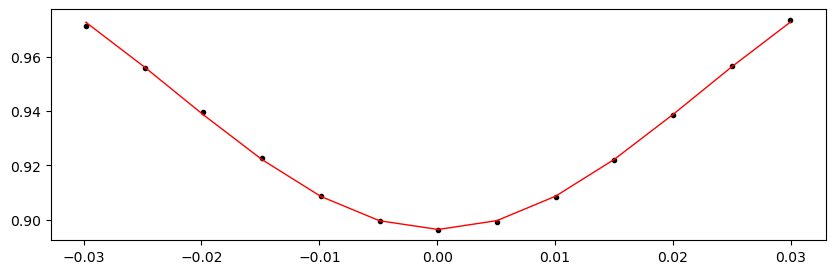

2456331.8778763996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.75it/s]


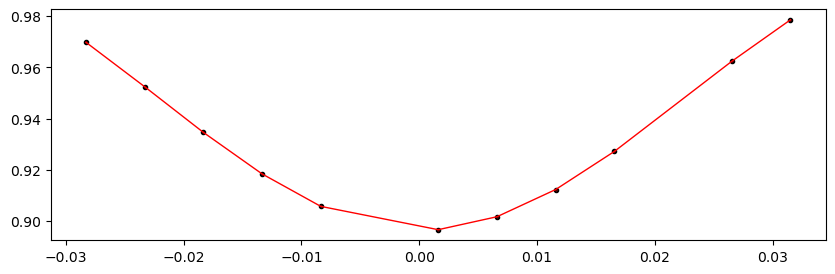

2456335.9787471998 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.43it/s]


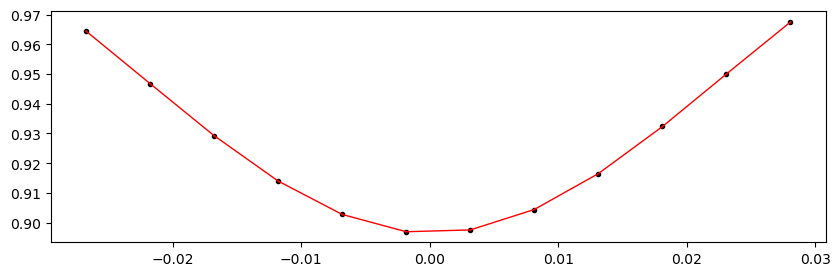

2456340.079618 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 386.08it/s]


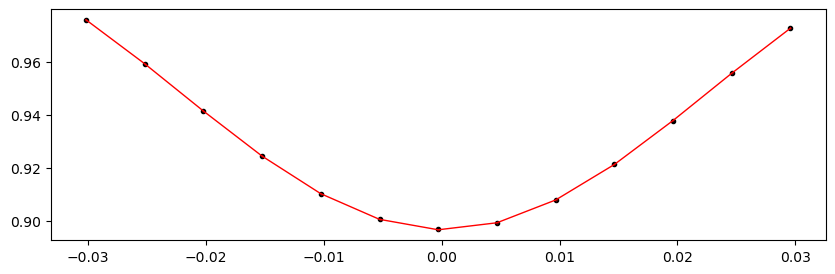

2456344.1804887997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.24it/s]


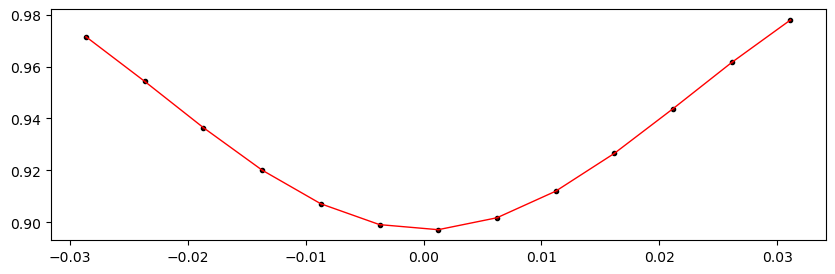

2456348.2813596 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 373.80it/s]


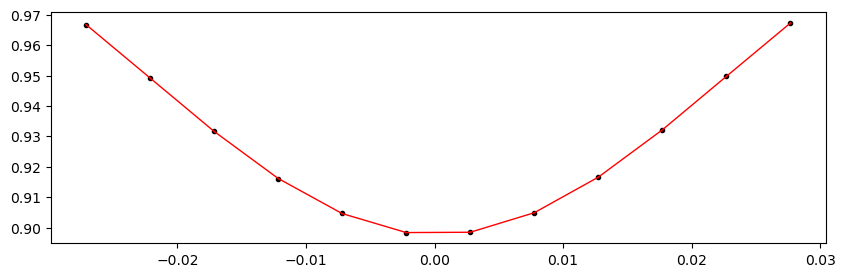

2456352.3822303996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.02it/s]


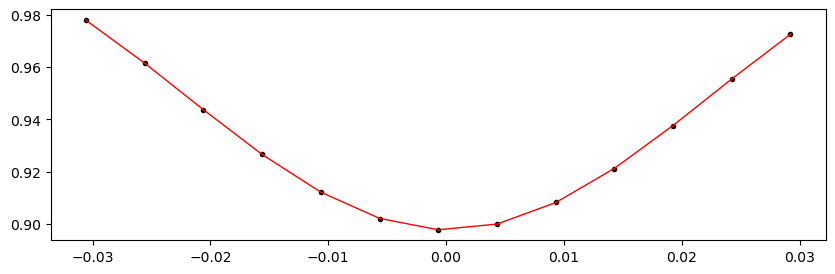

2456356.4831012 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.49it/s]


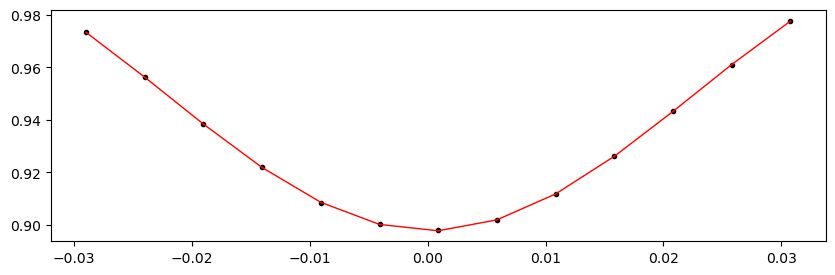

2456360.5839719996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 380.87it/s]


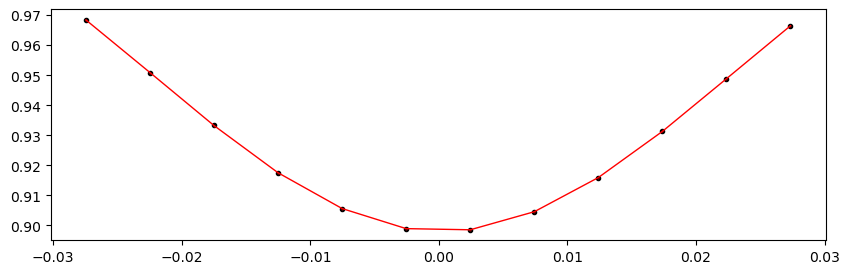

2456364.6848428 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 381.64it/s]


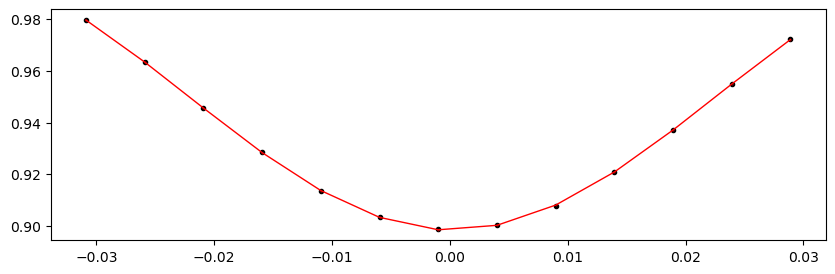

2456368.7857135995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.82it/s]


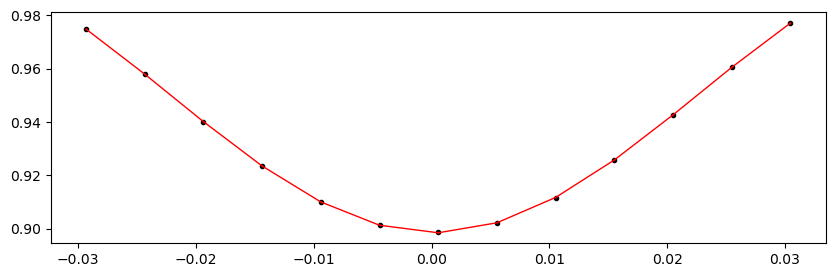

2456372.8865843997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 385.08it/s]


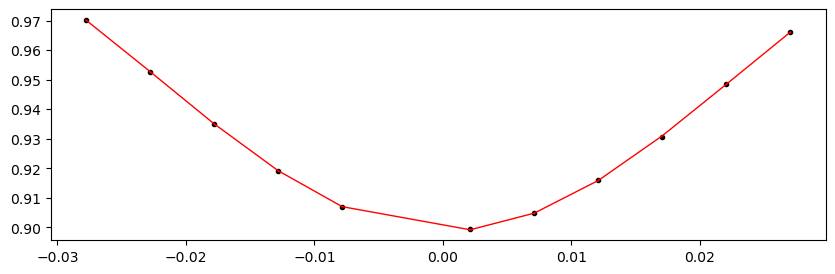

2456376.9874552 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 375.27it/s]


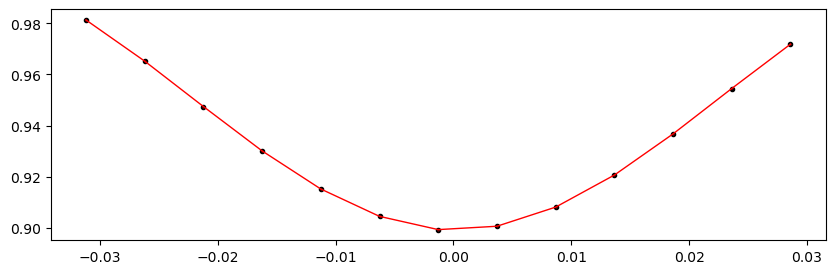

2456381.0883259997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.24it/s]


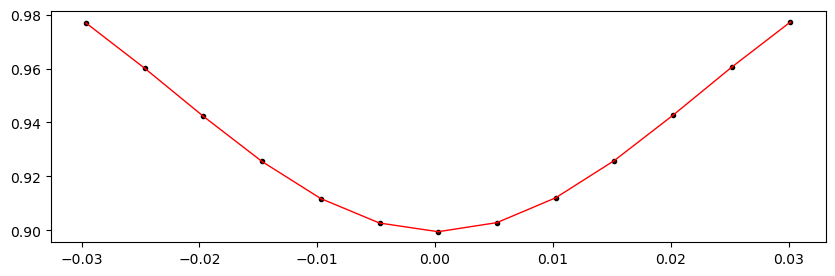

2456385.1891968 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 377.48it/s]


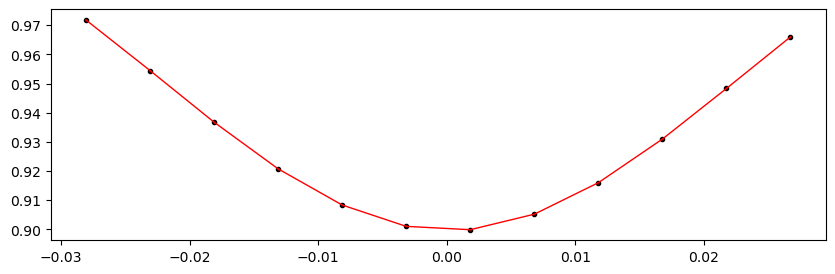

2456389.2900675996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 383.24it/s]


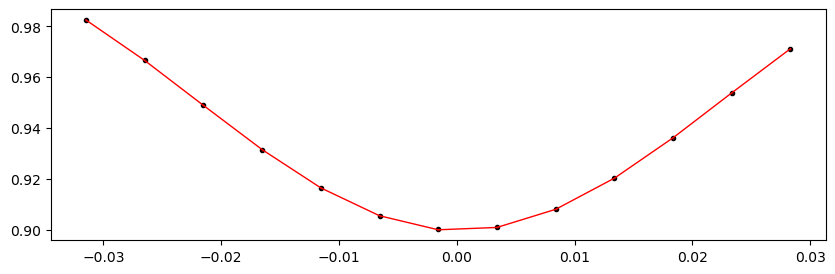

2456393.3909384 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 362.94it/s]


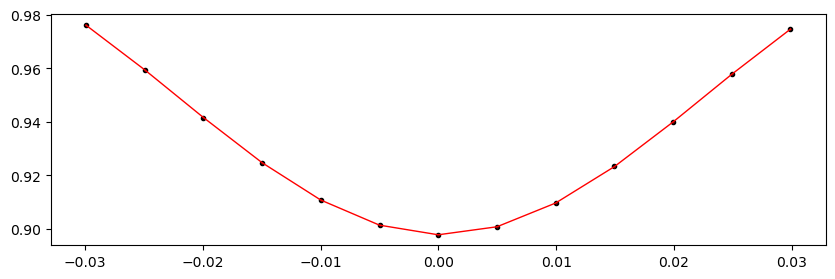

2456397.4918091996 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 369.09it/s]


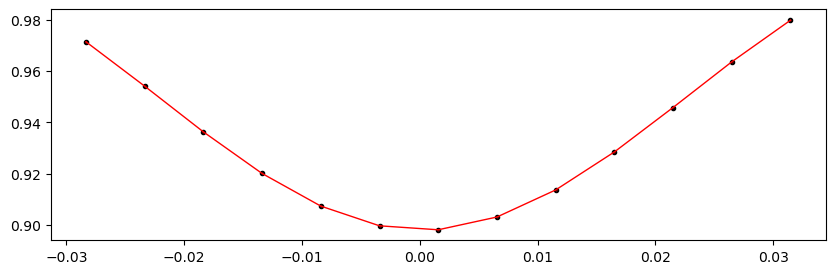

2456401.59268 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:27<00:00, 366.49it/s]


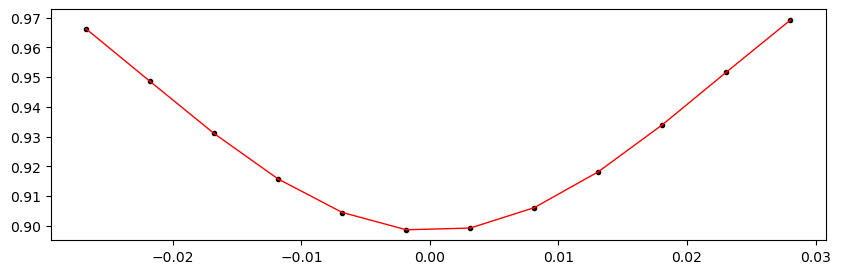

2456405.6935507995 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 384.75it/s]


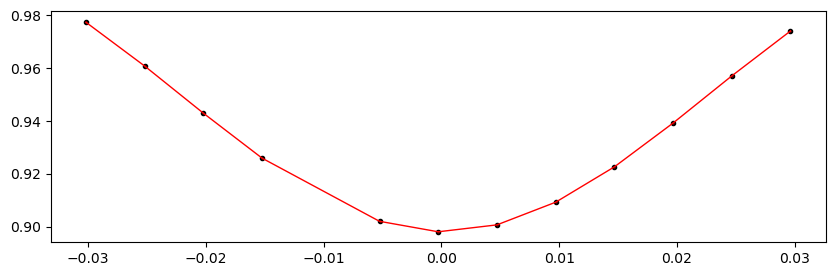

2456409.7944215997 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 379.41it/s]


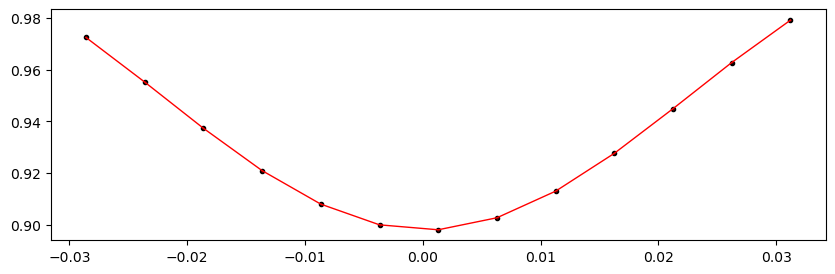

2456413.8952924 1.0104790602938793 -0.11261474738251852 0


100%|███████████████████████████████████████████████████████| 10000/10000 [00:26<00:00, 382.88it/s]


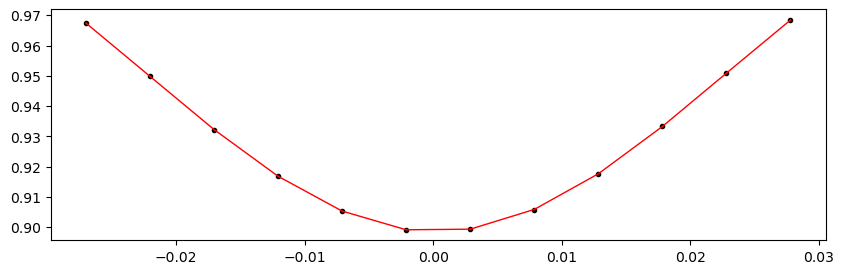

In [47]:
# ---

%matplotlib inline

if t0_secondary is not None:
    print("Fitting individual secondary eclipses...")
    etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s,
                                   min_number_data=10, # to fit 30 min cadence data
                                  )
    !$NOTIFY_CMD "Individual secondary eclipses fit done"
else:
    print("No secondary eclipses defined. No-Op.")

## ETV O-C plot

In [ ]:
in_df_primary['midpoint

In [87]:
def get_time_span_isodate(df):
    start, end = df.iloc[0]['midpoint'], df.iloc[-1]['midpoint']
    start = Time(start, format="jd").to_value("iso", subfmt="date")
    end = Time (end,format="jd").to_value("iso", subfmt="date")
    return f"{start} - {end}"

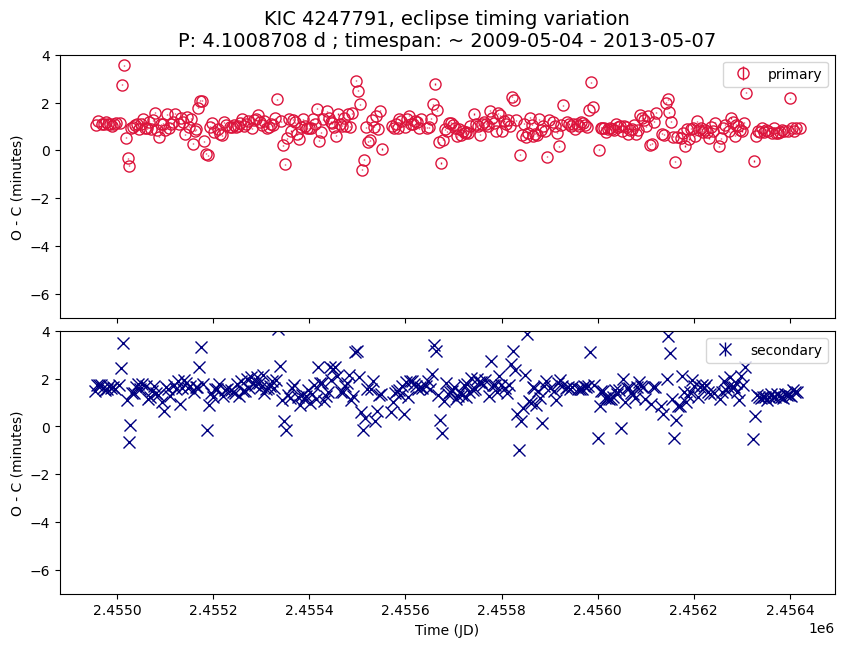

In [89]:
%matplotlib inline
# %matplotlib widget


title_suffix = "eclipse timing variation"

#plot the extracted transit times to check for ETVs

num_rows = 2 if t0_secondary is not None else 1
figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5
# num_rows = 1  # force to plot primary only
# figsize_y = 3.3

fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
    axs = [axs]

in_df_primary = pd.read_csv(outfile_path)
in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60
in_df_primary_all = in_df_primary  # in case filtering is helpful

# in_df_primary = in_df_primary[(0 < in_df_primary.shift_mins) & (in_df_primary.shift_mins < 2)]  # filter out outliers from visual inspection
# print(f"Note: {len(in_df_primary_all) - len(in_df_primary)} data points in df_primary filtered out as outliers.")

# axs[0].plot(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              lw = 1, color = 'crimson', )
# axs[0].scatter(in_df_primary['epoch'], in_df_primary['shift_mins'],
#              marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

# if False:
if t0_secondary is not None:
    in_df_secondary = pd.read_csv(outfile_path_s)
    in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
    in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
    in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60
    in_df_secondary_all = in_df_secondary  # in case filtering is helpful

    # in_df_secondary = in_df_secondary[(0 < in_df_secondary.shift_mins) & (in_df_secondary.shift_mins < 2)]  # filter out outliers from visual inspection
    # print(f"Note: {len(in_df_secondary_all) - len(in_df_secondary)} data points in in_df_secondary filtered as outliers.")

    # axs[1].plot(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              lw = 1, color = 'navy', )
    # axs[1].scatter(in_df_secondary['epoch'], in_df_secondary['shift_mins'],
    #              marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
    axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                 lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );
else:
    in_df_secondary = None

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[-1].set_xlabel(f"Time ({search_result.time.format.upper()})")
axs[0].set_title(f"KIC {kicid}, {title_suffix}\nP: {period} d ; timespan: ~ {get_time_span_isodate(in_df_primary)}", fontsize=14)

plt.subplots_adjust(hspace=0.05)
[ax.set_ylim(-7, 4) for ax in axs]  # use a consistent y-scale for both Kepler and TESS (not shown) data 
plt.show()

In [ ]:
# # to help to filter out valeus with huge error
# ax = in_df_primary_all.std_mins.hist(bins=100)
# ax.set_xscale("log")
# ax.set_yscale("log")
# plt.show()

# ax = in_df_secondary_all.std_mins.hist(bins=100)
# ax.set_xscale("log")
# ax.set_yscale("log")
# plt.show()

### O-C Plot, Zoom In

In [ ]:
%matplotlib inline
# %matplotlib widget

zoom_ranges = [
    # (1600, 1800),
]

def tweak_axs_list(axs_list):
    # axs_list[0][1].set_ylim(-20, 30);
    # axs_list[1][0].set_ylim(None, 0.5);
    # axs_list[1][1].set_ylim(-5.5, 2);

    # ax = axs_list[0][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")
    # ax = axs_list[1][0]
    # ax.set_title(f"{ax.get_title()} (2min cadence)")

    pass


def plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges):
    axs_list = []
    for zoom_start, zoom_end in zoom_ranges:
        num_rows = 2 if t0_secondary is not None else 1
        figsize_y = 3.3 if num_rows == 1 else num_rows * 3.5

        fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y), sharex=True)
        if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
            axs = [axs]

        df_zoom = in_df_primary[(in_df_primary['epoch'] > zoom_start) & (in_df_primary['epoch'] < zoom_end)]

        # axs[0].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
        #                marker = 'o', s=8**2, color = 'None', edgecolor = 'crimson', label="primary")
        axs[0].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")

        if in_df_secondary is not None:
            df_zoom = in_df_secondary[(in_df_secondary['epoch'] > zoom_start) & (in_df_secondary['epoch'] < zoom_end)]

            # axs[1].scatter(df_zoom['epoch'], df_zoom['shift_mins'],
            #                marker = 'x',  s=9**2, color = 'navy', zorder = -2, label="secondary" );
            axs[1].errorbar(df_zoom['epoch'], df_zoom['shift_mins'], yerr = df_zoom['std_mins'],
                            lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

        for ax in axs:
            ax.set_ylabel("O - C (minutes)")
            ax.legend();

        axs[-1].set_xlabel("Time (BTJD)")
        axs[0].set_title(f"TIC {ticid}, {title_suffix}", fontsize=14)

        plt.subplots_adjust(hspace=0.05)
        axs_list.append(axs)
    return axs_list


axs_list = plot_oc_in_zoom_ranges(in_df_primary, in_df_secondary, zoom_ranges)
tweak_axs_list(axs_list);

## make a periodogram 

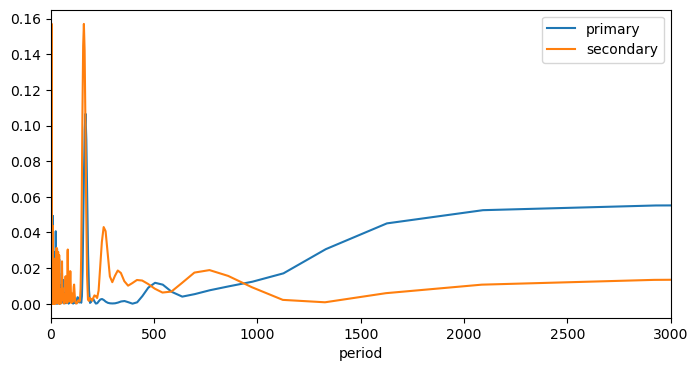

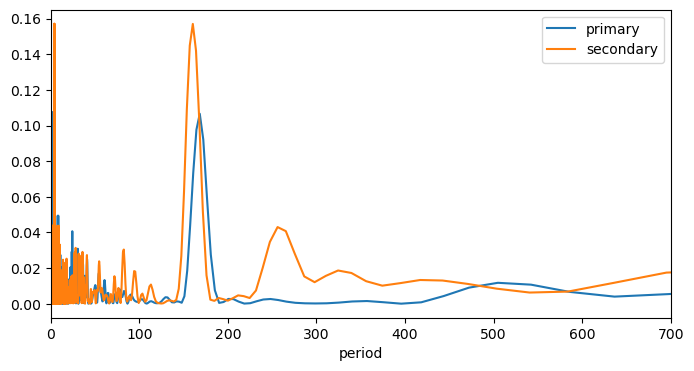

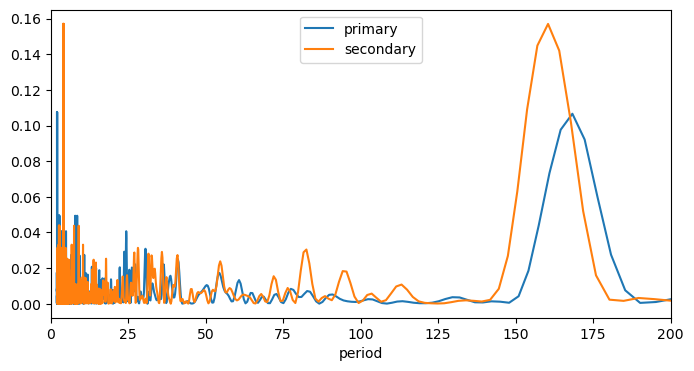

In [54]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()

fig, ax = plt.subplots(figsize=(8, 4))

plt.plot(1/frequency, power, label = 'primary')

if t0_secondary is not None:
    frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()
    plt.plot(1/frequency_s, power_s, label = 'secondary')

plt.xlabel("period")

plt.legend()
plt.xlim(0, 3000)
plt.show()


if True:
    fig, ax = plt.subplots(figsize=(8, 4))

    plt.plot(1/frequency, power, label = 'primary')

    if t0_secondary is not None:
        plt.plot(1/frequency_s, power_s, label = 'secondary')

    plt.xlabel("period")

    plt.legend()
    plt.xlim(0, 700)
    plt.show()


if True:
    fig, ax = plt.subplots(figsize=(8, 4))

    plt.plot(1/frequency, power, label = 'primary')

    if t0_secondary is not None:
        plt.plot(1/frequency_s, power_s, label = 'secondary')

    plt.xlabel("period")

    plt.legend()
    plt.xlim(0, 200)
    plt.show()

## O-C plot, folded

- for periodic trend in O-C

In [57]:
def truncate_freq_power_to_period_range(freq, power, period_min, period_max):
    f, p = freq, power
    if period_min is not None:
        f, p = f[f < 1 / period_min], p[f < 1 / period_min]
    if period_max is not None:
        f, p = f[f > 1 / period_max], p[f >  1 / period_max]
    return f, p


def plot_oc_folded(period_min=None, period_max=None, period_min_s=None, period_max_s=None, period=None, period_s=None):

    if period is None:
        _f, _p = truncate_freq_power_to_period_range(frequency, power, period_min, period_max)
        period = 1 / _f[np.argmax(_p)]
    phase_oc = etv_functions.phase_data(in_df_primary.epoch, 0, period)

    fig, axs = plt.subplots(num_rows, 1, figsize=(10, figsize_y * 1.1), sharex=False)
    if isinstance(axs, plt.Axes):  # handle edge case that num_rows == 1, returned axs is not a list
        axs = [axs]
    
    axs[0].scatter(phase_oc, in_df_primary.shift_mins, marker = 'o', s=12**2, c=in_df_primary.epoch);
    axs[0].errorbar(phase_oc, in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'],
                    lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'None', label="primary")
    axs[0].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period:.4f} d", fontsize=14)

    if in_df_secondary is not None:
        if period_s is None:
            _f, _p = truncate_freq_power_to_period_range(frequency_s, power_s, period_min_s, period_max_s)
            period_s= 1 / _f[np.argmax(_p)]
        phase_oc_s = etv_functions.phase_data(in_df_secondary.epoch, 0, period_s)
        axs[1].scatter(phase_oc_s, in_df_secondary.shift_mins, marker = 'o',  s=12**2, c=in_df_secondary.epoch);
        axs[1].errorbar(phase_oc_s, in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'],
                        lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color='None', ecolor='navy', markeredgecolor = 'None', label="secondary" );
        axs[1].set_title(f"TIC {ticid}, {title_suffix}\nfolded with P={period_s:.4f} d", fontsize=14)

    for ax in axs:
        ax.set_ylabel("O - C (minutes)")
        ax.set_xlabel("Phase (Normalized)")
        ax.legend();
    plt.subplots_adjust(hspace=0.4)
    return axs

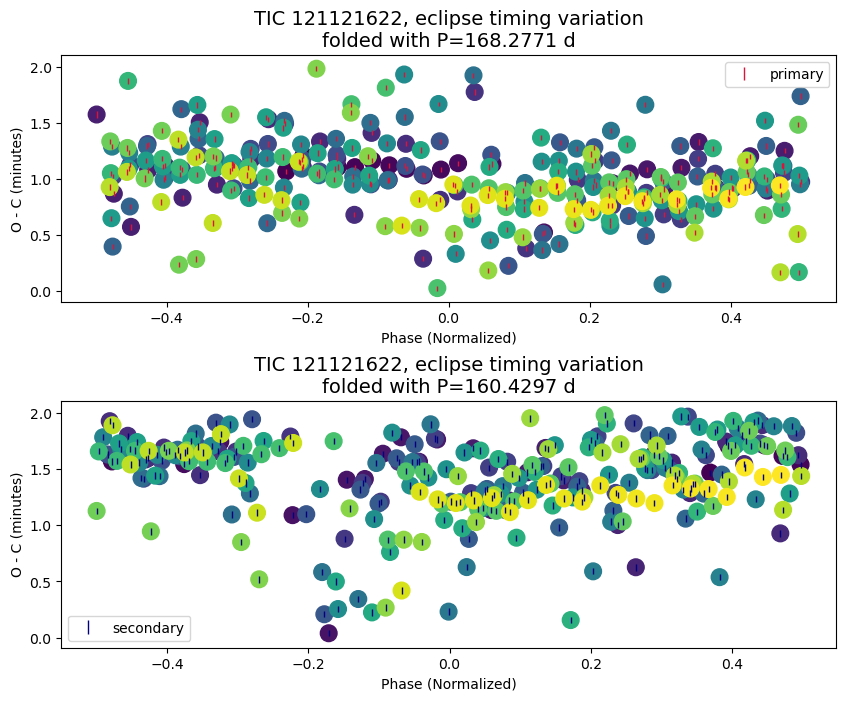

In [60]:
%matplotlib inline
# %matplotlib widget

if True:  # plot O-C periodic trend by folding with a period (from LS Periodogram by default)
    def tweak_axs(axs):
        pass

    axs = plot_oc_folded(
        period_min=20, period_max=None,
        period_min_s=20, period_max_s=None
    )
    tweak_axs(axs)

## Results Summary

In [ ]:
# FILL-IN the ETV results / comments
has_etv = "?"
comments = "O-C suggests linear change, but unsure if it's jsut inaccuracy in the period, or that there is very long-term non-linear change (not evient in TESS) - because the epoch / period used is from Kepler EB about 10 years before the TESS data. Yet the O-C at the beginning of TESs data is close to 0 (it should be a larger negative number)."

# Eclipse depth from the model
depth_pct_p = round(-mean_alpha1 * 100, 2)
if t0_secondary is not None:
    depth_pct_s = round(-mean_alpha1_s * 100, 2)
else:
    depth_pct_s = None

summary = {
    "tic": ticid,
    "has_etv": has_etv,
    "comments": comments,
    "period": period,  # the period used in ETV analysis
    "depth_pct_p": depth_pct_p,
    "depth_pct_s": depth_pct_s,
    "epoch_p": t0_primary,
    "epoch_s": t0_secondary,
    "num_sectors": len(sr),
    "time_span": round(time[-1] - time[0], 2),
    "time_start": round(time[0], 2),
    "time_end": round(time[-1], 2),
}

summary = pd.DataFrame.from_dict(summary, orient="index")
with pd.option_context('display.max_colwidth', None, 'display.max_rows', 999, 'display.max_columns', 99):
    display(summary);

# Single line to be added to a CSV
print("")
print(summary.transpose().to_csv(
    index=False,
    header=True,
))